# π0.5 occlusion circuits, protocol v3 (paper run)

This notebook runs the complete v3 study from scratch and ends with a results report and an ICLR-format paper draft.

**How to run.**
1. Pick an **A100** runtime (Runtime → Change runtime type), ideally High-RAM.
2. *(Once, in Chrome.)* Allow automatic downloads for Colab: open Settings → Privacy and security → Site settings → Additional permissions → Automatic downloads, and add `colab.research.google.com` under "Allowed". The last cell then saves every file without asking.
3. Click **Runtime → Run all**.
4. Stay for the first 10–20 minutes to approve the Google pop-ups (and paste a Hugging Face token if you are asked for one). After that it runs unattended.
5. Keep the browser tab open. The downloads go through it, and Colab may stop runtimes whose tab is closed.

**Drive folder and models.** The notebook works in one of two ways:
- **Shared folder visible.** If the Google account you pick in the Drive pop-up can see the shared folder `groot-run-shared-programmer908`, everything works as in the v2 runs. The models come from `archives/hf_home.tar` in that folder (about 7 min) and the results are saved there.
- **Shared folder not visible.** Drive answers "File not found: 13z_…" for that folder. The notebook no longer stops. It continues from a folder in your own Drive (`MyDrive/smaj_v3_workspace`) and downloads the models from Hugging Face (about 18 GB, 5–15 min). This needs a **Hugging Face token** from an account that has accepted the PaliGemma license at https://huggingface.co/google/paligemma-3b-pt-224.
  - Before Run all, add the token as a Colab secret named `HF_TOKEN` (key icon in the left bar) and allow notebook access.
  - Or paste the token when the cache cell asks. It is kept in memory only, never written to Drive or into the notebook.

**Setup cells.** The five cells after the auto-shutdown cell (Controls, Mount Drive, Install, Local workspace, Prepare caches) come from the v2 notebook that ran successfully. Controls, Install and Local workspace are unchanged. Mount Drive and Prepare caches have only the additions described above.

**What happens at the end.**
- The last cell saves everything to Drive.
- It downloads one results zip (every result, the report, the paper, this notebook with its outputs) plus the model/cache files split into parts of about 1 GB.
- It then **shuts the runtime down** so the GPU is released.
- If Run all stops early because a cell fails, a watchdog does the same after 30 idle minutes: it saves to Drive, then shuts down.
- To work interactively instead, untick `AUTO_SHUTDOWN_WHEN_DONE` in the auto-shutdown cell.

**If Colab disconnects**, reconnect and **Run all** again. Every step writes a status file and mirrors it to Drive, so finished steps are skipped (`--resume`). The closed-loop step also resumes mid-way.

**Runtime.**
- Main run (π0.5, LIBERO-Spatial): about 3–3.5 h.
- Each replication: about 1–1.5 h.
- Report and paper: about 5 min.
- The whole study is about 6 h and can span several sessions.

**What v3 fixes from v2.**

| v2 weakness | v3 change |
|---|---|
| Paint occluder keeps the object's silhouette | Rendered occluders drawn inside MuJoCo's renderer: an opaque **box** over the target (both cameras) and a **screen** blocking the third-person camera. Each has a matched *miss* control (the same occluder placed elsewhere, checked by segmentation) and a *distractor* control. Paint is kept for continuity. |
| Transcoders: test-frame FVU 0.40 | Demonstrations for all 10 tasks (downloaded from HF), about 2,000 training samples in every condition, 4,096 features with k=64, 8,000 steps. FVU is also reported on held-out test frames. |
| Features chosen by selectivity, not by effect | **Gradient attribution** (attribution patching through the full flow-matching sampler) ranks every feature. It is restricted to the layers whose residual stream carries the signal. Its agreement with actual patching is measured. |
| Narrow scope | 60 discovery and 90 held-out test frames, plus a cross-task test (sets chosen on even tasks, tested on odd tasks). Replications on **π0.5 / LIBERO-Object** and **π0 / LIBERO-Spatial**. |
| n=10 closed loop, 1 task | 5 tasks × 12 paired episodes per condition. Stage A measures success under each occluder. Stage B **restores clean feature values at every inference step**: all MLP outputs, the attribution set, the selective set, and a matched random set. It also injects the attribution set into clean episodes. |
| Confounded v1/v2 comparison | Within one run, v3 measures in-sample vs held-out effects of the same sets and v1-style frame picking vs fixed phases. |

**Pre-specified tests.** These are written into the config before the run.
- **H1:** selective features replicate on held-out frames.
- **H2-A (primary):** the top-100 attribution features beat norm-matched random features by at least 10 points, with CI > 0.
- **H2-S:** the v2 rule for selective features.
- **H3:** selectivity and attribution dissociate.
- **H4:** restoring the attribution set in closed loop recovers success, beyond a random set.

**Outputs.** Every run folder (`outputs/permanence/tc_circuit_v3_*`) is mirrored to Drive after each step. The report folder `tc_circuit_v3_report/` contains:
- `RESULTS_v3.md`: every test with CIs, plus the v1 vs v2 vs v3 table.
- `results_v3.json`.
- `figures/`.
- `paper_v3/`: `main.tex` and `main.pdf`, a draft that already contains your numbers.

The final zips also land in `permanence/bundles/` on Drive, together with `MANIFEST.tsv`. The manifest lists every file with its size and its Drive location.

In [4]:
# @title Auto-shutdown: free the GPU when the notebook is done (or has stopped on an error)

# The last cell saves everything to Drive, downloads it to this computer and then shuts the runtime down.
# This watchdog is the safety net for "Run all": if a cell fails, Run all stops and nothing else would run. When no cell
# has been running for SHUTDOWN_AFTER_IDLE_MIN minutes, it mirrors whatever results exist to Drive, builds the results
# zip on Drive (if the helper cell ran) and shuts the runtime down. Turn it off to work interactively.
AUTO_SHUTDOWN_WHEN_DONE = True  # @param {type:"boolean"}
SHUTDOWN_AFTER_IDLE_MIN = 30  # @param {type:"integer"}

import threading
import time
import traceback
from pathlib import Path

from IPython import get_ipython


def shutdown_runtime(reason: str):
    """Unassign this Colab runtime (stops the VM and the GPU). Works without an open browser tab."""
    msg = f"[auto-shutdown {time.strftime('%Y-%m-%d %H:%M:%S')}] {reason}"
    print(msg, flush=True)
    for d in (globals().get("DRIVE_OUTPUTS"), globals().get("DRIVE_ROOT")):
        try:
            if d is not None and Path(d).exists():
                note = Path(d) / "permanence" / "v3_shutdown_log.txt" if Path(d).name == "outputs" else Path(d) / "v3_shutdown_log.txt"
                note.parent.mkdir(parents=True, exist_ok=True)
                with open(note, "a") as fh:
                    fh.write(msg + "\n")
                break
        except Exception:
            pass
    try:
        from google.colab import drive as _drive

        _drive.flush_and_unmount()  # make sure every Drive write reaches Drive before the VM goes away
    except Exception:
        pass
    try:
        from google.colab import runtime

        runtime.unassign()
    except Exception as exc:
        print(f"[auto-shutdown] could not unassign the runtime ({type(exc).__name__}: {exc}); "
              "use Runtime -> Disconnect and delete runtime", flush=True)


if "_WD" not in globals():
    _WD = {"busy": True, "last_end": time.time(), "managed": False, "fired": False, "errors": []}

    def _wd_pre(*args, **kwargs):
        _WD["busy"] = True

    def _wd_post(result=None, *args, **kwargs):
        _WD["busy"] = False
        _WD["last_end"] = time.time()
        try:
            if result is not None and not result.success:
                _WD["errors"].append(time.strftime("%H:%M:%S"))
        except Exception:
            pass

    def _wd_emergency():
        g = globals()
        err = f" (last cell error at {_WD['errors'][-1]})" if _WD["errors"] else ""
        print(f"\n[auto-shutdown] no cell has run for {g.get('SHUTDOWN_AFTER_IDLE_MIN')} min{err}: saving results and shutting down",
              flush=True)
        try:
            for name, cfg in (g.get("RUNS") or {}).items():
                if "sync_to_drive" in g and Path(cfg["out"]).exists():
                    g["sync_to_drive"](cfg["out"], cfg["drive"])
            if "save_everything" in g:
                g["save_everything"](to_browser=False, include_heavy=False)
        except Exception:
            traceback.print_exc()
        shutdown_runtime("stopped after an idle period" + err)

    def _wd_loop():
        while True:
            time.sleep(float(globals().get("_WD_POLL_S", 30)))
            g = globals()
            if not g.get("AUTO_SHUTDOWN_WHEN_DONE", False) or _WD["managed"] or _WD["fired"] or _WD["busy"]:
                continue
            if time.time() - _WD["last_end"] > 60 * float(g.get("SHUTDOWN_AFTER_IDLE_MIN", 30)):
                _WD["fired"] = True
                _wd_emergency()

    _ip = get_ipython()
    _ip.events.register("pre_run_cell", _wd_pre)
    _ip.events.register("post_run_cell", _wd_post)
    threading.Thread(target=_wd_loop, daemon=True, name="v3-auto-shutdown").start()
    print("auto-shutdown watchdog started")
_WD["managed"], _WD["fired"] = False, False
print(f"AUTO_SHUTDOWN_WHEN_DONE={AUTO_SHUTDOWN_WHEN_DONE}: the runtime " +
      (f"shuts down after the final download, or after {SHUTDOWN_AFTER_IDLE_MIN} idle minutes if Run all stops early."
       if AUTO_SHUTDOWN_WHEN_DONE else "stays up (remember Runtime -> Disconnect and delete runtime)."))

auto-shutdown watchdog started
AUTO_SHUTDOWN_WHEN_DONE=True: the runtime shuts down after the final download, or after 30 idle minutes if Run all stops early.


In [5]:
# @title Controls

# Shared Drive folder that holds hf_home.tar and the LIBERO archives.
DRIVE_ROOT = "/content/drive/MyDrive/groot-run-shared-programmer908"  # @param {type:"string"}
DRIVE_FOLDER_ID = "13z_Qh91Ww0jdXoju2kQsG12AaEPKZsnH"  # @param {type:"string"}
AUTO_CREATE_DRIVE_SHORTCUT = True  # @param {type:"boolean"}
SHARED_HF_TOKEN_FILE = "secrets/HF_TOKEN.txt"  # @param {type:"string"}

# Pi0.5 does not load on a T4.
REQUIRED_GPU = "A100"  # @param ["L4", "A100", "Any"]
MIN_GPU_MEMORY_GB = 20  # @param {type:"integer"}
MIN_SYSTEM_RAM_GB = 24  # @param {type:"integer"}

# Task. The later cells inherit these.
SUITE = "libero_spatial"  # @param ["libero_spatial", "libero_object", "libero_goal", "libero_10"]
TASK_IDS = "[0]"  # @param {type:"string"}

# Cache. Archive mode avoids copying thousands of small Drive files.
CACHE_TRANSFER_MODE = "archive"  # @param ["archive", "folders"]
ALLOW_AUTH_REFRESH = True  # @param {type:"boolean"}
FORCE_AUTH_REFRESH = False  # @param {type:"boolean"}
HF_OFFLINE = True  # @param {type:"boolean"}

import os
os.environ["SUITE"] = SUITE
os.environ["TASK_IDS"] = TASK_IDS
print("suite", SUITE, "tasks", TASK_IDS)


suite libero_spatial tasks [0]


In [6]:
# @title Mount Drive And Validate Runtime

# Same as the notebook that worked, with one addition: if the shared folder (DRIVE_ROOT / DRIVE_FOLDER_ID in Controls) is
# not visible to the Google account this notebook runs under, the run continues from a folder in YOUR OWN Drive instead of
# stopping. The models are then downloaded from Hugging Face by the cache cell (it asks for an HF token once).
USE_OWN_DRIVE_IF_SHARED_MISSING = True  # @param {type:"boolean"}
OWN_DRIVE_ROOT = "/content/drive/MyDrive/smaj_v3_workspace"  # @param {type:"string"}

from pathlib import Path
import os
import subprocess
import time

from google.colab import drive


def parse_gib_from_meminfo() -> int:
    with open("/proc/meminfo", "r", encoding="utf-8") as handle:
        for line in handle:
            if line.startswith("MemTotal:"):
                kb = int(line.split()[1])
                return (kb + 1024 * 1024 - 1) // (1024 * 1024)
    return 0


def validate_colab_runtime():
    result = subprocess.run(
        ["nvidia-smi", "--query-gpu=name,driver_version,memory.total", "--format=csv,noheader,nounits"],
        text=True,
        capture_output=True,
    )
    print(result.stdout or result.stderr)
    if result.returncode != 0:
        raise RuntimeError("No NVIDIA GPU visible. In Colab: Runtime -> Change runtime type -> GPU.")

    gpu_line = result.stdout.strip().splitlines()[0]
    parts = [part.strip() for part in gpu_line.split(",")]
    gpu_name = parts[0]
    gpu_mem_gb = int((int(parts[2]) + 1023) // 1024) if len(parts) >= 3 and parts[2].isdigit() else 0
    system_ram_gb = parse_gib_from_meminfo()
    print(f"Runtime memory: GPU={gpu_name} ~{gpu_mem_gb} GiB VRAM | system RAM ~{system_ram_gb} GiB")

    if REQUIRED_GPU != "Any" and REQUIRED_GPU.lower() not in gpu_name.lower():
        raise RuntimeError(
            f"Requested {REQUIRED_GPU}, but Colab allocated {gpu_name}. "
            "Use Runtime -> Change runtime type -> GPU -> L4/A100, then rerun from this cell."
        )
    if int(MIN_GPU_MEMORY_GB) > 0 and gpu_mem_gb < int(MIN_GPU_MEMORY_GB):
        raise RuntimeError(
            f"GPU VRAM is too small for Pi0.5 LIBERO: {gpu_name} has ~{gpu_mem_gb} GiB, "
            f"need >= {MIN_GPU_MEMORY_GB} GiB. T4 usually exits 137 while loading the policy. "
            "Switch to L4 or A100 before running eval."
        )
    if int(MIN_SYSTEM_RAM_GB) > 0 and system_ram_gb < int(MIN_SYSTEM_RAM_GB):
        raise RuntimeError(
            f"System RAM is too small for Pi0.5 LIBERO: runtime has ~{system_ram_gb} GiB, "
            f"need >= {MIN_SYSTEM_RAM_GB} GiB. In Colab, choose a high-RAM L4/A100 runtime."
        )


validate_colab_runtime()

drive.mount("/content/drive")


def _visible(path: Path) -> bool:
    try:
        return path.is_dir()
    except OSError:  # Drive can answer "Operation not permitted" for folders this account cannot open
        return False


def ensure_drive_root_visible(root_value: str):
    """The shared folder if this Google account can see it (creating the My Drive shortcut if needed), else None."""
    root = Path(root_value)
    if _visible(root):
        return root

    folder_id = str(globals().get("DRIVE_FOLDER_ID", "")).strip()
    auto_shortcut = bool(globals().get("AUTO_CREATE_DRIVE_SHORTCUT", True))
    mydrive_prefixes = ("/content/drive/MyDrive/", "/content/drive/My Drive/")
    if folder_id and auto_shortcut and str(root).startswith(mydrive_prefixes):
        print("Drive root is not visible yet; creating a My Drive shortcut to the shared folder.", flush=True)
        try:
            from google.colab import auth
            auth.authenticate_user()
            try:
                from googleapiclient.discovery import build
            except Exception:
                subprocess.run(["python3", "-m", "pip", "install", "-q", "-U", "google-api-python-client"], check=True)
                from googleapiclient.discovery import build
            service = build("drive", "v3")
            metadata = {
                "name": root.name,
                "mimeType": "application/vnd.google-apps.shortcut",
                "shortcutDetails": {"targetId": folder_id},
                "parents": ["root"],
            }
            created = service.files().create(body=metadata, fields="id,name").execute()
            print(f"Created Drive shortcut: {created.get('name')} ({created.get('id')})", flush=True)
            for _ in range(12):
                if _visible(root):
                    return root
                time.sleep(5)
        except Exception as exc:
            print(f"Could not create the Drive shortcut ({type(exc).__name__}: {str(exc)[:300]}). "
                  "The shared folder is not shared with this Google account, or DRIVE_FOLDER_ID is wrong.", flush=True)
            return None
        if _visible(root):
            return root
        print(f"Drive shortcut was created, but {root} is not visible in the mounted filesystem yet.", flush=True)
        return None

    if folder_id and str(root).startswith("/content/drive/Shareddrives/"):
        print(f"Shared Drive path is not visible: {root}. Confirm this account has access to the Shared Drive.", flush=True)
        return None

    if not folder_id:
        print(
            "DRIVE_FOLDER_ID is blank and DRIVE_ROOT does not exist. Creating a new folder at DRIVE_ROOT; "
            "this is intended only for initial owner setup. For zero teammate setup, set DRIVE_FOLDER_ID in the notebook.",
            flush=True,
        )
    return root


_shared_root = ensure_drive_root_visible(DRIVE_ROOT)
DRIVE_MODE = "shared"
if _shared_root is None:
    if not USE_OWN_DRIVE_IF_SHARED_MISSING:
        raise RuntimeError(
            "Could not auto-create the Drive shortcut. Confirm the folder was shared with this Google account "
            "and DRIVE_FOLDER_ID is the shared folder ID (or tick USE_OWN_DRIVE_IF_SHARED_MISSING)."
        )
    DRIVE_MODE = "own"
    _shared_root = Path(OWN_DRIVE_ROOT)
    print("\n" + "=" * 100 + f"\nThe shared folder {DRIVE_ROOT} is not visible to the Google account this notebook runs under.\n"
          f"Continuing from your own Drive folder: {_shared_root}\n"
          "  - the cache cell downloads the models from Hugging Face (about 18 GB, 5-15 min). It needs a Hugging Face token\n"
          "    whose account has accepted the PaliGemma license (https://huggingface.co/google/paligemma-3b-pt-224):\n"
          "    the Colab secret HF_TOKEN if you added one, otherwise it asks you to paste the token once.\n"
          "  - every result is saved in this folder and downloaded to your computer at the end.\n" + "=" * 100, flush=True)
DRIVE_ROOT = _shared_root
DRIVE_ARCHIVES = DRIVE_ROOT / "archives"
DRIVE_HF_HOME = DRIVE_ROOT / "hf_home"
DRIVE_LIBERO_CACHE = DRIVE_ROOT / "libero_cache"
DRIVE_LIBERO_DATASETS = DRIVE_ROOT / "libero_datasets"
DRIVE_OUTPUTS = DRIVE_ROOT / "outputs"
DRIVE_NOTEBOOK_META = DRIVE_ROOT / "notebook_meta"
DRIVE_SECRETS = DRIVE_ROOT / "secrets"
DRIVE_HF_TOKEN_FILE = DRIVE_ROOT / SHARED_HF_TOKEN_FILE
for path in [DRIVE_ROOT, DRIVE_ARCHIVES, DRIVE_HF_HOME, DRIVE_LIBERO_CACHE, DRIVE_LIBERO_DATASETS, DRIVE_OUTPUTS, DRIVE_NOTEBOOK_META, DRIVE_SECRETS]:
    path.mkdir(parents=True, exist_ok=True)

HF_HOME_ARCHIVE = DRIVE_ARCHIVES / "hf_home.tar"
LIBERO_CACHE_ARCHIVE = DRIVE_ARCHIVES / "libero_cache.tar"
LIBERO_DATASETS_ARCHIVE = DRIVE_ARCHIVES / "libero_datasets.tar"

print(f"Drive root ({DRIVE_MODE} folder):", DRIVE_ROOT)
try:
    import shutil as _shutil

    _free_gb = _shutil.disk_usage(DRIVE_ROOT).free / 2 ** 30
    print(f"Drive free space: {_free_gb:.1f} GB" + ("" if _free_gb >= 12 else
          " (the study mirrors up to ~9 GB of results to Drive; if Drive fills up the mirror stops, the run continues, and "
          "the last cell still downloads everything to this computer)"))
except Exception:
    pass
print("Archive dir:", DRIVE_ARCHIVES)
print("Optional shared HF token file:", DRIVE_HF_TOKEN_FILE)


NVIDIA A100-SXM4-80GB, 580.82.07, 81920

Runtime memory: GPU=NVIDIA A100-SXM4-80GB ~80 GiB VRAM | system RAM ~168 GiB
Mounted at /content/drive
Drive root is not visible yet; creating a My Drive shortcut to the shared folder.


Could not create the Drive shortcut (HttpError: <HttpError 404 when requesting https://www.googleapis.com/drive/v3/files?fields=id%2Cname&alt=json returned "File not found: 13z_Qh91Ww0jdXoju2kQsG12AaEPKZsnH.". Details: "[{'message': 'File not found: 13z_Qh91Ww0jdXoju2kQsG12AaEPKZsnH.', 'domain': 'global', 'reason': 'notFound', 'location': 'fileId). The shared folder is not shared with this Google account, or DRIVE_FOLDER_ID is wrong.

The shared folder /content/drive/MyDrive/groot-run-shared-programmer908 is not visible to the Google account this notebook runs under.
Continuing from your own Drive folder: /content/drive/MyDrive/smaj_v3_workspace
  - the cache cell downloads the models from Hugging Face (about 18 GB, 5-15 min). It needs a Hugging Face token
    whose account has accepted the PaliGemma license (https://huggingface.co/google/paligemma-3b-pt-224):
    the Colab secret HF_TOKEN if you added one, otherwise it asks you to paste the token once.
  - every result is saved in thi

In [7]:
# @title Install Native Runtime Equivalent To cloud/libero/Dockerfile

import os
import subprocess
from pathlib import Path

VENV = Path("/content/lerobot-venv")
PYTHON = VENV / "bin/python"
UV_BIN_DIR = Path("/content/uv-bin")
UV = str(UV_BIN_DIR / "uv")


def run(cmd, *, env=None):
    cmd = list(map(str, cmd))
    print("$", " ".join(cmd), flush=True)
    try:
        return subprocess.run(cmd, env=env, check=True)
    except subprocess.CalledProcessError as exc:
        print(f"Command failed with exit code {exc.returncode}: {' '.join(cmd)}", flush=True)
        raise


def install_uv() -> str:
    # Colab may already have /usr/local/bin/uv, but its version/behavior can differ.
    # Use a notebook-owned binary so every clean runtime follows the same path.
    UV_BIN_DIR.mkdir(parents=True, exist_ok=True)
    installer = Path("/tmp/install-uv.sh")
    run(["curl", "-LsSf", "https://astral.sh/uv/install.sh", "-o", installer])
    env = os.environ.copy()
    env["UV_INSTALL_DIR"] = str(UV_BIN_DIR)
    run(["sh", installer], env=env)
    os.environ["PATH"] = f"{UV_BIN_DIR}:" + os.environ["PATH"]
    run([UV, "--version"])
    return UV


apt_packages = [
    "build-essential", "ca-certificates", "cmake", "curl", "ffmpeg", "git", "pv", "rsync",
    "libegl1", "libgl1", "libglib2.0-0", "libglvnd0", "libglx0", "libopengl0",
    "libosmesa6-dev", "libsm6", "libxext6", "libxrender1", "pkg-config",
]
apt_env = os.environ.copy()
apt_env["DEBIAN_FRONTEND"] = "noninteractive"
run(["apt-get", "update", "-qq"], env=apt_env)
run(["apt-get", "install", "-y", "-qq", *apt_packages], env=apt_env)
UV = install_uv()

# Managed Python avoids system-package/venv quirks in Colab images.
run([UV, "python", "install", "3.12"])
run([UV, "venv", "--clear", str(VENV), "--python", "3.12"])

run([
    UV, "pip", "install", "--python", str(PYTHON), "--torch-backend", "cu128",
    "lerobot[evaluation,libero,pi]", "hf-transfer", "opencv-python", "numpy",
])

os.environ["PATH"] = f"{VENV / 'bin'}:{UV_BIN_DIR}:" + os.environ["PATH"]
print("Python:", PYTHON)
run([str(PYTHON), "-c", "import torch; print('torch', torch.__version__); print('cuda', torch.cuda.is_available()); print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'no gpu')"])


$ apt-get update -qq
$ apt-get install -y -qq build-essential ca-certificates cmake curl ffmpeg git pv rsync libegl1 libgl1 libglib2.0-0 libglvnd0 libglx0 libopengl0 libosmesa6-dev libsm6 libxext6 libxrender1 pkg-config
$ curl -LsSf https://astral.sh/uv/install.sh -o /tmp/install-uv.sh
$ sh /tmp/install-uv.sh
$ /content/uv-bin/uv --version
$ /content/uv-bin/uv python install 3.12
$ /content/uv-bin/uv venv --clear /content/lerobot-venv --python 3.12
$ /content/uv-bin/uv pip install --python /content/lerobot-venv/bin/python --torch-backend cu128 lerobot[evaluation,libero,pi] hf-transfer opencv-python numpy
Python: /content/lerobot-venv/bin/python
$ /content/lerobot-venv/bin/python -c import torch; print('torch', torch.__version__); print('cuda', torch.cuda.is_available()); print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'no gpu')


CompletedProcess(args=['/content/lerobot-venv/bin/python', '-c', "import torch; print('torch', torch.__version__); print('cuda', torch.cuda.is_available()); print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'no gpu')"], returncode=0)

In [8]:
# @title Local workspace

from pathlib import Path
import os

LOCAL_REPO = Path("/content/groot-run")
LOCAL_REPO.mkdir(parents=True, exist_ok=True)
(LOCAL_REPO / "scripts").mkdir(parents=True, exist_ok=True)
os.environ["LOCAL_REPO"] = str(LOCAL_REPO)
print("Local workspace:", LOCAL_REPO)


Local workspace: /content/groot-run


In [9]:
# @title Prepare Drive Caches And Offline Mode

from pathlib import Path
import os
import shutil
import shlex
import subprocess
import time

LOCAL_HF_HOME = Path("/content/hf_home")
LOCAL_LIBERO_CACHE = Path.home() / ".cache/libero"
LOCAL_OUTPUT_ROOT = LOCAL_REPO / "outputs/eval/pi05_libero"
LOCAL_DATA_ROOT = LOCAL_REPO / "data/libero/datasets"
LOCAL_LIBERO_CONFIG = LOCAL_REPO / ".libero"
for path in [LOCAL_OUTPUT_ROOT, LOCAL_LIBERO_CONFIG]:
    path.mkdir(parents=True, exist_ok=True)

HF_CACHE_REFRESHED = False

repos = ["lerobot/pi05_libero_finetuned", "google/paligemma-3b-pt-224", "lerobot/libero-assets"]


def hf_repo_type(repo_id: str) -> str:
    return "dataset" if repo_id == "lerobot/libero-assets" else "model"


def now_text() -> str:
    return time.strftime("%H:%M:%S")


def format_duration(seconds: float | None) -> str:
    if seconds is None or seconds != seconds or seconds < 0:
        return "unknown"
    seconds = int(seconds)
    hours, rem = divmod(seconds, 3600)
    minutes, secs = divmod(rem, 60)
    if hours:
        return f"{hours}h{minutes:02d}m{secs:02d}s"
    if minutes:
        return f"{minutes}m{secs:02d}s"
    return f"{secs}s"


def format_bytes(value: float | int | None) -> str:
    if value is None:
        return "unknown"
    value = float(value)
    units = ["B", "KiB", "MiB", "GiB", "TiB"]
    for unit in units:
        if abs(value) < 1024 or unit == units[-1]:
            return f"{value:.1f}{unit}" if unit != "B" else f"{value:.0f}{unit}"
        value /= 1024
    return f"{value:.1f}PiB"


def timed(label, fn):
    print(f"\n== {label} | start {now_text()} ==", flush=True)
    start = time.time()
    result = fn()
    elapsed = time.time() - start
    print(f"== done: {label} | elapsed {format_duration(elapsed)} | finish {now_text()} ==", flush=True)
    return result


def run(cmd, **kwargs):
    print("+", " ".join(map(str, cmd)), flush=True)
    start = time.time()
    result = subprocess.run([str(x) for x in cmd], check=True, **kwargs)
    print(f"+ done in {format_duration(time.time() - start)}", flush=True)
    return result


def reset_dir(path: Path):
    if path.exists():
        shutil.rmtree(path)
    path.mkdir(parents=True, exist_ok=True)


def dir_has_anything(path: Path) -> bool:
    return path.exists() and any(path.iterdir())


def hf_cache_has(repo_id: str, root: Path) -> bool:
    namespace, name = repo_id.split("/", 1)
    prefix = "datasets" if hf_repo_type(repo_id) == "dataset" else "models"
    return (root / "hub" / f"{prefix}--{namespace}--{name}").exists()


def get_hf_token(required: bool = False) -> str:
    token = globals().get("_HF_TOKEN_CACHE") or ""
    if token:
        return token
    try:
        from google.colab import userdata
        token = userdata.get("HF_TOKEN") or ""
        if token:
            print("Using private Colab Secret HF_TOKEN.", flush=True)
            globals()["_HF_TOKEN_CACHE"] = token
            return token
    except Exception:
        pass
    token_file = globals().get("DRIVE_HF_TOKEN_FILE")
    if token_file and Path(token_file).exists():
        token = Path(token_file).read_text().strip()
        if token:
            print(f"Using shared Drive HF token file: {token_file}", flush=True)
            return token
    if required:
        try:  # no secret and no token file: ask once (kept in memory only, never written to disk or into the notebook)
            from getpass import getpass

            print("No Hugging Face token found (Colab secret HF_TOKEN or " + str(token_file) + ").\n"
                  "Paste a token from https://huggingface.co/settings/tokens whose account has accepted the PaliGemma license at "
                  "https://huggingface.co/google/paligemma-3b-pt-224 (tip: add it as the Colab secret HF_TOKEN, key icon on the "
                  "left, to skip this next time).", flush=True)
            token = getpass("HF token: ").strip()
        except Exception:
            token = ""
        if token:
            globals()["_HF_TOKEN_CACHE"] = token
            return token
        raise RuntimeError(
            "ALLOW_AUTH_REFRESH=True requires either private Colab Secret HF_TOKEN "
            f"or shared Drive token file at {globals().get('DRIVE_HF_TOKEN_FILE', 'DRIVE_ROOT/secrets/HF_TOKEN.txt')}."
        )
    return ""



def path_size_bytes(path: Path) -> int:
    if not path.exists():
        return 0
    total = 0
    for root, dirs, files in os.walk(path):
        dirs[:] = [name for name in dirs if not Path(root, name).is_symlink()]
        for name in files:
            file_path = Path(root, name)
            try:
                total += file_path.lstat().st_size
            except OSError:
                pass
    return total


def du(path: Path):
    if path.exists():
        run(["du", "-sh", path])


def extract_tar(archive: Path, dst: Path):
    reset_dir(dst)
    size = archive.stat().st_size
    print(f"Archive: {archive} ({format_bytes(size)}) -> {dst}", flush=True)
    cmd = f"set -euo pipefail; pv -ptebarf -s {size} {shlex.quote(str(archive))} | tar -C {shlex.quote(str(dst))} -xf -"
    run(["bash", "-lc", cmd])
    du(dst)


def create_tar(src: Path, archive: Path):
    if not dir_has_anything(src):
        print(f"Skipping archive for empty directory: {src}", flush=True)
        return
    archive.parent.mkdir(parents=True, exist_ok=True)
    tmp = archive.with_suffix(archive.suffix + ".tmp")
    if tmp.exists():
        tmp.unlink()
    size_bytes = path_size_bytes(src)
    print(f"Archiving: {src} ({format_bytes(size_bytes)}) -> {archive}", flush=True)
    cmd = f"set -euo pipefail; tar -C {shlex.quote(str(src))} -cf - . | pv -ptebarf -s {size_bytes} > {shlex.quote(str(tmp))}"
    run(["bash", "-lc", cmd])
    tmp.replace(archive)
    run(["ls", "-lh", archive])


def rsync_tree(src: Path, dst: Path, reset: bool = True):
    src.mkdir(parents=True, exist_ok=True)
    if reset:
        reset_dir(dst)
    else:
        dst.mkdir(parents=True, exist_ok=True)
    print(f"Rsync: {src} ({format_bytes(path_size_bytes(src))}) -> {dst}", flush=True)
    run(["rsync", "-a", "--human-readable", "--info=progress2", "--stats", f"{src}/", f"{dst}/"])
    du(dst)


def run_logged(cmd, env):
    """Run a child process and print its output line by line from this kernel, so it is shown AND saved in the notebook."""
    proc = subprocess.Popen([str(x) for x in cmd], env=env, stdout=subprocess.PIPE, stderr=subprocess.STDOUT, text=True, bufsize=1)
    tail = []
    for line in proc.stdout:
        print(line, end="", flush=True)
        tail = (tail + [line])[-60:]
    rc = proc.wait()
    if rc != 0:
        print("\n" + "!" * 100 + f"\nThe download step failed (exit {rc}). Its last output lines are just above.\n" + "!" * 100, flush=True)
        raise subprocess.CalledProcessError(rc, cmd[:2], output="".join(tail))
    return rc


HF_ACCESS_CHECK_CODE = r"""
import os, sys
from huggingface_hub import HfApi, hf_hub_download
tok = os.environ.get("HF_TOKEN") or None
api = HfApi()
try:
    who = api.whoami(token=tok)
    print("Hugging Face token OK: logged in as", who.get("name"), flush=True)
except Exception as exc:
    print("HF TOKEN REJECTED by huggingface.co (" + type(exc).__name__ + ": " + str(exc)[:300] + ").\n"
          "Create a new token at https://huggingface.co/settings/tokens (type 'Read'), then re-run this cell "
          "(or update the Colab secret HF_TOKEN).", flush=True)
    sys.exit(2)
try:
    hf_hub_download("google/paligemma-3b-pt-224", "config.json", token=tok, cache_dir=os.environ["LOCAL_HF_HUB_CACHE"])
    print("PaliGemma access OK (license accepted for this account)", flush=True)
except Exception as exc:
    print("NO ACCESS to google/paligemma-3b-pt-224 for account " + str(who.get("name")) + " (" + type(exc).__name__ + ": "
          + str(exc)[:300] + ").\nLog in to huggingface.co as that account, open https://huggingface.co/google/paligemma-3b-pt-224, "
          "accept the license (access is granted immediately), then re-run this cell.", flush=True)
    sys.exit(3)
"""


def check_hf_access(env):
    print("checking the Hugging Face token and PaliGemma access ...", flush=True)
    run_logged([str(PYTHON), "-u", "-c", HF_ACCESS_CHECK_CODE], env)


if CACHE_TRANSFER_MODE == "archive" and HF_HOME_ARCHIVE.exists() and not FORCE_AUTH_REFRESH:
    timed("extract HF cache archive from Drive to /content", lambda: extract_tar(HF_HOME_ARCHIVE, LOCAL_HF_HOME))
elif ALLOW_AUTH_REFRESH:
    token = get_hf_token(required=True)
    reset_dir(LOCAL_HF_HOME)
    run([str(PYTHON), "-c", "import huggingface_hub; print('huggingface_hub OK')"])
    refresh_code = """
from huggingface_hub import HfApi, snapshot_download
from huggingface_hub.utils import enable_progress_bars
import os
import subprocess
import threading
import time

repos = os.environ['REFRESH_REPOS'].split(',')
token = os.environ.get('HF_TOKEN') or None
cache_dir = os.environ['LOCAL_HF_HUB_CACHE']


def repo_type(repo):
    return 'dataset' if repo == 'lerobot/libero-assets' else 'model'
heartbeat_seconds = int(os.environ.get('HF_PROGRESS_HEARTBEAT_SECONDS', '15'))


def now_text():
    return time.strftime('%H:%M:%S')


def format_duration(seconds):
    if seconds is None or seconds != seconds or seconds < 0:
        return 'unknown'
    seconds = int(seconds)
    hours, rem = divmod(seconds, 3600)
    minutes, secs = divmod(rem, 60)
    if hours:
        return f'{hours}h{minutes:02d}m{secs:02d}s'
    if minutes:
        return f'{minutes}m{secs:02d}s'
    return f'{secs}s'


def format_bytes(value):
    if value is None:
        return 'unknown'
    value = float(value)
    units = ['B', 'KiB', 'MiB', 'GiB', 'TiB']
    for unit in units:
        if abs(value) < 1024 or unit == units[-1]:
            return f'{value:.1f}{unit}' if unit != 'B' else f'{value:.0f}{unit}'
        value /= 1024
    return f'{value:.1f}PiB'


def path_size_bytes(path):
    if not os.path.exists(path):
        return 0
    total = 0
    for root, dirs, files in os.walk(path):
        dirs[:] = [name for name in dirs if not os.path.islink(os.path.join(root, name))]
        for name in files:
            file_path = os.path.join(root, name)
            try:
                total += os.lstat(file_path).st_size
            except OSError:
                pass
    return total


def estimate_repo_size(api, repo):
    try:
        if repo_type(repo) == 'dataset':
            info = api.dataset_info(repo_id=repo, token=token, files_metadata=True)
        else:
            info = api.model_info(repo_id=repo, token=token, files_metadata=True)
        sizes = [getattr(sibling, 'size', None) for sibling in getattr(info, 'siblings', [])]
        total = sum(size for size in sizes if isinstance(size, int))
        count = len(sizes)
        return count, total or None
    except Exception as exc:
        print(f'[{repo}] could not estimate size before download: {type(exc).__name__}: {exc}', flush=True)
        return None, None


def heartbeat(repo, root, start_bytes, estimated_total, stop_event):
    last_time = time.time()
    last_bytes = start_bytes
    start_time = last_time
    while not stop_event.wait(heartbeat_seconds):
        now = time.time()
        current_bytes = path_size_bytes(root)
        delta = max(0, current_bytes - start_bytes)
        recent_rate = max(0, current_bytes - last_bytes) / max(0.001, now - last_time)
        avg_rate = delta / max(0.001, now - start_time)
        if estimated_total and avg_rate > 0:
            remaining = max(0, estimated_total - delta)
            eta = remaining / avg_rate
            pct = min(100.0, (delta / estimated_total) * 100.0)
            estimate_text = f'{pct:5.1f}% of est. {format_bytes(estimated_total)} | ETA {format_duration(eta)}'
        else:
            estimate_text = 'ETA unknown'
        print(
            f'[{repo}] progress {format_bytes(delta)} | recent {format_bytes(recent_rate)}/s | '
            f'avg {format_bytes(avg_rate)}/s | elapsed {format_duration(now - start_time)} | {estimate_text}',
            flush=True,
        )
        last_time = now
        last_bytes = current_bytes


os.environ['HF_HUB_DISABLE_PROGRESS_BARS'] = '0'
os.environ['TQDM_DISABLE'] = '0'
os.environ['TQDM_MININTERVAL'] = '1'
try:
    enable_progress_bars()
except Exception as exc:
    print(f'Could not force-enable Hugging Face progress bars: {type(exc).__name__}: {exc}', flush=True)

api = HfApi()
for index, repo in enumerate(repos, 1):
    print(f'\\n[{index}/{len(repos)}] preparing {repo} at {now_text()}', flush=True)
    file_count, estimated_total = estimate_repo_size(api, repo)
    if file_count is not None:
        print(f'[{repo}] estimated remote files={file_count} size={format_bytes(estimated_total)}', flush=True)
    before = path_size_bytes(cache_dir)
    stop_event = threading.Event()
    monitor = threading.Thread(target=heartbeat, args=(repo, cache_dir, before, estimated_total, stop_event), daemon=True)
    start = time.time()
    monitor.start()
    try:
        path = snapshot_download(
            repo_id=repo,
            repo_type=repo_type(repo),
            cache_dir=cache_dir,
            token=token,
            max_workers=8,
        )
    except Exception as exc:
        text = f'{type(exc).__name__}: {exc}'
        if any(k in text for k in ('Gated', 'gated', '401', '403', 'Unauthorized', 'restricted')):
            print(f'\\n[{repo}] ACCESS DENIED for this token. Log in to huggingface.co with the account that owns the token, '
                  f'open https://huggingface.co/{repo} and accept the license, then re-run this cell.\\n', flush=True)
        raise
    finally:
        stop_event.set()
        monitor.join(timeout=2)
    elapsed = time.time() - start
    after = path_size_bytes(cache_dir)
    delta = max(0, after - before)
    avg_rate = delta / max(0.001, elapsed)
    print(f'[{repo}] -> {path}', flush=True)
    print(
        f'[{repo}] done at {now_text()} | elapsed {format_duration(elapsed)} | '
        f'cache delta {format_bytes(delta)} | avg {format_bytes(avg_rate)}/s | total cache {format_bytes(after)}',
        flush=True,
    )
"""
    env = os.environ.copy()
    for key in ["HF_HUB_OFFLINE", "TRANSFORMERS_OFFLINE", "HF_DATASETS_OFFLINE"]:
        env.pop(key, None)
    env.update({
        "PYTHONUNBUFFERED": "1",
        "HF_TOKEN": token,
        "HF_HOME": str(LOCAL_HF_HOME),
        "HF_HUB_CACHE": str(LOCAL_HF_HOME / "hub"),
        "LOCAL_HF_HUB_CACHE": str(LOCAL_HF_HOME / "hub"),
        "REFRESH_REPOS": ",".join(repos),
        "HF_HUB_ENABLE_HF_TRANSFER": "1",
        "HF_XET_HIGH_PERFORMANCE": "1",
        "HF_HUB_DISABLE_PROGRESS_BARS": "0",
        "TQDM_DISABLE": "0",
        "TQDM_MININTERVAL": "1",
        "HF_PROGRESS_HEARTBEAT_SECONDS": "15",
    })
    check_hf_access(env)
    timed("download gated HF models to fast local disk", lambda: run_logged([str(PYTHON), "-u", "-c", refresh_code], env))
    HF_CACHE_REFRESHED = True
elif CACHE_TRANSFER_MODE == "folders" or dir_has_anything(DRIVE_HF_HOME):
    print("Archive missing; falling back to Drive folder rsync. This can be very slow for HF caches.", flush=True)
    timed("copy HF cache folder from Drive to /content", lambda: rsync_tree(DRIVE_HF_HOME, LOCAL_HF_HOME))
else:
    raise RuntimeError(
        "No HF cache archive or folder found in Drive. Set ALLOW_AUTH_REFRESH=True once with private Colab Secret HF_TOKEN or DRIVE_ROOT/secrets/HF_TOKEN.txt."
    )

missing_local = [repo for repo in repos if not hf_cache_has(repo, LOCAL_HF_HOME)]
if missing_local and ALLOW_AUTH_REFRESH:
    token = get_hf_token(required=False)
    refresh_missing_code = """
from huggingface_hub import snapshot_download
import os

repos = os.environ['MISSING_REPOS'].split(',')
token = os.environ.get('HF_TOKEN') or None
cache_dir = os.environ['LOCAL_HF_HUB_CACHE']


def repo_type(repo):
    return 'dataset' if repo == 'lerobot/libero-assets' else 'model'

for repo in repos:
    print('refreshing missing cache entry', repo, 'repo_type', repo_type(repo), flush=True)
    path = snapshot_download(
        repo_id=repo,
        repo_type=repo_type(repo),
        cache_dir=cache_dir,
        token=token,
        max_workers=8,
    )
    print(repo, '->', path, flush=True)
"""
    env = os.environ.copy()
    for key in ["HF_HUB_OFFLINE", "TRANSFORMERS_OFFLINE", "HF_DATASETS_OFFLINE"]:
        env.pop(key, None)
    env.update({
        "PYTHONUNBUFFERED": "1",
        "HF_TOKEN": token or "",
        "HF_HOME": str(LOCAL_HF_HOME),
        "HF_HUB_CACHE": str(LOCAL_HF_HOME / "hub"),
        "LOCAL_HF_HUB_CACHE": str(LOCAL_HF_HOME / "hub"),
        "MISSING_REPOS": ",".join(missing_local),
        "HF_HUB_ENABLE_HF_TRANSFER": "1",
        "HF_XET_HIGH_PERFORMANCE": "1",
        "HF_HUB_DISABLE_PROGRESS_BARS": "0",
        "TQDM_DISABLE": "0",
        "TQDM_MININTERVAL": "1",
    })
    timed("refresh missing HF cache entries", lambda: run_logged([str(PYTHON), "-u", "-c", refresh_missing_code], env))
    HF_CACHE_REFRESHED = True
    missing_local = [repo for repo in repos if not hf_cache_has(repo, LOCAL_HF_HOME)]

if missing_local:
    raise RuntimeError(
        "Local HF cache is missing: " + ", ".join(missing_local) + "\n"
        "Run once with ALLOW_AUTH_REFRESH=True plus private Colab Secret HF_TOKEN or DRIVE_ROOT/secrets/HF_TOKEN.txt, "
        "or populate DRIVE_ROOT/archives/hf_home.tar."
    )

if CACHE_TRANSFER_MODE == "archive" and LIBERO_CACHE_ARCHIVE.exists():
    timed("extract LIBERO cache archive from Drive", lambda: extract_tar(LIBERO_CACHE_ARCHIVE, LOCAL_LIBERO_CACHE))
else:
    timed("copy LIBERO cache folder from Drive", lambda: rsync_tree(DRIVE_LIBERO_CACHE, LOCAL_LIBERO_CACHE))

if CACHE_TRANSFER_MODE == "archive" and LIBERO_DATASETS_ARCHIVE.exists():
    timed("extract LIBERO datasets archive from Drive", lambda: extract_tar(LIBERO_DATASETS_ARCHIVE, LOCAL_DATA_ROOT))
else:
    timed("copy LIBERO datasets folder from Drive", lambda: rsync_tree(DRIVE_LIBERO_DATASETS, LOCAL_DATA_ROOT))

os.environ.update({
    "PATH": f"{VENV / 'bin'}:" + os.environ["PATH"],
    "PYTHON": str(PYTHON),
    "HF_HOME": str(LOCAL_HF_HOME),
    "HF_HUB_CACHE": str(LOCAL_HF_HOME / "hub"),
    "HF_HUB_ENABLE_HF_TRANSFER": "1",
    "HF_XET_HIGH_PERFORMANCE": "1",
    "HF_HUB_DISABLE_PROGRESS_BARS": "0",
    "TQDM_DISABLE": "0",
    "TQDM_MININTERVAL": "1",
    "MUJOCO_GL": "egl",
    "PYOPENGL_PLATFORM": "egl",
    "MUJOCO_EGL_DEVICE_ID": "0",
    "MPLBACKEND": "Agg",
    "LIBERO_CONFIG_PATH": str(LOCAL_LIBERO_CONFIG),
    "LIBERO_DATASET_DIR": str(LOCAL_DATA_ROOT),
    "OUTPUT_ROOT": str(LOCAL_OUTPUT_ROOT),
})
if HF_OFFLINE:
    os.environ.update({"HF_HUB_OFFLINE": "1", "TRANSFORMERS_OFFLINE": "1", "HF_DATASETS_OFFLINE": "1"})
else:
    os.environ.pop("HF_HUB_OFFLINE", None)
    os.environ.pop("TRANSFORMERS_OFFLINE", None)
    os.environ.pop("HF_DATASETS_OFFLINE", None)

validate_code = """
from huggingface_hub import snapshot_download
import os


def repo_type(repo):
    return 'dataset' if repo == 'lerobot/libero-assets' else 'model'

for repo in os.environ['VALIDATE_REPOS'].split(','):
    path = snapshot_download(repo_id=repo, repo_type=repo_type(repo), cache_dir=os.environ['HF_HUB_CACHE'], local_files_only=True)
    print(repo, '->', path, flush=True)
"""
env = os.environ.copy()
env["VALIDATE_REPOS"] = ",".join(repos)
timed("validate local HF cache with local_files_only=True", lambda: subprocess.run([str(PYTHON), "-u", "-c", validate_code], env=env, check=True))

install_assets_code = """
from pathlib import Path
import os
import shutil
import site

from huggingface_hub import snapshot_download

roots = [Path(path) for path in site.getsitepackages()]
user_site = site.getusersitepackages()
if user_site:
    roots.append(Path(user_site))
for root in roots:
    candidate = root / "libero" / "libero"
    if candidate.exists():
        libero_root = candidate
        break
else:
    raise SystemExit("Could not find installed libero package path")

assets_dir = libero_root / "assets"
required = assets_dir / "scenes" / "libero_tabletop_base_style.xml"
snapshot = Path(snapshot_download(
    repo_id="lerobot/libero-assets",
    repo_type="dataset",
    cache_dir=os.environ["HF_HUB_CACHE"],
    local_files_only=True,
))
if not required.exists():
    print(f"Installing LIBERO assets: {snapshot} -> {assets_dir}", flush=True)
    assets_dir.mkdir(parents=True, exist_ok=True)
    for child in snapshot.iterdir():
        if child.name == ".gitattributes":
            continue
        target = assets_dir / child.name
        if child.is_dir():
            shutil.copytree(child, target, dirs_exist_ok=True)
        else:
            shutil.copy2(child, target)
if not required.exists():
    raise SystemExit(f"LIBERO asset install failed; missing {required}")
print("libero_assets OK", required, flush=True)
"""
timed("install LIBERO assets into package", lambda: subprocess.run([str(PYTHON), "-u", "-c", install_assets_code], env=os.environ.copy(), check=True))

print("\nLocal cache summary:")
du(LOCAL_HF_HOME)
du(LOCAL_LIBERO_CACHE)
du(LOCAL_DATA_ROOT)


Using private Colab Secret HF_TOKEN.
+ /content/lerobot-venv/bin/python -c import huggingface_hub; print('huggingface_hub OK')
+ done in 0s
checking the Hugging Face token and PaliGemma access ...
Hugging Face token OK: logged in as mskreddy
PaliGemma access OK (license accepted for this account)

== download gated HF models to fast local disk | start 22:57:53 ==

[1/3] preparing lerobot/pi05_libero_finetuned at 22:57:54
[lerobot/pi05_libero_finetuned] estimated remote files=9 size=7.0GiB
[lerobot/pi05_libero_finetuned] progress 5.9GiB | recent 400.5MiB/s | avg 400.5MiB/s | elapsed 15s |  84.3% of est. 7.0GiB | ETA 2s
[lerobot/pi05_libero_finetuned] -> /content/hf_home/hub/models--lerobot--pi05_libero_finetuned/snapshots/8e174154ef5f6c60a8da12ae99c303d8963138c1
[lerobot/pi05_libero_finetuned] done at 22:58:19 | elapsed 25s | cache delta 7.0GiB | avg 281.4MiB/s | total cache 7.0GiB

[2/3] preparing google/paligemma-3b-pt-224 at 22:58:19
[google/paligemma-3b-pt-224] estimated remote file

## v3 plan
The next cell writes one `config.json` per run (main study + two replications) with every threshold and rule fixed before any data is seen. Then the data cell downloads the demonstrations for all tasks and the π0 checkpoint.

In [10]:
# @title v3 plan controls (all runs; every rule below is fixed before the data is seen)

import json
import os
import shutil
import subprocess
from pathlib import Path

ints = lambda s: [int(x) for x in str(s).replace(" ", "").split(",") if x != ""]
floats = lambda s: [float(x) for x in str(s).replace(" ", "").split(",") if x != ""]
rng_ints = lambda a, b: list(range(int(a), int(b) + 1))

# --- which runs
RUN_MAIN = True  # @param {type:"boolean"}
RUN_REP_OBJECT = True  # @param {type:"boolean"}
RUN_REP_PI0 = True  # @param {type:"boolean"}
# "full" = the paper configuration; "lean" = about half the compute (v2-sized frames, smaller closed loop)
PRESET = "full"  # @param ["full", "lean"]

# --- policies (the pi0 replication tries each path in order)
POLICY_PI05 = "lerobot/pi05_libero_finetuned"  # @param {type:"string"}
POLICY_PI0 = "lerobot/pi0_libero_finetuned_v044,lerobot/pi0_libero_finetuned"  # @param {type:"string"}

# --- pre-specified analysis rules
PRIMARY_OCCLUDER = "cover"  # @param ["cover", "screen", "paint"]
ATTR_K = 100  # @param {type:"integer"}
GOAL2_MARGIN_PTS = 10.0  # @param {type:"number"}
GOAL3_TASKS = "0,2,6,7,9"  # @param {type:"string"}
FORCE_CONTINUE = True  # @param {type:"boolean"}
SEED = 0  # @param {type:"integer"}

lean = PRESET == "lean"
V3_ROOT = LOCAL_REPO / "outputs/permanence"
DRIVE_V3 = DRIVE_OUTPUTS / "permanence"
TC_SCRIPT = LOCAL_REPO / "scripts/tc_occlusion_v3.py"
REPORT_SCRIPT = LOCAL_REPO / "scripts/tc_v3_report.py"
REPORT_OUT = V3_ROOT / "tc_circuit_v3_report"
DRIVE_REPORT = DRIVE_V3 / "tc_circuit_v3_report"

base = {
    "suite": "libero_spatial", "task_id": 0, "task_ids": list(range(10)),
    "families": ["cover", "screen", "paint"], "primary_family": PRIMARY_OCCLUDER,
    "target_object": "auto", "distractor_object": "auto", "target_keyword": "bowl", "obs_size": 256,
    "libero_dataset_dir": str(LOCAL_DATA_ROOT), "frame_source": "auto",
    "discovery_demos": [0] if lean else [0, 1], "test_demos": [1, 2] if lean else [2, 3, 4],
    "extra_demos": rng_ints(3, 8) if lean else rng_ints(5, 16), "frame_phases": [0.4, 0.8] if lean else [0.3, 0.55, 0.8],
    "frame_search": 6, "extra_frames_per_demo": 3, "extra_conds": ["base", "covered", "screened", "occluded"],
    "min_t": 5, "lift_dz": 0.01, "min_mask_px": 80,
    # image edits (v1/v2) and rendered occluders
    "paint_gray": 128, "occ_pad_px": 2, "shadow_pad_px": 6, "recolor_rgb": [200, 40, 40], "token_min_frac": 0.1,
    "cover_margin": 1.15, "occluder_rgba": [0.5, 0.5, 0.5, 1.0], "screen_camera": "agentview", "screen_frac": 0.35, "screen_scale": 1.35,
    "render_pad_px": 3, "render_max_outside": 0.03, "clean_edit_max_outside": 0.002,
    # validation
    "determinism_tol": 0.0, "batch_invariance_tol": 1e-5, "patch_batch": 8, "min_gap": 0.02, "check3_min_frac": 0.9,
    "determinism_frames": 8, "ceiling_frames": 8, "ceiling_min_pct": 80.0, "rank_min_resid_pct": 10.0, "rank_layers_fallback": "0-13",
    # transcoders (trained on discovery + extra demonstrations only)
    "capture_batch": 8, "capture_max_ram_frac": 0.45, "max_train_tokens": 300000 if lean else 450000,
    "splice_frames": 10, "tc_max_fvu": 0.2, "check5_blocks": False, "tc_layers": "all",
    "tc_features": 2048 if lean else 4096, "tc_k": 32 if lean else 64, "tc_steps": 5000 if lean else 8000, "tc_retry_mult": 1.5,
    "tc_lr": 0.002, "tc_batch": 4096, "tc_holdout_frac": 0.05, "tc_dead_steps": 100, "tc_aux_k": 256, "tc_aux_coef": 1 / 32, "tc_tf32": True,
    # Goal 1 (v2 rule)
    "min_specificity": 0.5, "min_pos_frac": 0.9, "min_rise_tokens": 1.0, "max_features_per_layer": 8, "top_layers": 3, "goal1_batch": 12,
    # attribution + Goal 2
    "attr_batch": 3, "attr_k": int(ATTR_K), "goal2_min_gap": 0.1, "goal2_margin_pts": float(GOAL2_MARGIN_PTS),
    "n_random_draws": 5 if lean else 8, "n_random_draws_secondary": 3, "n_random_draws_remove": 3, "n_single_features": 3,
    "kcurve_k": [10, 30, 100, 300, 1000, 3000], "kcurve_k_remove": [30, 100, 300, 1000], "goal2_insample": True,
    "n_permutations": 200000, "n_bootstrap": 10000,
    # Goal 3 (closed loop)
    "goal3_tasks": ints(GOAL3_TASKS)[:3] if lean else ints(GOAL3_TASKS), "goal3_episodes": 8 if lean else 12,
    "goal3_occluder": "auto", "goal3_max_steps": 0, "goal3_init_offset": 0, "lazy_cameras": True, "save_videos": True,
    "lift_detect_m": 0.05,
    "force_continue": bool(FORCE_CONTINUE), "seed": int(SEED),
}
rep_common = {"families": ["cover", "paint"], "discovery_demos": [0, 1], "test_demos": [2, 3], "extra_demos": rng_ints(4, 11),
              "n_random_draws": 5, "goal2_insample": False}

RUNS = {}
if RUN_MAIN:
    RUNS["main"] = {**base, "policy_path": POLICY_PI05, "label": "pi0.5 / LIBERO-Spatial", "steps": "all"}
if RUN_REP_OBJECT:
    RUNS["rep_object"] = {**base, **rep_common, "policy_path": POLICY_PI05, "suite": "libero_object", "target_keyword": "",
                          "min_mask_px": 40, "label": "pi0.5 / LIBERO-Object", "steps": "frames,validate,capture,train,goal1,attrib,goal2"}
if RUN_REP_PI0:
    paths = [p.strip() for p in POLICY_PI0.split(",") if p.strip()]
    RUNS["rep_pi0"] = {**base, **rep_common, "policy_path": paths[0], "policy_path_fallbacks": paths[1:],
                       "label": "pi0 / LIBERO-Spatial", "steps": "frames,validate,capture,train,goal1,attrib,goal2"}

for name, cfg in RUNS.items():
    out = V3_ROOT / f"tc_circuit_v3_{name}"
    drive = DRIVE_V3 / f"tc_circuit_v3_{name}"
    cfg["out"], cfg["drive"] = str(out), str(drive)
    out.mkdir(parents=True, exist_ok=True)
    drive.mkdir(parents=True, exist_ok=True)
    # resume after a runtime reset: pull finished steps back from Drive (the activation cache is never mirrored)
    if not (out / "status").exists() and (drive / "status").exists():
        print(f"[{name}] restoring earlier results from Drive ...")
        shutil.copytree(drive, out, dirs_exist_ok=True)
    old = json.loads((out / "config.json").read_text()) if (out / "config.json").exists() else None
    new = {k: v for k, v in cfg.items() if k not in ("steps", "out", "drive", "label")}
    if old and {k: v for k, v in old.items() if k != "libero_dataset_dir"} != {k: v for k, v in new.items() if k != "libero_dataset_dir"}:
        changed = sorted(k for k in set(old) | set(new) if old.get(k) != new.get(k) and k != "libero_dataset_dir")
        print(f"[{name}] WARNING: settings differ from the saved run ({changed}). Finished steps are kept; delete "
              f"{out}/status/<step>.json (and on Drive) to re-run a step with the new settings.")
    (out / "config.json").write_text(json.dumps(new, indent=2))
    print(f"[{name}] {cfg['label']}: {len(cfg['task_ids'])} tasks, families {cfg['families']}, steps {cfg['steps']} -> {out}")

# The install cell above installs lerobot the same way as the notebook that worked (unpinned). Show what it resolved to, and
# make sure the few libraries the v3 scripts import are there (they normally come with lerobot's LIBERO extra).
_ver_code = r"""
import importlib.metadata as m
def v(p):
    try:
        return p + " " + m.version(p)
    except Exception:
        return p + " (not installed)"
print(" | ".join(v(p) for p in ("lerobot", "transformers", "torch", "mujoco", "robosuite", "numpy")))
"""
_ver = subprocess.run([str(PYTHON), "-c", _ver_code], capture_output=True, text=True)
print("environment:", (_ver.stdout or _ver.stderr).strip()[-600:])
if "lerobot 0.6" not in _ver.stdout:
    print("NOTE: the v3 scripts were tested with lerobot 0.6.1 / transformers 5.5. The validate step checks that the policy "
          "loads with its weights and that the patching hooks work before any experiment runs.")
_imp = subprocess.run([str(PYTHON), "-c", "import h5py, psutil, matplotlib, PIL, cv2, yaml, scipy"], capture_output=True, text=True)
if _imp.returncode != 0:
    print("installing missing libraries:", (_imp.stderr.strip().splitlines() or ["?"])[-1], flush=True)
    subprocess.run([str(globals().get("UV", "uv")), "pip", "install", "--python", str(PYTHON), "h5py", "psutil", "matplotlib",
                    "pillow", "opencv-python", "pyyaml", "scipy"], check=False)

# LIBERO asks for its config interactively on first import; write it up front so subprocesses never block.
os.environ["LIBERO_CONFIG_PATH"] = str(LOCAL_LIBERO_CONFIG)
libero_cfg_code = r'''
import importlib.util, os, pathlib, yaml
spec = importlib.util.find_spec("libero.libero")
root = pathlib.Path(list(spec.submodule_search_locations)[0])
cfg_dir = pathlib.Path(os.environ["LIBERO_CONFIG_PATH"]); cfg_dir.mkdir(parents=True, exist_ok=True)
f = cfg_dir / "config.yaml"
if not f.exists():
    yaml.safe_dump({"benchmark_root": str(root), "bddl_files": str(root / "bddl_files"),
                    "init_states": str(root / "init_files"), "datasets": os.environ["LIBERO_DATASET_DIR"],
                    "assets": str(root / "assets")}, open(f, "w"))
print("LIBERO config:", f)
'''
subprocess.run([str(PYTHON), "-c", libero_cfg_code], env=os.environ.copy(), check=True, stdin=subprocess.DEVNULL)
print("preset:", PRESET, "| runs:", list(RUNS))

[main] pi0.5 / LIBERO-Spatial: 10 tasks, families ['cover', 'screen', 'paint'], steps all -> /content/groot-run/outputs/permanence/tc_circuit_v3_main
[rep_object] pi0.5 / LIBERO-Object: 10 tasks, families ['cover', 'paint'], steps frames,validate,capture,train,goal1,attrib,goal2 -> /content/groot-run/outputs/permanence/tc_circuit_v3_rep_object
[rep_pi0] pi0 / LIBERO-Spatial: 10 tasks, families ['cover', 'paint'], steps frames,validate,capture,train,goal1,attrib,goal2 -> /content/groot-run/outputs/permanence/tc_circuit_v3_rep_pi0
environment: lerobot 0.6.1 | transformers 5.5.4 | torch 2.11.0+cu128 | mujoco 3.8.1 | robosuite 1.4.0 | numpy 2.2.6
preset: full | runs: ['main', 'rep_object', 'rep_pi0']


In [11]:
# @title Download LIBERO demonstrations (all tasks) and the π0 checkpoint

import json
import os
import subprocess
import time
from pathlib import Path

# Demonstrations come from the public HF dataset used by LIBERO's own downloader (states + images, ~6 GB per suite).
DEMO_REPO = "yifengzhu-hf/LIBERO-datasets"  # @param {type:"string"}
CACHE_DEMOS_TO_DRIVE = True  # @param {type:"boolean"}

done = lambda cfg, step: (Path(cfg["out"]) / "status" / f"{step}.json").exists()
# after a reconnect, only fetch what unfinished steps still need
suites = sorted({cfg["suite"] for cfg in RUNS.values() if not done(cfg, "frames")})
need_pi0 = "rep_pi0" in RUNS and not done(RUNS["rep_pi0"], "goal2")
print("demonstrations needed for:", suites or "none (frames already built)", "| pi0 checkpoint needed:", need_pi0)
dl_env = os.environ.copy()
for key in ["HF_HUB_OFFLINE", "TRANSFORMERS_OFFLINE", "HF_DATASETS_OFFLINE"]:
    dl_env.pop(key, None)
dl_env.update({"PYTHONUNBUFFERED": "1", "HF_HUB_ENABLE_HF_TRANSFER": "1", "HF_XET_HIGH_PERFORMANCE": "1"})
try:
    tok = get_hf_token(required=False)
    if tok:
        dl_env["HF_TOKEN"] = tok
except Exception:
    pass

check_code = r'''
import json, pathlib, sys
from lerobot.envs.libero import _get_suite
suite = _get_suite(sys.argv[1]); root = pathlib.Path(sys.argv[2])
missing = [t for t in range(10) if not list(root.rglob(f"{suite.get_task(t).name}_demo.hdf5"))]
print(json.dumps(missing))
'''


def missing_tasks(suite):
    r = subprocess.run([str(PYTHON), "-c", check_code, suite, str(LOCAL_DATA_ROOT)], env=os.environ.copy(), capture_output=True, text=True)
    try:
        return json.loads(r.stdout.strip().splitlines()[-1])
    except Exception:
        print(r.stdout[-2000:], r.stderr[-2000:])
        return list(range(10))


for suite in suites:
    drive_copy = DRIVE_LIBERO_DATASETS / suite
    if missing_tasks(suite) and drive_copy.exists() and any(drive_copy.glob("*.hdf5")):
        print(f"copying {suite} demos from Drive ...", flush=True)
        subprocess.run(["rsync", "-a", f"{drive_copy}/", f"{LOCAL_DATA_ROOT / suite}/"], check=False)
    miss = missing_tasks(suite)
    if miss:
        t0 = time.time()
        print(f"downloading {suite} demonstrations from {DEMO_REPO} (tasks without a demo file: {miss}) ...", flush=True)
        code = (f"from huggingface_hub import snapshot_download; import os; "
                f"p = snapshot_download(repo_id={DEMO_REPO!r}, repo_type='dataset', local_dir={str(LOCAL_DATA_ROOT)!r}, "
                f"allow_patterns=['{suite}/*'], token=os.environ.get('HF_TOKEN') or None, max_workers=8); print('->', p)")
        for attempt in range(1, 4):
            r = subprocess.run([str(PYTHON), "-u", "-c", code], env=dl_env)
            if r.returncode == 0:
                break
            print(f"  download attempt {attempt} failed (exit {r.returncode}); retrying in {30 * attempt}s", flush=True)
            time.sleep(30 * attempt)
        print(f"  done in {(time.time() - t0) / 60:.1f} min", flush=True)
        if CACHE_DEMOS_TO_DRIVE:
            subprocess.run(["rsync", "-a", f"{LOCAL_DATA_ROOT / suite}/", f"{drive_copy}/"], check=False)
    miss = missing_tasks(suite)
    print(f"{suite}: demonstrations for {10 - len(miss)}/10 tasks" + (f" (tasks {miss} will use policy rollouts)" if miss else ""))

if need_pi0:
    paths = [RUNS["rep_pi0"]["policy_path"]] + list(RUNS["rep_pi0"].get("policy_path_fallbacks", []))
    code = r'''
import os, sys
from huggingface_hub import snapshot_download
for repo in sys.argv[1:]:
    try:
        p = snapshot_download(repo_id=repo, cache_dir=os.environ["HF_HUB_CACHE"], token=os.environ.get("HF_TOKEN") or None, max_workers=8)
        print("pi0 checkpoint:", repo, "->", p); break
    except Exception as exc:
        print("could not download", repo, type(exc).__name__, exc)
else:
    sys.exit(1)
'''
    for attempt in range(1, 4):
        r = subprocess.run([str(PYTHON), "-u", "-c", code, *paths], env=dl_env)
        if r.returncode == 0:
            break
        time.sleep(30 * attempt)
    if r.returncode != 0:
        print("WARNING: no pi0 checkpoint could be downloaded; the pi0 replication will be skipped.")
        RUNS.pop("rep_pi0", None)
print("\nruns ready:", list(RUNS))

demonstrations needed for: ['libero_object', 'libero_spatial'] | pi0 checkpoint needed: True
downloading libero_object demonstrations from yifengzhu-hf/LIBERO-datasets (tasks without a demo file: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]) ...
  done in 0.4 min
libero_object: demonstrations for 10/10 tasks
downloading libero_spatial demonstrations from yifengzhu-hf/LIBERO-datasets (tasks without a demo file: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]) ...
  done in 0.3 min
libero_spatial: demonstrations for 10/10 tasks

runs ready: ['main', 'rep_object', 'rep_pi0']


## Pipeline and report scripts
These two cells only write files: `scripts/tc_occlusion_v3.py` (the whole experiment; `python tc_occlusion_v3.py all --out DIR --resume`) and `scripts/tc_v3_report.py` (report + paper; CPU only).

In [12]:
%%writefile /content/groot-run/scripts/tc_occlusion_v3.py
#!/usr/bin/env python
"""Transcoder circuit analysis of occlusion in pi0.5 / pi0 (LIBERO), protocol v3.

Every subcommand reads <out_dir>/config.json (written by the notebook). Subcommands can be chained in ONE
process so the policy loads once, and `--resume` skips every step that already finished:

    python tc_occlusion_v3.py frames,validate,capture,train,goal1,attrib,goal2,goal3 --out DIR --resume

  frames    fixed-phase probe frames from demonstrations of every task (discovery / held-out test split) plus
            transcoder-training frames; 11 conditions in 3 occluder FAMILIES:
              cover  (primary) a rendered opaque box around the target, seen by both cameras
              screen           a rendered panel between the third-person camera and the target
              paint            target pixels painted gray (the v1/v2 occluder, kept for continuity)
            each family has its own "miss" control (same occluder elsewhere) and, where possible, a
            distractor control (the same occluder on another object)
  validate  checks 1-4 (clean edits, determinism + batch invariance, signal exists, ceiling) on the unpatched pipeline;
            also fixes the RANK LAYERS (layers whose residual stream carries the occlusion signal, discovery frames only)
  capture   MLP input/output of every LLM layer on discovery + training frames (never on test frames)
  train     one TopK transcoder per layer + check 5 (held-out FVU, test-frame FVU, splice)
  goal1     occlusion-SELECTIVE features per family (v2 rule) on discovery frames
  attrib    gradient ATTRIBUTION of every transcoder feature (attribution patching) on every probe frame and family
  goal2     held-out causal tests: selective vs attribution-selected vs random vs magnitude sets, k-curves,
            linearity of attribution, dissociation, in-sample vs held-out inflation, task-clustered CIs
  goal3     closed loop: success under each occluder, then restoring clean features at every inference step
"""

from __future__ import annotations

import argparse
import contextlib
import csv
import gc
import inspect
import json
import math
import os
import pickle
import random
import re
import sys
import time
import warnings
from pathlib import Path

os.environ.setdefault("CUBLAS_WORKSPACE_CONFIG", ":4096:8")
os.environ.setdefault("MUJOCO_GL", "egl")
os.environ.setdefault("PYOPENGL_PLATFORM", "egl")

import numpy as np
import torch
import torch.nn as nn

PROTOCOL_VERSION = 3
CONDS_ALL = ["base", "recolor", "absent", "occluded", "slab_miss", "occluded_distractor",
             "covered", "cover_miss", "covered_distractor", "screened", "screen_miss"]
RENDERED = {"covered", "cover_miss", "covered_distractor", "screened", "screen_miss"}
FAMILIES = {
    "cover": {"target": "covered", "miss": "cover_miss", "distractor": "covered_distractor",
              "quiet": ["recolor", "absent", "cover_miss"], "closed_loop": "covered",
              "label": "rendered opaque box around the target (both cameras)"},
    "screen": {"target": "screened", "miss": "screen_miss", "distractor": None,
               "quiet": ["recolor", "absent", "screen_miss"], "closed_loop": "screened",
               "label": "rendered panel between the third-person camera and the target"},
    "paint": {"target": "occluded", "miss": "slab_miss", "distractor": "occluded_distractor",
              "quiet": ["recolor", "absent", "slab_miss"], "closed_loop": "painted",
              "label": "target pixels painted gray (v1/v2 occluder)"},
}
CAM_OF_KEY = {"image": "agentview", "image2": "robot0_eye_in_hand"}
ROBOT_PREFIXES = ("robot0_", "gripper0_", "mount0_")

CFG: dict = {}
OUT: Path = Path(".")
DEV = "cuda" if torch.cuda.is_available() else "cpu"
_CACHE: dict = {}


# ----------------------------------------------------------------------------- config helpers


def families() -> list:
    fams = [f for f in CFG.get("families", ["cover", "screen", "paint"]) if f in FAMILIES]
    return fams or ["cover"]


def primary_family() -> str:
    p = CFG.get("primary_family", "cover")
    return p if p in families() else families()[0]


def active_conds() -> list:
    need = {"base", "recolor", "absent"}
    for f in families():
        F = FAMILIES[f]
        need |= {F["target"], F["miss"]}
        if F["distractor"]:
            need.add(F["distractor"])
    return [c for c in CONDS_ALL if c in need]


def quiet_for_color() -> list:
    F = FAMILIES[primary_family()]
    return [F["target"], "absent", F["miss"]]


def fam_target(fam: str) -> str:
    return FAMILIES[fam]["target"]


def parse_layers(spec, n_layers: int) -> list:
    if spec in (None, "", "all"):
        return list(range(n_layers))
    if isinstance(spec, (list, tuple)):
        return [int(v) for v in spec if 0 <= int(v) < n_layers]
    out = []
    for part in str(spec).replace(" ", "").split(","):
        if "-" in part:
            a, b = part.split("-")
            out += list(range(int(a), int(b) + 1))
        elif part:
            out.append(int(part))
    return [l for l in out if 0 <= l < n_layers]


# ----------------------------------------------------------------------------- utils


def log(*args):
    print(time.strftime("[%H:%M:%S]"), *args, flush=True)


def _json_default(o):
    if isinstance(o, (np.integer,)):
        return int(o)
    if isinstance(o, (np.floating,)):
        return None if not np.isfinite(o) else float(o)
    if isinstance(o, (np.bool_,)):
        return bool(o)
    if isinstance(o, np.ndarray):
        return o.tolist()
    if isinstance(o, torch.Tensor):
        return o.detach().cpu().tolist()
    if isinstance(o, Path):
        return str(o)
    if isinstance(o, (set, tuple)):
        return list(o)
    return str(o)


def _clean_nan(o):
    if isinstance(o, float) and not math.isfinite(o):
        return None
    if isinstance(o, dict):
        return {(str(k) if not isinstance(k, str) else k): _clean_nan(v) for k, v in o.items()}
    if isinstance(o, (list, tuple)):
        return [_clean_nan(v) for v in o]
    return o


def save_json(path: Path, obj):
    path.parent.mkdir(parents=True, exist_ok=True)
    tmp = path.with_suffix(path.suffix + ".tmp")
    with open(tmp, "w") as f:
        json.dump(_clean_nan(obj), f, indent=2, default=_json_default)
    tmp.replace(path)


def load_json(path: Path):
    with open(path) as f:
        return json.load(f)


def write_status(step: str, passed, summary: dict):
    save_json(OUT / "status" / f"{step}.json", {"step": step, "passed": passed, "protocol": PROTOCOL_VERSION,
                                                "time": time.strftime("%Y-%m-%d %H:%M:%S"), "complete": True, **summary})


def read_status(step: str):
    p = OUT / "status" / f"{step}.json"
    return load_json(p) if p.exists() else None


def require_gate(step: str, what: str):
    st = read_status(step)
    if st is None:
        raise SystemExit(f"[gate] {step} has not been run yet. Run the {step} step first.")
    if st.get("passed") is False and not CFG.get("force_continue", False):
        raise SystemExit(
            f"[gate] {step} did not pass, so {what} is stopped (pre-specified gate rule). "
            f"Reason: {st.get('reason', 'see status/' + step + '.json')}. Set FORCE_CONTINUE=True to run anyway."
        )
    return st


def setup_torch(seed: int):
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True
    torch.backends.cuda.matmul.allow_tf32 = False
    torch.backends.cudnn.allow_tf32 = False
    try:
        torch.use_deterministic_algorithms(True, warn_only=True)
    except Exception:
        pass
    warnings.filterwarnings("once")
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)


def rmse(a: torch.Tensor, b: torch.Tensor) -> float:
    return float(torch.sqrt(torch.mean((a.float() - b.float()) ** 2)).item())


def closure_pct(a_patch, a_target, a_start) -> float:
    """v1/v2 metric: % of the RMSE gap between start and target closed by the patch."""
    gap = rmse(a_start, a_target)
    if gap <= 0:
        return float("nan")
    return 100.0 * (1.0 - rmse(a_patch, a_target) / gap)


def proj_pct(a_patch, a_target, a_start) -> float:
    """Linear metric: % of the start->target displacement covered by the patch, along that direction."""
    d = (a_target.float() - a_start.float()).flatten()
    n2 = float((d * d).sum())
    if n2 <= 0:
        return float("nan")
    return 100.0 * float(((a_patch.float() - a_start.float()).flatten() * d).sum()) / n2


def dilate(mask: np.ndarray, px: int) -> np.ndarray:
    if px <= 0 or not mask.any():
        return mask.copy()
    import cv2

    k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2 * px + 1, 2 * px + 1))
    return cv2.dilate(mask.astype(np.uint8), k) > 0


def token_mask(region: np.ndarray, grid: int, min_frac: float) -> np.ndarray:
    """Region in raw (OpenGL) image coords -> (grid*grid,) bool over the model's image tokens.

    The LIBERO processor flips H and W before the policy sees the image, then the image is
    resized to 224 and cut into grid x grid SigLIP patches in row-major order.
    """
    r = region[::-1, ::-1].astype(np.float32)
    H, W = r.shape
    ys = (np.arange(grid + 1) * H / grid).astype(int)
    xs = (np.arange(grid + 1) * W / grid).astype(int)
    out = np.zeros((grid, grid), dtype=bool)
    for i in range(grid):
        for j in range(grid):
            blk = r[ys[i]: ys[i + 1], xs[j]: xs[j + 1]]
            out[i, j] = blk.size > 0 and blk.mean() >= min_frac
    return out.reshape(-1)


def model_view(img: np.ndarray) -> np.ndarray:
    """What the policy sees (after the LIBERO 180-degree flip)."""
    return np.ascontiguousarray(img[::-1, ::-1])


def _add_batch_axis(x):
    if isinstance(x, dict):
        return {k: _add_batch_axis(v) for k, v in x.items()}
    if isinstance(x, np.ndarray):
        return np.ascontiguousarray(x[None])
    return x


def _avail_ram():
    try:
        import psutil

        return int(psutil.virtual_memory().available)
    except Exception:
        try:
            with open("/proc/meminfo") as f:
                for line in f:
                    if line.startswith("MemAvailable:"):
                        return int(line.split()[1]) * 1024
        except Exception:
            return None
    return None


def free_cuda():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()


# ----------------------------------------------------------------------------- statistics


def cluster_bootstrap(values, clusters, n_boot: int, seed: int):
    """Mean and 95% CI, resampling whole clusters (tasks) with replacement."""
    v = np.asarray(values, dtype=float)
    c = np.asarray(clusters)
    ok = np.isfinite(v)
    v, c = v[ok], c[ok]
    if len(v) == 0:
        return float("nan"), (float("nan"), float("nan"))
    uniq = sorted(set(c.tolist()))
    S = np.array([v[c == u].sum() for u in uniq])
    N = np.array([(c == u).sum() for u in uniq], dtype=float)
    if len(uniq) == 1:
        return float(v.mean()), (float("nan"), float("nan"))
    rng = np.random.default_rng(seed)
    idx = rng.integers(0, len(uniq), size=(n_boot, len(uniq)))
    boots = S[idx].sum(1) / N[idx].sum(1)
    return float(v.mean()), (float(np.percentile(boots, 2.5)), float(np.percentile(boots, 97.5)))


def sign_flip_p(d, n_mc: int, seed: int) -> float:
    """One-sided p for mean(d) > 0 under random sign flips (exact enumeration when len(d) <= 16)."""
    d = np.asarray(d, dtype=float)
    d = d[np.isfinite(d)]
    n = len(d)
    if n == 0:
        return float("nan")
    obs = d.mean()
    if n <= 16:
        signs = (((np.arange(2 ** n)[:, None] >> np.arange(n)) & 1) * 2 - 1).astype(float)
        perm = (signs * d[None]).mean(1)
        return float((perm >= obs - 1e-12).mean())
    rng = np.random.default_rng(seed)
    hits = 0
    done = 0
    while done < n_mc:
        b = min(20000, n_mc - done)
        signs = rng.choice(np.array([-1.0, 1.0]), size=(b, n))
        hits += int(((signs * d[None]).mean(1) >= obs - 1e-12).sum())
        done += b
    return float((hits + 1) / (n_mc + 1))


def spearman(a, b) -> float:
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    ok = np.isfinite(a) & np.isfinite(b)
    if ok.sum() < 3:
        return float("nan")
    ra = np.argsort(np.argsort(a[ok])).astype(float)
    rb = np.argsort(np.argsort(b[ok])).astype(float)
    if ra.std() == 0 or rb.std() == 0:
        return float("nan")
    return float(np.corrcoef(ra, rb)[0, 1])


def pearson(a, b) -> float:
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    ok = np.isfinite(a) & np.isfinite(b)
    if ok.sum() < 3 or a[ok].std() == 0 or b[ok].std() == 0:
        return float("nan")
    return float(np.corrcoef(a[ok], b[ok])[0, 1])


def wilson(k: int, n: int, z: float = 1.96):
    if n == 0:
        return float("nan"), (float("nan"), float("nan"))
    p = k / n
    den = 1 + z * z / n
    c = (p + z * z / (2 * n)) / den
    h = z * math.sqrt(p * (1 - p) / n + z * z / (4 * n * n)) / den
    return p, (max(0.0, c - h), min(1.0, c + h))


def mcnemar_exact(b: int, c: int) -> float:
    """Two-sided exact McNemar p from discordant counts b (only A succeeds) and c (only B succeeds)."""
    n = b + c
    if n == 0:
        return 1.0
    k = min(b, c)
    p = sum(math.comb(n, i) for i in range(k + 1)) / 2 ** n
    return float(min(1.0, 2 * p))


def spread_subset(frames, n: int):
    """Up to n frame ids, round-robin over tasks (deterministic)."""
    by = {}
    for fr in frames:
        by.setdefault(fr.get("task_id", 0), []).append(fr)
    out = []
    while len(out) < n and any(by.values()):
        for t in sorted(by):
            if by[t] and len(out) < n:
                out.append(by[t].pop(0))
    return [fr["frame_id"] for fr in out]


def cond_available(fr, cond: str) -> bool:
    return cond in fr["conds"] and bool((fr.get("available") or {}).get(cond, True))


def _plt():
    import matplotlib

    matplotlib.use("Agg")
    import matplotlib.pyplot as plt

    return plt


# ----------------------------------------------------------------------------- image edits (paint family, recolor)


def recolor(img: np.ndarray, mask: np.ndarray, rgb) -> np.ndarray:
    out = img.copy()
    if not mask.any():
        return out
    lum = img[mask].astype(np.float32).mean(axis=1)
    rel = lum / max(float(lum.max()), 1.0)
    shade = 0.35 + 0.65 * rel
    out[mask] = np.clip(shade[:, None] * np.asarray(rgb, np.float32)[None, :], 0, 255).astype(np.uint8)
    return out


def paint(img: np.ndarray, region: np.ndarray, gray: int) -> np.ndarray:
    out = img.copy()
    out[region] = np.uint8(gray)
    return out


def shift_region(region: np.ndarray, forbidden_strict: np.ndarray, forbidden_soft: np.ndarray):
    """Translate `region` to the nearest spot that avoids the objects (and, if possible, the robot)."""
    if not region.any():
        return region.copy(), (0, 0), "empty"
    H, W = region.shape
    ys, xs = np.nonzero(region)
    h = ys.max() - ys.min() + 1
    w = xs.max() - xs.min() + 1
    dirs = ((0, 1), (0, -1), (1, 0), (-1, 0), (1, 1), (1, -1), (-1, 1), (-1, -1))
    for forbidden, tag in ((forbidden_strict | forbidden_soft, "clear"), (forbidden_strict, "overlaps_robot")):
        for mul in (1.25, 1.5, 2.0, 2.5, 3.0, 4.0, 5.0):
            for dy, dx in dirs:
                sy, sx = int(round(dy * mul * h)), int(round(dx * mul * w))
                ny, nx = ys + sy, xs + sx
                if ny.min() < 0 or nx.min() < 0 or ny.max() >= H or nx.max() >= W:
                    continue
                new = np.zeros_like(region)
                new[ny, nx] = True
                if (new & forbidden).any():
                    continue
                return new, (sy, sx), tag
    return np.zeros_like(region), (0, 0), "no_room"


# ----------------------------------------------------------------------------- rendered occluders
#
# Occluders are extra geoms appended to the MuJoCo scene right before every mjr_render call made through
# robosuite's MjRenderContext (environment observations, direct renders and segmentation renders alike).
# They are render-only: no physics, so the policy's world is unchanged except for what the cameras see.
# Every occluder is recomputed from the live simulator state at each render, so it follows the target.


class _Occ:
    installed = False
    active: list = []
    ctx = None


def install_occluders():
    if _Occ.installed:
        return
    import mujoco
    import robosuite.utils.binding_utils as bu

    orig_render = bu.MjRenderContext.render

    def render(self, width, height, camera_id=None, segmentation=False):
        _Occ.ctx = self
        try:
            return orig_render(self, width, height, camera_id=camera_id, segmentation=segmentation)
        finally:
            _Occ.ctx = None

    bu.MjRenderContext.render = render
    orig_mjr = mujoco.mjr_render
    BOX = int(mujoco.mjtGeom.mjGEOM_BOX)
    DECOR = int(mujoco.mjtCatBit.mjCAT_DECOR)
    UNKNOWN = int(mujoco.mjtObj.mjOBJ_UNKNOWN)
    FIXED = int(mujoco.mjtCamera.mjCAMERA_FIXED)

    def mjr_render(viewport, scn, con):
        ctx = _Occ.ctx
        if ctx is not None and _Occ.active:
            m, d = ctx.model._model, ctx.data._data
            cam = int(ctx.cam.fixedcamid) if int(ctx.cam.type) == FIXED else -1
            for spec in _Occ.active:
                for g in spec(m, d, cam):
                    if scn.ngeom >= scn.maxgeom:
                        break
                    mujoco.mjv_initGeom(scn.geoms[scn.ngeom], BOX, np.asarray(g["size"], np.float64),
                                        np.asarray(g["pos"], np.float64), np.asarray(g["mat"], np.float64).reshape(9),
                                        np.asarray(g["rgba"], np.float32))
                    gg = scn.geoms[scn.ngeom]
                    gg.category = DECOR
                    gg.segid = scn.ngeom      # segmentation id = its index (a stale segid breaks seg renders)
                    gg.objtype = UNKNOWN      # (objtype 0, objid -1) marks occluder pixels in segmentation
                    gg.objid = -1
                    scn.ngeom += 1
        return orig_mjr(viewport=viewport, scn=scn, con=con)

    mujoco.mjr_render = mjr_render
    _Occ.installed = True


@contextlib.contextmanager
def occluders(*specs):
    install_occluders()
    prev = _Occ.active
    _Occ.active = [s for s in specs if s is not None]
    try:
        yield
    finally:
        _Occ.active = prev


class BodyGeoms:
    """Rendered geoms of a set of bodies (by name), resolved per MuJoCo model (hard resets rebuild the model)."""

    def __init__(self, body_names):
        self.body_names = sorted(set(body_names))
        self._key = None
        self._ids = np.zeros(0, dtype=np.int64)

    def ids(self, m):
        if self._key != id(m):
            import mujoco

            bids = {mujoco.mj_name2id(m, mujoco.mjtObj.mjOBJ_BODY, n) for n in self.body_names}
            bids.discard(-1)
            ids = [g for g in range(m.ngeom) if int(m.geom_bodyid[g]) in bids]
            vis = [g for g in ids if int(m.geom_group[g]) < 3 and not (m.geom_rgba[g, 3] <= 0 and int(m.geom_matid[g]) < 0)]
            self._ids = np.array(vis or ids, dtype=np.int64)
            self._key = id(m)
        return self._ids

    def aabb(self, m, d):
        ids = self.ids(m)
        if len(ids) == 0:
            return None
        c = np.asarray(d.geom_xpos[ids])
        r = np.asarray(m.geom_rbound[ids])
        lo = (c - r[:, None]).min(0)
        hi = (c + r[:, None]).max(0)
        return (lo + hi) / 2.0, (hi - lo) / 2.0


class Cover:
    """Opaque box around the object's bounding spheres; visible to every camera. `offset` moves it (miss control)."""

    def __init__(self, geoms: BodyGeoms, margin: float = 1.15, rgba=(0.5, 0.5, 0.5, 1.0), offset=None):
        self.geoms, self.margin, self.rgba = geoms, float(margin), list(rgba)
        self.offset = None if offset is None else np.asarray(offset, np.float64)

    def __call__(self, m, d, cam):
        b = self.geoms.aabb(m, d)
        if b is None:
            return []
        center, half = b
        if self.offset is not None:
            center = center + self.offset
        return [{"size": half * self.margin, "pos": center, "mat": np.eye(3), "rgba": self.rgba}]


class Screen:
    """Thin opaque panel on the line between one camera and the object, sized to hide it from that camera only.
    `shift` (in panel half-widths, panel x/y axes) moves it sideways (miss control)."""

    def __init__(self, geoms: BodyGeoms, cam_name: str = "agentview", frac: float = 0.35, scale: float = 1.35,
                 rgba=(0.5, 0.5, 0.5, 1.0), shift=(0.0, 0.0)):
        self.geoms, self.cam_name, self.frac, self.scale = geoms, cam_name, float(frac), float(scale)
        self.rgba, self.shift = list(rgba), (float(shift[0]), float(shift[1]))
        self._key, self._cid = None, -1

    def cam_id(self, m):
        if self._key != id(m):
            import mujoco

            self._cid = mujoco.mj_name2id(m, mujoco.mjtObj.mjOBJ_CAMERA, self.cam_name)
            self._key = id(m)
        return self._cid

    def __call__(self, m, d, cam):
        cid = self.cam_id(m)
        if cid < 0 or cam != cid:
            return []
        b = self.geoms.aabb(m, d)
        if b is None:
            return []
        center, half = b
        R = float(np.linalg.norm(half))
        cp = np.asarray(d.cam_xpos[cid], np.float64)
        v = cp - center
        D = float(np.linalg.norm(v))
        if D < 1e-6:
            return []
        u = v / D
        p = center + self.frac * v
        s = R * (1.0 - self.frac) * self.scale
        x = np.cross([0.0, 0.0, 1.0], u)
        if np.linalg.norm(x) < 1e-6:
            x = np.array([1.0, 0.0, 0.0])
        x = x / np.linalg.norm(x)
        y = np.cross(u, x)
        p = p + self.shift[0] * 2.0 * s * x + self.shift[1] * 2.0 * s * y
        return [{"size": [s, s, 0.002], "pos": p, "mat": np.stack([x, y, u], 1), "rgba": self.rgba}]


# ----------------------------------------------------------------------------- simulator side


def libero_task(env):
    return env.task_description


def make_env(episode_index: int = 0, task_id: int | None = None):
    from lerobot.envs.libero import LiberoEnv, _get_suite

    tid = int(CFG["task_id"] if task_id is None else task_id)
    suite = _get_suite(CFG["suite"])
    env = LiberoEnv(
        task_suite=suite,
        task_id=tid,
        task_suite_name=CFG["suite"],
        obs_type="pixels_agent_pos",
        observation_width=int(CFG["obs_size"]),
        observation_height=int(CFG["obs_size"]),
        init_states=True,
        episode_index=episode_index,
    )
    ensure_sim(env)
    return env


def env_task_id(env) -> int:
    return int(getattr(env, "task_id", CFG.get("task_id", 0)))


def ensure_sim(env):
    """Newer lerobot builds the LIBERO sim lazily (on first reset / _ensure_env); make sure it exists."""
    if getattr(env, "_env", None) is None:
        if callable(getattr(env, "_ensure_env", None)):
            env._ensure_env()
        else:
            env.reset(seed=int(CFG.get("seed", 0)))
    if getattr(env, "_env", None) is None:
        raise RuntimeError("LiberoEnv did not create its simulator (env._env is None).")
    return env


def _camera_obs_names(env):
    names = list(getattr(env, "camera_name", None) or [])
    return names or ["agentview_image", "robot0_eye_in_hand_image"]


def set_cams(env, on: bool) -> bool:
    """Enable / disable camera observables (rendering is ~95% of a LIBERO step; we only need images at inference)."""
    rs = getattr(env._env, "env", None)
    if rs is None or not hasattr(rs, "modify_observable"):
        return False
    try:
        for n in _camera_obs_names(env):
            rs.modify_observable(observable_name=n, attribute="enabled", modifier=bool(on))
        return True
    except Exception:
        return False


def env_obs(env):
    """Fresh observation of the current simulator state (renders with the active occluders)."""
    raw = env._env.env._get_observations(force_update=True)
    fmt = env._format_raw_obs(raw)
    return {"pixels": {k: np.ascontiguousarray(v).copy() for k, v in fmt["pixels"].items()},
            "robot_state": fmt["robot_state"]}


def _bddl_lists(env):
    """obj_of_interest / goal objects / declared objects, from every place LIBERO keeps them."""
    inner = getattr(env._env, "env", None)
    ooi, goal, objs = [], [], []
    try:
        ooi = [str(o) for o in (env._env.obj_of_interest or [])]
    except Exception:
        pass
    pp = getattr(inner, "parsed_problem", None) or {}
    if not ooi:
        ooi = [str(o) for o in (pp.get("obj_of_interest") or [])]
    for pred in pp.get("goal_state") or []:
        if isinstance(pred, (list, tuple)):
            goal += [str(t) for t in pred[1:] if isinstance(t, str)]
    try:
        objs = [str(k) for k in inner.objects_dict.keys()]
    except Exception:
        pass
    text = ""
    for cand in (getattr(inner, "bddl_file_name", None), getattr(env._env, "bddl_file_name", None),
                 getattr(env, "_task_bddl_file", None)):
        if cand and os.path.exists(str(cand)):
            text = Path(str(cand)).read_text()
            break
    if text:
        m = re.search(r"\(:obj_of_interest([^()]*)\)", text)
        if m and not ooi:
            ooi = m.group(1).split()
        g = re.search(r"\(:goal(.*)", text, re.S)
        if g and not goal:
            goal = re.findall(r"\(\s*\w+\s+([\w]+)(?:\s+([\w]+))?\s*\)", g.group(1))
            goal = [t for pair in goal for t in pair if t]
        if not objs:
            o = re.search(r"\(:objects(.*?)\)", text, re.S)
            if o:
                objs = [t for t in o.group(1).split() if t not in ("-",) and ":" not in t]
    return ooi, goal, objs


def _body_root(name: str) -> str:
    for suffix in ("_main", "_body", "_base"):
        if name.endswith(suffix):
            return name[: -len(suffix)]
    return name


def _stem(name: str) -> str:
    return re.sub(r"_\d+$", "", name)


def infer_target(env):
    """TARGET_OBJECT, else the first obj_of_interest containing TARGET_KEYWORD ('' = the first obj_of_interest)."""
    kw = str(CFG.get("target_keyword", "")).strip()
    ooi, goal, objs = _bddl_lists(env)
    explicit = str(CFG.get("target_object", "auto")).strip()
    if explicit and explicit != "auto":
        return explicit, ooi, "TARGET_OBJECT"
    for name, cands in (("obj_of_interest", ooi), ("BDDL goal", goal), ("scene objects", sorted(objs))):
        hit = [o for o in cands if kw in o and (not objs or o in objs)]
        if hit:
            return hit[0], ooi, name
    import mujoco

    m = env._env.sim.model._model
    bodies = sorted({mujoco.mj_id2name(m, mujoco.mjtObj.mjOBJ_BODY, i) or "" for i in range(m.nbody)})
    hit = [b for b in bodies if kw and kw in b and not b.startswith(ROBOT_PREFIXES)]
    if hit:
        return _body_root(hit[0]), ooi, "MuJoCo body names"
    raise RuntimeError(
        f"Could not infer the target object for keyword {kw!r}. obj_of_interest={ooi} goal={goal} objects={objs}. "
        "Set TARGET_OBJECT in the plan controls (e.g. akita_black_bowl_1)."
    )


class Scene:
    """Object bookkeeping + rendering helpers on top of the LIBERO robosuite sim.

    robosuite's hard reset (LIBERO default) builds a new MjSim on every env.reset(), so every
    public method re-binds to the live sim first.
    """

    def __init__(self, env):
        import mujoco

        self.mj = mujoco
        self.env = ensure_sim(env)
        self._sim = None
        self.size = int(CFG["obs_size"])
        target, ooi, how = infer_target(env)
        self.target, self.obj_of_interest, self.distractor = target, ooi, None
        _, _, self.scene_objects = _bddl_lists(env)
        self._refresh()
        self.distractor, how_d = self._infer_distractor()
        self._sim = None
        self._refresh()
        self.target_geoms = BodyGeoms([self.body_names[b] for b in self.body_ids])
        self.dist_geoms = BodyGeoms([self.body_names[b] for b in self.dist_body_ids]) if self.dist_body_ids else None
        log(f"task {env_task_id(env)}: target {target!r} (via {how}) | distractor {self.distractor!r} (via {how_d}, "
            f"{len(self.dist_geom_ids)} geoms) | other objects of interest {self.other_names} | "
            f"geoms target={len(self.geom_ids)} | free_joints={len(self.free_joints)}")

    # --- structure
    def _subtree(self, pred):
        out = set()
        for b in range(self.m.nbody):
            a = b
            while a > 0:
                if pred(self.body_names[a]):
                    out.add(b)
                    break
                a = int(self.m.body_parentid[a])
        return out

    def _obj_bodies(self, name):
        return self._subtree(lambda n: n == name or n.startswith(name + "_"))

    def _geoms(self, bodies):
        return np.array([g for g in range(self.m.ngeom) if int(self.m.geom_bodyid[g]) in bodies], dtype=np.int64)

    def _root(self, bodies):
        mj = self.mj
        for j in range(self.m.njnt):
            if int(self.m.jnt_bodyid[j]) in bodies and int(self.m.jnt_type[j]) == int(mj.mjtJoint.mjJNT_FREE):
                return int(self.m.jnt_bodyid[j])
        return min(bodies) if bodies else -1

    def _infer_distractor(self):
        explicit = str(CFG.get("distractor_object", "auto")).strip()
        if explicit and explicit != "auto":
            return (None, "DISTRACTOR_OBJECT=none") if explicit.lower() == "none" else (explicit, "DISTRACTOR_OBJECT")
        objs = [o for o in self.scene_objects if o != self.target]
        if not objs:  # no BDDL object list: every free-floating body is an object
            free = {_body_root(self.body_names[int(self.m.jnt_bodyid[j])]) for j in range(self.m.njnt) if int(self.m.jnt_type[j]) == 0}
            objs = sorted(o for o in free if o and o != self.target and not o.startswith(ROBOT_PREFIXES))
        same = sorted(o for o in objs if _stem(o) == _stem(self.target))
        if same:
            return same[0], "same object type"
        kw = str(CFG.get("target_keyword", "")).strip()
        if kw:
            hit = sorted(o for o in objs if kw in o)
            if hit:
                return hit[0], "keyword"
        # nearest movable object that is not an object of interest
        cands = []
        p0 = self.d.xpos[self.root_body][:2] if self.root_body >= 0 else None
        for o in objs:
            if o in self.obj_of_interest:
                continue
            bodies = self._obj_bodies(o)
            if not bodies or not any(int(self.m.jnt_bodyid[j]) in bodies and int(self.m.jnt_type[j]) == 0
                                     for j in range(self.m.njnt)):
                continue
            r = self._root(bodies)
            if p0 is not None and r >= 0:
                cands.append((float(np.linalg.norm(self.d.xpos[r][:2] - p0)), o))
        if cands:
            return sorted(cands)[0][1], "nearest movable non-target object"
        return None, "none found"

    def _refresh(self):
        ensure_sim(self.env)
        sim = self.env._env.sim
        if sim is self._sim:
            return
        mujoco = self.mj
        self._sim = sim
        self.sim = sim
        self.m = sim.model._model
        self.d = sim.data._data
        self.body_names = [mujoco.mj_id2name(self.m, mujoco.mjtObj.mjOBJ_BODY, i) or "" for i in range(self.m.nbody)]
        self.body_ids = self._obj_bodies(self.target)
        if not self.body_ids:
            hint = sorted({n.rsplit("_", 1)[0] for n in self.body_names if n and not n.startswith(ROBOT_PREFIXES)})
            raise RuntimeError(f"No MuJoCo bodies found for target object {self.target!r}. Body-name stems in this scene: {hint}")
        self.geom_ids = self._geoms(self.body_ids)
        self.robot_geom_ids = self._geoms(self._subtree(lambda n: n.startswith(ROBOT_PREFIXES)))
        dname = self.distractor
        self.dist_body_ids = (self._obj_bodies(dname) - self.body_ids) if dname else set()
        self.dist_geom_ids = self._geoms(self.dist_body_ids)
        self.other_names = [o for o in self.obj_of_interest if o not in (self.target, dname)]
        ob = set()
        for o in self.other_names:
            ob |= self._obj_bodies(o)
        self.other_body_ids = ob - self.body_ids - self.dist_body_ids
        self.other_geom_ids = self._geoms(self.other_body_ids)
        self.free_joints = [
            (int(self.m.jnt_qposadr[j]), int(self.m.jnt_bodyid[j]))
            for j in range(self.m.njnt)
            if int(self.m.jnt_bodyid[j]) in self.body_ids and int(self.m.jnt_type[j]) == int(mujoco.mjtJoint.mjJNT_FREE)
        ]
        self.root_body = self.free_joints[0][1] if self.free_joints else min(self.body_ids)
        self.dist_root = self._root(self.dist_body_ids) if self.dist_body_ids else -1

    # --- rendering
    def rgb(self, cam: str) -> np.ndarray:
        self._refresh()
        return np.array(self.sim.render(camera_name=cam, width=self.size, height=self.size), copy=True)

    def seg(self, cam: str) -> np.ndarray:
        """(H, W, 2) [objtype, objid]. Own decoder: robosuite 1.4's overflows under numpy 2."""
        self._refresh()
        mj = self.mj
        ctx = self.sim._render_context_offscreen
        cid = mj.mj_name2id(self.m, mj.mjtObj.mjOBJ_CAMERA, cam)
        W = H = self.size
        ctx.render(width=W, height=H, camera_id=cid, segmentation=True)
        buf = np.empty((H, W, 3), dtype=np.uint8)
        mj.mjr_readPixels(rgb=buf, depth=None, viewport=mj.MjrRect(0, 0, W, H), con=ctx.con)
        code = buf[..., 0].astype(np.int64) + (buf[..., 1].astype(np.int64) << 8) + (buf[..., 2].astype(np.int64) << 16)
        ng = ctx.scn.ngeom
        code[code >= ng + 1] = 0
        table = np.full((ng + 1, 2), -1, dtype=np.int64)
        for i in range(ng):
            g = ctx.scn.geoms[i]
            if g.segid != -1:
                table[g.segid + 1] = (g.objtype, g.objid)
        return table[code]

    def geom_mask(self, seg: np.ndarray, ids: np.ndarray) -> np.ndarray:
        if len(ids) == 0:
            return np.zeros(seg.shape[:2], dtype=bool)
        return (seg[..., 0] == int(self.mj.mjtObj.mjOBJ_GEOM)) & np.isin(seg[..., 1], ids)

    @staticmethod
    def occ_mask(seg: np.ndarray) -> np.ndarray:
        return (seg[..., 0] == 0) & (seg[..., 1] == -1)

    def seg_masks(self, seg: np.ndarray) -> dict:
        return {"target": self.geom_mask(seg, self.geom_ids), "robot": self.geom_mask(seg, self.robot_geom_ids),
                "distractor": self.geom_mask(seg, self.dist_geom_ids), "others": self.geom_mask(seg, self.other_geom_ids),
                "occ": self.occ_mask(seg)}

    def counts(self, seg: np.ndarray) -> dict:
        return {k: int(v.sum()) for k, v in self.seg_masks(seg).items()}

    def masks(self, cams):
        """-> (target masks, robot masks, distractor masks), each {key: (H, W) bool}."""
        self._refresh()
        tgt, robot, dist = {}, {}, {}
        for key, cam in cams.items():
            s = self.seg_masks(self.seg(cam))
            tgt[key], robot[key], dist[key] = s["target"], s["robot"], s["distractor"]
        return tgt, robot, dist

    def render_absent(self, cams: dict):
        """Render with the target object moved out of view; restore the exact state afterwards."""
        self._refresh()
        mj = self.mj
        q = self.d.qpos.copy()
        v = self.d.qvel.copy()
        rgba = None
        if self.free_joints:
            for i, (adr, _) in enumerate(self.free_joints):
                self.d.qpos[adr: adr + 3] = np.array([60.0 + 5 * i, 60.0, -30.0])
        else:  # fixed object: make it transparent instead
            rgba = self.m.geom_rgba[self.geom_ids].copy()
            self.m.geom_rgba[self.geom_ids, 3] = 0.0
        mj.mj_forward(self.m, self.d)
        imgs = {key: self.rgb(cam) for key, cam in cams.items()}
        leftover = {key: int(self.geom_mask(self.seg(cam), self.geom_ids).sum()) for key, cam in cams.items()}
        self.d.qpos[:] = q
        self.d.qvel[:] = v
        if rgba is not None:
            self.m.geom_rgba[self.geom_ids] = rgba
        mj.mj_forward(self.m, self.d)
        assert np.array_equal(self.d.qpos, q), "state restore failed"
        return imgs, leftover

    def set_state_fast(self, state):
        self._refresh()
        self.env._env.sim.set_state_from_flattened(state)
        self.mj.mj_forward(self.m, self.d)

    def object_z(self) -> float:
        self._refresh()
        return float(self.d.xpos[self.root_body][2])

    def distractor_z(self) -> float:
        self._refresh()
        return float(self.d.xpos[self.dist_root][2]) if self.dist_root >= 0 else float("nan")

    # --- occluder specs
    def cover(self, offset=None):
        return Cover(self.target_geoms, CFG.get("cover_margin", 1.15), CFG.get("occluder_rgba", [0.5, 0.5, 0.5, 1.0]), offset)

    def screen(self, shift=(0.0, 0.0)):
        return Screen(self.target_geoms, CFG.get("screen_camera", "agentview"), CFG.get("screen_frac", 0.35),
                      CFG.get("screen_scale", 1.35), CFG.get("occluder_rgba", [0.5, 0.5, 0.5, 1.0]), shift)

    def cover_distractor(self):
        if self.dist_geoms is None:
            return None
        return Cover(self.dist_geoms, CFG.get("cover_margin", 1.15), CFG.get("occluder_rgba", [0.5, 0.5, 0.5, 1.0]))


def render_with(env, scene, cams, specs, want_pixels=True):
    """Pixels (via the env's own observation path), occluder masks and per-object pixel counts under `specs`."""
    with occluders(*specs):
        px = env_obs(env)["pixels"] if want_pixels else None
        segs = {k: scene.seg(cam) for k, cam in cams.items()}
    occm = {k: Scene.occ_mask(s) for k, s in segs.items()}
    cnt = {k: scene.counts(s) for k, s in segs.items()}
    return px, occm, cnt


def _miss_ok(cnt, base, ref, keys, strict_robot, cams_with_occluder):
    for k in keys:
        c, b = cnt[k], base[k]
        if c["target"] != b["target"] or c["distractor"] != b["distractor"] or c["others"] < 0.9 * b["others"]:
            return False
        if strict_robot and c["robot"] < 0.97 * b["robot"]:
            return False
        if k in cams_with_occluder and c["occ"] > max(2.0 * ref[k]["occ"], 400):
            return False
    return cnt["image"]["occ"] >= 0.5 * max(1, ref["image"]["occ"])


def search_cover_miss(env, scene, cams, base_cnt, cov_cnt):
    scene._refresh()
    b = scene.target_geoms.aabb(scene.m, scene.d)
    if b is None:
        return None
    ext = 2.0 * float(max(b[1][0], b[1][1])) * float(CFG.get("cover_margin", 1.15))
    keys = list(cams)
    for strict in (True, False):
        for mul in (1.25, 1.6, 2.0, 2.5, 3.0, 3.6):
            for ang in range(0, 360, 45):
                off = np.array([math.cos(math.radians(ang)), math.sin(math.radians(ang)), 0.0]) * mul * ext
                spec = scene.cover(offset=off)
                _, _, cnt = render_with(env, scene, cams, [spec], want_pixels=False)
                if _miss_ok(cnt, base_cnt, cov_cnt, keys, strict, keys):
                    px, occm, cnt = render_with(env, scene, cams, [spec])
                    return px, occm, cnt, {"offset_m": off.tolist(), "tag": "clear" if strict else "overlaps_robot"}
    return None


def search_screen_miss(env, scene, cams, base_cnt, scr_cnt):
    keys = list(cams)
    shifts = [(1.2, 0), (-1.2, 0), (0, 1.2), (0, -1.2), (1.2, 1.2), (-1.2, 1.2), (1.2, -1.2), (-1.2, -1.2),
              (1.7, 0), (-1.7, 0), (0, 1.7), (0, -1.7), (2.3, 0), (-2.3, 0)]
    for strict in (True, False):
        for sh in shifts:
            spec = scene.screen(shift=sh)
            _, _, cnt = render_with(env, scene, cams, [spec], want_pixels=False)
            if _miss_ok(cnt, base_cnt, scr_cnt, keys, strict, ["image"]):
                px, occm, cnt = render_with(env, scene, cams, [spec])
                return px, occm, cnt, {"shift": list(sh), "tag": "clear" if strict else "overlaps_robot"}
    return None


def render_frame(env, scene, state: np.ndarray, conds: list, search_controls: bool = True) -> dict:
    """All requested conditions of one simulator state. `available[cond]` says whether a condition is valid."""
    raw = env._env.set_init_state(state)
    fmt = env._format_raw_obs(raw)
    keys = list(fmt["pixels"].keys())
    cams = {k: CAM_OF_KEY[k] for k in keys}
    scene._refresh()
    base_px = {k: np.ascontiguousarray(fmt["pixels"][k]).copy() for k in keys}
    render_diff = {k: int(np.abs(scene.rgb(cams[k]).astype(int) - base_px[k].astype(int)).max()) for k in keys}
    segs = {k: scene.seg(cam) for k, cam in cams.items()}
    SM = {k: scene.seg_masks(segs[k]) for k in keys}
    base_cnt = {k: {kk: int(v.sum()) for kk, v in SM[k].items()} for k in keys}
    masks = {k: SM[k]["target"] for k in keys}
    robot = {k: SM[k]["robot"] for k in keys}
    dist = {k: SM[k]["distractor"] for k in keys}
    others = {k: SM[k]["others"] for k in keys}
    fr = {"state": np.asarray(state).copy(), "robot_state": fmt["robot_state"], "conds": {"base": base_px},
          "regions": {"base": {k: np.zeros_like(masks[k]) for k in keys}}, "masks": masks, "robot_masks": robot,
          "distractor_masks": dist, "available": {"base": True}, "counts": {"base": base_cnt},
          "render_diff": render_diff, "absent_leftover_px": {k: 0 for k in keys}, "edit_info": {}, "controls": {}}
    need_absent = any(c in conds for c in ("absent",))
    if need_absent:
        absent_px, leftover = scene.render_absent(cams)
        fr["absent_leftover_px"] = leftover
    g = int(CFG["paint_gray"])
    for key in keys:
        m, dm, om = masks[key], dist[key], others[key]
        occ_r = dilate(m, CFG["occ_pad_px"])
        abs_r = dilate(m, CFG["shadow_pad_px"])
        info = {"mask_px": int(m.sum()), "occ_px": int(occ_r.sum()), "distractor_px": int(dm.sum())}
        if "recolor" in conds:
            fr["conds"].setdefault("recolor", {})[key] = recolor(base_px[key], m, CFG["recolor_rgb"])
            fr["regions"].setdefault("recolor", {})[key] = m.copy()
        if need_absent:
            fr["conds"].setdefault("absent", {})[key] = np.where(abs_r[..., None], absent_px[key], base_px[key]).astype(np.uint8)
            fr["regions"].setdefault("absent", {})[key] = abs_r
        if "occluded" in conds:
            fr["conds"].setdefault("occluded", {})[key] = paint(base_px[key], occ_r, g)
            fr["regions"].setdefault("occluded", {})[key] = occ_r
        if "slab_miss" in conds:
            forbid = dilate(m, CFG["shadow_pad_px"] + 2) | dilate(dm, CFG["occ_pad_px"] + 2) | dilate(om, 2)
            slab_r, shift, tag = shift_region(occ_r, forbid, robot[key])
            fr["conds"].setdefault("slab_miss", {})[key] = paint(base_px[key], slab_r, g)
            fr["regions"].setdefault("slab_miss", {})[key] = slab_r
            info.update({"slab_shift": shift, "slab_tag": tag})
            if key == "image":
                fr["available"]["slab_miss"] = tag not in ("no_room", "empty")
        if "occluded_distractor" in conds:
            dist_r = dilate(dm, CFG["occ_pad_px"]) & ~dilate(m, CFG["occ_pad_px"])
            fr["conds"].setdefault("occluded_distractor", {})[key] = paint(base_px[key], dist_r, g)
            fr["regions"].setdefault("occluded_distractor", {})[key] = dist_r
            info["distractor_occ_px"] = int(dist_r.sum())
            if key == "image":
                fr["available"]["occluded_distractor"] = bool(dist_r.sum() > 0)
        fr["edit_info"][key] = info
    if "occluded" in conds:
        fr["available"]["occluded"] = bool(masks["image"].sum() > 0)
    pad = int(CFG.get("render_pad_px", 3))

    def put(cond, px, occm, cnt, ok):
        fr["conds"][cond] = px
        fr["regions"][cond] = {k: dilate(occm[k], pad) for k in keys}
        fr["counts"][cond] = cnt
        fr["available"][cond] = bool(ok)

    if any(c in conds for c in ("covered", "cover_miss")):
        px, occm, cnt = render_with(env, scene, cams, [scene.cover()])
        put("covered", px, occm, cnt, all(cnt[k]["target"] == 0 for k in keys))
        if "cover_miss" in conds:
            res = search_cover_miss(env, scene, cams, base_cnt, cnt) if search_controls else None
            if res is None:
                fr["available"]["cover_miss"] = False
            else:
                put("cover_miss", res[0], res[1], res[2], True)
                fr["controls"]["cover_miss"] = res[3]
    if "covered_distractor" in conds:
        spec = scene.cover_distractor()
        if spec is None or base_cnt["image"]["distractor"] == 0:
            fr["available"]["covered_distractor"] = False
        else:
            px, occm, cnt = render_with(env, scene, cams, [spec])
            ok = all(cnt[k]["target"] == base_cnt[k]["target"] for k in keys) and cnt["image"]["distractor"] == 0
            put("covered_distractor", px, occm, cnt, ok)
    if any(c in conds for c in ("screened", "screen_miss")):
        px, occm, cnt = render_with(env, scene, cams, [scene.screen()])
        put("screened", px, occm, cnt, cnt["image"]["target"] == 0)
        if "screen_miss" in conds:
            res = search_screen_miss(env, scene, cams, base_cnt, cnt) if search_controls else None
            if res is None:
                fr["available"]["screen_miss"] = False
            else:
                put("screen_miss", res[0], res[1], res[2], True)
                fr["controls"]["screen_miss"] = res[3]
    for c in conds:
        fr["available"].setdefault(c, c in fr["conds"])
    return fr


def fmt_obs(frame: dict, cond: str) -> dict:
    return {"pixels": frame["conds"][cond], "robot_state": frame["robot_state"]}


def _distractor_visible(fr) -> bool:
    return int(((fr.get("counts") or {}).get("base") or {}).get("image", {}).get("distractor", 0)) > 0


# ----------------------------------------------------------------------------- policy side


def disable_compile(model):
    """Drop instance-level torch.compile wrappers (sample_actions / forward) so the model runs eagerly."""
    removed = []
    for name in ("sample_actions", "forward", "denoise_step", "embed_prefix"):
        fn = model.__dict__.get(name)
        if fn is not None and (hasattr(fn, "_torchdynamo_orig_callable") or "compile" in type(fn).__name__.lower()
                               or "OptimizedModule" in type(fn).__name__):
            del model.__dict__[name]
            removed.append(name)
    if removed:
        log(f"removed torch.compile wrappers: {removed}")
    try:
        import torch._dynamo

        torch._dynamo.reset()
    except Exception:
        pass
    return removed


class Stack:
    def __init__(self):
        from lerobot.configs.policies import PreTrainedConfig
        from lerobot.envs.configs import LiberoEnv as LiberoEnvConfig
        from lerobot.envs.factory import make_env_pre_post_processors
        from lerobot.policies.factory import make_policy, make_pre_post_processors

        paths = CFG["policy_path"] if isinstance(CFG["policy_path"], list) else [CFG["policy_path"]]
        paths = paths + [p for p in CFG.get("policy_path_fallbacks", []) if p not in paths]
        pcfg, err, path = None, None, None
        for path in paths:
            try:
                pcfg = PreTrainedConfig.from_pretrained(path)
                break
            except Exception as exc:
                err = exc
                log(f"could not load a policy config from {path!r}: {type(exc).__name__}: {exc}")
        if pcfg is None:
            raise RuntimeError(f"no policy config could be loaded from {paths}") from err
        self.path = path
        pcfg.pretrained_path = path
        pcfg.device = "cuda"
        if getattr(pcfg, "compile_model", False):
            # torch.compile (max-autotune = CUDA graphs) reuses output buffers and bakes the graph,
            # which breaks forward hooks / patching. Interpretability needs eager mode.
            log("checkpoint config has compile_model=True -> disabling torch.compile (hooks need eager mode)")
            pcfg.compile_model = False
        ecfg = LiberoEnvConfig(task=CFG["suite"], task_ids=[int(CFG["task_id"])])
        t0 = time.time()
        import io

        buf = io.StringIO()
        with contextlib.redirect_stdout(buf):
            self.policy = make_policy(cfg=pcfg, env_cfg=ecfg)
        load_log = buf.getvalue()
        print(load_log, end="", flush=True)
        m = re.search(r"Missing keys when loading state dict: (\d+) keys", load_log)
        n_missing = int(m.group(1)) if m else 0
        if "Could not load" in load_log or "without loading pretrained weights" in load_log or \
                n_missing > int(CFG.get("max_missing_keys", 2)):
            raise RuntimeError(f"the pretrained weights of {path} did not load (missing keys: {n_missing}); refusing to "
                               "analyse a randomly initialised policy. See the loader output above.")
        self.load_log = {"missing_keys": n_missing, "all_keys_loaded": "All keys loaded successfully" in load_log}
        self.policy.eval()
        for p in self.policy.parameters():
            p.requires_grad_(False)
        disable_compile(self.policy.model)
        self.pre, self.post = make_pre_post_processors(
            policy_cfg=pcfg,
            pretrained_path=path,
            preprocessor_overrides={
                "device_processor": {"device": "cuda"},
                "rename_observations_processor": {"rename_map": {}},
            },
        )
        self.env_pre, self.env_post = make_env_pre_post_processors(env_cfg=ecfg, policy_cfg=pcfg)
        self.config = self.policy.config
        try:
            self.act_dim = int(self.config.output_features["action"].shape[0])
        except Exception:
            self.act_dim = None
        fn = inspect.unwrap(type(self.policy.model).sample_actions)
        self.needs_state = "state" in inspect.signature(fn).parameters
        self.kind = type(self.policy).__name__
        log(f"policy {self.kind} loaded from {path} in {time.time() - t0:.0f}s | dtype={getattr(self.config, 'dtype', '?')} "
            f"chunk={self.config.chunk_size} n_action_steps={self.config.n_action_steps} "
            f"image_features={list(self.config.image_features)} | state input to sample_actions: {self.needs_state}")

    def batch(self, obs: dict, task: str) -> dict:
        from lerobot.envs.utils import preprocess_observation

        o = preprocess_observation(_add_batch_axis(obs))
        o["task"] = [task]
        o = self.env_pre(o)
        o = self.pre(o)
        return o

    def noise(self, seed: int) -> torch.Tensor:
        g = torch.Generator().manual_seed(int(seed))
        shape = (1, int(self.config.chunk_size), int(self.config.max_action_dim))
        return torch.randn(shape, generator=g, dtype=torch.float32).to(DEV)

    def img_keys(self, batch: dict):
        keys = [k for k in self.config.image_features if k in batch]
        keys += [k for k in self.config.image_features if k not in batch]
        return keys

    def to_env_actions(self, chunk: torch.Tensor) -> list:
        """(n, act_dim) normalized actions -> list of env actions (same post-processing as select_action)."""
        out = []
        for i in range(chunk.shape[0]):
            a = self.post(chunk[i: i + 1])
            a = self.env_post({"action": a})["action"]
            out.append(a.detach().to("cpu").float().numpy()[0])
        return out


def cat_batches(bs: list) -> dict:
    """Stack single-row lerobot batches into one batch (rows may come from different conditions)."""
    if len(bs) == 1:
        return bs[0]
    out = {}
    for k, v in bs[0].items():
        if torch.is_tensor(v) and v.dim() >= 1 and v.shape[0] == 1:
            out[k] = torch.cat([b[k] for b in bs], 0)
        elif isinstance(v, list) and len(v) == 1:
            out[k] = [x for b in bs for x in b[k]]
        else:
            out[k] = v
    return out


def _find_lm_layers(model):
    pwe = model.paligemma_with_expert
    cands = []
    for getter in (
        lambda: pwe.paligemma.language_model.layers,
        lambda: pwe.paligemma.model.language_model.layers,
        lambda: pwe.paligemma.language_model.model.layers,
    ):
        try:
            layers = getter()
            if isinstance(layers, nn.ModuleList) and len(layers) > 0:
                return layers
        except Exception:
            pass
    for name, mod in pwe.paligemma.named_modules():
        if name.endswith("language_model.layers") and isinstance(mod, nn.ModuleList):
            cands.append(mod)
    if cands:
        return cands[0]
    raise RuntimeError("Could not find the PaliGemma language-model decoder layers.")


class Runner:
    """Forward hooks on every LLM (PaliGemma/Gemma) decoder layer and its MLP.

    Hooks only fire during the prefix pass (images + prompt); the action expert has its own layers.
    Batched: every row of a batch can carry its own patches, so B patched variants run in one forward pass.
    """

    def __init__(self, stack: Stack):
        self.stack = stack
        self.policy = stack.policy
        self.model = stack.policy.model
        self.layers = _find_lm_layers(self.model)
        self.n_layers = len(self.layers)
        self.capture = None
        self.capture_layers: set = set()
        self.capture_rows = None
        self.capture_kinds = ("mlp_in", "mlp_out", "resid")
        self.row_mlp = None
        self.row_resid = None
        self.pair_fns = None
        self.grad_delta = None
        self.last_prefix: dict = {}
        self.d_model = None
        self.n_forward = 0
        orig = self.model.embed_prefix

        def wrapped(*args, **kwargs):
            embs, pad, att = orig(*args, **kwargs)
            images = args[0] if len(args) > 0 else kwargs["images"]
            tokens = args[2] if len(args) > 2 else kwargs.get("tokens", kwargs.get("lang_tokens"))
            self.last_prefix = {
                "pad": pad[0].detach().bool().clone(),
                "pad_rows": pad.detach().bool().clone(),
                "n_img": len(images),
                "lang_len": int(tokens.shape[1]),
                "T": int(embs.shape[1]),
                "tokens": tokens[0].detach().cpu().clone(),
            }
            return embs, pad, att

        self.model.embed_prefix = wrapped
        for i, layer in enumerate(self.layers):
            layer.mlp.register_forward_hook(self._mlp_hook(i), with_kwargs=True)
            layer.register_forward_hook(self._layer_hook(i))
        log(f"hooked {self.n_layers} LLM decoder layers (MLP + residual output)")

    def _store(self, kind, i, t):
        if self.capture is not None and i in self.capture_layers and kind in self.capture_kinds:
            rows = self.capture_rows
            self.capture[(kind, i)] = (t if rows is None else t[rows]).detach()

    def _mlp_hook(self, i):
        def hook(mod, args, kwargs, output):
            x = args[0] if args else next(iter(kwargs.values()))
            if self.d_model is None:
                self.d_model = int(output.shape[-1])
            self._store("mlp_in", i, x)
            self._store("mlp_out", i, output)
            out, changed = output, False
            rp = self.row_mlp
            if rp is not None and any(i in p for p in rp):
                parts = []
                for b in range(out.shape[0]):
                    fn = rp[b].get(i) if b < len(rp) else None
                    parts.append(fn(x[b: b + 1], out[b: b + 1]).to(out.dtype) if fn is not None else out[b: b + 1])
                out, changed = torch.cat(parts, 0), True
            pf = self.pair_fns
            if pf is not None and i in pf:
                out = out.clone()
                for s in range(0, out.shape[0] - 1, 2):
                    out[s + 1] = pf[i](x[s: s + 1], out[s: s + 1], x[s + 1: s + 2], out[s + 1: s + 2])[0].to(out.dtype)
                changed = True
            gd = self.grad_delta
            if gd is not None and i in gd:
                out, changed = out + gd[i].to(out.dtype), True
            return out if changed else None

        return hook

    def _layer_hook(self, i):
        def hook(mod, inputs, output):
            h = output[0] if isinstance(output, tuple) else output
            self._store("resid", i, h)
            rp = self.row_resid
            if rp is not None and any(i in p for p in rp):
                parts = []
                for b in range(h.shape[0]):
                    fn = rp[b].get(i) if b < len(rp) else None
                    parts.append(fn(h[b: b + 1]).to(h.dtype) if fn is not None else h[b: b + 1])
                h2 = torch.cat(parts, 0)
                return (h2,) + tuple(output[1:]) if isinstance(output, tuple) else h2
            return None

        return hook

    def _reset(self):
        self.capture = None
        self.capture_layers = set()
        self.capture_rows = None
        self.capture_kinds = ("mlp_in", "mlp_out", "resid")
        self.row_mlp = None
        self.row_resid = None
        self.pair_fns = None
        self.grad_delta = None

    @torch.no_grad()
    def run_rows(self, rows, noise, capture_layers=None, capture_rows=None, B=None, pair_fns=None,
                 capture_kinds=("mlp_in", "mlp_out", "resid")):
        """rows: list of (batch, mlp_patch | None, resid_patch | None). The batch is padded to B rows with
        unpatched copies of row 0, so every call has the same shape (bit-identical numerics across calls).
        Returns actions (n, chunk, act_dim) and captures {(kind, layer): (len(capture_rows), T, D)}."""
        n = len(rows)
        B = max(int(B or n), n)
        allrows = list(rows) + [(rows[0][0], None, None)] * (B - n)
        big = cat_batches([r[0] for r in allrows])
        mlp = [r[1] or {} for r in allrows]
        res = [r[2] or {} for r in allrows]
        self.row_mlp = mlp if any(mlp) else None
        self.row_resid = res if any(res) else None
        self.pair_fns = pair_fns
        self.capture = {} if capture_layers is not None else None
        self.capture_layers = set(capture_layers or [])
        self.capture_rows = None if capture_rows is None else torch.as_tensor(list(capture_rows), dtype=torch.long, device=DEV)
        self.capture_kinds = tuple(capture_kinds)
        nz = noise.expand(B, -1, -1).clone() if noise.shape[0] == 1 else noise.clone()
        try:
            actions = self.policy.predict_action_chunk(big, noise=nz)
            self.n_forward += 1
        finally:
            cap = self.capture
            self._reset()
        return actions.detach().float()[:n], cap

    def run(self, batch, noise, capture_layers=None, mlp_patch=None, resid_patch=None):
        a, cap = self.run_rows([(batch, mlp_patch, resid_patch)], noise, capture_layers=capture_layers)
        return a[0], cap

    def run_grad(self, batches: list, noise, U: torch.Tensor, layers: list):
        """Gradient of sum_r <a_r, U_r> w.r.t. an additive perturbation of every MLP output (all tokens) at `layers`.
        The policy's sampler is decorated with @torch.no_grad(); we call the undecorated function."""
        B = len(batches)
        big = cat_batches(batches)
        T = int(self.last_prefix.get("T"))
        D = int(self.d_model)
        deltas = {l: torch.zeros(B, T, D, device=DEV, dtype=torch.float32, requires_grad=True) for l in layers}
        pol = self.policy
        fn = inspect.unwrap(type(self.model).sample_actions)
        nz = noise.expand(B, -1, -1).clone() if noise.shape[0] == 1 else noise.clone()
        self.grad_delta = deltas
        try:
            with torch.enable_grad():
                images, img_masks = pol._preprocess_images(big)
                tokens = big["observation.language.tokens"]
                masks = big["observation.language.attention_mask"]
                if self.stack.needs_state:
                    a = fn(self.model, images, img_masks, tokens, masks, pol.prepare_state(big), noise=nz)
                else:
                    a = fn(self.model, images, img_masks, tokens, masks, noise=nz)
                ad = self.stack.act_dim or U.shape[-1]
                a = a[:, :, :ad].float()
                m = (a * U).sum()
                if not m.requires_grad:
                    raise RuntimeError("the action does not depend on the MLP perturbation (no gradient path)")
                m.backward()
            # the last layer's MLP output never reaches the action expert (the expert reads per-layer K/V, computed
            # before that layer's MLP), so its perturbation gets no gradient: its effect on the action is exactly zero
            grads = {l: (deltas[l].grad if deltas[l].grad is not None else torch.zeros_like(deltas[l])).detach() for l in layers}
        finally:
            self._reset()
        return a.detach(), grads

    # token layout ---------------------------------------------------------------
    def layout(self, batch=None):
        lp = self.last_prefix
        n_img, lang_len, T = lp["n_img"], lp["lang_len"], lp["T"]
        if (T - lang_len) % n_img:
            log(f"WARNING: prefix has {T - lang_len} non-language tokens, not divisible by {n_img} images")
        per_img = (T - lang_len) // n_img
        grid = int(round(math.sqrt(per_img)))
        keys = self.stack.img_keys(batch) if batch is not None else list(self.stack.config.image_features)
        suffix = [k.split(".")[-1] for k in keys]
        return {"n_img": n_img, "lang_len": lang_len, "T": T, "per_img": per_img, "grid": grid, "img_keys": keys,
                "img_suffix": suffix}

    def region_positions(self, layout, regions: dict) -> torch.Tensor:
        """Token positions overlapping an image region (e.g. where the occluder is), in any camera."""
        T = layout["T"]
        m = torch.zeros(T, dtype=torch.bool)
        for i, suf in enumerate(layout["img_suffix"]):
            if suf in regions:
                tm = token_mask(regions[suf], layout["grid"], CFG["token_min_frac"])
                idx = np.nonzero(tm)[0] + i * layout["per_img"]
                m[torch.as_tensor(idx, dtype=torch.long)] = True
        return m


def get_stack() -> Stack:
    """One policy per process (chained subcommands reuse it)."""
    if "stack" not in _CACHE:
        _CACHE["stack"] = Stack()
    return _CACHE["stack"]


def get_runner() -> Runner:
    """Hooks are registered once per model; never build a second Runner on the same policy."""
    if "runner" not in _CACHE:
        _CACHE["runner"] = Runner(get_stack())
    return _CACHE["runner"]


def patch_batch() -> int:
    """Rows per forward pass. Validation checks batch invariance; if it failed, everything runs with 1 row."""
    st = read_status("validate") or {}
    if st.get("batch_invariant") is False:
        return 1
    return max(1, int(CFG.get("patch_batch", 8)))


# ----------------------------------------------------------------------------- transcoder


class TopKTranscoder(nn.Module):
    """MLP-input -> MLP-output transcoder with TopK sparsity (inputs/outputs mean-centred, unit mean norm)."""

    def __init__(self, d_in: int, d_out: int, n_feat: int, k: int):
        super().__init__()
        self.d_in, self.d_out, self.n_feat, self.k = d_in, d_out, n_feat, k
        self.W_enc = nn.Parameter(torch.empty(d_in, n_feat))
        self.b_enc = nn.Parameter(torch.zeros(n_feat))
        self.W_dec = nn.Parameter(torch.empty(n_feat, d_out))
        self.b_dec = nn.Parameter(torch.zeros(d_out))
        self.register_buffer("x_mean", torch.zeros(d_in))
        self.register_buffer("y_mean", torch.zeros(d_out))
        self.register_buffer("x_scale", torch.ones(()))
        self.register_buffer("y_scale", torch.ones(()))

    def init_weights(self, seed: int):
        g = torch.Generator().manual_seed(seed)
        W = torch.randn(self.n_feat, self.d_out, generator=g)
        W = W / W.norm(dim=1, keepdim=True)
        self.W_dec.data.copy_(W)
        if self.d_in == self.d_out:
            self.W_enc.data.copy_(W.t())
        else:
            self.W_enc.data.copy_(torch.randn(self.d_in, self.n_feat, generator=g) / math.sqrt(self.d_in))

    def pre(self, x):
        xn = (x.float() - self.x_mean) / self.x_scale
        return xn @ self.W_enc + self.b_enc

    def encode(self, x):
        z = self.pre(x)
        v, i = z.topk(self.k, dim=-1)
        return torch.zeros_like(z).scatter_(-1, i, torch.relu(v))

    def decode(self, f):
        return (f @ self.W_dec + self.b_dec) * self.y_scale + self.y_mean

    def delta(self, df, idx=None):
        W = self.W_dec if idx is None else self.W_dec[idx]
        return (df @ W) * self.y_scale

    def error(self, x, y):
        return y.float() - self.decode(self.encode(x))


def train_transcoder(x: torch.Tensor, y: torch.Tensor, seed: int, device=None, steps: int | None = None):
    """x, y: (N, d) bf16 on CPU. Data stays bf16 on the GPU; each batch is upcast to fp32."""
    device = device or DEV
    n = x.shape[0]
    g = torch.Generator().manual_seed(seed)
    perm = torch.randperm(n, generator=g)
    n_hold = max(256, int(CFG["tc_holdout_frac"] * n))
    hold, train = perm[:n_hold], perm[n_hold:]
    xt = x[train].to(device)
    yt = y[train].to(device)
    xh = x[hold].to(device)
    yh = y[hold].to(device)
    tc = TopKTranscoder(x.shape[1], y.shape[1], int(CFG["tc_features"]), int(CFG["tc_k"])).to(device)
    tc.init_weights(seed)
    prev_tf32 = torch.backends.cuda.matmul.allow_tf32
    torch.backends.cuda.matmul.allow_tf32 = bool(CFG.get("tc_tf32", True))
    try:
        with torch.no_grad():
            xs = xt[: min(200000, len(xt))].float()
            ys = yt[: min(200000, len(yt))].float()
            tc.x_mean.copy_(xs.mean(0))
            tc.y_mean.copy_(ys.mean(0))
            tc.x_scale.copy_(((xs - tc.x_mean) ** 2).sum(-1).mean().sqrt().clamp_min(1e-6))
            tc.y_scale.copy_(((ys - tc.y_mean) ** 2).sum(-1).mean().sqrt().clamp_min(1e-6))
            xs0 = xs[: min(4096, len(xs))]
            rec0 = (tc.encode(xs0) @ tc.W_dec).norm(dim=-1).mean()
            tc.W_enc.data /= rec0.clamp_min(1e-6)
            del xs, ys
        opt = torch.optim.Adam(tc.parameters(), lr=float(CFG["tc_lr"]), betas=(0.9, 0.999))
        steps, bs = int(steps or CFG["tc_steps"]), int(CFG["tc_batch"])
        since_fired = torch.zeros(tc.n_feat, device=device)
        gd = torch.Generator(device=device).manual_seed(seed)
        hist = []
        for step in range(steps):
            lr_mult = min(1.0, (step + 1) / max(1, steps // 20)) * (1.0 if step < 0.8 * steps else max(0.05, (steps - step) / (0.2 * steps)))
            for pg in opt.param_groups:
                pg["lr"] = float(CFG["tc_lr"]) * lr_mult
            idx = torch.randint(0, xt.shape[0], (bs,), generator=gd, device=device)
            xb = xt[idx].float()
            yb = (yt[idx].float() - tc.y_mean) / tc.y_scale
            z = tc.pre(xb)
            v, i = z.topk(tc.k, dim=-1)
            f = torch.zeros_like(z).scatter(-1, i, torch.relu(v))
            yhat = f @ tc.W_dec + tc.b_dec
            mse = ((yhat - yb) ** 2).sum(-1).mean()
            loss = mse
            fired = (f > 0).any(0)
            since_fired = torch.where(fired, torch.zeros_like(since_fired), since_fired + 1)
            dead = since_fired > int(CFG["tc_dead_steps"])
            n_dead = int(dead.sum())
            if n_dead > 0 and CFG["tc_aux_coef"] > 0:
                ka = min(int(CFG["tc_aux_k"]), n_dead)
                zd = z.masked_fill(~dead[None, :], float("-inf"))
                va, ia = zd.topk(ka, dim=-1)
                fa = torch.zeros_like(z).scatter(-1, ia, torch.relu(va))
                resid = (yb - yhat).detach()
                ehat = fa @ tc.W_dec
                aux = ((ehat - resid) ** 2).sum(-1).mean() / (resid ** 2).sum(-1).mean().clamp_min(1e-8)
                loss = loss + float(CFG["tc_aux_coef"]) * aux
            opt.zero_grad(set_to_none=True)
            loss.backward()
            opt.step()
            with torch.no_grad():
                tc.W_dec.data /= tc.W_dec.data.norm(dim=1, keepdim=True).clamp_min(1e-8)
            if step % 100 == 0 or step == steps - 1:
                hist.append({"step": step, "loss": float(mse.item()), "dead": n_dead})
        tc.eval()

        @torch.no_grad()
        def evaluate(xx, yy):
            sse, sq, s1, nn_ = 0.0, 0.0, None, 0
            nmse = 0.0
            for s in range(0, xx.shape[0], 8192):
                xb, yb = xx[s: s + 8192].float(), yy[s: s + 8192].double()
                yh_ = tc.decode(tc.encode(xb)).double()
                sse += float(((yh_ - yb) ** 2).sum())
                sq += float((yb ** 2).sum())
                s1 = yb.sum(0) if s1 is None else s1 + yb.sum(0)
                nn_ += yb.shape[0]
                nmse += float((((yh_ - yb) / float(tc.y_scale)) ** 2).sum())
            sst = sq - float((s1 ** 2).sum()) / max(nn_, 1)
            return sse / max(sst, 1e-12), nmse / max(nn_, 1)

        fvu_h, nmse_h = evaluate(xh, yh)
        fvu_t, nmse_t = evaluate(xt[: min(len(xt), 50000)], yt[: min(len(yt), 50000)])
        with torch.no_grad():
            fires = torch.zeros(tc.n_feat, device=device)
            for s in range(0, xt.shape[0], 8192):
                fires += (tc.encode(xt[s: s + 8192].float()) > 0).float().sum(0)
    finally:
        torch.backends.cuda.matmul.allow_tf32 = prev_tf32
    metrics = {
        "fvu_heldout": fvu_h, "loss_heldout": nmse_h, "fvu_train": fvu_t, "loss_train": nmse_t,
        "alive_features": int((fires > 0).sum()), "n_train_tokens": int(len(train)), "n_heldout_tokens": int(n_hold),
        "steps": steps, "history": hist,
    }
    del xt, yt, xh, yh
    return tc.cpu(), metrics


def load_tc(layer: int, device=None) -> TopKTranscoder:
    device = device or DEV
    ck = torch.load(OUT / "transcoders" / f"layer_{layer:02d}.pt", map_location="cpu", weights_only=False)
    c = ck["config"]
    tc = TopKTranscoder(c["d_in"], c["d_out"], c["n_feat"], c["k"])
    tc.load_state_dict(ck["state_dict"])
    tc.requires_grad_(False)
    return tc.to(device).eval()


def load_all_tcs():
    layers = sorted(int(p.stem.split("_")[1]) for p in (OUT / "transcoders").glob("layer_*.pt"))
    if "tcs" not in _CACHE or _CACHE.get("tcs_layers") != layers:
        _CACHE["tcs"] = {l: load_tc(l) for l in layers}
        _CACHE["tcs_layers"] = layers
    return _CACHE["tcs"]


# ----------------------------------------------------------------------------- patch functions (one row)


def fp_set(tc, feats, target_f, token_mask=None, norm_match=None):
    """Set features `feats` to their values in `target_f` (T, n_feat); keeps the transcoder error term.
    norm_match: (T,) per-token norm the output change is rescaled to (same-norm random controls)."""
    idx = torch.as_tensor(list(feats), dtype=torch.long, device=target_f.device)

    def fn(x, y):
        f_live = tc.encode(x[0])
        d = tc.delta(target_f[:, idx] - f_live[:, idx], idx)
        if norm_match is not None:
            n = d.norm(dim=-1, keepdim=True)
            d = torch.where(n > 1e-8, d / n.clamp_min(1e-8) * norm_match[:, None], torch.zeros_like(d))
        if token_mask is not None:
            d = d * token_mask[:, None].to(d.dtype)
        return (y[0].float() + d)[None]

    return fn


def fp_multi(fns):
    """Compose several patch functions acting on the same layer output."""
    fns = [f for f in fns if f is not None]

    def fn(x, y):
        out = y
        for f in fns:
            out = f(x, out)
        return out

    return fn


def fp_swap(target_y, token_mask):
    def fn(x, y):
        m = token_mask[:, None]
        return torch.where(m, target_y.to(y.dtype), y[0]).float()[None]

    return fn


def fp_err_swap(tc, target_err, token_mask):
    """Replace only the transcoder's error term (y - TC(x)) by its value in the target run."""

    def fn(x, y):
        e_live = tc.error(x[0], y[0])
        return (y[0].float() + (target_err - e_live) * token_mask[:, None].float())[None]

    return fn


def rp_swap(target_h, token_mask):
    def fn(h):
        m = token_mask[:, None]
        return torch.where(m, target_h.to(h.dtype), h[0])[None]

    return fn


def fp_splice(tc, token_mask):
    """Replace the MLP output with the transcoder's reconstruction (no error term)."""

    def fn(x, y):
        rec = tc.decode(tc.encode(x[0]))
        return torch.where(token_mask[:, None], rec, y[0].float())[None]

    return fn


# ----------------------------------------------------------------------------- pair patches (closed loop)
# A pair = (source row 2i, destination row 2i+1) in the same forward pass; the hook edits the destination.


def _pad_now(runner, T):
    p = runner.last_prefix.get("pad")
    return p if p is not None and p.shape[0] == T else torch.ones(T, dtype=torch.bool, device=DEV)


def pf_set(tc, idx_list, runner):
    idx = torch.as_tensor(list(idx_list), dtype=torch.long, device=DEV)

    def fn(xs, ys, xd, yd):
        fs, fd = tc.encode(xs[0]), tc.encode(xd[0])
        d = tc.delta(fs[:, idx] - fd[:, idx], idx) * _pad_now(runner, xd.shape[1])[:, None].float()
        return (yd[0].float() + d)[None]

    return fn


def pf_set_normmatch(tc, idx_list, ref_list, runner):
    idx = torch.as_tensor(list(idx_list), dtype=torch.long, device=DEV)
    ref = torch.as_tensor(list(ref_list), dtype=torch.long, device=DEV)

    def fn(xs, ys, xd, yd):
        fs, fd = tc.encode(xs[0]), tc.encode(xd[0])
        pad = _pad_now(runner, xd.shape[1])[:, None].float()
        d = tc.delta(fs[:, idx] - fd[:, idx], idx)
        n_ref = tc.delta(fs[:, ref] - fd[:, ref], ref).norm(dim=-1, keepdim=True) if len(ref_list) else torch.zeros_like(d[:, :1])
        n = d.norm(dim=-1, keepdim=True)
        d = torch.where(n > 1e-8, d / n.clamp_min(1e-8) * n_ref, torch.zeros_like(d)) * pad
        return (yd[0].float() + d)[None]

    return fn


def pf_swap(runner):
    def fn(xs, ys, xd, yd):
        m = _pad_now(runner, xd.shape[1])[:, None]
        return torch.where(m, ys[0], yd[0]).float()[None]

    return fn


# ----------------------------------------------------------------------------- attribution


def feature_attr(tc, grad: torch.Tensor, df: torch.Tensor, valid: torch.Tensor) -> torch.Tensor:
    """First-order effect on the metric of moving every feature by df (T, n): y_scale * sum_t df_tj <d_j, g_t>."""
    G = grad.float() @ tc.W_dec.t()
    return ((df * G) * valid[:, None].float()).sum(0) * float(tc.y_scale)


# ----------------------------------------------------------------------------- figures shared by steps


def fig_conditions(frames, path: Path, key="image", conds=None):
    plt = _plt()
    n = len(frames)
    if n == 0:
        return
    conds = conds or [c for c in active_conds() if c in frames[0]["conds"]]
    fig, axes = plt.subplots(n, len(conds), figsize=(1.9 * len(conds), 2.0 * n), squeeze=False)
    for r, fr in enumerate(frames):
        for c, cond in enumerate(conds):
            ax = axes[r][c]
            if cond in fr["conds"] and key in fr["conds"][cond]:
                ax.imshow(model_view(fr["conds"][cond][key]))
                if not fr.get("available", {}).get(cond, True):
                    ax.text(5, 20, "n/a", color="red", fontsize=10)
            ax.set_xticks([])
            ax.set_yticks([])
            if r == 0:
                ax.set_title(cond.replace("_", "\n"), fontsize=8)
            if c == 0:
                ax.set_ylabel(f"task {fr.get('task_id', '?')} {fr.get('split', '')}\nt={fr.get('t', '?')}", fontsize=7)
    fig.suptitle(f"Probe frames x conditions ({key}, as the policy sees it)", fontsize=10)
    fig.tight_layout()
    fig.savefig(path, dpi=90)
    plt.close(fig)


# ----------------------------------------------------------------------------- data I/O


def load_frames():
    p = OUT / "frames.pkl"
    key = (str(p), p.stat().st_mtime_ns)
    if _CACHE.get("frames_key") != key:
        with open(p, "rb") as f:
            _CACHE["frames"] = pickle.load(f)
        _CACHE["frames_key"] = key
    return _CACHE["frames"]


def find_demo_file(task_name: str):
    roots = [Path(os.environ.get("LIBERO_DATASET_DIR", "")), Path(CFG.get("libero_dataset_dir", ""))]
    suite = str(CFG.get("suite", ""))
    for root in roots:
        if str(root) not in ("", ".") and root.exists():
            hits = sorted(root.rglob(f"{task_name}_demo.hdf5"))
            hits = sorted(hits, key=lambda p: (suite not in str(p), str(p)))
            if hits:
                return hits[0]
    return None


def probe_frames(split=None):
    fr = load_frames()["probe"]
    return [f for f in fr if split is None or f.get("split") == split]


# ============================================================================= frames


def _episode_roles():
    roles = [("discovery", int(d)) for d in CFG["discovery_demos"]]
    roles += [("test", int(d)) for d in CFG["test_demos"]]
    roles += [("extra", int(d)) for d in CFG.get("extra_demos", [])]
    return roles


def _task_episodes(env, scene, task_id: int):
    """Demo (or rollout) state sequences for this task, tagged discovery / test / extra."""
    roles = _episode_roles()
    src = CFG["frame_source"]
    eps = []
    if src in ("auto", "demo"):
        path = find_demo_file(env.task)
        if path is None:
            msg = f"task {task_id}: no demo file {env.task}_demo.hdf5 under LIBERO_DATASET_DIR"
            if src == "demo":
                raise SystemExit(msg)
            log(msg + " -> falling back to policy rollouts")
        else:
            try:
                import h5py

                with h5py.File(path, "r") as f:
                    names = sorted(f["data"].keys(), key=lambda s: int(s.split("_")[-1]))
                    for role, di in roles:
                        if di >= len(names):
                            log(f"task {task_id}: demo index {di} out of range ({len(names)} demos); skipped")
                            continue
                        nm = names[di]
                        eps.append({"name": f"task{task_id}:demo:{nm}", "role": role, "index": di,
                                    "states": np.array(f["data"][nm]["states"])})
            except Exception as exc:
                if src == "demo":
                    raise
                log(f"task {task_id}: could not read demos ({type(exc).__name__}: {exc}) -> falling back to policy rollouts")
                eps = []
            ref = np.asarray(env._env.get_sim_state())
            if eps and eps[0]["states"].shape[1] != ref.shape[0]:
                log(f"task {task_id}: demo state dim {eps[0]['states'].shape[1]} != sim state dim {ref.shape[0]} -> using rollouts")
                eps = []
    if not eps:
        stack, runner = get_stack(), get_runner()
        for role, di in roles:
            res = run_episode(env, scene, stack, runner, task_id, di, "clean", {}, record_states=True,
                              seed=int(CFG["seed"]) + 101 * task_id + di)
            log(f"task {task_id}: rollout init_state={int(CFG.get('goal3_init_offset', 0)) + di} ({role}): {res['steps']} steps, "
                f"success={res['success']}")
            eps.append({"name": f"task{task_id}:rollout:init{di}", "role": role, "index": di,
                        "states": np.stack(res["states"]), "success": res["success"]})
    return eps


def cmd_frames():
    setup_torch(CFG["seed"])
    install_occluders()
    task_ids = [int(t) for t in CFG["task_ids"]]
    phases = [float(p) for p in CFG["frame_phases"]]
    search = int(CFG.get("frame_search", 6))
    n_extra = int(CFG.get("extra_frames_per_demo", 0))
    min_px = int(CFG["min_mask_px"])
    conds = active_conds()
    required = sorted({FAMILIES[f]["target"] for f in families()} | {FAMILIES[f]["miss"] for f in families()})
    extra_conds = [c for c in CFG.get("extra_conds", ["base", "covered", "screened", "occluded"]) if c in conds or c == "base"]
    probe, extra, cand_rows, episodes, tasks = [], [], [], [], {}
    t_all = time.time()
    for task_id in task_ids:
        env = make_env(0, task_id)
        set_cams(env, True)
        scene = Scene(env)
        task = libero_task(env)
        tasks[task_id] = {"task": task, "task_name": env.task, "target": scene.target, "distractor": scene.distractor,
                          "obj_of_interest": scene.obj_of_interest, "other_objects_of_interest": scene.other_names}
        log(f"task {task_id}: {task}")
        for ep in _task_episodes(env, scene, task_id):
            S = ep["states"]
            zs = []
            for s in S:
                scene.set_state_fast(s)
                zs.append(scene.object_z())
            zs = np.array(zs)
            z0 = float(np.median(zs[: max(3, min(10, len(zs)))]))
            lifted = np.nonzero(zs > z0 + float(CFG["lift_dz"]))[0]
            t_lift = int(lifted[0]) if len(lifted) else len(S)
            t_lo = int(CFG["min_t"])
            t_hi = max(t_lo + 1, t_lift - 3)
            used = set()
            n_before = len(probe)
            if ep["role"] in ("discovery", "test"):
                for ph in phases:
                    t_nom = int(round(t_lo + ph * (t_hi - t_lo)))
                    chosen = None
                    offsets = [0] + [s * k for k in range(1, search + 1) for s in (1, -1)]
                    for off in offsets:
                        t = t_nom + off
                        if t < 0 or t >= len(S) or t in used:
                            continue
                        fr = render_frame(env, scene, S[t], conds)
                        ei = fr["edit_info"]["image"]
                        missing = [c for c in required if not fr["available"].get(c, False)]
                        ok = ei["mask_px"] >= min_px and not missing
                        cand_rows.append({"task_id": task_id, "episode": ep["name"], "split": ep["role"], "phase": ph, "t": int(t),
                                          "t_nominal": t_nom, "mask_px_agentview": ei["mask_px"],
                                          "mask_px_wrist": fr["edit_info"].get("image2", {}).get("mask_px", 0),
                                          "distractor_px_agentview": ei["distractor_px"], "missing_conditions": missing,
                                          "accepted": ok})
                        if ok:
                            chosen = (t, fr)
                            break
                    if chosen is None:
                        log(f"WARNING {ep['name']}: no usable frame near phase {ph} (t={t_nom}±{search})")
                        continue
                    t, fr = chosen
                    used.add(t)
                    fid = len(probe)
                    fr.update({"frame_id": fid, "episode": ep["name"], "split": ep["role"], "t": int(t), "phase": ph,
                               "t_nominal": t_nom, "t_lift": t_lift, "task_id": task_id, "task": task, "task_name": env.task,
                               "target": scene.target, "distractor": scene.distractor,
                               "noise_seed": int(CFG["seed"]) + 7919 * (fid + 1)})
                    probe.append(fr)
            if ep["role"] in ("discovery", "extra") and n_extra > 0:
                ts = np.linspace(t_lo, len(S) - 1, n_extra + 2).round().astype(int)[1:-1]
                for t in ts:
                    if int(t) in used:
                        continue
                    fr = render_frame(env, scene, S[int(t)], extra_conds, search_controls=False)
                    extra.append({"episode": ep["name"], "t": int(t), "task_id": task_id, "task": task, "split": ep["role"],
                                  "robot_state": fr["robot_state"],
                                  "conds": {c: fr["conds"][c] for c in extra_conds if c in fr["conds"]}})
            got = [(p["t"], p["phase"]) for p in probe[n_before:]]
            log(f"  {ep['name']} ({ep['role']}): T={len(S)} lift at t={t_lift} -> probe frames (t, phase) {got}")
            episodes.append({"name": ep["name"], "role": ep["role"], "task_id": task_id, "T": int(len(S)),
                             "t_lift": t_lift, "success": ep.get("success")})
        try:
            env.close()
        except Exception:
            pass
        gc.collect()
        log(f"task {task_id} done ({time.time() - t_all:.0f}s so far): {sum(p['task_id'] == task_id for p in probe)} probe frames")

    data = {"version": PROTOCOL_VERSION, "tasks": tasks, "probe": probe, "extra": extra, "episodes": episodes,
            "candidates": cand_rows, "conds": conds}
    with open(OUT / "frames.pkl", "wb") as f:
        pickle.dump(data, f, protocol=pickle.HIGHEST_PROTOCOL)
    _CACHE.pop("frames_key", None)
    save_json(OUT / "frames_candidates.json", cand_rows)
    show = []
    for tid in task_ids:
        cands = [p for p in probe if p["task_id"] == tid and p["split"] == "discovery"] or [p for p in probe if p["task_id"] == tid]
        if cands:
            show.append(cands[len(cands) // 2])
    fig_conditions(show, OUT / "fig_probe_conditions_agentview.png", "image")
    if show and "image2" in show[0]["conds"]["base"]:
        fig_conditions(show, OUT / "fig_probe_conditions_wrist.png", "image2")
    n_disc = sum(p["split"] == "discovery" for p in probe)
    n_test = sum(p["split"] == "test" for p in probe)
    avail = {c: float(np.mean([bool(p["available"].get(c, False)) for p in probe])) if probe else None for c in conds}
    summary = {
        "n_probe_frames": len(probe), "n_discovery_frames": n_disc, "n_test_frames": n_test,
        "n_tasks": len(task_ids), "frames_per_task": {t: sum(p["task_id"] == t for p in probe) for t in task_ids},
        "n_frames_distractor_visible": sum(_distractor_visible(p) for p in probe),
        "condition_availability": avail, "conds": conds, "families": families(), "primary_family": primary_family(),
        "frame_source": sorted({e["name"].split(":")[1] for e in episodes}),
        "control_tags": {c: {tag: sum(1 for p in probe if p["controls"].get(c, {}).get("tag") == tag)
                             for tag in ("clear", "overlaps_robot")} for c in ("cover_miss", "screen_miss")},
        "probe": [{"frame_id": p["frame_id"], "task_id": p["task_id"], "split": p["split"], "episode": p["episode"],
                   "t": p["t"], "phase": p["phase"], "edit_info": p["edit_info"], "available": p["available"],
                   "counts": p["counts"]} for p in probe],
        "n_extra_train_frames": len(extra), "extra_conds": extra_conds, "tasks": tasks,
        "target_object": sorted({v["target"] for v in tasks.values()}),
        "distractor_object": sorted({str(v["distractor"]) for v in tasks.values()}),
        "selection": f"fixed phases {phases} of the pre-grasp window (no selection on the action gap); nearest frame within "
                     f"±{search} steps where the target has >= {min_px} px in agentview and every family's occluder and "
                     f"miss control could be placed",
    }
    ok = n_disc >= 1 and n_test >= 1
    write_status("frames", ok, {**summary, "reason": "" if ok else "need at least one discovery and one test frame"})
    log(f"saved {len(probe)} probe frames ({n_disc} discovery, {n_test} test) from {len(task_ids)} tasks, "
        f"{summary['n_frames_distractor_visible']} with the distractor visible, {len(extra)} extra transcoder-training frames "
        f"({time.time() - t_all:.0f}s)")


# ============================================================================= validate


def frame_batches(stack, fr, conds):
    return {c: stack.batch(fmt_obs(fr, c), fr["task"]) for c in conds if cond_available(fr, c)}


def run_conds(runner, stack, fr, conds, B, capture_layers=None, capture_conds=(), capture_kinds=("mlp_in", "mlp_out", "resid")):
    """Unpatched actions for `conds` (available ones) in batches of B rows. Captures rows of `capture_conds`."""
    bs = frame_batches(stack, fr, conds)
    names = list(bs)
    noise = stack.noise(fr["noise_seed"])
    A, CAP = {}, {}
    for s in range(0, len(names), B):
        chunk = names[s: s + B]
        rows = [(bs[c], None, None) for c in chunk]
        crow = [i for i, c in enumerate(chunk) if c in capture_conds]
        a, cap = runner.run_rows(rows, noise, capture_layers=capture_layers if crow else None,
                                 capture_rows=crow if crow else None, B=B, capture_kinds=capture_kinds)
        for i, c in enumerate(chunk):
            A[c] = a[i]
        if crow and cap is not None:
            for j, i in enumerate(crow):
                CAP[chunk[i]] = {k: v[j] for k, v in cap.items()}
    return A, CAP, bs


def cmd_validate():
    setup_torch(CFG["seed"])
    frames = probe_frames()
    stack = get_stack()
    runner = get_runner()
    conds = active_conds()
    fams = families()
    prim = primary_family()
    B = max(1, int(CFG.get("patch_batch", 8)))
    res = {}
    det_ids = set(spread_subset(frames, int(CFG.get("determinism_frames", 8))))
    disc = [f for f in frames if f["split"] == "discovery"] or frames
    ceil_ids = spread_subset(disc, int(CFG.get("ceiling_frames", 8)))

    c1_rows, c1_ok, state_same, tokens_same = [], True, True, True
    rows3, c2, binv = [], [], []
    t0 = time.time()
    for fi, fr in enumerate(frames):
        # ---- check 1: edits are clean (pixels) and occluders hide what they should
        base = fr["conds"]["base"]
        for cond in conds[1:]:
            if not cond_available(fr, cond):
                continue
            lim = float(CFG["render_max_outside"]) if cond in RENDERED else float(CFG["clean_edit_max_outside"])
            for key in base:
                img = fr["conds"][cond][key]
                changed = np.abs(img.astype(int) - base[key].astype(int)).max(-1) > 0
                allowed = fr["regions"][cond][key]
                outside = float((changed & ~allowed).mean())
                inside = int((changed & allowed).sum())
                row = {"frame": fr["frame_id"], "cond": cond, "camera": key, "frac_changed_outside": outside,
                       "changed_inside_px": inside, "limit": lim}
                if outside >= lim:
                    c1_ok = False
                    row["warning"] = "changes outside the allowed region"
                if key == "image" and inside == 0:
                    row["warning"] = "edit changed nothing in agentview"
                    c1_ok = False
                c1_rows.append(row)
        for cond, cams_hidden in (("covered", list(base)), ("screened", ["image"])):
            if cond in fr["counts"]:
                for key in cams_hidden:
                    if fr["counts"][cond][key]["target"] != 0:
                        c1_ok = False
                        c1_rows.append({"frame": fr["frame_id"], "cond": cond, "camera": key,
                                        "warning": f"target still visible ({fr['counts'][cond][key]['target']} px)"})
        if any(fr["counts"]["base"][k]["occ"] for k in base):
            c1_ok = False
            c1_rows.append({"frame": fr["frame_id"], "cond": "base", "warning": "occluder pixels in the base render"})
        # ---- all conditions, one frame, batched
        A, _, bs = run_conds(runner, stack, fr, conds, B)
        ref = bs["base"]
        for c, b in bs.items():
            if not torch.equal(b["observation.state"], ref["observation.state"]):
                state_same = False
            for k in [k for k in ref if "tokens" in k]:
                if not torch.equal(b[k], ref[k]):
                    tokens_same = False
        noise = stack.noise(fr["noise_seed"])
        # ---- check 2: determinism (repeat) + batch invariance (row result independent of the other rows)
        if fr["frame_id"] in det_ids:
            tgt = fam_target(prim)
            rows_mixed = [(bs[c], None, None) for c in list(bs)[:B]]
            a1, _ = runner.run_rows(rows_mixed, noise, B=B)
            a2, _ = runner.run_rows(rows_mixed, noise, B=B)
            c2.append(float((a1 - a2).abs().max()))
            a_same, _ = runner.run_rows([(bs["base"], None, None)] * B, noise, B=B)
            binv.append(float((a_same[0] - a1[0]).abs().max()))
            if tgt in bs and B > 1:
                a_t, _ = runner.run_rows([(bs[tgt], None, None)] * B, noise, B=B)
                binv.append(float((a_t[0] - A[tgt]).abs().max()))
        # ---- check 3 inputs
        a_seed, _ = runner.run_rows([(bs["base"], None, None)], stack.noise(fr["noise_seed"] + 1), B=B)
        row = {"frame": fr["frame_id"], "task_id": fr["task_id"], "split": fr["split"], "t": fr["t"], "phase": fr["phase"],
               "seed_noise_rmse": rmse(A["base"], a_seed[0]), "distractor_visible": _distractor_visible(fr)}
        for c in conds[1:]:
            row[f"rmse_{c}"] = rmse(A["base"], A[c]) if c in A else None
        for f in fams:
            row[f"gap_{f}"] = row.get(f"rmse_{fam_target(f)}")
        rows3.append(row)
        del bs, A
        if fi % 10 == 0 or fi == len(frames) - 1:
            log(f"validated {fi + 1}/{len(frames)} frames ({time.time() - t0:.0f}s)")

    render_ok = all(max(fr["render_diff"].values()) == 0 for fr in frames)
    leftover = max(max(fr["absent_leftover_px"].values()) for fr in frames)
    c1_ok = c1_ok and state_same and tokens_same and leftover == 0
    outs = [r["frac_changed_outside"] for r in c1_rows if "frac_changed_outside" in r]
    res["check1"] = {
        "passed": c1_ok, "max_frac_changed_outside": max(outs) if outs else None,
        "max_frac_changed_outside_rendered": max([r["frac_changed_outside"] for r in c1_rows
                                                  if r.get("cond") in RENDERED and "frac_changed_outside" in r] or [0.0]),
        "robot_state_identical": state_same, "prompt_tokens_identical": tokens_same,
        "env_pixels_equal_direct_render": render_ok, "absent_render_leftover_px": leftover,
        "n_warnings": sum("warning" in r for r in c1_rows), "warnings": [r for r in c1_rows if "warning" in r][:50],
    }
    log(f"check 1 (edits clean): {'PASS' if c1_ok else 'FAIL'} | max outside={res['check1']['max_frac_changed_outside']} "
        f"(rendered {res['check1']['max_frac_changed_outside_rendered']:.4f}) | state identical={state_same} | "
        f"prompt identical={tokens_same} | absent leftover px={leftover} | warnings={res['check1']['n_warnings']}")

    tol = float(CFG.get("determinism_tol", 0.0))
    c2_ok = bool(c2) and max(c2) <= tol
    binv_tol = float(CFG.get("batch_invariance_tol", 1e-5))
    batch_invariant = (not binv) or max(binv) <= binv_tol
    res["check2"] = {"passed": c2_ok, "max_abs_diff_repeat": max(c2) if c2 else None, "frames": sorted(det_ids),
                     "batch_invariant": batch_invariant, "max_abs_diff_batch_composition": max(binv) if binv else None,
                     "patch_batch": B}
    log(f"check 2 (determinism, {len(c2)} frames): {'PASS' if c2_ok else 'FAIL'} | repeat max diff = "
        f"{max(c2) if c2 else float('nan'):.3e} | batch invariance (B={B}): max diff {max(binv) if binv else 0.0:.3e} -> "
        f"{'OK, batched patching enabled' if batch_invariant else 'NOT invariant -> every later step runs 1 row per pass'}")

    c3 = {}
    for f in fams:
        g = np.array([r[f"gap_{f}"] for r in rows3 if r.get(f"gap_{f}") is not None], dtype=float)
        noise_r = np.array([r["seed_noise_rmse"] for r in rows3 if r.get(f"gap_{f}") is not None])
        frac_ok = float((g >= float(CFG["min_gap"])).mean()) if len(g) else 0.0
        F = FAMILIES[f]
        dist_rows = [r for r in rows3 if F["distractor"] and r.get(f"rmse_{F['distractor']}") is not None]
        c3[f] = {"passed": frac_ok >= float(CFG.get("check3_min_frac", 0.9)), "n": int(len(g)),
                 "frac_frames_gap_ge_min": frac_ok, "median_gap": float(np.median(g)) if len(g) else None,
                 "min_gap": float(g.min()) if len(g) else None, "max_gap": float(g.max()) if len(g) else None,
                 "gap_over_seed_noise_median": float(np.median(g / np.maximum(noise_r, 1e-8))) if len(g) else None,
                 "median_rmse_miss": float(np.median([r[f"rmse_{F['miss']}"] for r in rows3 if r.get(f"rmse_{F['miss']}") is not None] or [np.nan])),
                 "distractor": {"n": len(dist_rows),
                                "median_target": float(np.median([r[f"gap_{f}"] for r in dist_rows])) if dist_rows else None,
                                "median_distractor": float(np.median([r[f"rmse_{F['distractor']}"] for r in dist_rows])) if dist_rows else None,
                                "frac_target_larger": float(np.mean([r[f"gap_{f}"] > r[f"rmse_{F['distractor']}"] for r in dist_rows])) if dist_rows else None}}
        log(f"check 3 [{f}]: {'PASS' if c3[f]['passed'] else 'FAIL'} | {100 * frac_ok:.0f}% of {len(g)} frames have gap >= "
            f"{CFG['min_gap']} | median gap {c3[f]['median_gap']} | miss control median {c3[f]['median_rmse_miss']:.3f} | "
            f"target vs distractor occluder {c3[f]['distractor']['median_target']} vs {c3[f]['distractor']['median_distractor']}")
    c3_ok = c3[prim]["passed"]
    med_rmse = {c: float(np.median([r[f"rmse_{c}"] for r in rows3 if r.get(f"rmse_{c}") is not None] or [np.nan])) for c in conds[1:]}
    res["check3"] = {"passed": c3_ok, "primary_family": prim, "families": c3, "median_rmse_by_condition": med_rmse, "rows": rows3}
    log("   median action RMSE vs base: " + " | ".join(f"{c} {v:.3f}" for c, v in med_rmse.items()))

    # ---- check 4: the ceiling works (full layer-output swap base -> occluded), discovery frames only; sets RANK LAYERS
    L = runner.n_layers
    sub = [fr for fr in frames if fr["frame_id"] in set(ceil_ids)]
    prof = {f: {"resid": np.full((len(sub), L), np.nan), "mlp": np.full((len(sub), L), np.nan)} for f in fams}
    for fi, fr in enumerate(sub):
        tconds = [fam_target(f) for f in fams if cond_available(fr, fam_target(f))]
        A, CAP, bs = run_conds(runner, stack, fr, ["base"] + tconds, B, capture_layers=list(range(L)),
                               capture_conds=tconds, capture_kinds=("mlp_out", "resid"))
        valid = runner.last_prefix["pad"]
        noise = stack.noise(fr["noise_seed"])
        jobs = []
        for f in fams:
            tc_ = fam_target(f)
            if tc_ not in CAP:
                continue
            for li in range(L):
                jobs.append((f, "resid", li, (bs["base"], None, {li: rp_swap(CAP[tc_][("resid", li)], valid)})))
                jobs.append((f, "mlp", li, (bs["base"], {li: fp_swap(CAP[tc_][("mlp_out", li)], valid)}, None)))
        for s in range(0, len(jobs), B):
            chunk = jobs[s: s + B]
            a, _ = runner.run_rows([j[3] for j in chunk], noise, B=B)
            for (f, kind, li, _), ai in zip(chunk, a):
                prof[f][kind][fi, li] = closure_pct(ai, A[fam_target(f)], A["base"])
        del CAP, bs
    res["check4"] = {"frames": ceil_ids, "families": {}}
    for f in fams:
        mr, mm = np.nanmean(prof[f]["resid"], 0), np.nanmean(prof[f]["mlp"], 0)
        res["check4"]["families"][f] = {"resid_swap_pct_mean": mr.tolist(), "mlp_swap_pct_mean": mm.tolist(),
                                        "best_layer": int(np.nanargmax(mr)), "best_pct": float(np.nanmax(mr)),
                                        "resid_swap_pct_per_frame": prof[f]["resid"].tolist(),
                                        "mlp_swap_pct_per_frame": prof[f]["mlp"].tolist()}
    P4 = res["check4"]["families"][prim]
    c4_ok = P4["best_pct"] >= float(CFG["ceiling_min_pct"])
    res["check4"]["passed"] = c4_ok
    thr = float(CFG.get("rank_min_resid_pct", 10.0))
    rank_layers = [l for l in range(L - 1) if P4["resid_swap_pct_mean"][l] >= thr]
    rank_rule = f"layers whose full residual swap closes >= {thr}% of the {prim} gap on {len(sub)} discovery frames (last layer excluded)"
    if not rank_layers:
        rank_layers = parse_layers(CFG.get("rank_layers_fallback", "0-13"), L)
        rank_rule = f"fallback {CFG.get('rank_layers_fallback', '0-13')} (no layer met the rule)"
    log(f"check 4 (ceiling, {len(sub)} discovery frames): {'PASS' if c4_ok else 'FAIL'} | best full-layer swap = "
        f"{P4['best_pct']:.1f}% at layer {P4['best_layer']} (need >= {CFG['ceiling_min_pct']}%) | RANK LAYERS {rank_layers}")
    log("   layer : " + " | ".join(f"{f} resid/mlp %" for f in fams))
    for li in range(L):
        log(f"   {li:5d} : " + " | ".join(f"{res['check4']['families'][f]['resid_swap_pct_mean'][li]:6.1f} / "
                                        f"{res['check4']['families'][f]['mlp_swap_pct_mean'][li]:5.1f}" for f in fams))
    plt = _plt()
    fig, ax = plt.subplots(1, 2, figsize=(11, 3.2))
    for f in fams:
        ax[0].plot(range(L), res["check4"]["families"][f]["resid_swap_pct_mean"], marker="o", label=f"{f}: residual swap")
        ax[0].plot(range(L), res["check4"]["families"][f]["mlp_swap_pct_mean"], marker="s", ls="--", label=f"{f}: MLP swap")
    ax[0].axhline(thr, color="gray", ls=":", lw=1)
    ax[0].set_xlabel("LLM layer")
    ax[0].set_ylabel("gap closed (%)")
    ax[0].set_title(f"Single-layer swaps base -> occluded ({len(sub)} discovery frames)", fontsize=9)
    ax[0].legend(fontsize=6)
    for f in fams:
        ax[1].hist([r[f"gap_{f}"] for r in rows3 if r.get(f"gap_{f}") is not None], bins=20, alpha=0.5, label=f)
    ax[1].hist([r["seed_noise_rmse"] for r in rows3], bins=20, alpha=0.4, label="other noise seed", color="gray")
    ax[1].axvline(float(CFG["min_gap"]), color="gray", ls="--", lw=1)
    ax[1].set_xlabel("action RMSE vs base")
    ax[1].set_title(f"Check 3: occlusion gaps over {len(rows3)} frames", fontsize=9)
    ax[1].legend(fontsize=7)
    fig.tight_layout()
    fig.savefig(OUT / "fig_check4_ceiling.png", dpi=120)
    plt.close(fig)

    passed = c1_ok and c2_ok and c3_ok and c4_ok
    failed = [n for n, ok in (("1", c1_ok), ("2", c2_ok), ("3", c3_ok), ("4", c4_ok)) if not ok]
    save_json(OUT / "validate.json", res)
    write_status("validate", passed, {
        "check1": c1_ok, "check2": c2_ok, "check3": c3_ok, "check4": c4_ok, "batch_invariant": batch_invariant,
        "patch_batch": B, "n_layers": L, "rank_layers": rank_layers, "rank_rule": rank_rule,
        "ceiling_best_pct": P4["best_pct"], "ceiling_best_layer": P4["best_layer"],
        "check3_by_family": {f: {k: v for k, v in c3[f].items()} for f in fams},
        "gap_by_frame": {f: {r["frame"]: r.get(f"gap_{f}") for r in rows3} for f in fams},
        "median_gap": c3[prim]["median_gap"], "frac_frames_gap_ge_min": c3[prim]["frac_frames_gap_ge_min"],
        "n_frames": len(frames),
        "reason": "" if passed else f"check(s) {','.join(failed)} failed",
    })


def rank_layers_from_status(L: int) -> list:
    st = read_status("validate") or {}
    rl = st.get("rank_layers")
    if rl:
        return [int(l) for l in rl if int(l) < L]
    return parse_layers(CFG.get("rank_layers_fallback", "0-13"), L)


# ============================================================================= capture + train


def training_samples(data):
    """Transcoder training samples: DISCOVERY probe frames (all conditions) + extra frames (their conditions)."""
    samples = []
    for fr in data["probe"]:
        if fr.get("split") != "discovery":
            continue
        for c in active_conds():
            if cond_available(fr, c):
                samples.append({"kind": "probe", "frame_id": fr["frame_id"], "cond": c, "noise_seed": fr["noise_seed"], "ref": fr})
    for i, ex in enumerate(data["extra"]):
        for c in ex["conds"]:
            samples.append({"kind": "extra", "frame_id": -1 - i, "cond": c, "noise_seed": int(CFG["seed"]) + 31 * (i + 1), "ref": ex})
    return samples


def cmd_capture():
    setup_torch(CFG["seed"])
    data = load_frames()
    stack = get_stack()
    runner = get_runner()
    L = runner.n_layers
    samples = training_samples(data)
    B = max(1, int(CFG.get("capture_batch", CFG.get("patch_batch", 8))))
    xs = [[] for _ in range(L)]
    ys = [[] for _ in range(L)]
    sid, pos = [], []
    meta_samples, layout = [], None
    keep_frac, start = 1.0, 0
    t0 = time.time()
    # group samples that share a frame (same noise seed, same prompt) into one forward pass
    groups, cur = [], []
    for s in samples:
        if cur and (len(cur) >= B or cur[0]["ref"] is not s["ref"]):
            groups.append(cur)
            cur = []
        cur.append(s)
    if cur:
        groups.append(cur)
    si = 0
    for gi, grp in enumerate(groups):
        rows = [(stack.batch({"pixels": s["ref"]["conds"][s["cond"]], "robot_state": s["ref"]["robot_state"]}, s["ref"]["task"]),
                 None, None) for s in grp]
        _, cap = runner.run_rows(rows, stack.noise(grp[0]["noise_seed"]), capture_layers=list(range(L)),
                                 capture_rows=list(range(len(grp))), capture_kinds=("mlp_in", "mlp_out"))
        if layout is None:
            layout = runner.layout(rows[0][0])
        pad_rows = runner.last_prefix["pad_rows"]
        if gi == 0:
            n_valid = int(pad_rows[0].sum())
            per_tok = L * (cap[("mlp_in", 0)].shape[-1] + cap[("mlp_out", 0)].shape[-1]) * 2
            est = len(samples) * n_valid * per_tok
            avail = _avail_ram()
            import shutil as _sh

            disk_free = _sh.disk_usage(OUT).free
            budget = float(CFG.get("capture_max_ram_frac", 0.5)) * avail if avail else est
            budget = min(budget, float(CFG.get("max_train_tokens", 4e5)) * per_tok, float(CFG.get("capture_max_disk_frac", 0.4)) * disk_free)
            keep_frac = float(np.clip(budget / max(est, 1), 0.02, 1.0))
            log(f"capture: {len(samples)} samples ({sum(s['kind'] == 'probe' for s in samples)} discovery-probe, "
                f"{sum(s['kind'] == 'extra' for s in samples)} extra), {n_valid} valid tokens each -> ~{est / 2 ** 30:.1f} GB at full "
                f"density (available RAM {(avail or 0) / 2 ** 30:.1f} GB, free disk {disk_free / 2 ** 30:.0f} GB) -> token keep fraction "
                f"{keep_frac:.2f} (~{keep_frac * est / 2 ** 30:.1f} GB)")
        for r, s in enumerate(grp):
            valid = pad_rows[r].nonzero().flatten()
            if keep_frac < 1.0:
                g = torch.Generator().manual_seed(int(CFG["seed"]) + si)
                valid = valid[(torch.rand(len(valid), generator=g) < keep_frac).to(valid.device)]
            for li in range(L):
                xs[li].append(cap[("mlp_in", li)][r, valid].to(torch.bfloat16).cpu())
                ys[li].append(cap[("mlp_out", li)][r, valid].to(torch.bfloat16).cpu())
            sid.append(torch.full((len(valid),), si, dtype=torch.int32))
            pos.append(valid.cpu().to(torch.int32))
            meta_samples.append({"i": si, "kind": s["kind"], "frame_id": s["frame_id"], "cond": s["cond"], "start": start,
                                 "n_tokens": int(len(valid)), "task_id": s["ref"].get("task_id"), "split": s["ref"].get("split")})
            start += int(len(valid))
            si += 1
        del cap
        if gi % 25 == 0 or gi == len(groups) - 1:
            log(f"captured {si}/{len(samples)} samples ({time.time() - t0:.0f}s)")
    acts = OUT / "acts"
    acts.mkdir(parents=True, exist_ok=True)
    sid = torch.cat(sid)
    pos = torch.cat(pos)
    for li in range(L):
        x, y = torch.cat(xs[li]), torch.cat(ys[li])
        xs[li], ys[li] = None, None
        torch.save({"x": x, "y": y, "sample": sid, "pos": pos}, acts / f"layer_{li:02d}.pt")
        del x, y
    gc.collect()
    save_json(acts / "meta.json", {"samples": meta_samples, "layout": layout, "n_layers": L, "n_tokens": int(len(sid)),
                                   "token_keep_frac": keep_frac, "splits": ["discovery", "extra"]})
    n_tasks = len({m["task_id"] for m in meta_samples})
    log(f"saved activations for {L} layers, {len(samples)} samples from {n_tasks} tasks, {len(sid)} tokens -> {acts}")
    write_status("capture", True, {"n_layers": L, "n_samples": len(samples), "n_tokens": int(len(sid)), "layout": layout,
                                   "n_tasks": n_tasks, "token_keep_frac": keep_frac,
                                   "conds_by_kind": {k: sorted({m["cond"] for m in meta_samples if m["kind"] == k}) for k in ("probe", "extra")},
                                   "note": "discovery + extra (non-test) demonstrations only; test frames never touch training"})


def cmd_train():
    setup_torch(CFG["seed"])
    if not (OUT / "acts" / "meta.json").exists():
        raise SystemExit("[gate] activation cache (acts/) is missing, probably after a runtime reset. Re-run capture first.")
    meta = load_json(OUT / "acts" / "meta.json")
    L = meta["n_layers"]
    layers = list(range(L)) if CFG["tc_layers"] == "all" else parse_layers(CFG["tc_layers"], L)
    (OUT / "transcoders").mkdir(parents=True, exist_ok=True)
    metrics = {}
    retry = float(CFG.get("tc_retry_mult", 1.0))
    for li in layers:
        t0 = time.time()
        d = torch.load(OUT / "acts" / f"layer_{li:02d}.pt", weights_only=False)
        tc, m = train_transcoder(d["x"], d["y"], seed=int(CFG["seed"]) + li)
        if m["fvu_heldout"] > float(CFG["tc_max_fvu"]) and retry > 1.0:
            steps2 = int(int(CFG["tc_steps"]) * retry)
            tc2, m2 = train_transcoder(d["x"], d["y"], seed=int(CFG["seed"]) + li, steps=steps2)
            log(f"layer {li:2d}: FVU {m['fvu_heldout']:.4f} > {CFG['tc_max_fvu']} -> retrained with {steps2} steps: FVU {m2['fvu_heldout']:.4f}")
            if m2["fvu_heldout"] < m["fvu_heldout"]:
                tc, m = tc2, m2
        m["seconds"] = time.time() - t0
        metrics[li] = m
        torch.save({"state_dict": tc.state_dict(), "config": {"d_in": tc.d_in, "d_out": tc.d_out, "n_feat": tc.n_feat, "k": tc.k},
                    "layer": li, "metrics": m}, OUT / "transcoders" / f"layer_{li:02d}.pt")
        log(f"layer {li:2d}: held-out FVU={m['fvu_heldout']:.4f} alive={m['alive_features']}/{tc.n_feat} "
            f"tokens={m['n_train_tokens']} steps={m['steps']} ({m['seconds']:.0f}s)")
        del d, tc
        free_cuda()
    _CACHE.pop("tcs", None)

    # ---- check 5: faithful? (a) held-out FVU, (b) FVU and splice on held-out TEST frames (never seen in training)
    stack = get_stack()
    runner = get_runner()
    tcs = load_all_tcs()
    prim_t = fam_target(primary_family())
    test = probe_frames("test") or probe_frames()
    ids = set(spread_subset(test, int(CFG.get("splice_frames", 10))))
    sub = [fr for fr in test if fr["frame_id"] in ids]
    B = patch_batch()
    acc = {li: {"sse": 0.0, "sum": None, "sq": 0.0, "n": 0} for li in layers}
    splice = {li: [] for li in layers}
    for fr in sub:
        A, CAP, bs = run_conds(runner, stack, fr, ["base", prim_t], B, capture_layers=layers,
                               capture_conds=["base", prim_t], capture_kinds=("mlp_in", "mlp_out"))
        valid = runner.last_prefix["pad"]
        noise = stack.noise(fr["noise_seed"])
        if prim_t not in A:
            continue
        gap = max(rmse(A["base"], A[prim_t]), 1e-8)
        with torch.no_grad():
            for c in ("base", prim_t):
                for li in layers:
                    x = CAP[c][("mlp_in", li)][valid].float()
                    y = CAP[c][("mlp_out", li)][valid].double()
                    yh = tcs[li].decode(tcs[li].encode(x)).double()
                    a = acc[li]
                    a["sse"] += float(((yh - y) ** 2).sum())
                    a["sum"] = y.sum(0) if a["sum"] is None else a["sum"] + y.sum(0)
                    a["sq"] += float((y ** 2).sum())
                    a["n"] += int(y.shape[0])
        del CAP
        jobs = [(li, (bs["base"], {li: fp_splice(tcs[li], valid)}, None)) for li in layers]
        for s in range(0, len(jobs), B):
            chunk = jobs[s: s + B]
            a, _ = runner.run_rows([j[1] for j in chunk], noise, B=B)
            for (li, _), ai in zip(chunk, a):
                splice[li].append(rmse(ai, A["base"]) / gap)
    fvu_test = {}
    for li, a in acc.items():
        if a["n"]:
            sst = a["sq"] - float((a["sum"] ** 2).sum()) / a["n"]
            fvu_test[li] = a["sse"] / max(sst, 1e-12)
        else:
            fvu_test[li] = float("nan")
    fvus = [metrics[li]["fvu_heldout"] for li in layers]
    med = float(np.median(fvus))
    med_test = float(np.nanmedian([fvu_test[li] for li in layers]))
    c5_ok = med <= float(CFG["tc_max_fvu"])
    rows = [{"layer": li, **{k: v for k, v in metrics[li].items() if k != "history"},
             "fvu_test_frames": fvu_test[li], "splice_rmse_over_gap": float(np.mean(splice[li])) if splice[li] else float("nan")}
            for li in layers]
    save_json(OUT / "train.json", {"rows": rows, "histories": {li: metrics[li]["history"] for li in layers},
                                   "test_frames_for_splice": sorted(ids)})
    log(f"check 5 (transcoder faithful): {'PASS' if c5_ok else 'FAIL'} | median held-out FVU={med:.4f} (need <= {CFG['tc_max_fvu']}) "
        f"| median FVU on {len(sub)} held-out TEST frames={med_test:.4f}")
    log("   layer | FVU(held-out) | FVU(test frames) | splice RMSE / occlusion gap (test frames)")
    for r in rows:
        log(f"   {r['layer']:5d} | {r['fvu_heldout']:12.4f} | {r['fvu_test_frames']:15.4f} | {r['splice_rmse_over_gap']:8.3f}")
    plt = _plt()
    fig, ax = plt.subplots(1, 2, figsize=(10, 3.2))
    w = 0.4
    ax[0].bar(np.array(layers) - w / 2, fvus, w, label="held-out tokens (training distribution)")
    ax[0].bar(np.array(layers) + w / 2, [fvu_test[li] for li in layers], w, label="held-out test frames")
    ax[0].axhline(float(CFG["tc_max_fvu"]), color="gray", ls="--", lw=1)
    ax[0].set_title("FVU per layer")
    ax[0].set_xlabel("layer")
    ax[0].legend(fontsize=7)
    ax[1].bar(layers, [r["splice_rmse_over_gap"] for r in rows])
    ax[1].axhline(1.0, color="gray", ls="--", lw=1)
    ax[1].set_title("Splice error / occlusion gap on test frames (lower is better)", fontsize=9)
    ax[1].set_xlabel("layer")
    fig.tight_layout()
    fig.savefig(OUT / "fig_check5_transcoders.png", dpi=120)
    plt.close(fig)
    acts_deleted = False
    if not CFG.get("keep_acts", False) and (OUT / "acts").exists():
        import shutil as _sh

        gb = sum(p.stat().st_size for p in (OUT / "acts").glob("*") if p.is_file()) / 2 ** 30
        _sh.rmtree(OUT / "acts", ignore_errors=True)
        acts_deleted = True
        log(f"deleted the activation cache (acts/, {gb:.1f} GB): only training needs it, and capture re-creates it if train is re-run")
    write_status("train", c5_ok, {"check5": c5_ok, "median_fvu": med, "activation_cache_deleted": acts_deleted, "median_fvu_test_frames": med_test, "fvu_per_layer": fvus,
                                  "fvu_test_frames_per_layer": [fvu_test[li] for li in layers],
                                  "splice_over_gap": [r["splice_rmse_over_gap"] for r in rows],
                                  "tc_features": int(CFG["tc_features"]), "tc_k": int(CFG["tc_k"]),
                                  "n_train_tokens": int(np.median([metrics[li]["n_train_tokens"] for li in layers])),
                                  "reason": "" if c5_ok else f"median held-out FVU {med:.3f} > {CFG['tc_max_fvu']}"})


# ============================================================================= Goal 1: selective features


def _family_stats(sums, avail, cidx, fam, frames_sel, typical, alive, min_pos, min_spec, min_rise):
    """sums (F, C, L, n) summed activations; returns per-feature stats of the v2 selectivity rule for one family."""
    F_ = FAMILIES[fam]
    T, base = cidx[F_["target"]], cidx["base"]
    quiet = [cidx[c] for c in F_["quiet"] if c in cidx]
    rows = [i for i in frames_sel if avail[i, T] and all(avail[i, q] for q in quiet)]
    if not rows:
        return None
    d_t = sums[rows, T] - sums[rows, base]                              # (F, L, n)
    t_mean = d_t.mean(0)
    pos_frac = (d_t > 0).mean(0)
    other = np.max(np.stack([np.abs(sums[rows, q] - sums[rows, base]).mean(0) for q in quiet]), axis=0)
    with np.errstate(divide="ignore", invalid="ignore"):
        spec = np.where(t_mean > 0, 1.0 - other / np.maximum(t_mean, 1e-12), -np.inf)
    rise = t_mean / np.maximum(typical, 1e-8)
    passed = (t_mean > 0) & (pos_frac >= min_pos) & (spec >= min_spec) & (rise >= min_rise) & alive
    dist_ratio = np.full(t_mean.shape, np.nan)
    pass_t = np.zeros_like(passed)
    spec_t = np.full(t_mean.shape, np.nan)
    if F_["distractor"] and F_["distractor"] in cidx:
        Dc = cidx[F_["distractor"]]
        drows = [i for i in rows if avail[i, Dc]]
        if drows:
            dist_abs = np.abs(sums[drows, Dc] - sums[drows, base]).mean(0)
            with np.errstate(divide="ignore", invalid="ignore"):
                spec_t = np.where(t_mean > 0, 1.0 - np.maximum(other, dist_abs) / np.maximum(t_mean, 1e-12), -np.inf)
                dist_ratio = np.where(t_mean > 0, dist_abs / np.maximum(t_mean, 1e-12), np.nan)
            pass_t = passed & (spec_t >= min_spec)
    score = np.where(passed, np.where(passed, spec, 0.0) * rise, 0.0)
    return {"t_mean": t_mean, "pos_frac": pos_frac, "other": other, "spec": spec, "rise": rise, "pass": passed,
            "pass_t": pass_t, "spec_t": spec_t, "dist_ratio": dist_ratio, "score": score, "n_frames": len(rows)}


def _select(stats, all_L, cap_n):
    out = {}
    for k, l in enumerate(all_L):
        sc = stats["score"][k]
        order = [int(j) for j in np.argsort(-sc, kind="stable") if stats["pass"][k, j]]
        out[l] = {"occ_all": order, "occ": order[:cap_n],
                  "occ_target": [j for j in order if stats["pass_t"][k, j]][:cap_n]}
    return out


def cmd_goal1():
    require_gate("validate", "Goal 1")
    if CFG.get("check5_blocks", False):
        require_gate("train", "Goal 1")
    setup_torch(CFG["seed"])
    tcs = load_all_tcs()
    all_L = sorted(tcs)
    n = tcs[all_L[0]].n_feat
    stack, runner = get_stack(), get_runner()
    disc = probe_frames("discovery")
    conds = active_conds()
    cidx = {c: i for i, c in enumerate(conds)}
    fams = families()
    prim = primary_family()
    Bg = max(1, int(CFG.get("goal1_batch", 12)))
    NF, C, L = len(disc), len(conds), len(all_L)
    sums = np.zeros((NF, C, L, n), dtype=np.float32)
    avail = np.zeros((NF, C), dtype=bool)
    fire_cnt = torch.zeros(L, n, dtype=torch.float64, device=DEV)
    fire_sum = torch.zeros(L, n, dtype=torch.float64, device=DEV)
    edit = {f: torch.zeros(L, n, dtype=torch.float64, device=DEV) for f in fams}
    t0 = time.time()
    for fi, fr in enumerate(disc):
        cs = [c for c in conds if cond_available(fr, c)]
        noise = stack.noise(fr["noise_seed"])
        keep = {}
        for s in range(0, len(cs), Bg):
            chunk = cs[s: s + Bg]
            rows = [(stack.batch(fmt_obs(fr, c), fr["task"]), None, None) for c in chunk]
            _, cap = runner.run_rows(rows, noise, capture_layers=all_L, capture_rows=list(range(len(chunk))),
                                     capture_kinds=("mlp_in",))
            pad_rows = runner.last_prefix["pad_rows"]
            with torch.no_grad():
                for r, c in enumerate(chunk):
                    valid = pad_rows[r]
                    avail[fi, cidx[c]] = True
                    for k, l in enumerate(all_L):
                        Fm = tcs[l].encode(cap[("mlp_in", l)][r][valid])
                        sums[fi, cidx[c], k] = Fm.sum(0).float().cpu().numpy()
                        fire_cnt[k] += (Fm > 0).sum(0).double()
                        fire_sum[k] += Fm.sum(0).double()
                        if c == "base" or c in [fam_target(f) for f in fams]:
                            keep[(c, k)] = Fm
            del cap
        with torch.no_grad():
            for f in fams:
                t = fam_target(f)
                if ("base", 0) in keep and (t, 0) in keep:
                    for k, l in enumerate(all_L):
                        edit[f][k] += (keep[(t, k)] - keep[("base", k)]).abs().sum(0).double() * float(tcs[l].y_scale)
        del keep
        if fi % 10 == 0 or fi == NF - 1:
            log(f"goal1: encoded {fi + 1}/{NF} discovery frames x {len(cs)} conditions ({time.time() - t0:.0f}s)")
    typical = (fire_sum / fire_cnt.clamp_min(1)).cpu().numpy()
    alive = (fire_cnt > 0).cpu().numpy()
    min_pos, min_spec, min_rise = float(CFG["min_pos_frac"]), float(CFG["min_specificity"]), float(CFG["min_rise_tokens"])
    cap_n = int(CFG["max_features_per_layer"])
    all_frames = list(range(NF))
    folds = {str(p): [i for i, fr in enumerate(disc) if int(fr["task_id"]) % 2 == p] for p in (0, 1)}
    stats, sel, rank = {}, {}, {"layers": all_L, "typical": torch.as_tensor(typical, dtype=torch.float32),
                                "alive": torch.as_tensor(alive), "y_scale": [float(tcs[l].y_scale) for l in all_L], "fam": {}}
    for f in fams:
        st = _family_stats(sums, avail, cidx, f, all_frames, typical, alive, min_pos, min_spec, min_rise)
        if st is None:
            log(f"goal1 [{f}]: no discovery frame has every condition of this family; skipped")
            continue
        stats[f] = st
        chosen = _select(st, all_L, cap_n)
        fold_sel = {}
        for p, idx in folds.items():
            stf = _family_stats(sums, avail, cidx, f, idx, typical, alive, min_pos, min_spec, min_rise) if idx else None
            fold_sel[p] = {str(l): v["occ"] for l, v in _select(stf, all_L, cap_n).items()} if stf is not None else {}
        layer_score = {l: float(np.sort(st["score"][k])[::-1][:cap_n].sum()) for k, l in enumerate(all_L)}
        top = [l for l in sorted(all_L, key=lambda l: -layer_score[l]) if chosen[l]["occ"]][: int(CFG["top_layers"])]
        sel[f] = {"layers": {str(l): {**chosen[l], "n_pass": int(st["pass"][k].sum()), "n_pass_target": int(st["pass_t"][k].sum()),
                                      "score_sum": layer_score[l],
                                      "occ_stats": [{"feature": j, "score": float(st["score"][k, j]), "specificity": float(st["spec"][k, j]),
                                                     "rise_tokens": float(st["rise"][k, j]), "d_target": float(st["t_mean"][k, j]),
                                                     "frames_positive": float(st["pos_frac"][k, j]),
                                                     "distractor_over_target": float(st["dist_ratio"][k, j]) if np.isfinite(st["dist_ratio"][k, j]) else None}
                                                    for j in chosen[l]["occ_all"]]}
                            for k, l in enumerate(all_L)},
                  "top_layers": top, "folds": fold_sel, "n_frames": st["n_frames"],
                  "n_pass_total": int(st["pass"].sum()), "n_pass_target_total": int(st["pass_t"].sum()),
                  "n_selected_capped": int(sum(len(chosen[l]["occ"]) for l in all_L))}
        rank["fam"][f] = {"edit": (edit[f] / max(1, NF)).float().cpu(), "d_target": torch.as_tensor(st["t_mean"], dtype=torch.float32),
                          "score": torch.as_tensor(st["score"], dtype=torch.float32),
                          "spec": torch.as_tensor(np.nan_to_num(st["spec"], neginf=-10.0), dtype=torch.float32),
                          "rise": torch.as_tensor(st["rise"], dtype=torch.float32), "pass": torch.as_tensor(st["pass"]),
                          "pass_t": torch.as_tensor(st["pass_t"])}
        log(f"goal1 [{f}]: {sel[f]['n_pass_total']} passing features ({sel[f]['n_pass_target_total']} also target-specific) "
            f"of {n * L} | top layers {top} | capped set {sel[f]['n_selected_capped']} | fold sets "
            f"{[sum(len(v) for v in fold_sel[p].values()) for p in fold_sel]}")
    # colour features (primary family's quiet set; not passing the occlusion rule)
    color = {}
    if prim in stats:
        base_i, R = cidx["base"], cidx["recolor"]
        qc = [cidx[c] for c in quiet_for_color() if c in cidx]
        rows = [i for i in all_frames if avail[i, R] and all(avail[i, q] for q in qc)]
        d_c = sums[rows, R] - sums[rows, base_i]
        col_mean = d_c.mean(0)
        other = np.max(np.stack([np.abs(sums[rows, q] - sums[rows, base_i]).mean(0) for q in qc]), axis=0)
        with np.errstate(divide="ignore", invalid="ignore"):
            col_spec = np.where(col_mean > 0, 1.0 - other / np.maximum(col_mean, 1e-12), -np.inf)
        col_score = np.where((col_mean > 0) & alive, np.clip(col_spec, -10, 1) * col_mean / np.maximum(typical, 1e-8), -np.inf)
        for k, l in enumerate(all_L):
            nsel = max(1, len(sel[prim]["layers"][str(l)]["occ"]))
            order = [int(j) for j in np.argsort(-col_score[k], kind="stable")
                     if np.isfinite(col_score[k, j]) and not stats[prim]["pass"][k, j]]
            color[str(l)] = order[:nsel]
    rank_layers = rank_layers_from_status(max(all_L) + 1)
    save_json(OUT / "goal1_selected.json", {"families": sel, "color": color, "discovery_frames": [fr["frame_id"] for fr in disc],
                                            "rank_layers": rank_layers, "n_features_per_layer": n, "layers": all_L,
                                            "alive_per_layer": {str(l): int(alive[k].sum()) for k, l in enumerate(all_L)},
                                            "criteria": {"min_pos_frac": min_pos, "min_specificity": min_spec,
                                                         "min_rise_tokens": min_rise, "cap_per_layer": cap_n}})
    torch.save(rank, OUT / "goal1_rank.pt")
    for f, st in stats.items():
        with open(OUT / f"goal1_features_{f}.csv", "w", newline="") as fh:
            w = csv.writer(fh)
            w.writerow(["layer", "feature", "pass", "pass_target_specific", "score", "specificity", "rise_tokens", "d_target",
                        "frames_positive", "distractor_over_target", "typical_act"])
            for k, l in enumerate(all_L):
                for j in np.nonzero(st["pass"][k] | (st["rise"][k] >= min_rise))[0][:2000]:
                    w.writerow([l, int(j), bool(st["pass"][k, j]), bool(st["pass_t"][k, j]), float(st["score"][k, j]),
                                float(st["spec"][k, j]), float(st["rise"][k, j]), float(st["t_mean"][k, j]),
                                float(st["pos_frac"][k, j]), float(st["dist_ratio"][k, j]), float(typical[k, j])])
    _goal1_figures(stats, sel, all_L, conds, cidx, sums, avail, typical, disc, tcs, stack, runner)
    ok = prim in sel and sel[prim]["n_pass_total"] > 0
    write_status("goal1", ok, {
        "families": {f: {"n_pass_total": s["n_pass_total"], "n_pass_target_total": s["n_pass_target_total"],
                         "top_layers": s["top_layers"], "n_selected_capped": s["n_selected_capped"],
                         "n_pass_per_layer": {l: s["layers"][str(l)]["n_pass"] for l in all_L},
                         "pass_frac_pct": 100.0 * s["n_pass_total"] / max(1, n * L)} for f, s in sel.items()},
        "n_features_total": n * L, "n_alive_total": int(alive.sum()), "n_discovery_frames": NF, "rank_layers": rank_layers,
        "n_color": sum(len(v) for v in color.values()),
        "reason": "" if ok else "no selective feature for the primary family (Goal 2 still runs: attribution sets do not depend on Goal 1)",
    })


def _goal1_figures(stats, sel, all_L, conds, cidx, sums, avail, typical, disc, tcs, stack, runner):
    plt = _plt()
    fams = list(stats)
    fig, ax = plt.subplots(figsize=(9, 3))
    w = 0.8 / max(1, len(fams))
    for i, f in enumerate(fams):
        ax.bar(np.array(all_L) + (i - (len(fams) - 1) / 2) * w, [sel[f]["layers"][str(l)]["n_pass"] for l in all_L], w, label=f)
    ax.set_xlabel("LLM layer")
    ax.set_ylabel("# selective features")
    ax.set_title(f"Goal 1: occlusion-selective features per layer ({len(disc)} discovery frames)", fontsize=9)
    ax.legend(fontsize=8)
    fig.tight_layout()
    fig.savefig(OUT / "fig_goal1_counts.png", dpi=120)
    plt.close(fig)
    prim = primary_family()
    if prim not in stats:
        return
    st = stats[prim]
    k_of = {l: k for k, l in enumerate(all_L)}
    cand = [(st["score"][k, j], l, j) for k, l in enumerate(all_L) for j in np.nonzero(st["pass"][k])[0]]
    cand = sorted(cand, reverse=True)[:24]
    if cand:
        rows = [i for i in range(len(disc)) if all(avail[i, cidx[c]] for c in conds)] or list(range(len(disc)))
        M = np.array([[(sums[rows, cidx[c], k_of[l], j] - sums[rows, cidx["base"], k_of[l], j]).mean() / max(typical[k_of[l], j], 1e-8)
                       for c in conds[1:]] for _, l, j in cand])
        fig, ax = plt.subplots(figsize=(8.5, 0.3 * len(cand) + 1.5))
        vmax = np.abs(M).max() or 1.0
        im = ax.imshow(M, cmap="RdBu_r", vmin=-vmax, vmax=vmax, aspect="auto")
        ax.set_xticks(range(len(conds) - 1))
        ax.set_xticklabels(conds[1:], rotation=35, fontsize=7, ha="right")
        ax.set_yticks(range(len(cand)))
        ax.set_yticklabels([f"L{l} f{j}" for _, l, j in cand], fontsize=7)
        fig.colorbar(im, ax=ax, label="change vs base (token-firings)")
        ax.set_title(f"Goal 1 [{prim}]: top selective features, response per condition (discovery frames)", fontsize=9)
        fig.tight_layout()
        fig.savefig(OUT / "fig_goal1_features.png", dpi=120)
        plt.close(fig)
    top = sel[prim]["top_layers"]
    if not top or not disc:
        return
    l = top[0]
    feats = sel[prim]["layers"][str(l)]["occ"][:4]
    fr0 = disc[len(disc) // 2]
    cs = [c for c in conds if cond_available(fr0, c)]
    noise = stack.noise(fr0["noise_seed"])
    maps = {}
    Bg = max(1, int(CFG.get("goal1_batch", 12)))
    lay = None
    for s in range(0, len(cs), Bg):
        chunk = cs[s: s + Bg]
        rows = [(stack.batch(fmt_obs(fr0, c), fr0["task"]), None, None) for c in chunk]
        _, cap = runner.run_rows(rows, noise, capture_layers=[l], capture_rows=list(range(len(chunk))), capture_kinds=("mlp_in",))
        lay = runner.layout(rows[0][0])
        cam_i = lay["img_suffix"].index("image") if "image" in lay["img_suffix"] else 0
        lo, hi = cam_i * lay["per_img"], (cam_i + 1) * lay["per_img"]
        with torch.no_grad():
            for r, c in enumerate(chunk):
                Fm = tcs[l].encode(cap[("mlp_in", l)][r])[lo:hi][:, feats].t().float().cpu().numpy()
                maps[c] = Fm.reshape(len(feats), lay["grid"], lay["grid"])
    fig, axes = plt.subplots(len(feats), len(cs), figsize=(1.9 * len(cs), 2.0 * len(feats)), squeeze=False)
    for r in range(len(feats)):
        vmax = max(float(maps[c][r].max()) for c in cs) or 1.0
        for ci, c in enumerate(cs):
            ax = axes[r][ci]
            ax.imshow(model_view(fr0["conds"][c]["image"]))
            H = fr0["conds"][c]["image"].shape[0]
            mp = np.ma.masked_where(maps[c][r] <= 0, maps[c][r])
            ax.imshow(mp, cmap="autumn", alpha=0.6, vmin=0, vmax=vmax, extent=(0, H, H, 0), interpolation="nearest")
            ax.set_xticks([])
            ax.set_yticks([])
            if r == 0:
                ax.set_title(c.replace("_", "\n"), fontsize=7)
            if ci == 0:
                ax.set_ylabel(f"L{l} f{feats[r]}", fontsize=8)
    fig.suptitle(f"Goal 1 contact sheet [{prim}]: selective-feature activation over agentview tokens", fontsize=9)
    fig.tight_layout()
    fig.savefig(OUT / "fig_goal1_contact_sheet.png", dpi=90)
    plt.close(fig)


# ============================================================================= attribution


def cmd_attrib():
    require_gate("validate", "attribution")
    setup_torch(CFG["seed"])
    tcs = load_all_tcs()
    all_L = sorted(tcs)
    n = tcs[all_L[0]].n_feat
    L = len(all_L)
    stack, runner = get_stack(), get_runner()
    frames = probe_frames()
    fams = families()
    Ba = max(1, int(CFG.get("attr_batch", 3)))
    NF = len(frames)
    inj = {f: np.full((NF, L, n), np.nan, dtype=np.float32) for f in fams}
    rem = {f: np.full((NF, L, n), np.nan, dtype=np.float32) for f in fams}
    gaps = {f: np.full(NF, np.nan) for f in fams}
    fwd_check = []
    (OUT / "attrib").mkdir(parents=True, exist_ok=True)
    t0 = time.time()
    failed = None
    for fi, fr in enumerate(frames):
        tconds = {f: fam_target(f) for f in fams if cond_available(fr, fam_target(f))}
        A, CAP, bs = run_conds(runner, stack, fr, ["base"] + sorted(set(tconds.values())), 1 + len(set(tconds.values())),
                               capture_layers=all_L, capture_conds=["base"] + sorted(set(tconds.values())),
                               capture_kinds=("mlp_in",))
        valid = runner.last_prefix["pad"]
        noise = stack.noise(fr["noise_seed"])
        with torch.no_grad():
            Fe = {c: {l: tcs[l].encode(CAP[c][("mlp_in", l)]) for l in all_L} for c in CAP}
        del CAP
        jobs = []
        for f, t in tconds.items():
            d = (A[t] - A["base"]).float()
            n2 = float((d * d).sum())
            gaps[f][fi] = rmse(A["base"], A[t])
            if n2 <= 0:
                continue
            jobs.append((f, "inject", bs["base"], d / n2, "base", t))
            jobs.append((f, "remove", bs[t], -d / n2, t, "base"))
        try:
            s = 0
            bsz = Ba
            while s < len(jobs):
                chunk = jobs[s: s + bsz]
                try:
                    a, grads = runner.run_grad([j[2] for j in chunk], noise, torch.stack([j[3] for j in chunk]), all_L)
                except torch.cuda.OutOfMemoryError:
                    free_cuda()
                    if bsz == 1:
                        raise
                    bsz = 1
                    log("attrib: out of GPU memory -> one row per backward pass")
                    continue
                with torch.no_grad():
                    for r, (f, direction, _, _, src, dst) in enumerate(chunk):
                        if direction == "inject" and r == 0:
                            fwd_check.append(float((a[r] - A["base"]).abs().max()))
                        tgt_arr = inj if direction == "inject" else rem
                        for k, l in enumerate(all_L):
                            df = Fe[dst][l] - Fe[src][l]
                            tgt_arr[f][fi, k] = feature_attr(tcs[l], grads[l][r], df, valid).cpu().numpy()
                del grads
                s += len(chunk)
        except Exception as exc:
            failed = f"{type(exc).__name__}: {exc}"
            log(f"attrib FAILED on frame {fr['frame_id']}: {failed}")
            break
        del Fe
        free_cuda()
        if fi % 10 == 0 or fi == NF - 1:
            log(f"attrib: {fi + 1}/{NF} frames ({time.time() - t0:.0f}s) | forward consistency max diff "
                f"{max(fwd_check) if fwd_check else float('nan'):.2e}")
    if failed:
        write_status("attrib", False, {"reason": f"gradient attribution failed ({failed}); Goal 2 runs without attribution sets"})
        return
    split = np.array([fr["split"] for fr in frames])
    tids = np.array([int(fr["task_id"]) for fr in frames])
    fids = np.array([int(fr["frame_id"]) for fr in frames])
    disc = split == "discovery"
    summary = {}
    for f in fams:
        np.savez_compressed(OUT / "attrib" / f"attr_{f}.npz", frame_ids=fids, split=split, task_ids=tids,
                            inject=inj[f], remove=rem[f], gap=gaps[f], layers=np.array(all_L))
        sym = (inj[f] + rem[f]) / 2.0
        rk = {"inject": np.nanmean(inj[f][disc], 0), "remove": np.nanmean(rem[f][disc], 0), "sym": np.nanmean(sym[disc], 0)}
        for p in (0, 1):
            m = disc & (tids % 2 == p)
            rk[f"sym_fold{p}"] = np.nanmean(sym[m], 0) if m.any() else np.zeros((L, n), dtype=np.float32)
        np.savez_compressed(OUT / "attrib" / f"rank_{f}.npz", layers=np.array(all_L), **rk)
        v = np.nan_to_num(rk["sym"]).flatten()
        pos = np.sort(v[v > 0])[::-1]
        cs = np.cumsum(pos) / max(pos.sum(), 1e-12) if len(pos) else np.array([1.0])
        top = np.argsort(-v)[:100]
        summary[f] = {"n_frames": int(np.isfinite(inj[f][:, 0, 0]).sum()),
                      "predicted_total_all_features_pct": float(100 * np.nanmean(np.nansum(inj[f][disc], axis=(1, 2)))),
                      "predicted_top_k_pct": {K: float(100 * np.sort(v)[::-1][:K].sum()) for K in (10, 30, 100, 300, 1000, 3000)},
                      "n_features_for_50pct_positive_mass": int(np.searchsorted(cs, 0.5) + 1),
                      "n_features_for_80pct_positive_mass": int(np.searchsorted(cs, 0.8) + 1),
                      "top100_layer_histogram": {int(all_L[i // n]): int(c) for i, c in
                                                 zip(*np.unique(top // n * n, return_counts=True))},
                      "positive_mass_by_layer_pct": [float(100 * np.clip(rk["sym"][k], 0, None).sum() / max(pos.sum(), 1e-12)) for k in range(L)]}
        log(f"attrib [{f}]: predicted closure of the top-K discovery features: "
            + ", ".join(f"K={K}: {x:.1f}%" for K, x in summary[f]["predicted_top_k_pct"].items())
            + f" | all features {summary[f]['predicted_total_all_features_pct']:.1f}% | 50% of positive mass in "
              f"{summary[f]['n_features_for_50pct_positive_mass']} features")
    plt = _plt()
    fig, ax = plt.subplots(figsize=(8, 3))
    for f in fams:
        ax.plot(all_L, summary[f]["positive_mass_by_layer_pct"], marker="o", label=f)
    ax.set_xlabel("LLM layer")
    ax.set_ylabel("% of positive attribution")
    ax.set_title("Where the attribution mass sits (discovery frames, symmetric attribution)", fontsize=9)
    ax.legend(fontsize=8)
    fig.tight_layout()
    fig.savefig(OUT / "fig_attrib_layers.png", dpi=120)
    plt.close(fig)
    write_status("attrib", True, {"families": summary, "n_frames": NF, "n_discovery": int(disc.sum()),
                                  "forward_consistency_max_abs_diff": max(fwd_check) if fwd_check else None,
                                  "method": "attribution patching: gradient of the linear gap-projection metric w.r.t. every MLP output, "
                                            "contracted with the base->occluded (inject) or occluded->base (remove) feature change; "
                                            "symmetric = mean of both directions"})


# ============================================================================= Goal 2: held-out causal tests


def _sets_from_flat(flat, all_L, n):
    out = {}
    for i in np.asarray(flat, dtype=np.int64).tolist():
        out.setdefault(all_L[i // n], []).append(int(i % n))
    return out


def _top_flat(score, K, allowed):
    s = np.where(allowed, np.nan_to_num(np.asarray(score, dtype=np.float64), nan=-np.inf), -np.inf).flatten()
    order = np.argsort(-s, kind="stable")
    order = order[np.isfinite(s[order])]
    return order[: int(K)]


def _nfeat(sets):
    return int(sum(len(v) for v in sets.values()))


def _flat_of(sets, all_L, n):
    return {all_L.index(l) * n + j for l, fs in sets.items() for j in fs}


class G2Stats:
    """Frame-level aggregation with task-clustered bootstrap CIs and sign-flip tests."""

    def __init__(self, rows, nb, seed, n_mc):
        self.rows, self.nb, self.seed, self.n_mc = rows, nb, seed, n_mc
        self.index = {}
        for r in rows:
            v = r.get("closed_pct")
            if v is None or not np.isfinite(v):
                continue
            key = (r["family"], r["split"], r["method"], r["scope"], r["direction"])
            self.index.setdefault(key, {}).setdefault(r["frame"], []).append(r)

    def vals(self, fam, method, split="test", scope="all", direction="inject", metric="closed_pct"):
        by = self.index.get((fam, split, method, scope, direction), {})
        fids = sorted(by)
        v = np.array([np.nanmean([x[metric] if x.get(metric) is not None else np.nan for x in by[f]]) for f in fids], dtype=float)
        tasks = [by[f][0]["task_id"] for f in fids]
        return fids, v, tasks

    def summ(self, fam, method, split="test", scope="all", direction="inject", metric="closed_pct"):
        f, v, t = self.vals(fam, method, split, scope, direction, metric)
        ok = np.isfinite(v)
        if not ok.any():
            return None
        m, (lo, hi) = cluster_bootstrap(v, t, self.nb, self.seed)
        return {"mean": m, "ci95": [lo, hi], "sd": float(np.nanstd(v, ddof=1)) if ok.sum() > 1 else 0.0,
                "median": float(np.nanmedian(v)), "n_frames": int(ok.sum()), "n_tasks": len(set(np.asarray(t)[ok].tolist()))}

    def paired(self, fam, m1, m2, split="test", scope="all", direction="inject", metric="closed_pct"):
        f1, v1, t1 = self.vals(fam, m1, split, scope, direction, metric)
        f2, v2, _ = self.vals(fam, m2, split, scope, direction, metric)
        common = [x for x in f1 if x in set(f2)]
        if not common:
            return None
        i1, i2 = {x: i for i, x in enumerate(f1)}, {x: i for i, x in enumerate(f2)}
        d = np.array([v1[i1[x]] - v2[i2[x]] for x in common])
        tasks = np.array([t1[i1[x]] for x in common])
        ok = np.isfinite(d)
        d, tasks = d[ok], tasks[ok]
        if not len(d):
            return None
        m, (lo, hi) = cluster_bootstrap(d, tasks, self.nb, self.seed)
        ut = sorted(set(tasks.tolist()))
        tm = np.array([d[tasks == u].mean() for u in ut])
        return {"mean_diff": m, "ci95": [lo, hi], "p_signflip_tasks": sign_flip_p(tm, self.n_mc, self.seed),
                "p_signflip_frames": sign_flip_p(d, self.n_mc, self.seed), "frac_frames_positive": float((d > 0).mean()),
                "n_tasks_positive": int((tm > 0).sum()), "n_frames": int(len(d)), "n_tasks": len(ut),
                "per_task_mean_diff": {str(u): float(x) for u, x in zip(ut, tm)}}

    def beats_every_draw(self, fam, method, ctrl, split="test", direction="inject"):
        a = self.index.get((fam, split, method, "all", direction), {})
        b = self.index.get((fam, split, ctrl, "all", direction), {})
        fs = [f for f in a if f in b]
        win = sum(np.nanmean([x["closed_pct"] for x in a[f]]) > max(x["closed_pct"] for x in b[f]) for f in fs)
        lose = sum(np.nanmean([x["closed_pct"] for x in a[f]]) < min(x["closed_pct"] for x in b[f]) for f in fs)
        return {"beats_every_draw": int(win), "loses_to_every_draw": int(lose), "n": len(fs)}


def cmd_goal2():
    require_gate("validate", "Goal 2")
    if read_status("goal1") is None:
        raise SystemExit("[gate] goal1 has not been run yet. Run goal1 first.")
    setup_torch(CFG["seed"])
    sel = load_json(OUT / "goal1_selected.json")
    rk = torch.load(OUT / "goal1_rank.pt", weights_only=False)
    tcs = load_all_tcs()
    all_L = sorted(tcs)
    kof = {l: k for k, l in enumerate(all_L)}
    n = tcs[all_L[0]].n_feat
    L = len(all_L)
    alive = rk["alive"].numpy().astype(bool)
    rank_layers = [l for l in sel.get("rank_layers", all_L) if l in kof]
    rank_mask = np.zeros((L, n), dtype=bool)
    for l in rank_layers:
        rank_mask[kof[l]] = True
    allowed = alive & rank_mask
    fams = [f for f in families() if f in sel["families"]]
    prim = primary_family()
    st_attr = read_status("attrib")
    attr_ok = bool(st_attr and st_attr.get("passed"))
    ATT, RANK, att_row = {}, {}, {}
    if attr_ok:
        for f in fams:
            ATT[f] = dict(np.load(OUT / "attrib" / f"attr_{f}.npz"))
            RANK[f] = dict(np.load(OUT / "attrib" / f"rank_{f}.npz"))
            att_row[f] = {int(x): i for i, x in enumerate(ATT[f]["frame_ids"])}
    else:
        log("Goal 2: no attribution results (attrib failed or not run) -> attribution sets are skipped")
    K_A = int(CFG.get("attr_k", 100))
    Ks = [int(k) for k in CFG.get("kcurve_k", [10, 30, 100, 300, 1000, 3000])]
    Ks_rem = [int(k) for k in CFG.get("kcurve_k_remove", [30, 100, 300, 1000])]
    nd_p, nd_s = int(CFG.get("n_random_draws", 8)), int(CFG.get("n_random_draws_secondary", 3))
    nd_rem = int(CFG.get("n_random_draws_remove", 3))
    n_single = int(CFG.get("n_single_features", 3))
    min_gap = float(CFG.get("goal2_min_gap", 0.1))
    seed = int(CFG["seed"])
    C = {int(l): v for l, v in (sel.get("color") or {}).items() if v}

    # ---------------------------------------------------------------- feature sets (fixed before touching test frames)
    SETS = {}
    for f in fams:
        FL = sel["families"][f]["layers"]
        get = lambda key: {int(l): [int(j) for j in (FL[l].get(key) or [])] for l in FL if FL[l].get(key)}
        s = {"sel_capped": get("occ"), "sel_uncapped": get("occ_all"), "sel_target": get("occ_target"),
             "sel_xtask": {p: {int(l): v for l, v in d.items() if v} for p, d in sel["families"][f].get("folds", {}).items()}}
        if attr_ok:
            s["attr"] = _sets_from_flat(_top_flat(RANK[f]["sym"], K_A, allowed), all_L, n)
            s["attr_xtask"] = {str(p): _sets_from_flat(_top_flat(RANK[f][f"sym_fold{p}"], K_A, allowed), all_L, n) for p in (0, 1)}
            s["order_attr"] = _top_flat(RANK[f]["sym"], max(Ks + Ks_rem), allowed)
            s["order_attr_inject"] = _top_flat(RANK[f]["inject"], max(Ks), allowed)
        s["order_mag"] = _top_flat(rk["fam"][f]["edit"].numpy(), max(Ks), allowed)
        SETS[f] = s
    rng = np.random.default_rng(seed + 1000)

    def pools_excluding(excl_sets):
        ex = set()
        for es in excl_sets:
            ex |= _flat_of(es, all_L, n)
        return {l: [j for j in np.nonzero(alive[kof[l]])[0].tolist() if kof[l] * n + j not in ex] for l in all_L}

    def draw_like(sets, pools, r):
        return {l: sorted(r.choice(pools[l], size=min(len(v), len(pools[l])), replace=False).tolist())
                for l, v in sets.items() if v and pools.get(l)}

    RAND = {}
    alive_rank_flat = np.nonzero(allowed.flatten())[0]
    for f in fams:
        s = SETS[f]
        nd = nd_p if f == prim else nd_s
        pS = pools_excluding([s["sel_uncapped"], C])
        R = {"rand_sel": [draw_like(s["sel_capped"], pS, rng) for _ in range(nd)]}
        if "attr" in s:
            pA = pools_excluding([s["attr"]])
            R["rand_attr"] = [draw_like(s["attr"], pA, rng) for _ in range(max(nd, nd_rem))]
        R["rand_k"] = {K: _sets_from_flat(rng.choice(alive_rank_flat, size=min(K, len(alive_rank_flat)), replace=False), all_L, n)
                       for K in Ks}
        RAND[f] = R
    log("Goal 2 feature sets (fixed on discovery data): " + " | ".join(
        f"{f}: selective {_nfeat(SETS[f]['sel_capped'])} (uncapped {_nfeat(SETS[f]['sel_uncapped'])}), "
        f"attribution {_nfeat(SETS[f].get('attr', {}))}" for f in fams) + f" | rank layers {rank_layers} | K_A={K_A}")

    stack, runner = get_stack(), get_runner()
    B = patch_batch()
    conds = active_conds()
    cidx = {c: i for i, c in enumerate(conds)}
    test = probe_frames("test")
    if not test:
        raise SystemExit("[gate] no held-out test frames; re-run frames")
    disc = probe_frames("discovery") if CFG.get("goal2_insample", True) else []
    insample_fams = [f for f in fams if f in (prim, "paint")]
    sums = np.zeros((len(test), len(conds), L, n), dtype=np.float32)
    have = np.zeros((len(test), len(conds)), dtype=bool)
    rows, frames_info = [], []
    t0 = time.time()

    def pred_of(mat, sets):
        if mat is None or not sets:
            return None
        v = float(sum(np.nansum(mat[kof[l], fs]) for l, fs in sets.items() if fs))
        return 100.0 * v

    all_items = [(fr, "test", fi) for fi, fr in enumerate(test)] + [(fr, "discovery", -1) for fr in disc]
    for it, (fr, split, fi) in enumerate(all_items):
        fid, task = fr["frame_id"], fr["task"]
        tid = int(fr["task_id"])
        noise = stack.noise(fr["noise_seed"])
        fam_here = fams if split == "test" else insample_fams
        tconds = {f: fam_target(f) for f in fam_here if cond_available(fr, fam_target(f))}
        if split == "test":
            cs = [c for c in conds if cond_available(fr, c)]
        else:
            cs = ["base"] + sorted(set(tconds.values()))
        A_, CAP, bs = run_conds(runner, stack, fr, cs, B, capture_layers=all_L, capture_conds=cs,
                                capture_kinds=("mlp_in", "mlp_out"))
        valid = runner.last_prefix["pad"]
        lay = runner.layout(bs["base"])
        keepc = ["base"] + sorted(set(tconds.values()))
        with torch.no_grad():
            Fe = {c: {l: tcs[l].encode(CAP[c][("mlp_in", l)]) for l in all_L} for c in keepc}
            Yo = {c: {l: CAP[c][("mlp_out", l)] for l in all_L} for c in keepc}
            if split == "test":
                vf = valid.float()[:, None]
                for c in cs:
                    have[fi, cidx[c]] = True
                    for l in all_L:
                        Fm = Fe[c][l] if c in Fe else tcs[l].encode(CAP[c][("mlp_in", l)])
                        sums[fi, cidx[c], kof[l]] = (Fm * vf).sum(0).float().cpu().numpy()
            Er = {}
            if split == "test" and prim in tconds:
                for c in ("base", tconds[prim]):
                    Er[c] = {l: tcs[l].error(CAP[c][("mlp_in", l)], CAP[c][("mlp_out", l)]) for l in all_L}
        del CAP
        jobs = []

        def fset(sets, src, norms=None, mask=None):
            m = valid if mask is None else mask
            return {l: fp_set(tcs[l], fs, src[l], m, norm_match=(norms or {}).get(l)) for l, fs in sets.items() if fs}

        def norms_of(sets, to, frm):
            out = {}
            for l, fs in sets.items():
                if fs:
                    idx = torch.as_tensor(fs, dtype=torch.long, device=DEV)
                    out[l] = tcs[l].delta(to[l][:, idx] - frm[l][:, idx], idx).norm(dim=-1) * valid.float()
            return out

        for f, t in tconds.items():
            a_b, a_t = A_["base"], A_[t]
            gap = rmse(a_b, a_t)
            inc = gap >= min_gap
            frames_info.append({"frame": fid, "task_id": tid, "family": f, "split": split, "gap": gap, "included": bool(inc),
                                "distractor_visible": _distractor_visible(fr)})
            if not inc:
                continue
            s, R = SETS[f], RAND[f]
            arow = att_row.get(f, {}).get(fid)
            att_i = ATT[f]["inject"][arow] if arow is not None else None
            att_r = ATT[f]["remove"][arow] if arow is not None else None
            if att_i is not None and not np.isfinite(att_i[0, 0]):
                att_i = att_r = None
            Ft, Fb = Fe[t], Fe["base"]
            J = lambda method, direction, patch, extra=None, **kw: jobs.append(
                {"family": f, "method": method, "direction": direction, "patch": patch, "gap": gap,
                 "start": a_b if direction == "inject" else a_t, "target": a_t if direction == "inject" else a_b,
                 "batch": bs["base"] if direction == "inject" else bs[t], "scope": kw.get("scope", "all"),
                 "draw": kw.get("draw"), "k": kw.get("k"), "n_features": kw.get("nf"), "pred_pct": kw.get("pred")})
            full = split == "test"
            secondary = f != prim
            # --- selective sets (Goal 1)
            J("sel_capped", "inject", fset(s["sel_capped"], Ft), nf=_nfeat(s["sel_capped"]), pred=pred_of(att_i, s["sel_capped"]))
            nS = norms_of(s["sel_capped"], Ft, Fb)
            nd = (nd_p if not secondary else nd_s) if full else min(3, nd_s)
            for d_, Rs in enumerate(R["rand_sel"][:nd]):
                J("rand_sel_same_norm", "inject", fset(Rs, Ft, {l: nS[l] for l in Rs if l in nS}), draw=d_, nf=_nfeat(Rs))
            if full and not secondary:
                if s["sel_uncapped"] != s["sel_capped"]:
                    J("sel_uncapped", "inject", fset(s["sel_uncapped"], Ft), nf=_nfeat(s["sel_uncapped"]),
                      pred=pred_of(att_i, s["sel_uncapped"]))
                if s["sel_target"] and s["sel_target"] != s["sel_capped"]:
                    J("sel_target", "inject", fset(s["sel_target"], Ft), nf=_nfeat(s["sel_target"]))
                xs = s["sel_xtask"].get(str(1 - tid % 2), {})
                if xs:
                    J("sel_xtask", "inject", fset(xs, Ft), nf=_nfeat(xs), pred=pred_of(att_i, xs))
                if C:
                    J("color", "inject", fset(C, Ft), nf=_nfeat(C))
            if full:
                J("sel_capped", "remove", fset(s["sel_capped"], Fb), nf=_nfeat(s["sel_capped"]), pred=pred_of(att_r, s["sel_capped"]))
            # --- attribution sets
            if "attr" in s:
                J("attr", "inject", fset(s["attr"], Ft), nf=_nfeat(s["attr"]), pred=pred_of(att_i, s["attr"]))
                nA = norms_of(s["attr"], Ft, Fb)
                for d_, Ra in enumerate(R["rand_attr"][:nd]):
                    J("rand_attr_same_norm", "inject", fset(Ra, Ft, {l: nA[l] for l in Ra if l in nA}), draw=d_, nf=_nfeat(Ra))
                if full:
                    J("attr", "remove", fset(s["attr"], Fb), nf=_nfeat(s["attr"]), pred=pred_of(att_r, s["attr"]))
                    nAr = norms_of(s["attr"], Fb, Ft)
                    for d_, Ra in enumerate(R["rand_attr"][:nd_rem]):
                        J("rand_attr_same_norm", "remove", fset(Ra, Fb, {l: nAr[l] for l in Ra if l in nAr}), draw=d_, nf=_nfeat(Ra))
                if full and not secondary:
                    xa = s["attr_xtask"].get(str(1 - tid % 2), {})
                    if xa:
                        J("attr_xtask", "inject", fset(xa, Ft), nf=_nfeat(xa), pred=pred_of(att_i, xa))
                    for d_, Ra in enumerate(R["rand_attr"][:2]):
                        J("rand_attr_raw", "inject", fset(Ra, Ft), draw=d_, nf=_nfeat(Ra), pred=pred_of(att_i, Ra))
                    order_top = s["order_attr"][:n_single]
                    for rnk, flat in enumerate(order_top):
                        l, j = all_L[int(flat) // n], int(flat) % n
                        J(f"single_attr_{rnk}", "inject", fset({l: [j]}, Ft), nf=1, pred=pred_of(att_i, {l: [j]}))
            if not full:
                J("mlp_ceiling", "inject", {l: fp_swap(Yo[t][l], valid) for l in all_L})
                continue
            # --- ceilings and the transcoder's own limits
            J("mlp_ceiling", "inject", {l: fp_swap(Yo[t][l], valid) for l in all_L})
            J("mlp_ceiling", "remove", {l: fp_swap(Yo["base"][l], valid) for l in all_L})
            J("all_tc", "inject", {l: fp_set(tcs[l], range(n), Ft[l], valid) for l in all_L}, nf=n * L,
              pred=100.0 * float(np.nansum(att_i)) if att_i is not None else None)
            if not secondary and t in Er:
                J("tc_error", "inject", {l: fp_err_swap(tcs[l], Er[t][l], valid) for l in all_L})
            # --- k-curves
            for K in Ks:
                if "order_attr" in s:
                    sk = _sets_from_flat(s["order_attr"][:K], all_L, n)
                    J(f"k_attr_{K}", "inject", fset(sk, Ft), k=K, nf=_nfeat(sk), pred=pred_of(att_i, sk))
                J(f"k_random_{K}", "inject", fset(R["rand_k"][K], Ft), k=K, nf=_nfeat(R["rand_k"][K]),
                  pred=pred_of(att_i, R["rand_k"][K]))
                if not secondary:
                    sm = _sets_from_flat(s["order_mag"][:K], all_L, n)
                    J(f"k_magnitude_{K}", "inject", fset(sm, Ft), k=K, nf=_nfeat(sm), pred=pred_of(att_i, sm))
                    if att_i is not None:
                        so = _sets_from_flat(_top_flat(att_i, K, allowed), all_L, n)
                        J(f"k_oracle_{K}", "inject", fset(so, Ft), k=K, nf=_nfeat(so), pred=pred_of(att_i, so))
            if not secondary and "order_attr" in s:
                for K in Ks_rem:
                    sk = _sets_from_flat(s["order_attr"][:K], all_L, n)
                    J(f"k_attr_{K}", "remove", fset(sk, Fb), k=K, nf=_nfeat(sk), pred=pred_of(att_r, sk))
            # --- where: tokens under the occluder vs elsewhere
            if not secondary:
                reg = fr["regions"].get(t) or {}
                bowl = runner.region_positions(lay, reg).to(valid.device) & valid
                if bool(bowl.any()):
                    for sc_, m_ in (("occluder_tokens", bowl), ("other_tokens", valid & ~bowl)):
                        J("mlp_ceiling", "inject", {l: fp_swap(Yo[t][l], m_) for l in all_L}, scope=sc_)
                        if "attr" in s:
                            J("attr", "inject", fset(s["attr"], Ft, mask=m_), scope=sc_)
        # ---- run every job of this frame, B rows per forward pass
        for s0 in range(0, len(jobs), B):
            chunk = jobs[s0: s0 + B]
            a, _ = runner.run_rows([(j["batch"], j["patch"], None) for j in chunk], noise, B=B)
            for j, ai in zip(chunk, a):
                rows.append({"frame": fid, "task_id": tid, "family": j["family"], "split": split, "method": j["method"],
                             "scope": j["scope"], "direction": j["direction"], "draw": j["draw"], "k": j["k"], "gap": j["gap"],
                             "n_features": j["n_features"], "closed_pct": closure_pct(ai, j["target"], j["start"]),
                             "proj_pct": proj_pct(ai, j["target"], j["start"]), "pred_pct": j["pred_pct"]})
        jobs = Fe = Yo = Er = bs = None
        free_cuda()
        if it % 5 == 0 or it == len(all_items) - 1:
            last = {f: [r["closed_pct"] for r in rows if r["frame"] == fid and r["family"] == f and r["method"] in ("attr", "sel_capped", "mlp_ceiling")
                        and r["direction"] == "inject" and r["scope"] == "all"] for f in fam_here}
            log(f"goal2 {it + 1}/{len(all_items)} ({split} frame {fid}, task {tid}) {time.time() - t0:.0f}s | "
                + " | ".join(f"{f}: attr/sel/ceiling " + "/".join(f"{x:.1f}" for x in v) for f, v in last.items() if v))

    _goal2_aggregate(rows, frames_info, SETS, RAND, sel, rk, sums, have, test, cidx, conds, all_L, kof, n, allowed, alive,
                     RANK if attr_ok else None, fams, prim, rank_layers, K_A, Ks, Ks_rem, C)


def _goal2_aggregate(rows, frames_info, SETS, RAND, sel, rk, sums, have, test, cidx, conds, all_L, kof, n, allowed, alive,
                     RANK, fams, prim, rank_layers, K_A, Ks, Ks_rem, C):
    nb, seed = int(CFG["n_bootstrap"]), int(CFG["seed"])
    n_mc = int(CFG.get("n_permutations", 200000))
    margin = float(CFG["goal2_margin_pts"])
    G = G2Stats(rows, nb, seed, n_mc)
    L = len(all_L)
    out = {"protocol": {"version": PROTOCOL_VERSION, "families": fams, "primary_family": prim, "n_test_frames": len(test),
                        "min_gap": float(CFG.get("goal2_min_gap", 0.1)), "margin_pts": margin, "attr_k": K_A,
                        "rank_layers": rank_layers, "n_features_total": n * L, "n_bootstrap": nb,
                        "ci": "95% percentile bootstrap, resampling tasks (clusters) with replacement",
                        "p_values": "one-sided sign-flip permutation over task means (exact for <=16 tasks)",
                        "metric": "closed_pct = 100 * (1 - RMSE(patched, target) / RMSE(start, target)); proj_pct = projection on the gap"},
           "families": {}}
    methods_main = ["sel_capped", "sel_uncapped", "sel_target", "sel_xtask", "color", "rand_sel_same_norm", "attr", "attr_xtask",
                    "rand_attr_same_norm", "rand_attr_raw", "all_tc", "tc_error", "mlp_ceiling"]
    for f in fams:
        fi_inc = [x for x in frames_info if x["family"] == f and x["split"] == "test"]
        inc = [x for x in fi_inc if x["included"]]
        FS = {"n_frames": len(fi_inc), "n_included": len(inc), "tasks": sorted({x["task_id"] for x in inc}),
              "gaps": {"median": float(np.median([x["gap"] for x in fi_inc])) if fi_inc else None,
                       "min": float(min([x["gap"] for x in fi_inc] or [np.nan])), "max": float(max([x["gap"] for x in fi_inc] or [np.nan]))},
              "n_features": {k: _nfeat(v) for k, v in SETS[f].items() if isinstance(v, dict) and k in ("sel_capped", "sel_uncapped", "sel_target", "attr")},
              "methods": {}, "remove": {}, "scopes": {}, "kcurve": {}, "kcurve_remove": {}, "paired": {}}
        for m in methods_main + [f"single_attr_{i}" for i in range(int(CFG.get("n_single_features", 3)))]:
            s_ = G.summ(f, m)
            if s_:
                s_["proj"] = (G.summ(f, m, metric="proj_pct") or {}).get("mean")
                FS["methods"][m] = s_
        for m in ("sel_capped", "attr", "rand_attr_same_norm", "mlp_ceiling"):
            s_ = G.summ(f, m, direction="remove")
            if s_:
                FS["remove"][m] = s_
        for sc_ in ("occluder_tokens", "other_tokens"):
            FS["scopes"][sc_] = {m: G.summ(f, m, scope=sc_) for m in ("attr", "mlp_ceiling") if G.summ(f, m, scope=sc_)}
        for fam_k in ("attr", "oracle", "magnitude", "random"):
            pts = [dict(k=K, **G.summ(f, f"k_{fam_k}_{K}")) for K in Ks if G.summ(f, f"k_{fam_k}_{K}")]
            if pts:
                FS["kcurve"][fam_k] = pts
        pts = [dict(k=K, **G.summ(f, f"k_attr_{K}", direction="remove")) for K in Ks_rem if G.summ(f, f"k_attr_{K}", direction="remove")]
        if pts:
            FS["kcurve_remove"]["attr"] = pts
        P = FS["paired"]
        P["attr_vs_rand_attr"] = G.paired(f, "attr", "rand_attr_same_norm")
        P["attr_vs_rand_attr_remove"] = G.paired(f, "attr", "rand_attr_same_norm", direction="remove")
        P["sel_vs_rand_sel"] = G.paired(f, "sel_capped", "rand_sel_same_norm")
        P["attr_vs_sel"] = G.paired(f, "attr", "sel_capped")
        P["sel_vs_color"] = G.paired(f, "sel_capped", "color")
        P["attr_xtask_vs_rand_attr"] = G.paired(f, "attr_xtask", "rand_attr_same_norm")
        P["sel_xtask_vs_rand_sel"] = G.paired(f, "sel_xtask", "rand_sel_same_norm")
        for K in Ks:
            P[f"k_attr_{K}_vs_k_random_{K}"] = G.paired(f, f"k_attr_{K}", f"k_random_{K}")
            P[f"k_attr_{K}_vs_k_magnitude_{K}"] = G.paired(f, f"k_attr_{K}", f"k_magnitude_{K}")
        FS["paired"] = {k: v for k, v in P.items() if v}
        FS["beats_every_draw"] = {"attr": G.beats_every_draw(f, "attr", "rand_attr_same_norm"),
                                  "sel_capped": G.beats_every_draw(f, "sel_capped", "rand_sel_same_norm")}
        # --- verdicts (pre-specified)
        mean = lambda m, d="inject": ((FS["methods"] if d == "inject" else FS["remove"]).get(m) or {}).get("mean", float("nan"))
        pa, ps = P.get("attr_vs_rand_attr"), P.get("sel_vs_rand_sel")
        col = mean("color")
        FS["verdict"] = {
            "H2A_attr_beats_random": bool(pa and pa["mean_diff"] >= margin and pa["ci95"][0] > 0),
            "H2A_margin": pa["mean_diff"] if pa else None, "H2A_ci95": pa["ci95"] if pa else None,
            "H2A_remove": bool(P.get("attr_vs_rand_attr_remove") and P["attr_vs_rand_attr_remove"]["mean_diff"] >= margin
                               and P["attr_vs_rand_attr_remove"]["ci95"][0] > 0),
            "H2S_selective_beats_controls": bool(ps and ps["mean_diff"] >= margin and (not np.isfinite(col) or mean("sel_capped") - col >= margin)),
            "H2S_margin": ps["mean_diff"] if ps else None, "H2S_ci95": ps["ci95"] if ps else None,
            "attr": mean("attr"), "rand_attr": mean("rand_attr_same_norm"), "sel": mean("sel_capped"),
            "rand_sel": mean("rand_sel_same_norm"), "color": col, "all_tc": mean("all_tc"), "mlp_ceiling": mean("mlp_ceiling"),
            "tc_error": mean("tc_error"), "attr_share_of_ceiling_pct": 100 * mean("attr") / mean("mlp_ceiling") if mean("mlp_ceiling") > 0 else None,
            "attr_remove": mean("attr", "remove"), "rand_attr_remove": mean("rand_attr_same_norm", "remove"),
            "mlp_ceiling_remove": mean("mlp_ceiling", "remove")}
        # --- linearity of attribution (does the first-order prediction match the patch?)
        lr = [r for r in rows if r["family"] == f and r["split"] == "test" and r.get("pred_pct") is not None
              and r["scope"] == "all" and np.isfinite(r["proj_pct"])]
        if len(lr) >= 3:
            pr, ac, cl = (np.array([r[k] for r in lr], dtype=float) for k in ("pred_pct", "proj_pct", "closed_pct"))
            slope = float(np.polyfit(pr, ac, 1)[0]) if np.std(pr) > 0 else None
            FS["linearity"] = {"n": len(lr), "pearson_pred_vs_proj": pearson(pr, ac), "spearman_pred_vs_proj": spearman(pr, ac),
                               "pearson_pred_vs_closed": pearson(pr, cl), "slope_proj_on_pred": slope,
                               "median_abs_error_pts": float(np.median(np.abs(pr - ac)))}
        # --- dissociation: do selective features and causally attributed features coincide?
        R_f = rk["fam"][f]
        D = {"n_selective_uncapped": _nfeat(SETS[f]["sel_uncapped"])}
        if RANK is not None:
            sym = np.nan_to_num(RANK[f]["sym"])
            A_flat = _flat_of(SETS[f].get("attr", {}), all_L, n)
            S_flat = _flat_of(SETS[f]["sel_uncapped"], all_L, n)
            Sc_flat = _flat_of(SETS[f]["sel_capped"], all_L, n)
            D.update({"overlap_attr_sel_uncapped": len(A_flat & S_flat), "overlap_attr_sel_capped": len(A_flat & Sc_flat),
                      "jaccard_attr_sel_uncapped": len(A_flat & S_flat) / max(1, len(A_flat | S_flat))})
            v = np.where(allowed, sym, np.nan).flatten()
            okv = np.isfinite(v)
            order = np.argsort(-np.where(okv, v, -np.inf), kind="stable")
            pos = np.empty_like(order)
            pos[order] = np.arange(len(order))
            n_ok = int(okv.sum())
            srank = [100.0 * (1 - pos[i] / max(n_ok, 1)) for i in S_flat if okv[i]]
            D["selective_attr_percentile_median"] = float(np.median(srank)) if srank else None
            pm = np.clip(np.where(okv, v, 0), 0, None)
            D["selective_share_of_positive_attr_pct"] = float(100 * pm[list(S_flat)].sum() / max(pm.sum(), 1e-12)) if S_flat else 0.0
            D["attr_share_of_positive_attr_pct"] = float(100 * pm[list(A_flat)].sum() / max(pm.sum(), 1e-12)) if A_flat else 0.0
            passf = R_f["pass"].numpy().flatten()
            D["frac_attr_passing_selectivity"] = float(np.mean([passf[i] for i in A_flat])) if A_flat else None
            rise = R_f["rise"].numpy().flatten()
            dmag = np.abs(R_f["d_target"].numpy().flatten())
            edit = R_f["edit"].numpy().flatten()
            m_ = allowed.flatten()
            D["spearman_selectivity_rise_vs_attr"] = spearman(rise[m_], v[m_])
            D["spearman_response_magnitude_vs_attr"] = spearman(dmag[m_], v[m_])
            D["spearman_edit_norm_vs_attr"] = spearman(edit[m_], v[m_])
            D["n_features_compared"] = int(m_.sum())
            D["H3_dissociated"] = bool((D["frac_attr_passing_selectivity"] or 0) < 0.1 and
                                       (D["spearman_selectivity_rise_vs_attr"] if np.isfinite(D["spearman_selectivity_rise_vs_attr"]) else 0) < 0.2)
        FS["dissociation"] = D
        # --- held-out replication of Goal-1 selectivity (test frames only)
        F_ = FAMILIES[f]
        T_, B_ = cidx[F_["target"]], cidx["base"]
        qi = [cidx[c] for c in F_["quiet"] if c in cidx]
        rr = [i for i in range(len(test)) if have[i, T_] and all(have[i, q] for q in qi)]
        H = {"n_test_frames": len(rr)}
        if rr:
            d_t = sums[rr, T_] - sums[rr, B_]
            t_mean = d_t.mean(0)
            posf = (d_t > 0).mean(0)
            other = np.max(np.stack([np.abs(sums[rr, q] - sums[rr, B_]).mean(0) for q in qi]), axis=0)
            with np.errstate(divide="ignore", invalid="ignore"):
                spec = np.where(t_mean > 0, 1.0 - other / np.maximum(t_mean, 1e-12), -np.inf)
            typ = rk["typical"].numpy()
            rep = (t_mean > 0) & (posf >= float(CFG["min_pos_frac"])) & (spec >= float(CFG["min_specificity"])) \
                & (t_mean / np.maximum(typ, 1e-8) >= float(CFG["min_rise_tokens"])) & alive

            def rep_frac(sets):
                idx = [(kof[l], j) for l, fs in sets.items() for j in fs]
                return float(np.mean([rep[k, j] for k, j in idx])) if idx else None

            H.update({"replicate_frac_sel_capped": rep_frac(SETS[f]["sel_capped"]),
                      "replicate_frac_sel_uncapped": rep_frac(SETS[f]["sel_uncapped"]),
                      "replicate_frac_attr": rep_frac(SETS[f].get("attr", {})),
                      "replicate_frac_random_draws_mean": float(np.nanmean([np.nan if rep_frac(r) is None else rep_frac(r)
                                                                            for r in RAND[f]["rand_sel"]])) if RAND[f]["rand_sel"] else None,
                      "base_rate_all_alive": float(rep[alive].mean()) if alive.any() else None,
                      "spearman_discovery_vs_test_response": spearman((R_f["d_target"].numpy() / np.maximum(typ, 1e-8))[alive],
                                                                      (t_mean / np.maximum(typ, 1e-8))[alive])})
            br = H["base_rate_all_alive"] or 0
            H["enrichment_sel_capped"] = (H["replicate_frac_sel_capped"] / br) if br > 0 and H["replicate_frac_sel_capped"] is not None else None
        FS["heldout_selectivity"] = H
        # --- in-sample (discovery frames) vs held-out: the circularity inflation
        IS = {}
        for m, ctrl in (("sel_capped", "rand_sel_same_norm"), ("attr", "rand_attr_same_norm"), ("mlp_ceiling", None)):
            a_d, a_t = G.summ(f, m, split="discovery"), G.summ(f, m, split="test")
            if a_d and a_t:
                IS[m] = {"discovery": a_d["mean"], "test": a_t["mean"], "discovery_ci95": a_d["ci95"], "test_ci95": a_t["ci95"]}
                if ctrl:
                    c_d, c_t = G.summ(f, ctrl, split="discovery"), G.summ(f, ctrl, split="test")
                    if c_d and c_t:
                        IS[m].update({"control_discovery": c_d["mean"], "control_test": c_t["mean"],
                                      "margin_discovery": a_d["mean"] - c_d["mean"], "margin_test": a_t["mean"] - c_t["mean"]})
        FS["insample_vs_heldout"] = IS
        out["families"][f] = FS
        V = FS["verdict"]
        log(f"[{f}] attribution set ({FS['n_features'].get('attr', 0)}) {V['attr']:.2f}% vs random same-norm {V['rand_attr']:.2f}% "
            f"-> H2-A {'PASS' if V['H2A_attr_beats_random'] else 'fail'} | selective ({FS['n_features'].get('sel_capped', 0)}) "
            f"{V['sel']:.2f}% vs random {V['rand_sel']:.2f}% -> H2-S {'PASS' if V['H2S_selective_beats_controls'] else 'fail'} | "
            f"all TC {V['all_tc']:.1f}% | MLP ceiling {V['mlp_ceiling']:.1f}% | error term {V['tc_error']:.1f}%")
        for fam_k, pts in FS["kcurve"].items():
            log(f"   k-curve [{fam_k}]: " + " | ".join(f"K={p['k']}: {p['mean']:.1f}%" for p in pts))
        if "linearity" in FS:
            log(f"   attribution linearity: r={FS['linearity']['pearson_pred_vs_proj']:.2f} (n={FS['linearity']['n']}), "
                f"slope {FS['linearity']['slope_proj_on_pred']}")
        if D.get("spearman_selectivity_rise_vs_attr") is not None:
            log(f"   dissociation: |A ∩ S| = {D.get('overlap_attr_sel_uncapped')} | {100 * (D.get('frac_attr_passing_selectivity') or 0):.0f}% of A "
                f"selective | rho(selectivity, attribution) = {D['spearman_selectivity_rise_vs_attr']:.2f}")
    P0 = out["families"].get(prim, {})
    V0 = P0.get("verdict", {})
    out["hypotheses"] = {
        "H1_selective_features_replicate": {"primary": prim, "n_selective": (sel["families"].get(prim) or {}).get("n_pass_total"),
                                            "replicate_frac": (P0.get("heldout_selectivity") or {}).get("replicate_frac_sel_capped"),
                                            "enrichment": (P0.get("heldout_selectivity") or {}).get("enrichment_sel_capped")},
        "H2A_attribution_set_causal": V0.get("H2A_attr_beats_random"),
        "H2S_selective_set_causal": V0.get("H2S_selective_beats_controls"),
        "H3_selectivity_attribution_dissociated": (P0.get("dissociation") or {}).get("H3_dissociated"),
        "H2A_by_family": {f: out["families"][f]["verdict"]["H2A_attr_beats_random"] for f in out["families"]},
        "H2S_by_family": {f: out["families"][f]["verdict"]["H2S_selective_beats_controls"] for f in out["families"]},
    }
    save_json(OUT / "goal2_stats.json", out)
    save_json(OUT / "goal2_frames.json", {"frames": frames_info})
    save_json(OUT / "goal2_sets.json", {f: {k: {str(l): v for l, v in SETS[f][k].items()}
                                            for k in ("sel_capped", "sel_uncapped", "attr") if k in SETS[f]} for f in fams})
    with open(OUT / "goal2_rows.csv", "w", newline="") as fh:
        keys = ["frame", "task_id", "family", "split", "method", "scope", "direction", "draw", "k", "gap", "n_features",
                "closed_pct", "proj_pct", "pred_pct"]
        w = csv.DictWriter(fh, fieldnames=keys)
        w.writeheader()
        for r in rows:
            w.writerow({k: r.get(k) for k in keys})
    _goal2_figures(out, rows)
    ok = bool(V0.get("H2A_attr_beats_random"))
    write_status("goal2", ok, {
        "primary_family": prim, "hypotheses": out["hypotheses"],
        "verdict": {f: out["families"][f]["verdict"] for f in out["families"]},
        "n_frames_included": {f: out["families"][f]["n_included"] for f in out["families"]},
        "kcurve": {f: {k: [(p["k"], p["mean"]) for p in v] for k, v in out["families"][f]["kcurve"].items()} for f in out["families"]},
        "reason": "" if ok else "the attribution-selected set does not beat norm-matched random features by the pre-specified margin "
                                "on held-out frames (primary family)",
    })


def _goal2_figures(stats, rows):
    plt = _plt()
    fams = list(stats["families"])
    labels = {"sel_capped": "selective\n(Goal 1)", "rand_sel_same_norm": "random\n(matched)", "color": "colour",
              "attr": f"attribution\ntop-{stats['protocol']['attr_k']}", "attr_xtask": "attribution\ncross-task",
              "rand_attr_same_norm": "random\n(matched)", "all_tc": "all TC\nfeatures", "tc_error": "TC error\nterm",
              "mlp_ceiling": "MLP swap\nceiling"}
    fig, axes = plt.subplots(1, len(fams), figsize=(5.2 * len(fams), 3.6), squeeze=False)
    for ax, f in zip(axes[0], fams):
        M = stats["families"][f]["methods"]
        ms = [m for m in labels if m in M]
        mean = [M[m]["mean"] for m in ms]
        lo = [max(0.0, M[m]["mean"] - M[m]["ci95"][0]) if M[m]["ci95"][0] is not None and np.isfinite(M[m]["ci95"][0]) else 0 for m in ms]
        hi = [max(0.0, M[m]["ci95"][1] - M[m]["mean"]) if M[m]["ci95"][1] is not None and np.isfinite(M[m]["ci95"][1]) else 0 for m in ms]
        cols = ["#2a78d6" if m.startswith("attr") else "#eb6834" if m.startswith("sel") else "#1baf7a" if m in ("all_tc", "mlp_ceiling", "tc_error")
                else "#8a8a8a" for m in ms]
        ax.bar(range(len(ms)), mean, yerr=[lo, hi], capsize=3, color=cols)
        ax.axhline(0, color="k", lw=0.8)
        ax.set_xticks(range(len(ms)))
        ax.set_xticklabels([labels[m] for m in ms], fontsize=7)
        ax.set_yscale("symlog", linthresh=5)
        ax.set_ylabel("gap closed (%)")
        ax.set_title(f"{f}: {stats['families'][f]['n_included']} held-out frames", fontsize=9)
    fig.tight_layout()
    fig.savefig(OUT / "fig_goal2_main.png", dpi=130)
    plt.close(fig)
    fig, axes = plt.subplots(1, len(fams), figsize=(5.2 * len(fams), 3.8), squeeze=False)
    for ax, f in zip(axes[0], fams):
        FS = stats["families"][f]
        for fam_k, col, lab in (("oracle", "#6a3d9a", "attribution (oracle, test frame)"), ("attr", "#2a78d6", "attribution (discovery)"),
                                ("magnitude", "#eb6834", "activation change (discovery)"), ("random", "#8a8a8a", "random")):
            pts = FS["kcurve"].get(fam_k) or []
            if pts:
                k = [p["k"] for p in pts]
                ax.plot(k, [p["mean"] for p in pts], marker="o", color=col, label=lab)
                ax.fill_between(k, [p["ci95"][0] for p in pts], [p["ci95"][1] for p in pts], color=col, alpha=0.12)
        for m, ls, lab in (("all_tc", "--", "all TC features"), ("mlp_ceiling", ":", "MLP ceiling")):
            if m in FS["methods"]:
                ax.axhline(FS["methods"][m]["mean"], color="k", ls=ls, lw=1, label=lab)
        if "sel_capped" in FS["methods"]:
            ax.plot([max(1, FS["n_features"].get("sel_capped", 1))], [FS["methods"]["sel_capped"]["mean"]], "*", ms=12, color="#1baf7a",
                    label="selective set")
        ax.set_xscale("log")
        ax.set_xlabel(f"features patched (of {stats['protocol']['n_features_total']:,})")
        ax.set_ylabel("gap closed (%)")
        ax.set_title(f"{f}: how many features carry the occlusion effect?", fontsize=9)
        ax.legend(fontsize=6)
    fig.tight_layout()
    fig.savefig(OUT / "fig_goal2_kcurve.png", dpi=130)
    plt.close(fig)
    prim = stats["protocol"]["primary_family"]
    lr = [r for r in rows if r["family"] == prim and r["split"] == "test" and r.get("pred_pct") is not None and r["scope"] == "all"]
    if lr:
        fig, ax = plt.subplots(figsize=(4.5, 4))
        pr = np.array([r["pred_pct"] for r in lr])
        ac = np.array([r["proj_pct"] for r in lr])
        ax.scatter(pr, ac, s=6, alpha=0.4)
        lim = [float(np.nanmin([pr.min(), ac.min(), 0])), float(np.nanmax([pr.max(), ac.max(), 1]))]
        ax.plot(lim, lim, color="k", lw=0.8)
        ax.set_xlabel("attribution prediction (% of gap)")
        ax.set_ylabel("actual patch effect (projection, %)")
        ax.set_title(f"Linearity of attribution [{prim}]", fontsize=9)
        fig.tight_layout()
        fig.savefig(OUT / "fig_goal2_linearity.png", dpi=130)
        plt.close(fig)


# ============================================================================= closed loop


def _max_steps(env) -> int:
    """Episode length lerobot uses for this suite; 280 if the attribute is missing."""
    return int(getattr(env, "_max_episode_steps", None) or getattr(env, "max_episode_steps", None) or 280)


def observe(env, scene, specs=(), do_paint=False):
    """Observation of the current state as the policy would see it under `specs` (and/or the paint edit)."""
    lazy = _CACHE.get("lazy_cams", False)
    if lazy:
        set_cams(env, True)
    try:
        with occluders(*specs):
            obs = env_obs(env)
    finally:
        if lazy:
            set_cams(env, False)
    if do_paint:
        cams = {k: CAM_OF_KEY[k] for k in obs["pixels"]}
        masks, _, _ = scene.masks(cams)
        obs["pixels"] = {k: paint(img, dilate(masks[k], CFG["occ_pad_px"]), CFG["paint_gray"]) for k, img in obs["pixels"].items()}
    return obs


def policy_chunk(stack, runner, env, scene, spec, noise):
    task = libero_task(env)
    pair = spec.get("pair")
    if pair is None:
        obs = observe(env, scene, spec.get("occ", ()), spec.get("paint", False))
        a, _ = runner.run_rows([(stack.batch(obs, task), None, None)], noise, B=1)
        return a[0], obs
    clean = observe(env, scene)
    occ = observe(env, scene, pair["occ"], pair["paint"])
    src, dst = (clean, occ) if pair["direction"] == "restore" else (occ, clean)
    rows = [(stack.batch(src, task), None, None), (stack.batch(dst, task), None, None)]
    a, _ = runner.run_rows(rows, noise, B=2, pair_fns=pair["fns"])
    return a[1], dst


def run_episode(env, scene, stack, runner, task_id, ep, cond, spec, record_states=False, seed=None, video_path=None):
    import cv2

    seed = int(CFG["seed"]) + 100000 + 1000 * int(task_id) + int(ep) if seed is None else int(seed)
    env.init_state_id = int(CFG.get("goal3_init_offset", 0)) + int(ep)
    set_cams(env, True)
    torch.manual_seed(seed)
    np.random.seed(seed)
    env.reset(seed=seed)
    lazy = bool(CFG.get("lazy_cameras", True)) and set_cams(env, False)
    _CACHE["lazy_cams"] = lazy
    scene._refresh()
    max_steps = int(CFG.get("goal3_max_steps", 0) or 0) or _max_steps(env)
    n_act = int(CFG.get("goal3_n_action_steps", 0) or 0) or int(stack.config.n_action_steps)
    queue, states = [], []
    success, steps, n_inf = False, 0, 0
    z0, zd0 = scene.object_z(), scene.distractor_z()
    dz_t = dz_d = 0.0
    writer = None
    vspecs = list((spec.get("pair") or {}).get("occ", ()) if spec.get("pair") and spec["pair"]["direction"] == "restore"
                  else spec.get("occ", ()))
    try:
        for t in range(max_steps):
            if record_states:
                states.append(np.asarray(env._env.get_sim_state()).copy())
            if not queue:
                noise = stack.noise(seed * 997 + n_inf)
                act, _ = policy_chunk(stack, runner, env, scene, spec, noise)
                queue = stack.to_env_actions(act[:n_act])
                n_inf += 1
            if video_path is not None:
                with occluders(*vspecs):
                    frame = model_view(scene.rgb("agentview"))
                if writer is None:
                    video_path.parent.mkdir(parents=True, exist_ok=True)
                    writer = cv2.VideoWriter(str(video_path), cv2.VideoWriter_fourcc(*"mp4v"), 20, (frame.shape[1], frame.shape[0]))
                writer.write(cv2.cvtColor(frame, cv2.COLOR_RGB2BGR))
            a = queue.pop(0)
            _, _, done, _ = env._env.step(a)
            succ = bool(env._env.check_success())
            steps = t + 1
            dz_t = max(dz_t, scene.object_z() - z0)
            if np.isfinite(zd0):
                dz_d = max(dz_d, scene.distractor_z() - zd0)
            if done or succ:
                success = succ
                break
    finally:
        _CACHE["lazy_cams"] = False
        set_cams(env, True)
        if writer is not None:
            writer.release()
    out = {"task_id": int(task_id), "episode": int(ep), "cond": cond, "success": bool(success), "steps": int(steps),
           "n_inferences": int(n_inf), "target_lift_m": float(dz_t), "distractor_lift_m": float(dz_d),
           "distractor_lifted": bool(dz_d > float(CFG.get("lift_detect_m", 0.05))), "seed": seed}
    if record_states:
        out["states"] = states
    return out


def _goal3_sets(fam):
    """Attribution / selective / random sets of one family, identical to Goal 2's."""
    p = OUT / "goal2_sets.json"
    sets = load_json(p).get(fam, {}) if p.exists() else {}
    to_int = lambda d: {int(l): [int(j) for j in v] for l, v in (d or {}).items() if v}
    A, S = to_int(sets.get("attr")), to_int(sets.get("sel_capped"))
    rk = torch.load(OUT / "goal1_rank.pt", weights_only=False)
    alive = rk["alive"].numpy().astype(bool)
    layers = rk["layers"]
    kof = {l: k for k, l in enumerate(layers)}
    rng = np.random.default_rng(int(CFG["seed"]) + 4242)
    R = {}
    for l, fs in A.items():
        pool = [j for j in np.nonzero(alive[kof[l]])[0].tolist() if j not in set(fs)]
        if pool:
            R[l] = sorted(rng.choice(pool, size=min(len(fs), len(pool)), replace=False).tolist())
    return A, S, R


def cmd_goal3():
    require_gate("validate", "Goal 3")
    setup_torch(CFG["seed"])
    install_occluders()
    stack, runner = get_stack(), get_runner()
    tasks = [int(t) for t in CFG.get("goal3_tasks", [CFG.get("task_id", 0)])]
    n_ep = int(CFG["goal3_episodes"])
    fams = families()
    stageA = ["clean"] + [FAMILIES[f]["closed_loop"] for f in fams]
    occ_family = {FAMILIES[f]["closed_loop"]: f for f in fams}
    part_p = OUT / "goal3_partial.json"
    partial = load_json(part_p) if part_p.exists() else {}
    meta = {"episodes": n_ep, "init_offset": int(CFG.get("goal3_init_offset", 0)), "max_steps": int(CFG.get("goal3_max_steps", 0) or 0),
            "seed": int(CFG["seed"]), "occluder": str(CFG.get("goal3_occluder", "auto"))}
    if partial.get("_meta") != meta:
        if partial:
            log("goal3: settings changed since the saved episodes -> starting the closed loop from scratch")
        partial = {"_meta": meta}
    have_tcs = (OUT / "transcoders").exists() and any((OUT / "transcoders").glob("layer_*.pt"))
    tcs = load_all_tcs() if have_tcs else {}
    t0 = time.time()

    def spec_for(cond, scene, ostar, sets):
        occ_of = {"covered": ([scene.cover()], False), "screened": ([scene.screen()], False), "painted": ([], True)}
        if cond == "clean":
            return {}
        if cond in occ_of:
            o, p = occ_of[cond]
            return {"occ": o, "paint": p}
        o, p = occ_of[ostar]
        A, S, R = sets
        if cond == "restore_mlp":
            fns, direction = {l: pf_swap(runner) for l in sorted(tcs)}, "restore"
        elif cond == "restore_attr":
            fns, direction = {l: pf_set(tcs[l], A[l], runner) for l in A}, "restore"
        elif cond == "restore_sel":
            fns, direction = {l: pf_set(tcs[l], S[l], runner) for l in S}, "restore"
        elif cond == "restore_random":
            fns, direction = {l: pf_set_normmatch(tcs[l], R[l], A.get(l, []), runner) for l in R}, "restore"
        elif cond == "inject_attr":
            fns, direction = {l: pf_set(tcs[l], A[l], runner) for l in A}, "inject"
        else:
            raise ValueError(cond)
        return {"pair": {"fns": fns, "direction": direction, "occ": o, "paint": p}}

    def run_blocks(conds, ostar=None, sets=None, stage="A"):
        for task_id in tasks:
            todo = [c for c in conds if f"{task_id}|{c}" not in partial]
            if not todo:
                continue
            env = make_env(0, task_id)
            set_cams(env, True)
            scene = Scene(env)
            for cond in todo:
                spec = spec_for(cond, scene, ostar, sets)
                eps = []
                for ep in range(n_ep):
                    vp = OUT / "videos" / f"task{task_id}_{cond}_ep{ep}.mp4" if (CFG.get("save_videos") and ep == 0 and task_id == tasks[0]) else None
                    res = run_episode(env, scene, stack, runner, task_id, ep, cond, spec, video_path=vp)
                    eps.append(res)
                partial[f"{task_id}|{cond}"] = eps
                save_json(part_p, partial)
                log(f"goal3 stage {stage} | task {task_id} | {cond:15s}: success {sum(e['success'] for e in eps)}/{n_ep} | "
                    f"mean steps {np.mean([e['steps'] for e in eps]):.0f} | distractor lifted {sum(e['distractor_lifted'] for e in eps)} "
                    f"({time.time() - t0:.0f}s)")
            try:
                env.close()
            except Exception:
                pass
            gc.collect()

    run_blocks(stageA, stage="A")
    succ = lambda c: float(np.mean([e["success"] for t in tasks for e in partial.get(f"{t}|{c}", [])] or [np.nan]))
    drops = {c: succ("clean") - succ(c) for c in stageA[1:] if c in ("covered", "screened")}
    choice = str(CFG.get("goal3_occluder", "auto"))
    if choice in drops:
        ostar, why = choice, "GOAL3_OCCLUDER"
    elif drops:
        ostar = max(drops, key=lambda c: (drops[c], c == "covered"))
        why = "rendered occluder with the larger success drop in stage A (pre-specified rule)"
    else:
        ostar, why = stageA[-1], "only available occluder"
    fam_star = occ_family[ostar]
    log("goal3: stage A success " + ", ".join(f"{c} {succ(c):.2f}" for c in stageA) + f" -> stage B under {ostar!r} ({why})")
    stageB = []
    sets = None
    if tcs and (OUT / "goal2_sets.json").exists():
        sets = _goal3_sets(fam_star)
        stageB = ["restore_mlp"] + (["restore_attr", "restore_random", "inject_attr"] if sets[0] else []) + (["restore_sel"] if sets[1] else [])
        run_blocks(stageB, ostar=ostar, sets=sets, stage="B")
    else:
        log("goal3: no transcoders / Goal-2 sets -> stage B (restoring features) skipped")
    # ---------------------------------------------------------------- statistics
    nb, seed = int(CFG["n_bootstrap"]), int(CFG["seed"])
    all_conds = stageA + stageB
    per = {c: {(e["task_id"], e["episode"]): e for t in tasks for e in partial.get(f"{t}|{c}", [])} for c in all_conds}
    rates = {}
    for c in all_conds:
        v = [e["success"] for e in per[c].values()]
        p, (lo, hi) = wilson(sum(v), len(v))
        rates[c] = {"success": p, "wilson95": [lo, hi], "n": len(v), "k": int(sum(v)),
                    "per_task": {str(t): float(np.mean([e["success"] for (tt, _), e in per[c].items() if tt == t] or [np.nan])) for t in tasks},
                    "distractor_lifted_frac": float(np.mean([e["distractor_lifted"] for e in per[c].values()])) if per[c] else None,
                    "mean_steps": float(np.mean([e["steps"] for e in per[c].values()])) if per[c] else None}

    def paired(c1, c2):
        keys = sorted(set(per.get(c1, {})) & set(per.get(c2, {})))
        if not keys:
            return None
        a = np.array([per[c1][k]["success"] for k in keys], dtype=float)
        b = np.array([per[c2][k]["success"] for k in keys], dtype=float)
        d = a - b
        tk = [k[0] for k in keys]
        m, (lo, hi) = cluster_bootstrap(d, tk, nb, seed)
        bb, cc = int(((a == 1) & (b == 0)).sum()), int(((a == 0) & (b == 1)).sum())
        return {"diff": m, "ci95": [lo, hi], "mcnemar_p": mcnemar_exact(bb, cc), "only_first": bb, "only_second": cc, "n": len(keys)}

    comps = {f"clean_minus_{c}": paired("clean", c) for c in stageA[1:]}
    for c in stageB:
        if c.startswith("restore"):
            comps[f"{c}_minus_{ostar}"] = paired(c, ostar)
    comps["restore_attr_minus_restore_random"] = paired("restore_attr", "restore_random")
    comps["restore_attr_minus_restore_sel"] = paired("restore_attr", "restore_sel")
    comps["clean_minus_inject_attr"] = paired("clean", "inject_attr")
    comps = {k: v for k, v in comps.items() if v}

    def recovery(c):
        keys = sorted(set(per.get(c, {})) & set(per.get(ostar, {})) & set(per.get("clean", {})))
        if not keys:
            return None
        tk = np.array([k[0] for k in keys])
        x = {nm: np.array([per[nm][k]["success"] for k in keys], dtype=float) for nm in (c, ostar, "clean")}
        ut = sorted(set(tk.tolist()))
        rng = np.random.default_rng(seed)
        def stat(idx):
            sel_ = np.concatenate([np.nonzero(tk == u)[0] for u in idx])
            den = x["clean"][sel_].mean() - x[ostar][sel_].mean()
            return (x[c][sel_].mean() - x[ostar][sel_].mean()) / den if abs(den) > 1e-9 else np.nan
        obs = stat(ut)
        boots = [stat(list(rng.choice(ut, size=len(ut), replace=True))) for _ in range(min(nb, 5000))]
        boots = np.array([b_ for b_ in boots if np.isfinite(b_)])
        ci = [float(np.percentile(boots, 2.5)), float(np.percentile(boots, 97.5))] if len(boots) > 10 else [None, None]
        return {"fraction": float(obs) if np.isfinite(obs) else None, "ci95": ci}

    recov = {c: recovery(c) for c in stageB if c.startswith("restore")}
    drop = comps.get(f"clean_minus_{ostar}")
    c6 = bool(drop and drop["ci95"][0] is not None and drop["ci95"][0] > 0)
    ra = comps.get(f"restore_attr_minus_{ostar}")
    rr = comps.get("restore_attr_minus_restore_random")
    H4 = bool(c6 and ra and rr and ra["ci95"][0] > 0 and rr["ci95"][0] > 0)
    out = {"tasks": tasks, "episodes_per_task": n_ep, "stage_A": stageA, "stage_B": stageB, "occluder": ostar,
           "occluder_family": fam_star, "occluder_rule": why, "drops": drops, "rates": rates, "comparisons": comps,
           "recovery": recov, "check6_drop_measurable": c6, "H4_restoring_attr_features_recovers_success": H4,
           "set_sizes": {"attr": _nfeat(sets[0]) if sets else 0, "sel": _nfeat(sets[1]) if sets else 0,
                         "random": _nfeat(sets[2]) if sets else 0},
           "episodes": {k: [{kk: vv for kk, vv in e.items() if kk != "states"} for e in v] for k, v in partial.items() if k != "_meta"}}
    save_json(OUT / "goal3.json", out)
    plt = _plt()
    fig, ax = plt.subplots(figsize=(1.1 * len(all_conds) + 2, 3.4))
    x = np.arange(len(all_conds))
    m = [rates[c]["success"] for c in all_conds]
    lo = [max(0.0, rates[c]["success"] - rates[c]["wilson95"][0]) for c in all_conds]
    hi = [max(0.0, rates[c]["wilson95"][1] - rates[c]["success"]) for c in all_conds]
    cols = ["#1baf7a" if c == "clean" else "#8a8a8a" if c in stageA else "#2a78d6" if "attr" in c else "#eb6834" for c in all_conds]
    ax.bar(x, m, yerr=[lo, hi], capsize=3, color=cols)
    ax.set_xticks(x)
    ax.set_xticklabels([c.replace("_", "\n") for c in all_conds], fontsize=7)
    ax.set_ylim(0, 1.05)
    ax.set_ylabel("success rate")
    ax.set_title(f"Closed loop: {len(tasks)} tasks x {n_ep} paired episodes; stage B under '{ostar}'", fontsize=9)
    fig.tight_layout()
    fig.savefig(OUT / "fig_goal3_success.png", dpi=130)
    plt.close(fig)
    for k, v in comps.items():
        log(f"goal3 {k}: {v['diff']:+.3f} [{v['ci95'][0]}, {v['ci95'][1]}] McNemar p={v['mcnemar_p']:.3g} (n={v['n']})")
    write_status("goal3", H4, {
        "check6": c6, "occluder": ostar, "success": {c: rates[c]["success"] for c in all_conds},
        "comparisons": comps, "recovery": recov, "tasks": tasks, "n_episodes_per_task": n_ep,
        "reason": "" if H4 else ("no measurable success drop under the occluder, so restoring cannot be tested" if not c6 else
                                 "restoring the attribution-selected features does not recover success beyond the random control"),
    })


# ============================================================================= main

COMMANDS = {"frames": cmd_frames, "validate": cmd_validate, "capture": cmd_capture, "train": cmd_train,
            "goal1": cmd_goal1, "attrib": cmd_attrib, "goal2": cmd_goal2, "goal3": cmd_goal3}
ALL_STEPS = list(COMMANDS)


def step_done(c: str) -> bool:
    st = read_status(c)
    if st is None or st.get("protocol") != PROTOCOL_VERSION or not st.get("complete"):
        return False
    if c == "frames":
        return (OUT / "frames.pkl").exists()
    if c == "capture":
        return read_status("train") is not None or (OUT / "acts" / "meta.json").exists()
    if c == "train":
        return any((OUT / "transcoders").glob("layer_*.pt"))
    if c == "attrib":
        return st.get("passed") is not False  # a failed attribution step is retried on resume
    return True


def main():
    global CFG, OUT
    ap = argparse.ArgumentParser()
    ap.add_argument("command", help="one command, a comma-separated chain, or 'all' (" + ",".join(ALL_STEPS) + ")")
    ap.add_argument("--out", required=True)
    ap.add_argument("--resume", action="store_true", help="skip steps that already finished (a re-run step re-runs everything after it)")
    ap.add_argument("--redo", default="", help="comma-separated steps to re-run even with --resume")
    args = ap.parse_args()
    OUT = Path(args.out)
    CFG = load_json(OUT / "config.json")
    cmds = ALL_STEPS if args.command.strip() == "all" else [c.strip() for c in args.command.split(",") if c.strip()]
    bad = [c for c in cmds if c not in COMMANDS]
    if bad:
        raise SystemExit(f"unknown command(s) {bad}; choose from {ALL_STEPS}")
    redo = {c.strip() for c in args.redo.split(",") if c.strip()}
    if "train" in redo and not (OUT / "acts" / "meta.json").exists():
        redo.add("capture")  # the activation cache is deleted after training; re-create it
    tf = OUT / "status" / "timings.json"
    timings = (load_json(tf).get("steps", {}) if tf.exists() else {})
    t_all = time.time()
    rerun_rest = False
    for c in cmds:
        if args.resume and not rerun_rest and c not in redo and step_done(c):
            log(f"== {c}: already finished (status/{c}.json) -> skipped (--resume)")
            continue
        rerun_rest = True
        if c == "goal3" and c in redo and (OUT / "goal3_partial.json").exists():
            (OUT / "goal3_partial.json").unlink()
        log(f"== {c} | out={OUT}")
        t0 = time.time()
        try:
            COMMANDS[c]()
        except SystemExit as exc:
            msg = exc.code if isinstance(exc.code, str) else ""
            if msg.startswith("[gate]"):
                print(msg, flush=True)
                log(f"== chain stopped at {c} by the gate rule (an outcome, not a crash)")
                timings[c] = time.time() - t0
                save_json(tf, {"steps": timings, "stopped_at": c, "total_s": time.time() - t_all})
                sys.exit(3)
            raise
        timings[c] = time.time() - t0
        save_json(tf, {"steps": timings, "stopped_at": None, "total_s": time.time() - t_all})
        log(f"== {c} finished in {timings[c]:.0f}s")
        free_cuda()
    if len(cmds) > 1:
        log(f"== chain {','.join(cmds)} finished in {(time.time() - t_all) / 60:.1f} min")


if __name__ == "__main__":
    main()

Writing /content/groot-run/scripts/tc_occlusion_v3.py


In [13]:
%%writefile /content/groot-run/scripts/tc_v3_report.py
#!/usr/bin/env python
"""v3 report + paper builder. CPU only. Reads the output folders of the main run and the replications and writes

    <out>/RESULTS_v3.md        narrative summary with every pre-specified test, and the v1 / v2 / v3 comparison
    <out>/results_v3.json      every number quoted in RESULTS_v3.md and the paper
    <out>/figures/*.pdf|png    paper figures
    <out>/paper_v3/            ICLR-style LaTeX draft (main.tex, tables, figures, bib, style) [+ main.pdf with --compile]

    python tc_v3_report.py --run main=DIR --run rep_object=DIR --run rep_pi0=DIR --out DIR [--compile]
"""
from __future__ import annotations

import argparse
import base64
import csv
import io
import json
import math
import shutil
import subprocess
import traceback
import zipfile
from pathlib import Path

import numpy as np

FAM_LABEL = {"cover": "box (rendered)", "screen": "screen (rendered)", "paint": "paint (v1/v2)"}
FAM_TEX = {"cover": "\\textsc{box}", "screen": "\\textsc{screen}", "paint": "\\textsc{paint}"}
RUN_ORDER = ["main", "rep_object", "rep_pi0"]

# v1 / v2 numbers (from smaj-research and smaj-research-v2, derived_stats.json)
V1 = {"tasks": 1, "frames": "4 (selected by effect size)", "split": "none (same frames)", "occluder": "paint",
      "transcoder": "512 features, k=16", "fvu_heldout": 0.174, "fvu_test": None, "n_selective": "72 / 9,216",
      "sel": 3.92, "rand": 0.56, "ratio": 6.9, "all_tc": 40.1, "ceiling": 65.5, "attr": None, "closed_loop": "not run",
      "ci": "none", "verdict": "selective; 6.9x random (suggestive)"}
V2 = {"tasks": 10, "frames": "60 (20 discovery + 40 test, fixed phases)", "split": "disjoint demonstrations", "occluder": "paint",
      "transcoder": "2,048 features, k=32", "fvu_heldout": 0.185, "fvu_test": 0.400, "n_selective": "29 / 36,864",
      "sel": 0.27, "sel_ci": [-0.32, 0.92], "rand": 0.05, "ratio": 4.9, "all_tc": 42.8, "ceiling": 76.6, "attr": None,
      "closed_loop": "clean 0.9, painted 0.9 (task 0, n=10)", "ci": "task-clustered bootstrap",
      "verdict": "selective and partly replicable; causally negligible"}


# ----------------------------------------------------------------------------- helpers


def jload(p: Path):
    try:
        return json.loads(Path(p).read_text())
    except Exception:
        return None


def fin(x) -> bool:
    try:
        return x is not None and math.isfinite(float(x))
    except Exception:
        return False


def f_(x, nd=1, sign=False, pct=False):
    if not fin(x):
        return "n/a"
    s = f"{float(x):+.{nd}f}" if sign else f"{float(x):.{nd}f}"
    return s + ("%" if pct else "")


def ci_(s, nd=1):
    if not s or not fin(s.get("mean")):
        return "n/a"
    lo, hi = (s.get("ci95") or [None, None])[:2]
    return f"{f_(s['mean'], nd)} [{f_(lo, nd)}, {f_(hi, nd)}]"


def dci_(p, nd=1):
    if not p or not fin(p.get("mean_diff", p.get("diff"))):
        return "n/a"
    m = p.get("mean_diff", p.get("diff"))
    lo, hi = (p.get("ci95") or [None, None])[:2]
    return f"{f_(m, nd, True)} [{f_(lo, nd, True)}, {f_(hi, nd, True)}]"


def tn(x, nd=1, sign=False):
    """LaTeX-safe number."""
    s = f_(x, nd, sign)
    return s.replace("-", "$-$") if s != "n/a" else "--"


def tci(s, nd=1):
    if not s or not fin(s.get("mean")):
        return "--"
    lo, hi = (s.get("ci95") or [None, None])[:2]
    return f"{tn(s['mean'], nd)} [{tn(lo, nd)}, {tn(hi, nd)}]"


def tdci(p, nd=1):
    if not p or not fin(p.get("mean_diff", p.get("diff"))):
        return "--"
    m = p.get("mean_diff", p.get("diff"))
    lo, hi = (p.get("ci95") or [None, None])[:2]
    return f"{tn(m, nd, True)} [{tn(lo, nd, True)}, {tn(hi, nd, True)}]"


def pf(x):
    return "PASS" if x is True else ("FAIL" if x is False else "n/a")


def tpf(x):
    return "\\cmark" if x is True else ("\\xmark" if x is False else "--")


def g(d, *keys, default=None):
    for k in keys:
        if d is None:
            return default
        d = d.get(k) if isinstance(d, dict) else None
    return default if d is None else d


def model_label(cfg):
    p = str(cfg.get("policy_path", ""))
    if isinstance(cfg.get("policy_path"), list):
        p = str(cfg["policy_path"][0])
    return "pi0.5" if "pi05" in p else ("pi0" if "pi0" in p else p)


def model_tex(cfg):
    return "$\\pi_{0.5}$" if model_label(cfg) == "pi0.5" else "$\\pi_0$"


def suite_label(cfg):
    return {"libero_spatial": "LIBERO-Spatial", "libero_object": "LIBERO-Object", "libero_goal": "LIBERO-Goal",
            "libero_10": "LIBERO-Long"}.get(cfg.get("suite"), str(cfg.get("suite")))


def read_rows(p: Path):
    if not p.exists():
        return []
    out = []
    with open(p) as fh:
        for r in csv.DictReader(fh):
            for k in ("closed_pct", "proj_pct", "pred_pct", "gap"):
                try:
                    r[k] = float(r[k]) if r.get(k) not in (None, "", "None") else None
                except Exception:
                    r[k] = None
            for k in ("frame", "task_id"):
                try:
                    r[k] = int(float(r[k]))
                except Exception:
                    pass
            out.append(r)
    return out


def load_run(name: str, d: Path) -> dict:
    d = Path(d)
    st = {p.stem: jload(p) for p in (d / "status").glob("*.json")} if (d / "status").exists() else {}
    R = {"name": name, "dir": d, "cfg": jload(d / "config.json") or {}, "status": st, "validate": jload(d / "validate.json"),
         "train": jload(d / "train.json"), "goal1": jload(d / "goal1_selected.json"), "goal2": jload(d / "goal2_stats.json"),
         "goal3": jload(d / "goal3.json"), "rows": read_rows(d / "goal2_rows.csv"), "frames_info": jload(d / "goal2_frames.json")}
    R["model"], R["suite"] = model_label(R["cfg"]), suite_label(R["cfg"])
    R["label"] = f"{R['model']} / {R['suite']}"
    R["prim"] = g(R, "goal2", "protocol", "primary_family") or R["cfg"].get("primary_family", "cover")
    return R


def fam_stats(R, fam=None):
    return g(R, "goal2", "families", fam or R["prim"]) or {}


# ----------------------------------------------------------------------------- derived analyses


def v1_style_selection(R, fam):
    """Inside v3: what if we had chosen frames like v1 (4 largest-gap frames of one task)?"""
    rows = [r for r in R["rows"] if r.get("family") == fam and r.get("split") == "test" and r.get("scope") == "all"
            and r.get("direction") == "inject" and r.get("closed_pct") is not None]
    if not rows:
        return None
    by = {}
    for r in rows:
        by.setdefault((r["frame"], r["method"]), []).append(r["closed_pct"])
    gap = {r["frame"]: r["gap"] for r in rows}
    task = {r["frame"]: r["task_id"] for r in rows}

    def mean_over(frames, m):
        v = [np.mean(by[(f, m)]) for f in frames if (f, m) in by]
        return float(np.mean(v)) if v else None

    all_f = sorted(gap)
    t0 = min(task.values())
    sel4 = sorted([f for f in all_f if task[f] == t0], key=lambda f: -gap[f])[:4]
    out = {}
    for m, c in (("sel_capped", "rand_sel_same_norm"), ("attr", "rand_attr_same_norm")):
        a_all, c_all, a_4, c_4 = mean_over(all_f, m), mean_over(all_f, c), mean_over(sel4, m), mean_over(sel4, c)
        if a_all is None:
            continue
        out[m] = {"all_frames": a_all, "all_frames_control": c_all, "v1_style_4_frames": a_4, "v1_style_control": c_4,
                  "ratio_all": a_all / c_all if c_all and abs(c_all) > 1e-9 else None,
                  "ratio_v1_style": a_4 / c_4 if (a_4 is not None and c_4 and abs(c_4) > 1e-9) else None}
    out["n_frames_all"], out["v1_style_frames"], out["task"] = len(all_f), sel4, t0
    return out


def key_numbers(R) -> dict:
    """Flat dict of the numbers the text quotes (also dumped to results_v3.json)."""
    K = {"label": R["label"], "model": R["model"], "suite": R["suite"], "dir": str(R["dir"])}
    st = R["status"]
    fr, v, t = st.get("frames") or {}, st.get("validate") or {}, st.get("train") or {}
    K.update({"n_tasks": fr.get("n_tasks"), "n_probe": fr.get("n_probe_frames"), "n_discovery": fr.get("n_discovery_frames"),
              "n_test": fr.get("n_test_frames"), "n_extra": fr.get("n_extra_train_frames"),
              "frame_source": fr.get("frame_source"), "families": fr.get("families"), "primary": R["prim"],
              "check1": v.get("check1"), "check2": v.get("check2"), "check3": v.get("check3"), "check4": v.get("check4"),
              "check5": t.get("check5"), "batch_invariant": v.get("batch_invariant"), "rank_layers": v.get("rank_layers"),
              "ceiling_best_pct": v.get("ceiling_best_pct"), "ceiling_best_layer": v.get("ceiling_best_layer"),
              "fvu_heldout": t.get("median_fvu"), "fvu_test": t.get("median_fvu_test_frames"),
              "tc_features": t.get("tc_features"), "tc_k": t.get("tc_k"), "n_train_tokens": t.get("n_train_tokens"),
              "gaps": {f: g(v, "check3_by_family", f) for f in (fr.get("families") or [])}})
    g1 = st.get("goal1") or {}
    K["goal1"] = g1.get("families")
    K["n_features_total"] = g1.get("n_features_total")
    G2 = R.get("goal2") or {}
    K["goal2"] = {}
    for f, FS in (G2.get("families") or {}).items():
        V = FS.get("verdict") or {}
        P = FS.get("paired") or {}
        K["goal2"][f] = {"n_included": FS.get("n_included"), "n_tasks": len(FS.get("tasks") or []),
                         "gap_median": g(FS, "gaps", "median"), "n_attr": g(FS, "n_features", "attr"),
                         "n_sel": g(FS, "n_features", "sel_capped"), "verdict": V,
                         "attr": FS["methods"].get("attr"), "rand_attr": FS["methods"].get("rand_attr_same_norm"),
                         "sel": FS["methods"].get("sel_capped"), "rand_sel": FS["methods"].get("rand_sel_same_norm"),
                         "all_tc": FS["methods"].get("all_tc"), "ceiling": FS["methods"].get("mlp_ceiling"),
                         "tc_error": FS["methods"].get("tc_error"), "attr_xtask": FS["methods"].get("attr_xtask"),
                         "sel_xtask": FS["methods"].get("sel_xtask"), "color": FS["methods"].get("color"),
                         "attr_remove": g(FS, "remove", "attr"), "rand_attr_remove": g(FS, "remove", "rand_attr_same_norm"),
                         "ceiling_remove": g(FS, "remove", "mlp_ceiling"), "sel_remove": g(FS, "remove", "sel_capped"),
                         "p_attr": P.get("attr_vs_rand_attr"), "p_sel": P.get("sel_vs_rand_sel"), "p_attr_sel": P.get("attr_vs_sel"),
                         "p_attr_remove": P.get("attr_vs_rand_attr_remove"), "p_attr_xtask": P.get("attr_xtask_vs_rand_attr"),
                         "kcurve": FS.get("kcurve"), "kcurve_remove": FS.get("kcurve_remove"), "linearity": FS.get("linearity"),
                         "dissociation": FS.get("dissociation"), "heldout": FS.get("heldout_selectivity"),
                         "insample": FS.get("insample_vs_heldout"), "scopes": FS.get("scopes"),
                         "beats": FS.get("beats_every_draw"), "v1_style": v1_style_selection(R, f)}
    K["hypotheses"] = G2.get("hypotheses")
    G3 = R.get("goal3")
    if G3:
        K["goal3"] = {k: G3.get(k) for k in ("tasks", "episodes_per_task", "occluder", "occluder_family", "drops", "rates",
                                             "comparisons", "recovery", "check6_drop_measurable",
                                             "H4_restoring_attr_features_recovers_success", "set_sizes", "stage_A", "stage_B")}
    tf = jload(R["dir"] / "status" / "timings.json") or {}
    K["timings_min"] = {k: round(v / 60, 1) for k, v in (tf.get("steps") or {}).items()}
    return K


# ----------------------------------------------------------------------------- figures


def _plt():
    import matplotlib

    matplotlib.use("Agg")
    import matplotlib.pyplot as plt

    plt.rcParams.update({"font.size": 8, "axes.titlesize": 8, "axes.labelsize": 8, "legend.fontsize": 6.5,
                         "xtick.labelsize": 7, "ytick.labelsize": 7, "pdf.fonttype": 42})
    return plt


COL = {"attr": "#2a78d6", "oracle": "#6a3d9a", "sel": "#eb6834", "magnitude": "#eb6834", "random": "#8a8a8a",
       "ceiling": "#1baf7a", "clean": "#1baf7a"}


def _save(fig, figdir: Path, name: str):
    figdir.mkdir(parents=True, exist_ok=True)
    fig.savefig(figdir / f"{name}.pdf", bbox_inches="tight")
    fig.savefig(figdir / f"{name}.png", dpi=160, bbox_inches="tight")


def _bar(ax, labels, stats, colors):
    m = [s["mean"] if s and fin(s.get("mean")) else np.nan for s in stats]
    lo = [max(0.0, s["mean"] - s["ci95"][0]) if s and fin(g(s, "ci95", default=[None])[0]) else 0 for s in stats]
    hi = [max(0.0, s["ci95"][1] - s["mean"]) if s and fin(g(s, "ci95", default=[None, None])[1]) else 0 for s in stats]
    ax.bar(range(len(labels)), m, yerr=[lo, hi], capsize=2, color=colors, width=0.75)
    ax.set_xticks(range(len(labels)))
    ax.set_xticklabels(labels)
    ax.axhline(0, color="k", lw=0.6)


def fig_families(R, figdir):
    plt = _plt()
    fams = [f for f in ("cover", "screen", "paint") if f in (g(R, "goal2", "families") or {})]
    if not fams:
        return None
    items = [("sel_capped", "selective", COL["sel"]), ("rand_sel_same_norm", "rand.", "#f3b58f"),
             ("attr", "attrib.", COL["attr"]), ("rand_attr_same_norm", "rand.", "#9cc2ee"),
             ("all_tc", "all TC", "#7fd1b3"), ("mlp_ceiling", "MLP", COL["ceiling"])]
    fig, axes = plt.subplots(1, len(fams), figsize=(2.35 * len(fams), 2.2), squeeze=False, sharey=True)
    for ax, f in zip(axes[0], fams):
        M = fam_stats(R, f).get("methods", {})
        its = [it for it in items if it[0] in M]
        _bar(ax, [i[1] for i in its], [M[i[0]] for i in its], [i[2] for i in its])
        ax.set_yscale("symlog", linthresh=5)
        ax.set_title(f"{FAM_LABEL[f]} (n={fam_stats(R, f).get('n_included')})")
        ax.tick_params(axis="x", rotation=60)
    axes[0][0].set_ylabel("gap closed on held-out frames (%)")
    fig.tight_layout()
    _save(fig, figdir, "fig_families")
    plt.close(fig)
    return "fig_families"


def fig_kcurves(runs, figdir):
    plt = _plt()
    rs = [R for R in runs if fam_stats(R).get("kcurve")]
    if not rs:
        return None
    fig, axes = plt.subplots(1, len(rs), figsize=(2.9 * len(rs), 2.4), squeeze=False)
    for ax, R in zip(axes[0], rs):
        FS = fam_stats(R)
        for k, lab in (("oracle", "attribution, test frame (oracle)"), ("attr", "attribution, discovery"),
                       ("magnitude", "activation change"), ("random", "random")):
            pts = FS["kcurve"].get(k) or []
            if pts:
                x = [p["k"] for p in pts]
                ax.plot(x, [p["mean"] for p in pts], marker="o", ms=3, color=COL[k], label=lab)
                ax.fill_between(x, [p["ci95"][0] if fin(p["ci95"][0]) else p["mean"] for p in pts],
                                [p["ci95"][1] if fin(p["ci95"][1]) else p["mean"] for p in pts], color=COL[k], alpha=0.12)
        for m, ls, lab in (("all_tc", "--", "all TC features"), ("mlp_ceiling", ":", "MLP-output ceiling")):
            s = FS.get("methods", {}).get(m)
            if s and fin(s.get("mean")):
                ax.axhline(s["mean"], color="k", ls=ls, lw=0.8, label=lab)
        s = FS.get("methods", {}).get("sel_capped")
        if s and fin(s.get("mean")):
            ax.plot([max(1, g(FS, "n_features", "sel_capped", default=1))], [s["mean"]], "*", ms=9, color=COL["sel"], label="selective set")
        ax.set_xscale("log")
        ax.set_xlabel(f"# features patched (of {g(R, 'goal2', 'protocol', 'n_features_total', default=0):,})")
        ax.set_title(f"{R['label']} [{FAM_LABEL[R['prim']]}]")
    axes[0][0].set_ylabel("gap closed (%)")
    axes[0][0].legend(loc="upper left", frameon=False)
    fig.tight_layout()
    _save(fig, figdir, "fig_kcurves")
    plt.close(fig)
    return "fig_kcurves"


def fig_dissociation(R, figdir):
    import torch

    f = R["prim"]
    p_rank, p_att = R["dir"] / "goal1_rank.pt", R["dir"] / "attrib" / f"rank_{f}.npz"
    sets = jload(R["dir"] / "goal2_sets.json") or {}
    if not (p_rank.exists() and p_att.exists()):
        return None
    rk = torch.load(p_rank, weights_only=False)
    att = np.load(p_att)
    layers = list(rk["layers"])
    rise = rk["fam"][f]["rise"].numpy()
    sym = att["sym"]
    alive = rk["alive"].numpy().astype(bool)
    rl = g(R, "goal2", "protocol", "rank_layers") or layers
    m = alive & np.isin(np.arange(len(layers))[:, None], [layers.index(l) for l in rl if l in layers])
    x, y = rise[m], sym[m] * 100
    plt = _plt()
    fig, ax = plt.subplots(figsize=(3.3, 2.6))
    ax.scatter(np.clip(x, 1e-3, None), y, s=2, color="#bbbbbb", alpha=0.5, rasterized=True, label="all features (rank layers)")
    n = rise.shape[1]
    for key, col, lab in (("sel_uncapped", COL["sel"], "selective (Goal 1)"), ("attr", COL["attr"], "attribution top-K")):
        pts = [(layers.index(int(l)), j) for l, js in (g(sets, f, key) or {}).items() for j in js if int(l) in layers]
        if pts:
            ax.scatter([max(rise[k, j], 1e-3) for k, j in pts], [sym[k, j] * 100 for k, j in pts], s=10, color=col, label=lab,
                       edgecolor="k", linewidth=0.2)
    ax.set_xscale("log")
    ax.set_yscale("symlog", linthresh=0.05)
    ax.set_xlabel("selectivity: occlusion response / typical activation")
    ax.set_ylabel("attribution (% of gap, discovery mean)")
    D = g(fam_stats(R, f), "dissociation") or {}
    ax.set_title(f"Selective vs causal features [{FAM_LABEL[f]}], "
                 f"$\\rho$={f_(D.get('spearman_selectivity_rise_vs_attr'), 2)}")
    ax.legend(frameon=False, loc="lower right")
    fig.tight_layout()
    _save(fig, figdir, "fig_dissociation")
    plt.close(fig)
    return "fig_dissociation"


def fig_linearity(R, figdir):
    rows = [r for r in R["rows"] if r.get("family") == R["prim"] and r.get("split") == "test" and r.get("pred_pct") is not None
            and r.get("scope") == "all" and r.get("proj_pct") is not None]
    if len(rows) < 3:
        return None
    plt = _plt()
    fig, ax = plt.subplots(figsize=(2.8, 2.6))
    kinds = (("k_attr", COL["attr"], "attribution top-K"), ("k_oracle", COL["oracle"], "oracle top-K"),
             ("k_magnitude", COL["magnitude"], "activation-change top-K"), ("k_random", COL["random"], "random K"),
             ("sel", COL["sel"], "selective"), ("all_tc", "k", "all features"))
    for pre, col, lab in kinds:
        rr = [r for r in rows if r["method"].startswith(pre)]
        if rr:
            ax.scatter([r["pred_pct"] for r in rr], [r["proj_pct"] for r in rr], s=4, color=col, alpha=0.5, label=lab, rasterized=True)
    v = np.array([[r["pred_pct"], r["proj_pct"]] for r in rows], dtype=float)
    lo, hi = float(np.nanmin(v)), float(np.nanmax(v))
    ax.plot([lo, hi], [lo, hi], color="k", lw=0.6)
    L = g(fam_stats(R), "linearity") or {}
    ax.set_xlabel("attribution prediction (% of gap)")
    ax.set_ylabel("patched effect (% of gap, projection)")
    ax.set_title(f"First-order attribution vs patching, r={f_(L.get('pearson_pred_vs_proj'), 2)}")
    ax.legend(frameon=False, fontsize=5.5)
    fig.tight_layout()
    _save(fig, figdir, "fig_linearity")
    plt.close(fig)
    return "fig_linearity"


def fig_closed_loop(R, figdir):
    G3 = R.get("goal3")
    if not G3 or not G3.get("rates"):
        return None
    conds = [c for c in (G3.get("stage_A") or []) + (G3.get("stage_B") or []) if c in G3["rates"]]
    plt = _plt()
    fig, ax = plt.subplots(figsize=(0.55 * len(conds) + 1.2, 2.3))
    S = [{"mean": G3["rates"][c]["success"] * 100, "ci95": [G3["rates"][c]["wilson95"][0] * 100, G3["rates"][c]["wilson95"][1] * 100]}
         for c in conds]
    cols = [COL["clean"] if c == "clean" else "#8a8a8a" if c in G3["stage_A"] else COL["attr"] if "attr" in c
            else COL["sel"] if "sel" in c else "#bbbbbb" if "random" in c else COL["ceiling"] for c in conds]
    names = {"clean": "clean", "covered": "box", "screened": "screen", "painted": "paint", "restore_mlp": "restore\nall MLP",
             "restore_attr": "restore\nattrib.", "restore_sel": "restore\nselective", "restore_random": "restore\nrandom",
             "inject_attr": "clean +\nattrib. inj."}
    _bar(ax, [names.get(c, c) for c in conds], S, cols)
    ax.set_ylim(0, 105)
    ax.set_ylabel("success (%)")
    ax.axvline(len(G3["stage_A"]) - 0.5, color="k", lw=0.5, ls=":")
    ax.set_title(f"Closed loop: {len(G3['tasks'])} tasks x {G3['episodes_per_task']} paired episodes; "
                 f"restores under '{names.get(G3['occluder'], G3['occluder'])}'")
    fig.tight_layout()
    _save(fig, figdir, "fig_closed_loop")
    plt.close(fig)
    return "fig_closed_loop"


def fig_layers(R, figdir):
    V = R.get("validate") or {}
    fams4 = g(V, "check4", "families") or {}
    att = g(R, "status", "attrib", "families") or {}
    if not fams4 and not att:
        return None
    plt = _plt()
    fig, axes = plt.subplots(1, 2, figsize=(6.2, 2.1))
    for f, P in fams4.items():
        x = range(len(P["resid_swap_pct_mean"]))
        axes[0].plot(x, P["resid_swap_pct_mean"], marker="o", ms=2.5, label=f"{FAM_LABEL[f]}: residual swap")
        axes[0].plot(x, P["mlp_swap_pct_mean"], ls="--", lw=0.9, label=f"{FAM_LABEL[f]}: MLP swap")
    axes[0].set_xlabel("layer")
    axes[0].set_ylabel("gap closed (%)")
    axes[0].set_title("Single-layer swaps (discovery frames)")
    axes[0].legend(frameon=False, fontsize=5)
    for f, A in att.items():
        axes[1].plot(range(len(A["positive_mass_by_layer_pct"])), A["positive_mass_by_layer_pct"], marker="o", ms=2.5, label=FAM_LABEL[f])
    axes[1].set_xlabel("layer")
    axes[1].set_ylabel("% of positive attribution")
    axes[1].set_title("Where the attribution sits")
    axes[1].legend(frameon=False)
    fig.tight_layout()
    _save(fig, figdir, "fig_layers")
    plt.close(fig)
    return "fig_layers"


def fig_insample(R, figdir):
    fams = [f for f in ("cover", "paint", "screen") if g(fam_stats(R, f), "insample_vs_heldout")]
    if not fams:
        return None
    plt = _plt()
    fig, ax = plt.subplots(figsize=(3.2, 2.2))
    labels, dvals, tvals = [], [], []
    for f in fams:
        for m, lab in (("sel_capped", "selective"), ("attr", "attribution")):
            IS = g(fam_stats(R, f), "insample_vs_heldout", m)
            if IS and fin(IS.get("margin_discovery")):
                labels.append(f"{lab}\n{FAM_LABEL[f].split()[0]}")
                dvals.append(IS["margin_discovery"])
                tvals.append(IS.get("margin_test"))
    if not labels:
        plt.close(fig)
        return None
    x = np.arange(len(labels))
    ax.bar(x - 0.18, dvals, 0.36, color="#bbbbbb", label="discovery frames (in-sample)")
    ax.bar(x + 0.18, [v if fin(v) else 0 for v in tvals], 0.36, color=COL["attr"], label="held-out test frames")
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.axhline(0, color="k", lw=0.6)
    ax.set_ylabel("set - matched random (pts)")
    ax.set_title("Circularity: the same sets in-sample vs held-out")
    ax.legend(frameon=False)
    fig.tight_layout()
    _save(fig, figdir, "fig_insample")
    plt.close(fig)
    return "fig_insample"


def fig_replication(runs, figdir):
    rs = [R for R in runs if fam_stats(R).get("methods")]
    if len(rs) < 2:
        return None
    plt = _plt()
    items = [("attr", "attribution", COL["attr"]), ("rand_attr_same_norm", "random (matched)", "#9cc2ee"),
             ("sel_capped", "selective", COL["sel"]), ("rand_sel_same_norm", "random (matched)", "#f3b58f"),
             ("all_tc", "all TC", "#7fd1b3"), ("mlp_ceiling", "MLP ceiling", COL["ceiling"])]
    fig, ax = plt.subplots(figsize=(1.9 * len(rs) + 1, 2.3))
    w = 0.8 / len(items)
    for i, (m, lab, col) in enumerate(items):
        S = [fam_stats(R).get("methods", {}).get(m) for R in rs]
        mean = [s["mean"] if s else np.nan for s in S]
        lo = [max(0, s["mean"] - s["ci95"][0]) if s and fin(s["ci95"][0]) else 0 for s in S]
        hi = [max(0, s["ci95"][1] - s["mean"]) if s and fin(s["ci95"][1]) else 0 for s in S]
        ax.bar(np.arange(len(rs)) + (i - (len(items) - 1) / 2) * w, mean, w, yerr=[lo, hi], capsize=1.5, color=col,
               label=lab if i < 6 else None)
    ax.set_xticks(range(len(rs)))
    ax.set_xticklabels([R["label"] for R in rs])
    ax.set_yscale("symlog", linthresh=5)
    ax.axhline(0, color="k", lw=0.6)
    ax.set_ylabel("gap closed (%)")
    ax.set_title("Replication across models and suites (primary occluder, held-out frames)")
    ax.legend(frameon=False, ncol=3)
    fig.tight_layout()
    _save(fig, figdir, "fig_replication")
    plt.close(fig)
    return "fig_replication"


def make_figures(runs, figdir):
    made = {}
    main = runs[0]
    for fn, args in ((fig_families, (main,)), (fig_kcurves, (runs,)), (fig_dissociation, (main,)), (fig_linearity, (main,)),
                     (fig_closed_loop, (main,)), (fig_layers, (main,)), (fig_insample, (main,)), (fig_replication, (runs,))):
        try:
            name = fn(*args, figdir)
            if name:
                made[name] = True
        except Exception as exc:
            print(f"[report] figure {fn.__name__} failed: {type(exc).__name__}: {exc}")
            traceback.print_exc()
    for src in ("fig_probe_conditions_agentview.png", "fig_probe_conditions_wrist.png"):
        p = main["dir"] / src
        if p.exists():
            shutil.copy(p, figdir / src)
            made[src.replace(".png", "")] = True
    return made


# ----------------------------------------------------------------------------- markdown report


def outcome(K):
    f = K["primary"]
    V = g(K, "goal2", f, "verdict") or {}
    D = g(K, "goal2", f, "dissociation") or {}
    G3 = K.get("goal3") or {}
    return {"h2a": V.get("H2A_attr_beats_random"), "h2a_rem": V.get("H2A_remove"), "h2s": V.get("H2S_selective_beats_controls"),
            "h3": D.get("H3_dissociated"), "h4": G3.get("H4_restoring_attr_features_recovers_success"),
            "c6": G3.get("check6_drop_measurable")}


def title_for(K):
    o = outcome(K)
    if not fin(g(K, "goal2", K["primary"], "verdict", "attr")):
        return "Held-Out Transcoder Analysis of Occlusion in a Vision-Language-Action Policy"
    if o["h2a"] and not o["h2s"]:
        return "Selective Is Not Causal: Held-Out Attribution Finds the Sparse Features That Carry Occlusion in Vision-Language-Action Policies"
    if o["h2a"] and o["h2s"]:
        return "Sparse, Selective and Causal: Held-Out Transcoder Circuits for Occlusion in Vision-Language-Action Policies"
    return "Occlusion Is Distributed in Vision-Language-Action Policies: Selective and Attributed Transcoder Features Fail Held-Out Causal Tests"


def md_report(runs, KS, figs) -> str:
    main, K = runs[0], KS[0]
    f = K["primary"]
    E = K["goal2"].get(f, {})
    o = outcome(K)
    L = [f"# v3 results: {title_for(K)}", "",
         "Auto-generated by `tc_v3_report.py` from the run folders. Every number is also in `results_v3.json`.", "",
         "Runs: " + "; ".join(f"**{R['name']}** = {R['label']} (`{R['dir']}`)" for R in runs), ""]
    # ---- 1. headline
    L += ["## 1. Pre-specified tests", "",
          "| test | rule (fixed before the run) | " + " | ".join(R["label"] for R in runs) + " |",
          "|---|---|" + "---|" * len(runs)]

    def cell(Kx, fn):
        try:
            return fn(Kx)
        except Exception:
            return "n/a"

    def h2a_cell(Kx):
        E_ = Kx["goal2"].get(Kx["primary"], {})
        return f"{pf(outcome(Kx)['h2a'])} ({dci_(E_.get('p_attr'))} pts)"

    def h2s_cell(Kx):
        E_ = Kx["goal2"].get(Kx["primary"], {})
        return f"{pf(outcome(Kx)['h2s'])} ({dci_(E_.get('p_sel'))} pts)"

    def h1_cell(Kx):
        H = g(Kx, "goal2", Kx["primary"], "heldout") or {}
        n = g(Kx, "goal1", Kx["primary"], "n_pass_total")
        return f"{n} features; {f_(100 * (H.get('replicate_frac_sel_capped') or 0), 0)}% replicate ({f_(H.get('enrichment_sel_capped'), 0)}x base rate)"

    def h3_cell(Kx):
        D = g(Kx, "goal2", Kx["primary"], "dissociation") or {}
        return (f"{pf(D.get('H3_dissociated'))} (overlap {D.get('overlap_attr_sel_uncapped', 'n/a')}, "
                f"{f_(100 * (D.get('frac_attr_passing_selectivity') or 0), 0)}% of A selective, rho={f_(D.get('spearman_selectivity_rise_vs_attr'), 2)})")

    def h4_cell(Kx):
        G3 = Kx.get("goal3")
        if not G3:
            return "not run"
        c = (G3.get("comparisons") or {}).get(f"restore_attr_minus_{G3.get('occluder')}")
        return f"{pf(G3.get('H4_restoring_attr_features_recovers_success'))} (drop measurable: {pf(G3.get('check6_drop_measurable'))}; restore {dci_(c, 2)})"

    L += ["| H1 selective features replicate | Goal-1 rule on discovery frames, re-applied on test frames | " + " | ".join(cell(k, h1_cell) for k in KS) + " |",
          f"| **H2-A attribution set is causal** | top-{g(main, 'goal2', 'protocol', 'attr_k')} attribution features beat norm-matched random by >= "
          f"{g(main, 'goal2', 'protocol', 'margin_pts')} pts, CI > 0 | " + " | ".join(cell(k, h2a_cell) for k in KS) + " |",
          f"| H2-S selective set is causal | v2 rule: selective beats random and colour by >= {g(main, 'goal2', 'protocol', 'margin_pts')} pts | "
          + " | ".join(cell(k, h2s_cell) for k in KS) + " |",
          "| H3 selectivity and causality dissociate | < 10% of A selective and rho(selectivity, attribution) < 0.2 | " + " | ".join(cell(k, h3_cell) for k in KS) + " |",
          "| H4 closed loop | restoring A's clean values under the occluder raises success vs no restore and vs random (CIs > 0) | "
          + " | ".join(cell(k, h4_cell) for k in KS) + " |", ""]
    # ---- 2. setup / validity
    L += ["## 2. Setup and validity", "", "| | " + " | ".join(R["label"] for R in runs) + " |", "|---|" + "---|" * len(runs)]
    rowsv = [("tasks / probe frames (discovery + test) / training frames",
              lambda k: f"{k.get('n_tasks')} / {k.get('n_probe')} ({k.get('n_discovery')} + {k.get('n_test')}) / {k.get('n_extra')}"),
             ("frame source", lambda k: ", ".join(k.get("frame_source") or [])),
             ("occluder families", lambda k: ", ".join(k.get("families") or [])),
             ("check 1 clean edits / 2 determinism / 3 signal / 4 ceiling / 5 transcoders",
              lambda k: " / ".join(pf(k.get(c)) for c in ("check1", "check2", "check3", "check4", "check5"))),
             ("batched patching bit-identical", lambda k: pf(k.get("batch_invariant"))),
             ("best single-layer residual swap", lambda k: f"{f_(k.get('ceiling_best_pct'))}% (L{k.get('ceiling_best_layer')})"),
             ("rank layers (residual swap >= 10%)", lambda k: str(k.get("rank_layers"))),
             ("transcoders", lambda k: f"{k.get('tc_features')} features, k={k.get('tc_k')}, {k.get('n_train_tokens')} tokens/layer"),
             ("median FVU held-out tokens / test frames", lambda k: f"{f_(k.get('fvu_heldout'), 3)} / {f_(k.get('fvu_test'), 3)}")]
    for fam in ("cover", "screen", "paint"):
        rowsv.append((f"{FAM_LABEL[fam]}: median gap, frames >= min, target vs distractor",
                      lambda k, fam=fam: (f"{f_(g(k, 'gaps', fam, 'median_gap'), 3)}, {f_(100 * (g(k, 'gaps', fam, 'frac_frames_gap_ge_min') or 0), 0)}%, "
                                          f"{f_(g(k, 'gaps', fam, 'distractor', 'median_target'), 3)} vs "
                                          f"{f_(g(k, 'gaps', fam, 'distractor', 'median_distractor'), 3)}") if g(k, "gaps", fam) else "n/a"))
    for name, fn in rowsv:
        L.append(f"| {name} | " + " | ".join(cell(k, fn) for k in KS) + " |")
    L.append("")
    # ---- 3. Goal 1
    L += ["## 3. Goal 1: occlusion-selective features (discovery frames)", "", "| run | family | selective | target-specific | top layers |",
          "|---|---|---|---|---|"]
    for R, k in zip(runs, KS):
        for fam, s in (k.get("goal1") or {}).items():
            L.append(f"| {R['label']} | {FAM_LABEL[fam]} | {s.get('n_pass_total')} ({f_(s.get('pass_frac_pct'), 3)}%) | "
                     f"{s.get('n_pass_target_total')} | {s.get('top_layers')} |")
    L.append("")
    # ---- 4. Goal 2, main run
    L += [f"## 4. Goal 2: held-out causal tests ({main['label']})", ""]
    for fam, E_ in K["goal2"].items():
        L += [f"### {FAM_LABEL[fam]}{' (primary)' if fam == f else ''}: {E_['n_included']} held-out frames, {E_['n_tasks']} tasks, "
              f"median gap {f_(E_['gap_median'], 3)}", "",
              "| patched set (inject: base run + occluded values) | # features | gap closed % [95% CI] |", "|---|---|---|"]
        for key, lab, nk in (("attr", "attribution top-K (discovery)", "n_attr"), ("rand_attr", "random, matched to attribution set", "n_attr"),
                             ("attr_xtask", "attribution top-K, other tasks only (cross-task)", "n_attr"),
                             ("sel", "selective set (Goal 1)", "n_sel"), ("rand_sel", "random, matched to selective set", "n_sel"),
                             ("sel_xtask", "selective set, other tasks only", None), ("color", "colour-selective control", None),
                             ("all_tc", "all transcoder features", None), ("tc_error", "transcoder error term only", None),
                             ("ceiling", "all MLP outputs (ceiling)", None)):
            if E_.get(key):
                L.append(f"| {lab} | {E_.get(nk) if nk else ''} | {ci_(E_[key], 2)} |")
        for key, lab in (("attr_remove", "remove: attribution set (occluded run + clean values)"),
                         ("rand_attr_remove", "remove: random matched"), ("sel_remove", "remove: selective set"),
                         ("ceiling_remove", "remove: all MLP outputs")):
            if E_.get(key):
                L.append(f"| {lab} | | {ci_(E_[key], 2)} |")
        L += ["", f"- attribution - random: {dci_(E_.get('p_attr'), 2)} pts, p(tasks) = {f_(g(E_, 'p_attr', 'p_signflip_tasks'), 4)}, "
              f"positive in {g(E_, 'p_attr', 'n_tasks_positive')}/{g(E_, 'p_attr', 'n_tasks')} tasks; remove direction {dci_(E_.get('p_attr_remove'), 2)}",
              f"- selective - random: {dci_(E_.get('p_sel'), 2)} pts, p(tasks) = {f_(g(E_, 'p_sel', 'p_signflip_tasks'), 4)}",
              f"- attribution - selective: {dci_(E_.get('p_attr_sel'), 2)} pts; cross-task attribution - random: {dci_(E_.get('p_attr_xtask'), 2)} pts"]
        kc = E_.get("kcurve") or {}
        if kc:
            L.append("- k-curve (features -> gap closed %): " + "; ".join(
                f"{nm}: " + ", ".join(f"{p['k']}: {f_(p['mean'])}" for p in pts) for nm, pts in kc.items()))
        lin = E_.get("linearity")
        if lin:
            L.append(f"- attribution linearity: Pearson r = {f_(lin.get('pearson_pred_vs_proj'), 2)} (n = {lin.get('n')}), slope "
                     f"{f_(lin.get('slope_proj_on_pred'), 2)}, median |error| {f_(lin.get('median_abs_error_pts'), 1)} pts")
        D = E_.get("dissociation") or {}
        if D:
            L.append(f"- dissociation: A ∩ S = {D.get('overlap_attr_sel_uncapped')} of {E_.get('n_attr')} / {D.get('n_selective_uncapped')}; "
                     f"{f_(100 * (D.get('frac_attr_passing_selectivity') or 0), 0)}% of A pass the selectivity rule; selective features sit at the "
                     f"{f_(D.get('selective_attr_percentile_median'), 0)}th attribution percentile (median) and carry "
                     f"{f_(D.get('selective_share_of_positive_attr_pct'), 2)}% of the positive attribution (A: {f_(D.get('attr_share_of_positive_attr_pct'), 1)}%); "
                     f"Spearman(selectivity, attribution) = {f_(D.get('spearman_selectivity_rise_vs_attr'), 2)}, "
                     f"(response magnitude, attribution) = {f_(D.get('spearman_response_magnitude_vs_attr'), 2)}")
        H = E_.get("heldout") or {}
        if H:
            L.append(f"- held-out selectivity: {f_(100 * (H.get('replicate_frac_sel_capped') or 0), 0)}% of the selective set pass again on test "
                     f"frames (random draws {f_(100 * (H.get('replicate_frac_random_draws_mean') or 0), 1)}%, base rate "
                     f"{f_(100 * (H.get('base_rate_all_alive') or 0), 2)}%, attribution set {f_(100 * (H.get('replicate_frac_attr') or 0), 1)}%); "
                     f"Spearman discovery vs test response {f_(H.get('spearman_discovery_vs_test_response'), 2)}")
        IS = E_.get("insample") or {}
        for m, lab in (("sel_capped", "selective"), ("attr", "attribution")):
            if IS.get(m):
                L.append(f"- circularity [{lab}]: set - random = {f_(IS[m].get('margin_discovery'), 2, True)} pts on the discovery frames it was "
                         f"chosen on vs {f_(IS[m].get('margin_test'), 2, True)} pts on held-out frames")
        V1s = E_.get("v1_style") or {}
        for m, lab in (("sel_capped", "selective"), ("attr", "attribution")):
            if V1s.get(m):
                x = V1s[m]
                L.append(f"- v1-style frame choice [{lab}] (4 largest-gap test frames of task {V1s.get('task')}): {f_(x['v1_style_4_frames'], 2)}% vs "
                         f"random {f_(x['v1_style_control'], 2)}% (ratio {f_(x['ratio_v1_style'], 1)}x) against all {V1s.get('n_frames_all')} frames: "
                         f"{f_(x['all_frames'], 2)}% vs {f_(x['all_frames_control'], 2)}% (ratio {f_(x['ratio_all'], 1)}x)")
        L.append("")
    # ---- 5. closed loop
    G3 = K.get("goal3")
    L += ["## 5. Closed loop", ""]
    if G3:
        L += [f"{len(G3['tasks'])} tasks ({G3['tasks']}) x {G3['episodes_per_task']} paired episodes per condition (same initial states and noise "
              f"seeds across conditions). Restores run under **{G3['occluder']}** ({FAM_LABEL.get(G3.get('occluder_family'), '')}).", "",
              "| condition | success [Wilson 95%] | distractor picked up | mean steps |", "|---|---|---|---|"]
        for c in (G3.get("stage_A") or []) + (G3.get("stage_B") or []):
            r = G3["rates"].get(c)
            if r:
                L.append(f"| {c} | {f_(100 * r['success'], 0)}% [{f_(100 * r['wilson95'][0], 0)}, {f_(100 * r['wilson95'][1], 0)}] (n={r['n']}) | "
                         f"{f_(100 * (r.get('distractor_lifted_frac') or 0), 0)}% | {f_(r.get('mean_steps'), 0)} |")
        L += ["", "| paired comparison | diff in success [task-clustered 95% CI] | McNemar p |", "|---|---|---|"]
        for k_, c in (G3.get("comparisons") or {}).items():
            L.append(f"| {k_} | {dci_(c, 3)} | {f_(c.get('mcnemar_p'), 4)} |")
        for k_, r in (G3.get("recovery") or {}).items():
            if r:
                L.append(f"| recovery fraction {k_} | {f_(r.get('fraction'), 2)} [{f_(g(r, 'ci95', default=[None])[0], 2)}, "
                         f"{f_(g(r, 'ci95', default=[None, None])[1], 2)}] | |")
    else:
        L.append("not run")
    L.append("")
    # ---- 6. replications
    if len(runs) > 1:
        L += ["## 6. Replications (primary occluder, held-out frames)", "",
              "| run | attribution | random (matched) | selective | random (matched) | all TC | MLP ceiling | H2-A | H2-S |",
              "|---|---|---|---|---|---|---|---|---|"]
        for R, k in zip(runs, KS):
            E_ = k["goal2"].get(k["primary"], {})
            L.append(f"| {R['label']} | {ci_(E_.get('attr'), 2)} | {ci_(E_.get('rand_attr'), 2)} | {ci_(E_.get('sel'), 2)} | "
                     f"{ci_(E_.get('rand_sel'), 2)} | {ci_(E_.get('all_tc'), 1)} | {ci_(E_.get('ceiling'), 1)} | {pf(outcome(k)['h2a'])} | {pf(outcome(k)['h2s'])} |")
        L.append("")
    # ---- 7. v1 / v2 / v3
    E_p = K["goal2"].get("paint", {})
    L += ["## 7. v1 vs v2 vs v3", "", "| | v1 | v2 | v3 (this run) |", "|---|---|---|---|",
          f"| tasks | {V1['tasks']} | {V2['tasks']} | {K.get('n_tasks')} (+ replications: {', '.join(R['label'] for R in runs[1:]) or 'none'}) |",
          f"| probe frames | {V1['frames']} | {V2['frames']} | {K.get('n_probe')} ({K.get('n_discovery')} discovery + {K.get('n_test')} test), fixed phases |",
          "| occluders | paint | paint | box, screen (rendered in the simulator) + paint |",
          f"| transcoders | {V1['transcoder']} | {V2['transcoder']} | {K.get('tc_features')} features, k={K.get('tc_k')} |",
          f"| median FVU held-out / test frames | {V1['fvu_heldout']} / n/a | {V2['fvu_heldout']} / {V2['fvu_test']} | "
          f"{f_(K.get('fvu_heldout'), 3)} / {f_(K.get('fvu_test'), 3)} |",
          "| feature selection | selectivity, in-sample | selectivity, held-out test | selectivity AND gradient attribution, held-out test |",
          f"| selective set, paint (gap closed %) | {V1['sel']} | {V2['sel']} [{V2['sel_ci'][0]}, {V2['sel_ci'][1]}] | {ci_(E_p.get('sel'), 2)} |",
          f"| random matched, paint | {V1['rand']} | {V2['rand']} | {ci_(E_p.get('rand_sel'), 2)} |",
          f"| selective set, primary occluder | n/a | n/a | {ci_(E.get('sel'), 2)} |",
          f"| attribution set, primary occluder | n/a | n/a | {ci_(E.get('attr'), 2)} (random {ci_(E.get('rand_attr'), 2)}) |",
          f"| all TC features / MLP ceiling (primary) | {V1['all_tc']} / {V1['ceiling']} | {V2['all_tc']} / {V2['ceiling']} | "
          f"{f_(g(E, 'all_tc', 'mean'))} / {f_(g(E, 'ceiling', 'mean'))} |",
          f"| closed loop | {V1['closed_loop']} | {V2['closed_loop']} | " +
          (f"{len(G3['tasks'])} tasks x {G3['episodes_per_task']} eps; clean {f_(100 * G3['rates']['clean']['success'], 0)}%, "
           + ", ".join(f"{c} {f_(100 * G3['rates'][c]['success'], 0)}%" for c in (G3.get('stage_A') or [])[1:] if c in G3['rates'])
           if G3 else "n/a") + " |",
          f"| verdict | {V1['verdict']} | {V2['verdict']} | {'H2-A ' + pf(o['h2a']) + ', H2-S ' + pf(o['h2s']) + ', H3 ' + pf(o['h3']) + ', H4 ' + pf(o['h4'])} |", ""]
    # ---- 8. limitations
    L += ["## 8. Limitations to state in the paper", "",
          "- The rendered occluders are render-only (no physics); they follow the target, so their position still reveals where the target is.",
          "- Attribution is first-order (gradient at the clean run); its linearity is measured above, not assumed.",
          "- Transcoders are trained per layer on a finite token sample; the error term's share of the effect is reported.",
          "- Ten tasks per suite are the unit of replication for CIs; replications add a second suite and a second policy, not new robots.",
          ""]
    L += ["## 9. Figures", ""] + [f"- `figures/{n}.png`" for n in figs] + [""]
    return "\n".join(L)


# ----------------------------------------------------------------------------- LaTeX paper draft

STYLE_ZIP_B64 = "UEsDBBQAAAAIAI4sN13XAhNJBg0AAEEjAAAXAAAAaWNscjIwMjdfY29uZmVyZW5jZS5zdHntWltv2zgWftevIJDxbruIDctJmgZtimbbzjTYTKdo0pmHKLuQJcrmVhY1EuXEFfTf9zuH1MVOk7lgHjdoWvPw8NxvpDsajUbi/M3FJ/FjGBW6FE8uwit599Qb0cZZHOZGxmK+Ee+rhRYXYaGjpUxTKZJCr4RZSvHh/OOlKM0mlYkC3JKxxy8JKr4H2K7fykj4s33hn5xMhRCf5FqcVQvhHzLIfyEuZW7489ELcZYXKuXF8XBx8kL8FBk9l4WYTf1DzxuJq6UqBTOPwkzMpahKyHyrzBICG3k3k+J2KSFrIYoqy1S2ECoTq5D+0rHcF7oAldlkeiIivcpDo+YqVWbDuxNvhM3zBETp4ODURlcik+BkNOhFaRVLNghorMIshg3E8CeIdVStZGaiNCzLOiyMilLZ7GJB9jyMvoQLWWO/8A/Lar5S5j9y36iVLIFPKr9ZhtnCstNrWYRpCn1jKKwTBuY4PxEkNlYlrYtwJY0sShEWsuMZMZl4n7A2oAAyhfy1UgVpURSyzHUWk9oWsSS7AbU7vwq/SKMMLF/KyCidkbWGKshSj3MVNWJknYJACs7i+EpfLlWuK/NRRaaCQMEny/ajO5eEWbRZxkVzbycLzVzNGzIC3KASFYXEmJxgt0SkDINKLyilwUpydNZhZZa62Miw2C90lcX7vCXz0/pFsx9u+NN+s7/ZOBh4BIXM5K1zaB0YnSdFyIo29XRyctTABiORSoPwW0APYWAQUeWIi7BIYdGlTq0z7pGSd2ZIa0q0ficpjzIpUZkUFCH4ECI1oCrZwBQVwEm/E+l8I5AfMZ+IvQBSqCQgwzkML+g+JmFaQlTgBlsE6n5JDOCVRGeGgUZmy7UQpyJfruciNOJ5bkjCy1xGKtlwNMaI3Kwkl1B8yjBaOkXIQanMFmZZB3mYy2Ip1WJpmtr3Vdbc3+YYb+rnkyPaxnkdx6WK5SosFghNAgt2iRAftJFiZ/9UBHJNkrQQb2fNFLzALpAzNqfgnWNn2Mwb3d89PhrsIkYcramF5maQ3iPItSIzwialQZC3hVTnZBqyCnuRl9vUJv6MhetB4+nkmYWFcWx0a6mlDGOEMEXVjO3EwWYtK04m01bYTqT3dotKBxDFE1vMKO0TrU0GQ5biby4sy6eWnNX9aHK0Qw3kfukKEVFLEXUTLwC+vs0lBdDm1J/ixwvAZb4NQtwEBtWc7GCTVq5ys2m66ri7gUBMq3I518bAikGZ6jzfEJlf5N+RQxncW4iFJl2oQFC1DpFZc6QSBIwQxCjIJbJHi/9WJXKPqAlFqQQiZbhGZUMtk2I8HouyWhB3W8biojSFyl+XSGcVjmc2a+CIligpvufvzfYOaq5WV7ZOmipJ9jm5M+v6WOZoqhN7viuoFPCFF8wlHL1Auco9biFAgSdbt9RBkpWb1VyndQtC1WoRXxOxJEOwfEFQzPUdmWCam/q7f9fBayLDe813wbIsGyrRiS4EsixBLRe2WnriT/6MUI1X6CKwhCygAreMK9SCVtAx8Ra3YckNLA3znJ00xKD42eeDMCv1Wd5MU33r/Jko6ETNHxaES1c7Mjz58V9P2RqpzhZDkxDhvT2fbayyGDIKX66CTNvFo0q3lvQnz+WqJtOJ74IVzCl2rNqAg3XG675NEkaYfUFrklls/cpNCv0Iduq9WE8R2mgGfUCgf6ThnWDg6x2oFyxYO0u7btzSurBb2rhqmILFtKdtdC6p8OSMMw8LsYRj5hIxWoSqtDMOtseUJG1VTxRSoC3kg54/6N19ujKQ0pU3UaGGSeEqDsoMEnkpwkxnaqW+UrJmscBqPAAhWriVPPV6l7qUWcM15BLg9UUKVZRSkT/bPRGsyy8qp5KKuhUM1Q76gK2Di7NPP7wLykg421G4YP4KbLXpzoy26SFeUeEruHjYYzl0Ulb8YzVPVbkk7TCNURFKJIaDiLo7so96KA/ks+nsuLEHSdEzGhsQNTXKV5VCkmCJmZd1mxcy/HI9vWHIVvTaAtIduTY3ddoE8yQoKjLY19dNPTvMTROoRaZp3kOtK5uR1/L88PZxnod/Kc8/cNYF95ZwGD0lzS+tHNbcn5HTGPzlWsnb32vx/xt89+wZEnCz0lXpGkMZBB/ZdhWbN9YIajlGYCNhra13XZMor8uTA7pEUZLYnOlHbZmtVaEzuibV4RwdFhNyU9tzmMIwzrgMJYvUAUgvJDLUO2txgUrqYfY5kneN0+7Xijsj13sWywKcOL60JdBdYUp7c0wlKjvTsnXG7aLGY24rjFuK2n3AyNpYc41xkZR3IsckwRYesyhO3fFkBm61zyBCIWPIO493p3az0yooQgwcccEjMZmI5ajm3xal7nfgs1YYalNOmG8JMu22hWOOCFnhFkAl9J4EnQCPyjAQ46AXA6w95iMeMsq0M4r3e2Wha+2iCPPlrhzdRlMfOhl6m3tD5pbVGP1/m+E8GSj8IJ/hXlMf3WclxO9hVkY71h0YmIPUO8Lc1g0ow6PFajdMEMrft3M7XdTcR5mLZ5NnoCOQjESTtxTi/QQwdg0S3Qk6wyWO5WmP23LwRRbZ+ABYwZIA7s3Bn+XokbQnZpNn2G0eHmog3AVuPiV39s50pTcYxabEG02ZJD5sRfO3RQO2w/BbDNi5w+HPaMBGrghndp+KwwCd30agIoFVRKbF9JQYe/+ayZU3WB4AYbBUg89iCFdi56ACiCJmtYW2Bmy6DVsLwmIhwjl1ulz0n0haNxFhujCqHhwc0m2GSA9iKTs3E3E7OA33cMtZ09V1sD/uBOGDzjcPmlXwVa74Df8RVutCh74t/cPiKzdwfVuB39agU+Fx8TotkPZiEJQW2Z771qlOK4u/pdX6IaXWnnhEqfWjOg05PMTgUfp/gPxDXlmrRxk87hRqf+EcV8VYlXkabjgpj52RZ62NYeARXZpxRRzi3Tu5QwvzjGFE9hZRPLhPqEc67JEsW8amykYzQ4qhs31i1vSkoDOUuydxZV92cHHKwqLQtxhD02pF9xh7+4qWWmEuE7cYTXH1Mrd0+/LH4EGlEgWCPjriKAFs774PUGOShjvCAOj7NPbd5bgy4i+64i+0EYWK6fXjtb0gM6U/SMj1KuymA3y79qc8ajKu6pG7PrTNYwv8wNEyKlRudg4OgM/p1FopOsb/uHNobpvBCV4eW1yL2mHyxDVAtWufh+Y7S/huQPhiB92u/WcWfW3R1z063SOH6LyesbJ3Tu67oeDLaos8L2cHjG5d0Nvm/TYqL2fPLaoV5I4FcRbpr7q1a+H2XRCaummY3wzt53Hb/drj2xffujtxcu/EFnG/Je5NpkBFGHqjTzKuIlyBMeZohLelhPygL2BkVoZG8mtUGMftsxAG/MpQVrV3P4/68Qgx/bOk71LCVHwCz8LC+DuhSMdSqHJfsD/TzX7/rdWbnz/Sfc+fDm+D/FTB3yRZImP6cS/nYl0wdX6RCWEBY2iFO8tc3/FLOO9jwUAefnowL3mD38L7DZ0k8N1gJ1q/pruNtdw2HLQHYGILoFnl2zwBK2SS6W2Q0QZ15sPnH//57lN7wUnceyfc8FXSd38Cl7Q05c/XL385f3v1/tXNS3vm1Q65VR6h4+2CXKp3RPb8m71Z3R043ZvZJ6dAJVm16uAvpz3KuPvIN0a3OPVpak21znePwoN868f9Wa1VLHvp5htBm21XcXAGk6J2vNgidupPnXw9xHeQRO1ivyLqhcwRDZ7d2ptBkx1+7vyYtbmvwMs9h/DQwfuMcaTn+6dNKxw6kqEDN/RVJwe4Dfbrl5dvzi7evbq5fnn+4fzq/OziP29++vzhigCXV+8+0r9vz384v7qkT+/fnf/wHnv9S7ajgii43pvh9wC/h/g9uqkHL9sBckC1d3rbnfsvLE73joL1PIyxU9ovCYJ1Un39eurPcMsO6O04qdKUGJ1OuWkvUj0PU7qA7CbmKT8QUpUZMKhHXt1WLaIQLC35IwzfW0l3OjjkbafpKZzo2G5nPLwy8lz6bREbBqvd6qltBYI2jgLntN+W2e0DDPTlXZsiTveuOpy2j9bTaFXX/dd29nFpkK6HNzsKNPRyszQ9qR3Ocd5vkfG22Ab8ZOUN9XFaOGO1G9s89w7aV+0ulPnYy9ZaNvabpntDJyFtWdb0Lb/XVm7s06DjKvdfF9udvPQdwoAkLsLmhsMdfxDs08nJycEgbG7omZzfqIdhSVf/b3wnjsAcviDbp83dxrEdlPfsaZGo5I0PJsd8+wgwduriuljMb+rJ8T7/oTfP4MxcgdTnPJfFBVpD7d4H88o8CS5kdqU/Z8rU4wPM2M3+ELLLrnlaj7i5WLO7N8oOqb4XYkBp+H2Q/jMEGu+Vpr4vQnrqt42dntl1ZscApA158lsWYzircaFvnRoEW/I73j/4NSxaERdrBRjfGmIKM7jfprZzLF/nCGF+cz10IXB90Kibhug03v8AUEsDBBQAAAAIAI4sN13SHSPvjhUAAF1pAAAXAAAAaWNscjIwMjdfY29uZmVyZW5jZS5ic3TtPdty2ziy7/oKFOOsMl5bsZ2tnUrOZms9sTOr2cRJ2Z5bjaZqIAqSaPO2BOnEUXm+7LydHzvduJAACFJy4mSzqXElFgWgG43uRnejCcD375PnUcyekN+iMC4O9g7+Mprycji4f58ckjDLr0k2J1CVHOzt72HVDnmzjMIliTihJMlm0TwKaRllKTb8LY9plKaxwEHmWUEqzsibqFySlJbTaEpyGl7SBSPQAfbxDHooosWyJIif/JPG5IhWyWTIyHg8xhYvRRdsRqbX5LsRef5//1uklwVN32HlLnm2pOkCamM6ZTEn8yJLyIOfCE1n5OcdQLq39xUpMyz6U13Q6nv/8eNHu1D1NXlNyyIKL8mPQEZ8Lfqnb3dfxzQNL3fHKS+jsirJfBJUBTnL0pSl/JqXLIGh8nBZpQsH5KwsRuQAC492H329/3if/IuWMUunVbHYfRGlM1ph5besSGgq+jveTWgUPyEz6P8fSc5HSb4YzZii+XwJfM+LbFHQhIQ0JVNGCjaLOJA9rUpgBIz8IfA90Wyr0hkrSLlkpIROOCIBQeH3F/Sc/UReF9kFC0vyuprGUUheRCGMiZEjA6Vg6rPzwxMEpkW4jK4YJ1FKZlEBoFlxTRIaFhl/GNOSvX04pZw9jPM8HpVvy/8hDMTPCoS9YgVHTdmvSZC97RCgGMZPEL7QzUY4ZnKf/KCgUKY8q4qQkTmoLBAAXE+E7j3BdhMYylU0YxwVehWFSSx0Npnym19QuA/39x8e/JXsjx4/Ig9e/3j01a8AhYDfRFPkhFJeippLkwjED3WkJnpv9PjxVOi0aq8quKihOARB/o4Ew4aSw3W7g9HeYzGKAzZSXT83pwhy5Dc5T0a8vB7qyQIsTCrEzUWTMCsKxvMsnUWgb6KzhCVTYJziqhyIHsUOASnKDmhVLrNi95rRgoRRKVjHNSk/Ygs92L+O9sR8NqjZIVEJcr4mNOYZ6h3QPRPDTKuEwayhsSSmxixMRYwKWgI9QKwiPwFdn3EygYZMkrQjv8yrOFYFEhUyS9QIkmEe50WUlm0umLpgslYP52vfcBDLv45/BmVi8QyIBK6FwOIk4rxmrKSGP4QpBnoOI0KKEHAG4kAbGLN5SaYw2S9xQkwAO1CbaBrGaRhXoJGqj+PxkWAYIuDs3xVLQ/ZQswvZqITIYphWRZbCfLwAhU+B44Kc2vIK1kdgjhidIUCOJlXCc3/fnIzPvjkR5I/Pzk46CPz+9IUgcJyCIqesJHQ2Ay5z1oGVHL0aC4CjaAHDiMmrqTAm4xlL52h/GnJ+zIpLDmrDy0bZqyJGWdROAUZylMFoZ+Sw4CwF5bChBSDM8LREbdPCEYMSCkILMA1VgeYGLEVRCq9hKyW5ZDAjhCYxzoorJuwO6EVVAEYtFNHt8cn56c8DQlaaC/CsNUI8TrPsEhxCzMS3cElz4Jp4nmWR+GTRTH6C+kDn9bNCsMze5Gh2+ZLJdpHyMLptxKf6gcsHpQ/iGYYiPpMsLZfiKc1KSYzUBfGYFQuaRu9ojRSVRY5Fdy4bggPLMokZOBOpNs0Ay+tcPoDYxOdVFsPMF4/Ifni4QXaJX9IhE/a2LOhIPqNE9ONSPIOPAZDB+OT8+Nvj0zOAyqoyr0pQCpxeUwaqxUY0jmFSzkagESUKh9A58Nn9Oo0z8NuA7fn3J8/Ox69OyApsjkI1CsEclfxmsCL39sjQQPzkKVB7b58MrR5k6QEZOl3J8ke6XPYJhdDt2fnp+ORbHANYaZsONagU4gUwcEjEkEtU1nAtCp4Ktq5IsEMCsk3eFGBWtgR/icsmkxYJJhuB1o5yEGQ221LwdSUoCHsTR6lVFEygUKIJXIAbA2+XjJ4auAgZtrp0aQraI5M/0bzdcVNmsWloEfNEkoAwsj0feASBAphVeYxxK/TMkry8lsiHeZarJ1tmCqFPquGShZdCpqXs3496RRA3CUQRDLyEoQfoMpAHoWAB8IIW6CY1NzYgYh6lI+BFcY0UGMyFtjX/a1FbkFAqdQYh+0U65JdRrodhapvL/ZrzrZ60wFqdtZXX6m29rhnNTQI7NaSlUX6aM6EmiA8Mhp52YCe8rcEBydYW7ULgCrqtPYXGL5vta5lrDF42Cj5JlaMIb+pu0/WwbroBnqmFh7+huaG3MLDbI9es34xO3XozbO9FbV8XIowZZcVIm+b+6RusFRMALSmP3rHNkYGVnyDYKlAjAtNwg3bB0BzDR6Y0YXlZiE8u4k/w9uKL7XZkRDwSNabTQW+ncYgCjghkuy2o0shEXf1t2HT3RDunpgjU/O/1aHhNYrCaz3+/WV1dwS9g72qHXFzAyAzKtmq7iT8aDkj8uzGljX7MCsU76SFLxS+zqiYeXLkNpkGDFpTHptj2ovkpSZBhrMkDx/cp7ISVv9N45O8D6zFw9dPe7m6dgwSqy5avNPj5Z0fourrm665HxIhcrOHcWSMFCAGoM7tXGJQSa1I1Sh74TaFCpqJ54cjEo43XmC2q2tTvXsxq8SZIFY+dmFW1iVmxStUYE8XR0YA8YDM++sqWtiq3i3s9j+obI38kGD87ya1NMQnE6i6QzbfXYOYKM98Q85nEzNdhhnUBIoaPTfDiWnMCbcHqIYTH5rU6gGWVsKpZtEkHE2gHyLH1JsjFQgfRi4fODmRtUAa44EsX4JcoV/FrF2ZMa9Rm+NNbYaV1QW2Gb22AzXXD+5lix7j9YZg/kmGWplFZPKF4Xfa0bQnV4APLfNkWsdFkrzFrG2cHoB05S3r7CO00/OtwO0y4lelfhzuhl8ye1yI9AkEdJoWk2qmCKG2KVN5n2BaTti4SJi+ykDHMbFoqPHQBTGRGYa+DUeshlalEyo1cQKAzmL8YKQCZs6m/BuDMnPGbga6R21GUq3j3Rn9Tc0pSGfy6atIAA6LWwk1nN4FnJQvlAfwyFoStRIC9kBjNKF9G82tzoS5QCKYrpcD0WWPncerBP15N8U0IrsqD3cBKsMgmB3YTbIOIXNOIFdstOwXQizibgjFK6NstE5NplV2DIlH2Uem3ax4Sbk9Gm5TaFHU18ZtFL/UmfZvT5TNGPXErJu9RE0TSuGuNplI1oo3I07hZGt17z8pQ5WY71r8rI3NLVDpMLQCt6UusNOq2d0jTdvgil6F26zJiGJfznIYiKZqy0M2HldDZKGbpolxuYa7zb5ofvxvrVRIY1OlFq0OZfO+H3dU5Mm+uDdCFNAWB4ouwKThuYqyD9duLvkxZV9w1lQlq7Fg+dRr/QNYHup2PTUpMMjXu+s1WFirAlxlCoHV7KQ/POoDo/kXcIVP3gX4d5HBx7cJBgo1kt11D17hd56+I9a3fZIN1CWuDAXocrtkKTjwVdlClyOuRQrckVCfINDbEPQoKGb4ETTMN5J3QbVK12imo7bVWzY2G1qx51XshHZ7g+6kuFd2E8w2WIHbWJ4GuctenNYS7ovFCeCILIzOVVHEZFYzDh52KEhUjfPHUzpfjCxkTsF7XmIWNQzWdtSrSeb9u160aGlbO9OXS2JiVO25l8OemBKLErDA4KN4eWQNwnVy/F+vzXsTkgleFxNs85Kd46FQfWevKwTRYeT6agNBlwzpg8k5CO8FhAfY23yTxwSKRS4ePbmtNIcAMRJPO7rrQgzVEE9mwTZlHy+QNiMdCWo47mOQspXF5vUce1KZ6W4TG23UM07a8CrjLOCmAdcbJcjYuT0lbESzK/eGOUhKMZEy9sgX9pBk0DtPVlNsluLQglLy/PDE4GvxeQkAcfSLA+tuxXe1SaPRfFVikmiqgbSosTD0sVNB2zkC0bXmgdtSju+7x8y1dbjHeyDtZmnvLdGsKvnhUb+hAxtRf1qUM2lwZo+ZY8K3Yr2lnJ6lRe+Vo+uF7ByUoGiURDxt3a6VWrByntQ2lGY25cpGroMbxGjzBkNX5PxBbU8xFtfbQaLshoixYzK5oWurgHvftyNVW35zrfuemM7hLxiM+QvXTCZnOGVivPohSVyf8WasxZaFCbV9XMM5zFi5TsU3plOVZUdbrQ7WNRgqwbd9W/tyyEbXf2ueBu4zCGNoWGecFmyPFjYAUcrWxyKPNKQO1wPagProV7vlqBBXghiqNXa7T9BdzPe8unEmdg9HMNmeGfiWquzRz+O4MaGZTY38DuXOwXNn0SCz+9SLMOItJ3lWjVFSfjwjAl9QdZS4j3OELeu0R/LDxKlQvL12f41gkndS01nM6i2oVGtnJlnLIwt7lltAR2duO3GIHPejVZL+uWKhID8ManXGAWss2rTrGws3WHVN/bAydTr2V2bm9fkVpmMUxfGB611K0jyk3rx9bJ7oG6O6l1y87Y+Y3RGwuP9MOtEX4QVZCmVFjC5PKlQ+IduJ6R2ogHwJibhIbEOcFhrCposGAEHNbjflGEtwBfrRQme1rutXeZY9NVwFEoIpa6PDHiVglDt+6SQFbbG+H9W6rRmBGGpYEGFp4yNEC6/BhpLU3bt0I1lHeQ3GjLsY79EZ0zdvpVhm+2faKWARRTWu9jc/WOJwAXnXzvSdz4kilgiImk2V+mVuvvSyNbMtAabeX9X4dVJPOQ4s2eXZ6c/PllWe+THsnTNcksZPF5vDtTgzFtXKsbQhjvxn+1LusSVA/emWhtpn7JNBBiBWx+OTS0lyd7mspb/dcNHakfCKdj1m5iZWtUd2hWbXWQlog7pZJt11DiCtBk7tu4SdiqHz//IcZ+Q+aEV/upc6diOGIIi9nPxsT9BEG8QWaLxnjw0JNvdb5L4kU/WkwuZvFj9UUY4/O9+ipV6E+piZ3a5FRd5ug1L+g8xu2daP1xJifSGGNzUZ/aOwmGuvRVK1trcWHefrOUF7PyYYayD6yZ/djT4FW1SY63OixpNCeKI7W3gapd75+wHC6lvDvP/k+m0kXZumcFeJAFAzImoLOi3OaVjT+iMFwf7BjSa4nGvZLuCsa7nXid8vohHKwtly+GfgMrVvwUhA4FCf7gcT6dZDxLqOt0vKkLgnkZ5vWvlVIb5D0gcyOeHhXqio5aK2yPHpnsbuG7YOibv2GSzVPvufWzCLEfTFn8y9fzj61ovZPf0tTXy+PvgQl3TDa0evfGl3PCvfWfO2KQvojkPfgmOOQ/Wba44A/rTcsWbgsxEvSz9BCu69724puXNqAu/3rL5+Nyldpbe4+QwaLIQT4u2v06+OCjoHP2JxWcSl3BOCOQjC8GF8NXh4+O31FVhc0heLgOwyyiuvgpq6YsylWPGfTwqlJaIE1L/EaJKOY5qL4MC+i2Gp9LVubKC4q2WuVMqs0lqWx2ZZWC4G3WlS8NMo5y7H8jMFiUuymbaqysMSqV2GZ2RVpdoUVJ9mVCzJjIdYcsbCuaSgIk5ALGp69JM+yBBiOF+6cVcUVu+YmqWFJRTv4JGN9H09IjSYhIMMmgCapUnVvGNfXFkEHRttomlwUM2w9/uYl+U69yYKmp4wz5L5IOR2xKxZneQLCt2H5hQY9Exd0cY3CbMYY4BLtjo+PyXlBU05DRVNKzrJ5+Qa3phyniyhlDLdsOtBl2AktWYVn0FwQCrNwHdTuYTRjODweLcTNangjz6KgeKXNs6gIq6i0EOdCecbNLUh4r1fIxIqZvGClQ8iFEoTB1rYELkLOnUaaPMF7yVhyFkboXkz0PJTaKWsswNfy7rLE5iWPQmggYMaHhrTTRuOM1mXWaGQXA7XYLbBZJ9gRLSleW+YFW3RBfVvQfBmFduuks5OXFJgsJ0Vca5cFm0WdwK/m8wh4aYrYR2se004UBu/JC5ouKrEcbkRpYZIsPl+yrGCS4oa1Uq7CTJweHx6ZJhcv+VHnrPKqgCfxkt3ZC+hsG49Zaq96IWLMR2+yYmZeWzDEZuqk7L19AWTspNabxrmoEMcqO/Zc680cg+4NUzGdtq9NEL12HaIdOOd3mw2eA9IcctUXP7TOn66wzd/qzEdrg6M4KIuXKRC8TIHIyxQ8dyl0HHvtO/KKdZM/yVMOspeOY8K3O/zQddITwgZ5jqnruKd3D4vcfoK7+h+1RSk4pu/CWncgtRZtL5XqnOVaYrt2gHoGseFAnMF0sbp9YtUe2F0xAjlgrhreQ3bWouP9mYJbKsFFBeTeX2yUtbFAcHF4LS/YPHq7/k6pu1MbQ1/83PIdPv6SuNWniy1ugTMJR/KYsHHpx/ufn66nqSJms0PUfmEZolBoZArWNanD3gnS2dSt3cSMoj9ozlS7R5sFM2s9a7MWPVMNjb74AW7Aw317nadfjd7at7k8rQ8/udcYuRskt4XTFmdWXaLFVYCGd+m/n0hsGbzj6zEUr82riq6uVuRG+Fb4BPdK5nP1cHGBDx9ybUYg/5vbJa07Hp5ad1bU++UbZQze4Y/PfVt3aTSUHHjQ1KgQjxC/LdttRecHXb2hIsCePbrdx8FrWM+mwY91ZYapi/Xhj/qOgEO0oQcCQXCIW0fvPVIdNga2bKyqqDO/mc9qdFLF/dGp1wlzlRnb2OUGZSY62yFic6+Cg3/YuvcsO+ncko+gWjxrIozW7N4k1uob5K3DLC8DdupdzhtywuGGq8ZdXOlTcTUSP4fujKWWQ+pjbF+0cXv2mtj+k0xeG/rcrR4rBfYy3Rf33Q3TG13+QpjeOzUU0633OEwzuQmBBvqymsbUBmKsKhx5/xgTEd4qvGypw20jy24EZiunYrN40uKJJw5ouLfttg7VVTzb0ouJpHvLiWG00Fz2LLMnzfeNQEH9tlTYOD4/Pj08PzZEPjh7dXpuXrkcZ+mCcd1BTOvHFFc44vYU4uScTIjRm2hWLiWcvGoFgip13E4hal0sHdE4esdGFh5URgiHhzY5+paDKIUAIxuFy2IL42K7HsEMYuubEXx0NpU2wXW5Rbkbe8PcAoswG+WUi7DboET+1oGzg13GXb4u8ccpt8Zq3l5jBGNySy9mBgtsCyBb3fiRPx48er63+Gnt8TXZocLHPg4VDP9uAKs5ZMglmAY1f5B2hyb/STGzTUvIRuWg6/Jo+8z7apLin9kAEOvCWOuCQ+LhVvtG9m17fXb80/Gz73Gidet3MxltNRqcHv8AE+vYZZ65sR//8AJObXAG8tSsYRN6Zr0Lpya/gZgtohRfZ8oblcFK0GQa93CwaaEuH9f3ipkmciLQrmBJBpjjCDPn+fL6ZhXY6qQUHcxXfW3vgLh4Bb5c/nUS9ecvGiHe/LL/6+re/k2wIRzesokgE8zelCWCdsKytznAiBuxJ9H87STk6FLxvk1eXsdswtKZLJoULKZvO9AQ0iICb+JEIuDzCUypmwmLObsduISVbF4UWZWL20AFXasiuZl8D+OczCMfUlNXDenbCuzc/N8oFIQLsXglvGWHcelMK5HNQyDY1YKgl6Qa0/8DUEsDBBQAAAAIAI4sN12idJ47RRoAAClQAAAMAAAAZmFuY3loZHIuc3R57Vz/b9vGkv/df8UChhEbp6dnyU6b+BJDaZq8ukiTIHHRO5h5KEUuJb5QJEtStlVB//t9ZmZ3uZQoJ3n3DrgDLmgTcrk7Ozs733dWRyoJ82g1j6th3azUra7qtMjV2XB8cKRe0yc112GMZhXmsUqKoqHnpKjUm/Ba/8cQ3d6nulG3Ya7eFXVTLRcDhcYfddmoIlEvi0W5xBgefpVj4CJsaIqPUarzSNcD9Wue8ryYHwN+bSodzZsBAQ7jZZiFgDw6H6j3w3dD9UNxr56cDk+fPB2os8enT9T1D26Eup5r9VY3c11lmK0GhGud6XJe5PpC/dvZSJ2dqvHjs/EIENSrRZhmF6oE8pOoHi6XwzzDiOf/oj8A9ebq5au3L19dEB7zFERLM60W4UpNtYpTkCqdgjKxWuagrwLaCnRa1EQEemH6qvdV8Q8dNer9cpqlEUFNI53XeqDCWsW6jgAFMNJcZWWZDZv7hp5p/DSsLRA3GwhPO/YqJSK53R6pogK8Rq2KZaWKkrrhPV+pLGzafsN/LXl+effj1eurly+ur969VT9dfbx+9+E/iVYfdalG3w3U6OnTc7w6JIfnF+CmCnvN/EMsuMQK77AWFVSa+ulFWM3S3AAZPxUgFx0ojy/UizgGyYhGQZo0RZlkRQj2wcu0aPiFuRXv/FKGM62iYrEwTPUO23HeB/q7C/VB1xCGOs1n2Ou6DCM80YYYIfqrL0AWe8DAIOqsWQjxKS6w3do1PTTp9xcqmof5DCsKMt0Ek8VnrGIegBT8oJoC/YNYJ/bTOigrYBE1rs8GncCZn7VKG7UoKq2qYrqsG5bjSD3um/cJ5nW7IQsKF/W0KD7/Ff+GVXMB9kzSHESeAMEyLEum6jHBB6R0URZVE+ZNtjphUvB+UE8Q6K+1wCUEBUxqpqmKhSrrCdETpK1VmgAWhq6UvgeXq+O7eRrNVT0vlllMkgaNpAW7LFM1JozDKlZRFta1rk+Ip3+BSJ6NeI2Pu2t8esE6BeQqi5oIXOlc3xlWWAeERLXM9F0ag4Zrn1+GQ4IcAWXMLwxrxDIuIshjrPKiUXcFlkfQobFWwsnUhVVymYUYgc3P9JAU6s9LkLIfy5Gg2dKJVIjdbXUX1vmjRlW6bkD5WOFzvZzW+o+lzmmHA8KX51nzxJtH9fDh+cYyn4CI9A4ERn3jN0tL32SgAW2Uripo6WJZgw41lDa4nSghRPD0zwNYnV2oQKa3U1ihVSEJ/NBw86h/OLRLvZzRSNBouoKqyaswVj8tZ3Ndq2fRnB8msF7zethE8TDVl4Dw8ueXPw26cGU6IANZJ/aoP6clCRgYsLgjnmiqIlMF5la2CwCBw2TvjgvQYw4mjQoCcxtmYGBs6PAsyMl6ZqTYMwgWwyW7EsJ6FIWapzPSJXdznZNAxcJQmAYkXRD3i/LBP3kjnP8zTKvh/O+2yIFlRDQmmMikdfqntixcsZIj9CB+aIG+TGsj7TEZ7oLMy10KoQ7a0UMWVHTEf6BGXWS3WoXE/lB1C0EWogIip/Uwymq2cDwgLjSxMMa3GmVZVQwU3gOEu1nmsFTgHRJ0Mlr349OnvADSvx4SHiwWPjsF/iO7t0CXmLCLCyFcljZNBmNbF7TySnfpIVoGsKBnaDIwmfoJ0pwsM+DCgJlKNFXtlJChMht6sc+f8+IuF0UNfv2c5oBDMv+irNIMLkvvDsHasLiHGaHCyogVEbMa4MzSSB3negZ361afGD7CtyhsIuKTBbw1lhCAi8BStexkqYuSRIdtCtmDqU7IIjhibksw7etbMBb1jUJSNVPtYRYLQ1aisIWFjDM0QM8oBKuSYsCeNYJ/ZFW3tWthAra9g0TUQ/Gk8N8fy7RhzTwNwT6Ew2/gpgz7VIOTIqZC8AtM2q8ltCutT1Uhez1YZa6CpWsmBZGSTMZL6LKQcMmL9rPVIdZit8Z86LvEzpD07hWM9PVdYRZU08cRcW7MXOVonfvmVR0vyY0QNehIbu3ehkQhXGYNOSSEmoFTWlfbGFBFFpTJhs+QGah8NwnYz1hsGgE4YretbYQM0GbWGsIJYuZafKYFOYZkw4fqF/zNaowmt6YVcFgAt8AQ6VqfhNTGHRQeaZBaZiGdD+3ByBuRFAuaCB0gqfBvkkZcApFiJ8P6vuThtAvjISgZZcuYtAvrMGIF+Ax6UcK7ApXxPGHebdlpVyGRiyLqziPSFokGIjLsOc0ysGJmt5jnhGtJOnrASpm8krCyyhOgHUo7OsOubgqh+SzKlD5g2y2Xfd/LZU/oXZzbIxEaxp9shRIP0GPsByGx42MoQxTIynno840NGkHsU4y8suIjXjV8JOcvG5tMfDswzyQxss/mW0LLemmd2I5XNWjN6Pa7MausM6OqqDvynel8Bj4rwypcaJLPAZAU6t6FK3EYoaygZYTJYra9RmEJC6KHsC55ccuFtjArPYOjyfJ/zSYBMHORD7JwsMPhrTaSUu8MQrQH1GsKtYAJpFGMDfg0WmahOLkmKCAQA8M5KQ9MP8PGDUXbMufxgiikZBasC2C5JJmTEFJ4GDtRAjB4Wh2nQ4gthI9mZzRDiUoZGI8MwJ0GZ2iV4B5/np8YXhmd9jNL2PId4GHzOYRAVJPO8voLY6cX3t6zHlnlTXjPHmwyyVm1FWQMKvILGi0UIxtGhtVKG3pfUEz5QS+gkATQzeiThAuN+MbcK8iIvZRuoqE1PkbDGkZxaoe2nB1BjksmN/erT95YYTnnkY4lNPt+e3XRBQPjMIl42zcs7BHCXlll1Uik0UhXSpQwwh0bRsbJKBpxMjluy9PS8A6PcJ4AoUdBCQQmJ5bZcYc/EsNQK8haG4jhtFg2WLATW5HUiRNdGvhiObNrfrK15HhrP42d8jSwUcetPi4qToAYD5mQ7vrxa+65AQu0Ic7QxMTkdY9PT089LEQnCT++ef/+DRQgp0xIa2O/MZI+g3d09JltJ1NsruE+syMr5FEvco5KqgXElTIA+DKDJ0UOOoKeE3F9aUfEHRArUsD4VQj/1CtenM2diSKZIXqEkpKtZthKE0COYbeQ8Nx22+20bDgS/C2scraIvEJr/ImTsfuPXj0yGRzxu6yZNW2sq1jUmQGsThSGBBQanqQ6i0kLYe6c8iokfmYES3PF0gyqjztUH011Q+7T21b9XzgVXyQJNMsNArpIf1qLhtk4j55kk77XRtjDssxSYW/CSshokifUmJEJhdfQpNhCOG+FqEsl+Z8aii6xmvdSnXKswzPT+kmLEtd5dknfR5SuZC1Y5DDDrwbvBm8GH4yJcORim1hpBiWWkWI1T3dz0o1DbM8fN+bEIAdNQ64WTPvQ7rp0Y3pTanCVh4uUHJeVAy0ZvpYUbSKJNtkLrLrbNP5u3zaNnZTZrQFf3IlCaqBxajUfJGS/EJbWbDtAcp7QOkXVbLkQbUzL4dC2xc/zjBWvzm5sDHWkyQsddhnF9xMMPq2DQIBsI/M8m7SKHH+T3dpSVh1d9coTYsli34kA1WICp1qTmwwZYbOV2hz1rdEUFNs/7aMjM4RTcBLf7XgrnMHouDTG2ZYvne7sH9qgh01X8OfEZg9Y+n0fxuw8Gf0iJ7zDGMhJRm3Hljc2+OC0rrgHlESmLePIkKL2xM0nsl80XhQ2sP5VuKUXLd+ychweCOvBZTljmp2zVc50KOqpPWA4PTAa/HvXr/04cgr8UaDzmDxYoFE9H509YvPBGzwRVxrvJaV/wYvGdXcelDGtsyos4UXVbewmuhHzTUMK+vNyKZo/km13axiPGbnHHeSIDWTqgLQj7FSljiUvAruMvThh997H0boadQljXc+HWZywl0/711S8L+Lgm3S2gwtZvSP+fPaMOffyEsixJ58KeLIyh6M1NzUwk5NwfTja4Ou9eQ3EzG7MMBmFp8PR4XjtQ1kfjjfm82yaBdxljYgLInK7gK+1CXQGB0R9+c8OlMNxQGnQBvBTQoTS1G0f8WcMfuJmgL8W9Qwjj9x8vKT3YfQZLMcSHdCxCWec2j40TriSqdBBuDN4/doEMBvquBbEPASMhtiLgTHB/ywOZngvFmCJX2n0BflcRRWp4Das1sT9dIaTzzZr68aJRtX3Oloaj1HpEExLfTfWWuG/GhyecY5Q0k2PoBkmTUJnPlPwPWJnVsAmg2CmGboNAQ7ELIdn60C6cmQJ57yK/IbDkf9G3LQ+PNsYqlJnC8SxquE5IqswqW3+ak6jEMFAlieast1L9/HwzDyfrx1Lbg7PDVo0aH14vunQXmKPAKZYXzzPEHkEcbGeFvGKKPuGXIiWlkR5oiRpRnb7qD/7g9AItDWwo6E0snjbfoAEzUhWFMT2DxZk8s3N2SfQ3O5CsygJbWHIzlbQ16woysPxIJjkaSZ/B5OJrK2zLkCbsDse1WtruTZra81pceyG4bN1vognoBj51IpskrN3cNJ0WJmknoVAdqRq+8APSxuT4ydmlXzHiyzzwZLZg/8gIU487BDDIky0sEv3lF3gxhlK5YVQxmlDrH9jXmS4MIClI/N3ANqCF8KWvvSny+9pMklz29FNrw07jeyXDeTYwm45G98d3zF/HimJzQCTzhbC6vIZ6H75jE6raDWXzxL4YvIIL6TDHTxqc3PeSxCawL1OD8H9o0NIh7x6wjdd49umj5vMyDGtiR99ayItCrJDMqpIsFild7jXOmObdTBJk1zfN7TCG+Zrcjg9d23u0fvBP72Dbz6RgtmZm5yqh+emHir5J+eWwXvmnidfWHXi+OMbV4yBPOe240zax0ZP7B7v2w7ptA89+rrjg3/19myh3A/sge36Wty8UOCrt28vbj6wvdv51VQzPb92e/dTzAGy233dG1eZMJ2UpznZhS6xvoE9m3WuMBkyV1pCEY7YuGj17P7y2ery2Z+XYpvwyhx1o4tPA4UvovRvsqj6RIEeYFNfaZwnn6yfYJZB1vbm8OwTLO2RU7eiNaJ9Ovfs63TuWhdAYp4MXr178/LDT6+3yLzerD1FGK3Nv61e3tXKtkvXR/Nd0PVVlumZpPUr9bsZ8Ij9e/GTDkfO9F14+BAN7IRJav4Vl8Lgt7VsY+bIT5noAms1RitqgRI5TDpnx0PCNzNU6a4P2+XFtUMbnsvvXq4Ie095v9100ZKOZuqazJZdibIb6zDGxqzxfw/Ofi+oMFKP1hxF/g4apkhoCWYl25i7HpjJzroraV6/eWKm7ZfHLX/WRkZwfUhY9sgw83mLpkEFMyFMfXAge5j0pyswJOv/w0JjZOb/ReZ/n8j8n5YYl136Col5N/nvyIxZtZFRzEtSw6bxtfUxOHnSFjRa74jP6OiQvzLpPaoPofO3WJcV3OtGClYoepMzwSJv0lwKJehwebjlTGW9fu3k3rWv5MlmE+TDzeHoE6VbWh3DRNHZnHMEW80FNY8dCIFIyZhvGD7abHvl0R7MXfsq6mIePYR51D911MU82of5A8N3Ma/2YO7aV1UX8+ohzKv+qasu5tU+zB8Yvot51huJgCls+0qeWm6h173ckvRvd9LlFgLRyy37h/dwyx7MXfsq6mIePYR51D911MU82of5A8N7uGUP5q59VXUxrx7CvOqfuupiXu3D/IHhDnPRoXasOw/aSJ7UvW9/744VHQuNsOltr/rbiz39iz39wUN74Pe3F3v6F7b/vlLa0+F52WzHY/5RCbrs7UAnGJt1b7lkazNsee0ySUwZn6lc48pJU+KkjuXMo+dI2tS4tnXGNO5EMqpURL2sGVpJ+f+8oZCKKwGkFCPN6LJDpcO6yOttE7N7YtS32N3TI69XSucDE6+MOPBeOLHknQZwoz0OmPhN7DJRapVTPI7znv9lND47f/zd90+e1qU6kkpDLnUOKZN5RHc+bIJajj9uwyotlrU94+geZVKJRDgshmq7bP6YDiJzCTX9AvkTE4dyctIUgiCw/fvff1HHXKcZNkqXdcKlLVuzScVYmnCdnz3/UVTLQQdmIVfaqWmxpFI2nuiqkUNRe04d9lcH8qRxWtOZZL1VXUjcQ1UcrnFIUOlomc+aLc91qdKtLZQjkzyaT+zJkDsiOlI1nWLy2ZN/biQHTqCLd+bknwHxzqy7QNebwJSJw0XrnrsdSFDihKmpNHTrekS+2XZp2SFU4ZpRdk2Am4X33NYpaJF24975ziX1FN9Qdas4W6dRxto0Jgcp7jwmmEAMLLJH6u3rjx/5PNPI479TkchTcgbH7HtKhNNW9raAOsXDUmrpFynzYE6FdgqD2e3ndjP3Mc13Yqc/IO/dR/BA2bOfK1s46+p5LFM4jlBUKju0iSFbX8OnuDWVRFByHW5s6A4hRQcQ6h0FBLZymUUsLcp0yAXKAEyFllLsxOcZQOT33xnKo0dSjDpQQUWlKlyNic90/jrwCjQJ9TiWvnTMgc9fguePNeA6U7TwvKjuQHmH/zc6GxTVp7W3agpx66wFBKPbHVENiqxvhMWGjLyJHL1hvUP2TtKLkj8BuKXNSN5E6F4tAmwALZe2hrVSvlxMYYr4LId01L06lYMlCg35nRgkThdUKsSF7dTO71w2dC2FPlzQEhd5W33tF6oT84TZXbiiXWs1Ewe4YS6lqJjKlunqSorD2ypme5oThdmwc6Z7i2FiZaB38HwaUIs5AQSWwbw5vYTN2Y7E2/DbVlhJVdQxEehwdHIBxf8z6wiyu9DCVGvQKPpKIIf4yurlN80VLvaWEytsrtVyFVSk+qzAxUXECQo3/NpWWvo1gxichStOAhRS9U5mUMoUB2pe3JFiDSazYgqzwFFswPtx+hwLlXPvNormM2BCeUN/PTc9JYEQEMFYP7znyWZaSjGsVSsqmxWWEjUu+wWDDVQEVCRvTFULXF1G6mNAxjFjO9NwT95Q+c4lgor8iqHRMUEWlu2BQynBMsPh4is60JwTA4J4f+oKOwQdOODaFL7mgtEll7LTACp7YFXsquG2CkrMpLW2db1cpfPYq+U19fNvXr2+/nj14yv1w6sXH67e/k0ZHo+p00KsdWPqZ5mBfTcg5dtgafQZsPAHezhUv1FRyFZVlKmpsmVyphyr9gq3Bu11F4GV8qhgXtdcQstWSh1LPTabOMpRnJhSdRezD5SL6geuNWEINn4bdoqyeddIoUOWpZ7qzIGLWnDtIwImD1y0BW6RxrFcmSoJ1rmDVbWw2kd48B6saguW8FEHt8dD9eHqbz91NqwdJCrH0opLMkG9Hpr5GkVCdDrdPzw/fExnsMyETdHuzdp3dg5cppI0j1dvueaBB5LhIm6Fex1WaLqZflq3wCCdVTib6ZiXR/FfMCcpMsmrfWNEAkmDnW0NyL48FW0yJ8FchLTZHD7edOggwec30aFLCQJA0VEbQlkMCdAWSZpvIElLlO1Re4myTZb+6RxZfGpYCq23AhkXR7tQqSfGcinnOTUFE+GMrWET+aet2QxuiW5/2QpfXYrfULMXoU7s1hPOOYTMFH50u90mCQEf/S1E3Xq6UzCYbtxscS9rQXh9dECpFOcPr+1l3o14+PbV3twlx3yz3hx594FNFaXc3Os683x2jfiZa2l0bq+SXag743oQLt2LW5jUXMeDcu8LMtQxRYymILjNCFuLzn71iTMA+FvyvNvr7CC6kcqJTtu6nZiKPrbHG3qYkd59ZoqO3E2og/U20DSBo6eCaIIheIp12cwvgz8nB+zSGDhQj1SmOdILs2Zwi+JIiI+fZUq65Ls7q+jm/nnUJYUlZiY3fP9kmEqWZxa7szz1lctbyLSOmRgDAxSGqHd5+9b2VVOqHZJ2pqFZjmz86V03b4NPOBt8pc2/i+5XPbVX0g8Cd9/sIJh1ZGsnLdN2JQTaYLBzv1Og0/QV3STn26wH1om2vZ6d1iULnnH7EaybknVT60/S08KcyyVxroX2724aN59yV26Ym1yKsakAmRM7XJnroSluqFzNk2iWhlNZbkOX0jvz8HU5ewN0SM46eQ86r+W6BF9buDP+QlZQrsZe/BdU4IZia8yFGOxBWmYrvry6oitJYdQU4KMflsbv57WQPy8/RSD3qjgoogF1uKLVtOviGwNe/ms0HPvI2kC8iGho3V6uaouu/dsA7l5eklZ0A1duKB703I0365WL1rX6B+UU7QVe8dl2rvDeaV4Rr7LSfyzTiusL+UZJWvBNAlJ1bCpMABLGt5hNtyh62b29fdr1H7T1lpavJcx1r6Kl8SbGzz4YPndDvcaOYFBJnCcXBxaaOZC214ocnNZutZeM2mLY3d+psFfs4qK/Ftvc4jz4wk9oGLU0KeKYqLT2nFTjfL2Dl+/cfeeoOy/b9ao6wMg6rz1PrwXWnuA4/9455y2wxAGzSZg+1LTFqH2wqOkWNe2hRtD24aaz9tDJhRsuVmihEW4bcQ44h9X5pY/tdJWiKvQLFxy2cfjO7SDKG9u7Z5LD88SvlgspdMFAUtT1PE3cj+bEqf19GZMIcJd2+MpOp4qe9pM9u86Pz1Dkwhkjk/Jsq5Hd9vYMkr48jMbzoLZMXrbHje9+8jgnm3eq64VH2m+dTz6PbEFsR+lsezJv9+a2FHF727zraN1o2ts8E0jL7cp2e+TWS/tbADbPX8OIpAldCTOljsPOVlAj70arpFsgPdqrPf/qqzx4YACIPTe+t3+E1sVEfzsm+lsx0TuY8OHfLlGSbydKb/XHQ0RJdoiS9BDlmzHR34qJ3sGETyx9VEzxyJpco5/JoKZiOtXWaWvLguSqUCzicrp8a+Xhs9mdrr4F8Dl2b0/d6akf6Ck8We+H9IXvrZIwDPMATlsb+gBOyRdw4u/mBJyPK+0tZdE3/BMSE0rWRkUW2Adrg+WN1OhtkcYcwKZ5HVgQ7DGwLrUt4lxTmp2A25/8CiZ44rsd1Gp/+yuY4ElafSQ29t6VHW2PTO9beOJsHI5NcfyoVf7tT4u1w9yEDw1zvyjVntACGb6uaA5olTuh3aledg7l5mYstwUQ3yF4Aeg1nCNOOHcvY8mR2tjYI+vBbTYH/wVQSwMEFAAAAAgAjiw3XYSDC2cdKwAAYrAAAAoAAABuYXRiaWIuc3R57X1rd9tGkuh3/Yo+l9FE8qEYU3JejuXQSTwz2UkcH9s5ya6oOwHJpoQVCHAA0JKCRX771qPfaJCS4+ze3bmKrJCN6urq6urqqurqxv7+3v6+eHOZVgJ+l2kmxS95Us/S2aiqbz8c4tMLmcsyqeVCXKf1pagvpVgU86ou07XY1GmW1rcjgGNEUhRlepHmSSaqYlPOJSGtxLUs5WMFpRpY1DdCHBDOYl2nRV49Fr+sk/lVciGHSZZ9eIjAp/f5wQrffv/yh1dvnr14I1788Obbr59jq8L0cl0WF2WyEvMkFzMpSrlIsSezDfYvyRcfFaVYFYt0mcL3Tb6QJXW4luWqQiTFkr5/l7yRP4uXZfHvcl6Ll5tZls7Fd+lc5pUU3zgol2WxEl8DOVg5KeeX6VvgRpqLRVpC1aK8FatkXhbVRxmw+OajWVLJj7L1OhvVN/UXQgJ3ZIl138qyAh6JsSGBWxsCw4HwW4H1Sw028joNv4kzjDgiBPBtDY3firyokRcuJ3BUik1NDcUG1BlD09SfN1mGkrFZybxOcEA1l4tZnaQ5oJ3dMufS/AJQJ7XFbWj6Ic9ugdqlvBbJbFbKtynRPC9WiLaCEVsBLgFcgVEpxEJWcyBaEqWbCkRn9E5S83WxvgVaLmsx/vzzk6Pjhw8/Fy8T4Mf8SvwkvkmyW4T6Prk5epkl+fzq6Nu8qtMaWLSc/p9NKV4XeQ7DcVvVcrUsymp+uckvgiqv63IkjrHwm6OTT8efj8XfkjqT+WxTXhx9l+aLZIMP/wKyBgOKH58fQWezx2IB7U9W62q0Wl+MFnJv+kLKRQWM/HMBsHVDTD2W7RkQ//FHDz/56OH4fG8K4vk2BQa95DnV8Ji1e0L9nGEvP3r46UfjT8Rno5OxOHj50zdD8eyHw/O9PaEnDFcGvqerdSZ5EOwUmM7TWtLowOTBAZnhMKCQgVi+Tcq02FSIC8BYJECtgD4YilkB8z7ZgJiVR7cyQRleiBxkB1ieZCOUzWQ+l2to7at0Bk0hFhDJNbA8zWsJU5MbQV6JAqeJphWwEzEoIwAhARFgSeAXcfA8yAAmy47Wm3JdwJTV5B0RedRAuUzmIExiHyv9hFqqqgFtUjpkitGsqlnDwTxEybWPNEpotpSIAxqq0hmIOWODqeF232BSrLGIoFGs7gJ7uC1iRey3yy3AlcxA78jFUExBGGDwVmK1gaYvk7cwUXOp1AviEcDfLCuucbYCH1fVYy7VFc/+BeArIWGkstEBiN7Dw/PmSt62o9FoJySVDMVXyZUsebx+SrMsTVbVXXAMcZo+7IOcgpavoZcknMwK5ETT32bLzxgP/nAzbYPNtO/Uzj1RJKB8ixwRvVN1rJgnK7/yULQxNl0mJczMRYep51sZRHQ4mIyGgF9eptT0XyUL0AFrnJgbmGO3tELxI7sGwUqQ5CTWa+jCukQtb+cAWxo870d2UKI/zxxRh5VbUuF//Af8eWGmEJYzvTIfss6qqSsCVoqnT4Vw2SBYQA0a79nZMWhWQxBhWruYDrpSajHpyt9vsjoFZepOzQqWYdDlGc0xi3c8hD/HW7B/IV6vgFn45bPPD7EdaGV4/Oh8O9tgSGLY6O/4UPxePMlwdqgHwsFD/WJ2pbyKyH9s0rcJLII1Kh53ZFJfP+oh7PtBYTUo1gZF3pEBMlMYs8jA5KnIBgLhBBU310YuE/IAu8cIHwyFHF2MwqF/oMYef5wRik4hJQ2I4geyd4EoML0kDr7WrIT0bH6ZrMFSODfI+wZ/KBTooVcfKR2en4X1qVhEBNSrXEl5fgZmhjh5xAi4MhRHqg4FQzKKgxfQncfIdrNUkpWg1kZcXbDDZI/iwoKrULKslY0Ni7Xi719h4R564Fl6xSaeRjwU9XUBIwfF61IeEaNhHayPiKMjt0tJVjujZNjhTWvsi1/lgV/HVomObRfBelebw0id+zVqMTxbgDZniTKGFlsF6J6l0ObBdnuLZkflcY1AXXo6PehAd2ZDP+1OXVoyu/0OuINQaw+Q5TIUYHCi6gbWk7cjskpHrYJzilxw4EBsoMZjcZajObhZg0MFHsYaFi1SYSziy44SWcg12KQVSK24vpS8HIK8wkLNJq8AVOuiZON59YVVJOkSpXxI0K7Hg2gFeaxojS6EfCsJdc6Nl6A5JXgbC70Wgysg0AJQk2UhsywRr4rZLE1EUuvJU5KeTcAMRBt6DtMMrHXFj69J+S6gzuefBYPxjYsNef7ZoVNpHa904NYiYfVqKQlzqnaa4q5hna+1WCcgPhVapKhEwJ0GtrDOVpgXcsmTCcBoZBuUiNaVEPtMNYkQrg7sABwgxKEi5Ru5THP2YO0KzqYHaaFNPq/B8BEHvs+ju17JGhuhsuYJeU5HFbRZ2lGHEYLGr4tyAZOngjHV0pLwoql9MhU2eUq9e36ToIP2OGih+scGzP5hJVfpvMiKnGCfZaB0wR1M38rsltaeH8EJQquSqOc18BO04BYJxSiS8oLcer1QifEIWpfEhlkJ5IBGQGdMd1lBHcOMy4rKgVIPTkaOR8idh9oH5M91jSNYUHAxoMFRbBSPRsSKTNa4fuTUulVn2susqNyZxY6JL2RW4ZDd1pfKw3H1o4L7eKQHlGidyfpaSm2ZVDTgwCI9QJ/EoREfqGCmcAakHPJExsEvLLJVWiGryEDI9eiiA6iYr20mWPOBmdhtQEC8ZTfXWf/AfWaSwLymxnFNJkmggQAloerAOqycZzPEI/E9G0SZXKIs8qqsxEscUJflMoFhOrQiczYU581B2xy2zRdtk7TNEH+1m6BW6hrdBehtsQL+zJnj4iJFxWb05JCUGCxN8hrKUPzBgcDa5CyIrCDfusiX6cWmZDaz16wiUvPlxdAJVNJctRI5BbQqWNEg7dTkhNtqG9Mb8HBa7S8QHnySpRg6XF/e8sRSlaAtYOE82agJ5GIErwexACuB6Aw6BcS++etz8eL5z2/Ed8/ePP9ZvPrxhTgAjc/qf3NDnTnUOv31Zn6J9o2KWiJfbI+M4Zrmb4srCl/eXlNcLM1V0FKpNXC2kAAUlanVDKoDI+PFkZEG/YD1BVclXjFo6VrLOUVECdsiXS5Bhjm0SVE8aK/LIC90Qs2m+QIoKjesJ23RMskqZe9hwBAGF1zhzF1Gje+gI00VCxTHUJQ4geyCplLRUaNdFC9G6eIGsVCDNN0x4EiLJkolOIWIkJ5yPARoYpeVxFNhgaFIVk6kRUXWlD1fPWYNxiEWbMRRBkpvlcUGHZUj/QlUH9B9KSvJ4RmKnR3o+cV11MQ9Eu4UBl3q1ADfktWFctfmmxLGEqvwJzXpHXj4abiKWhuT/AKGGqvwp1gj4glXeaoI04sKVYsobruugQgi9BGDBx00OHCtw0XOIEajUYACy1LSdvlyU5m5TKJALXvNULHqkgnJIG4alaonNBZQpPQ04eZqkcCeYgIuLkRGNPZXRVafCuxAwZSTRRjhXDKfw/JPVkYBXijuQ4AMootEJoLF8yfoL4hlVTFCsv2wfChmGyXFGkJu6YXBcuSC620ARKhWJmiiyC/I0FymJUwUGnqYO7h9hN/NzAttZC0zc3yK2vEI5gf03tUc5PWjBUNAD+ArmLjJgh17cHVh0XvAeKAfFzgnyJGs/DkPxhOyjUKaiXiA03aZ3gz98EGVXuTp8laxmNGltMEA2g1NY72KJLVWKms0zotNZVpSLpDM0gXSAkrT1OZ5Q2jBWQUVLklA0QWgAQaUvGNDDpXS5KVcFW/ZpMcuksY7gtJ5AbT+KtneALph5eYu675xJBwag+5Q7ZeOGQIioKO+YoEWQ4JBB2iIN44AAy0qtD6B7eAqNmVhUl/UGpZUYShETDc4A6nGmbI3aRae2y2HfbVfQItKdB+JBJ02isCWLnHphs8ZiWfBvpSuwCYOrG7KgpiVqXQ4L6pLKWuk7+jdf/Ywsoq7J2rBmU7S5Q3uBxKjzsbnDSwAUygbjKcTUz6VN2u0mTGmMZ3QfCiW9XUxRVPTfwgiXuQLfrpM99r9WIswXW1T8AUae88t3PhdeZ/YwfQEtpwdM/66uKomLopmMG6nk1qu1vBI5kkzOG4REIVxMG6mMOKqEn5yAAEKWwPi51lSVVmRLOSiSS42xw8fjsGIU7L7vCzBu7R7Xg1uTisoQTVBd8B6vkClM882C1SPBA0aEDXvcPo9aEHA9BVAXe2RvhW3xQbkq9hkC9o2TRYwH2sB3cpSmK3ZLbd0u5biyStZb8r8KXsmxTUr5BotSp74PNk7jZAmU/tpJrxvJ5jukTa/pNlyxaanMgfSQa22TRtjEUyaHRx69pcfcZ7+szJonW2q3TKEUP+cLMrBiwCE8x080mD/nEySF7tkCCD+WVmz2cmazT8Ha3Qo0TFc3eAReZIF+kOOw8JxLR0hQqsRu8ghmUyCtUiRXowaF2lOFvcPJVrZCJbqYBoYWn1hFCeKsufESmxgY34J3sNFYUMl3aBPG69JYR2n3lnbnN+lHqjbLbV+a9v9Z2D4jsRfZIGhh5H4MUcXMU59Aa5Yns431dYO7H9t4FRul3KVpsBjiw0k9TSGuwNW9YDFu1utOsQNiTj8//QCzCO9g09RrD/1Me4q21yDmfVecC3mmx6OfRHFBP96xzPpwUSsF/vPKBGiWN2KPwn6jKOaznvYtQZFsX0sMfkK3AHA9hrmqBSv52kPYXl+IbdL9v6zPE8wnVEJGwiG7JF2tQBuR/eiQLjRSwAcafm9s14Io919Il/htpkl46MWf4GAHFmOJje5cDSCAARYl6t6ABY4/Bv1DaKsvFF8JZej37R03QXv9LLCwWjGctX2KwxQ0NJphkWkqfD/UwxuOpEVYueurnBEN9ic3sq9dQb+aEf96E6SzvLmepKtL5PToH4IM5uVb3fAbPKqrDswiv4gLSJdav2k4xSmgzu7BjyO9c5RyV3SoU5IGRTFOtAHCeSkS/A4Xzx7M1GRNjF1vlBA2AfjKNvUfFQg2CaWUZxl+utkb/qNBOOhlByRbRRCkBcHPYagUVSmz2/kHFwiFb1t3NDFMC804cgFHytRoHDSZ8QYbaGUDusRADfNmrZbjttksmljZG2jxEY4/S4yeyLIKOpsdwOH/agJsm3UpOrrykEbecKdObx3b3gAdrZ51t/m+f05iMHunU1+8OSD/kY/ePrBvZulsPzOZqdNf6vT9v6NIhIQlA5GMF9pt+6ew2X2lHtQfvEOFDK6cGaaljo1HGyNp4JOp5OLYjaD8rBKfwWzOdb62gcHAz2PqfNFaSAftXqmJqP6htogwjwdBwdgXLCYabqw4b6aB0UJivrXiVM0X63LSpUFqAHYRUp1J3lcICjU70ArtFFwb78h2sKd0FBcWzHfKm8E7UDiE4DkUGhjoZ9M6+tJBwWVdduj8HwPlstyEsHDpS27r8qzUw6sol15sD8lJeZAvCi+A3st9GR/QdgPTbaG45eqJPmOc0k7DsoFo5QMjr+LX5DDH+rdkLYzPXDAtbftk7u6D72r90cwMbKfYh7YOMlIRCmXO8IEvygwSy5t22LaAqFRiYWqFurZ5nvw56M+u24RtyC42hSPwuQXEceeiXaVg9kPm3rfovrB3ztTasIURhVFXuCzGXLcmXI5mbbjZrqaFTeMZrMejFtXaWgY9/Ger6m17sNdgOm8wpaEMdhwPyBfcClUfFZ/JS/S/BsVz2imF1kxS7JepYvlVqMaEM8aNY+JAAtNmwMuYgevTz5nn3x6jgkoNMps/psldHDc2hJeOQcnXESLk16rBo9a3aGYHSVoh0QMPs4jUGT+OcWOhYoVZYijuisOY0cuU9xkMc4NAiS3RPYnTvduSyr6lD0hp9urGhm6bzo80SliUOJz1M0dwzHZE9MJeJy8/5I8PgWZWBR7ggWRCmfKUsS+KTD1YG+r3dhvNnJX3RaUYXi/Js56mziPNMF24P1aQKtwm1HYbYXNvvu1Mu33F8AGjDDLGEt3boeNtQi57wsN2p33QjOMDZF1dvpwhVO3i0R7hHfAYLw6O58j3CZf8N7Y6Bsjc7dV8fkyzRcT+Q+F7hT4kyWAPE+zPdIg/GCuyo1y6eAp5cqgmTOIQzeKVh/ZYnrj6VCFQw1JMLYoiHdApAR2CyZSaHfAxIpvG6bbO2JifbkNE6Ua3AkX6titfErviqlLE/2lzXFfeYMxZBZ7JTWD8engmITFUdEJLafm6xwXRbcuSwpUbTygsQdkmo0u/M763LETtHFtMKhu1rze+wuQF1noiyuED5SziSde52ChKiuzA8aSM+wiZkEYdhHjqA5FpBwIZ9/97AQMFxWjuk64n0g/lD0YHD+g+QkjQs8x5InJu1o+8AcWVIQ8YUjd6OAEl3xCRp1mNGMsBJPsAlbcdZwoUDb/T9JFSs+naW8XKdNNXl2l6+mVLPPpetIJ+dpOAQWWJmXnhNQb1NwHSv7uUB6ksAQtkpFKBvcH/1db3iqxL/1V4nz5AC3sGYo/YRTTeVLPi4X8Zfr308/2rEWWLuHBhDJ6VPYNfP87J/mAS//k4WD8dybxWWSVcDJz9ox52Zuesyd0go7uaDcRSCEscjL6oCfRQbxB99kNQaiys8H4/GxwfD44oYCW0ik4wdcJzKxSl6GfytKANngASqc2sIg+OZ4OtHmkvAHylpKqhgmrlj9dmq+mE8wQumXFyzYrIpo9PjW0TjANkexXgY7CpEqWcpLM8RiECdkKzkBSlZso34FN6rlq1Gw9eChd5wFG3GSJNbOJrX5Tl8lkxl9tPFBgRA25Am2Bkl0CE1NZfWnP7ps+2dwz38VvHM+XMZojNL+o1j/EfPQ1us6YYsUfaJYIg9RsqjQ+/1FM1eAED1T5as+hk6RAuXeWoo777PPo7W4mCTv8gIDHOcky+lZZILVc8Q60XG5D3dqdK2G1oaIUE1pdgfOac7w8j7CVoa+DD3WghndjU/P6di2fUkDM7auZIQ5nLwGynDTd6qcqQIYF6M45j1pVTKecWisgfmMuQozlPcVIowMhfD2mpcE+d0QmX53q5+2+B2FDFc3RcdtuR68lz8PAxkpeJ6e+dJJ6CFozsNMVMtdtze0vkmtAvT6LbgxRjZMO5bBymuDa4OL3sYhpsnib5HNpmxGzW0TkAd2RJhaom65y9GHYHJ04UGpGJm2IzRPlvspHRzy3ZZ5kVgMacMeU6PZfDa/LLQ/a5Zz97IsfcQOmkFXcHaa5A+Q90FJixFKJS2Owku729QHzWQMYBZwQ+W5/nSllPhE4stCdxIHOQGnXphZOVFfuvAE2SlZY69UdDGvvdIdSjblwNAMF7n3ri7hnIotkAk3IDDMmlzfg/miT6TV+oG3DXhNTccW2o7RZo0/m4uJntjXbtvXb9Dg6cUVoWpQhIKNmUE49iKvG/f96JFYZ22p2qdCfFFK7OvVoaHdiuYuZdQV8oYusHIGiF66dbhyBY0/i3VkSDKprlJsOtWhjcsY3GqauQcnziaxi/j69l4C46Bhcmdj8BayiLM2v6CR002MFgMx6wGA2R9ASbQq3ntUukRxwDeZ9DxoWhHsi40oGZaCfFTK12yEXE6nb1QocR2QwJis8L9jMnWrWu2V3ZxxVbGzN+ChtQ4+sZiEPhtJdKhrNCr3aRV2DPRGIFOELvBqcuvoEhJoJg/GpNb2M3tUqlzZjqAPWy4uZ6gccrPzy0DpdWCluo6vZxjfZWOPbO1FtjXZvE65jwhMq9q3If7TmOEeRdLeU/0QSldTSWgy7Oobx13t1618xT+kP6BSfuzbBMRxdFARH6E61Txh1ZjueLOL/Q1zZjpNqSpCZ/yscV6W1tvuv4su267eGhmavOP1OT9aMNcpN0+vYaptwFWqVUzNg/4tc23t7tlsdW8fI6LNlt2kebZHwqu+6t9zgcqWXkVVrqjsmtm/r9pjM1mL2zeLQgwoG28BpKUI3oGm+9G1SDxNC0Ad5kyWzrRkYIQ7RdK4I60j4Y3Va2t5EESIh5eLpVX2eF6/6BCI2aUVXX5CkhLX5Zg3/lIW5TiKpBF0/QzefJOVVG/h7IohPGDYEXWWbUsV5PUdhFzZ/7BnGpaHj+UTkKuaT+mIWQnjGCuVkhEgUGtpq8HvU9phNfv1Ok85SFwVyem0nol5Edk0jo//7K7iM3gLG0SQNt0yjHq+vSnr93d1K4o5awvVK/r928H/+p2iHsOL/aGURCbPYXbn+kElEBLa5YAGVd9Qenia5rwK5swq5uxLxCdptN0T0TXfa+x40hSa62tPEXNogbLIjEtJHpIVXu6aUzmViIG6erx70Zipc99fckdXor2x9muCrs5dvPJBmOp+wci3Ro7UJeYm1/q1VrJmicgDUZ69xS2IbraqDYndAQAtiHInKFAmRKNbdjyCKHIWYOrGpnUS66Z4AZUx/8r1C51LlzBhoKqRJDmPehVbd9cG1mHTh+W4636FIsq0ORdQXOyBEXx62Pd4W1nuGID2uu/W90NHd6r3jhhM5ChvoaD+t+rQR9pJiDzi9w+7/uMZwDTttOpN3ssmVszvDY0aqFCB+MzqikxwFXcIVGPNiwkc/vjQLdJf9qh5lAtx4qz1n14bkviRImnmc86NaoJ0tkYCu/z65kj/CwlmiMaTTNN0aVoVwugIXB2mbsMpzbo2KZsEKNqvWlzC0fkhB5W/2BRHeOYTQE0C4n4MKRUxzl5F4SVAykxmx83KZZlk/jLo1xR4BVGOj8pW4zISGwlQItyWMBsUymtCICzGF6DWe6CzGtClZa0LhY11cp4v6ckpV6GNjURD9zGYAzWR+gY/xej6wroAwPMBg6rXTZLGoi34ozELrIIMhWOEDvhUP89SchxTkwGe/TkxyjVZqAK4Wv/5mAQZvVstr4x8ELaunzdF2UIyCAS0a2q0agdZUP1yrx5QGQ0OhQaC1yyS/gEKnni6kw6khOGLE9GeKyKVGvvmJ5qIp1tu8/Bj3eBVRez0SsVkTpVoq+rhJ9PUz0QG3ttS7DHYs006HPVUcmexAznDdE1Y01HlNY3KYuB89MERpDYpLMh7U1dZ9XpC93En5GpiZQNV1vFddDnxqvnTCVbzT5pmM1rgy25uNzjVTbcRDX0js6dTdtI7008lTCIiIei4Wxu61WmpNQqlp58Y0dKNb4odG7QQa0QchUfM1EQN0krHTxU19o+19DPZ1PRiybZQcWOtFsxC5jDeOoX+HQ+yWOzYsCJ7avJ6sbKR/r4e7/dzYxYrtfOD9jN0jZgAM0U4M/3fxkLyGnUwcaDuBFpfO+uTN1L4F7PXfJrTYO7eX0Ykl9Yz4rZY2nWKoqxCnna0SfID/wPtY0vEa/OwBYSmFAVz0HJ1wKUDsf332ajK/lPMrtBda07ae66qSh8J9jrFsH8aW7AU6Q0PQZyROr9XG2qfIuP4QO5eOeazqwNarYrap6q+do001jl7j7qipOnyYQAsRRb9A33puBasFsPNxy7UxNJhjBIR/3TY+de6jeBJnveZcGNCsKH1n2hNy0alvZ+cRHBqJ47Vq8AEd4vJwWylozZdz+tpu4du6j2/U+91sex+s6yWOmvCI20aQS/nenSiregmreoa08rguwiHVtpG3WLun0lyh9EMgXWnoZQuowXeTdqfZP3TckuzdxOq/ij61Brv0+eOzm0p6GthMMXvDMx5gPp5v5ZtWnXceWww2dZj3h/Dt6/eiZJ2oA8cY3o/y7aX496q3PoL/UKLfx/z+byL8d8/7/x6638+86yP+D9Nj2v+6K9X1daDEnHZ2NLPubykytE5DYVc7h9JRiZIXro1ztSvDVvkWsjxjUzTu23H8VhbOi0rUJblCdOK6eL1wGCdjxD05Vz+8leV1mda8c8c7efzSFD98y6f7sEUdmou3xvsT/Rauikf7a9bW4cbLNd5lwNdbm4qNt9tSd8Q9Ny0vsJxvIVCBUwqidmKnyprqycF69xSsvgwsTDmnF0xeT1N8AQS+HGiKAwxoks1NsQFvTl1WocfWpCPZg6jp8oFuVboL8r3OJBn22R2Bd0nVcg4XNa3e3NwS+qWAlAlrB6Pv7AOcxjcCNNhvTooj1mJOT/j+dHNvhQ2CY9MU2Df3YnSnh3M/Bk9fGmtHD62zlAlwRIFiGzZ70jbU6v8mk/3YngUxwgYI8MOX9KPgU1Io9A4LAuBP6uyf3WEEkgbjwfHgZPBo8PGEN7btyUROgXUulaC3SuorM0zD6rZu9z4KnS+GV2n4ubMbk/foNfNQH282gIWJjhhs8RZO2rBfbpKm6pI9pexTEXuI7fY+JZb3PrWJcgokkmdsh871m22pHZDBJ3pI+DAoXn6uD5EOxqfjsalN702zaY0UG6Kh0xGTCILjDgJ9MtxBcbwVxUkEBVYJkJxsRfIoigQrBWgetY7CilRAAL9KM/iYFJ/57WoUmhiNs91o3v1yal8DEywQprzxa+xFA34MaLbgOh4dkPyb1tu/tdPJdeng5nBheC+mffJOgcQ9/w0GU6YRV5bGvf9Kd0vtOprvTljMKJnwFT4dI4pf+ANLcbPgt6v0DMUEX9HY+LrcnA/w93H9PVePXR19Cd8NKF2J0G0eQNwJCV9Rx9PtCUTZmd+Pc95J7AZU9yP3WDHfLG+VgHm95kvGQp4s56tFM11u8P5TXdvki8EowuNYrRuq5iWYOeknIXdmYGTx7NC9x5LB+GBwfDg4OZgcDh4RJwYfa3UkJoNjZeUEuBKwza4G46EYCuYezEE3hk9A1yUZK6QHdF4K2ZecB3PSci27S+f2jiqffYxGgLWIlJXhZwPEBYennbGgTEnckgIbBscdCWp0lk5DIewGVRL+cCybX8WCE7ByL96idaxpYtdt4d5bJ0iaqQet8xnDbftWRalSNiPB4PWP+HOOi6k6GJ8PjoOTHoHlEt4e4xuD5QRvEQkdDxNJtNv5COimd0RrumfX1JIf2J6R1tigcu0Fqq8fmPVTWyKM3agHzsjo2FHITve74tgPqDWVnUfcJj2KZBkL746YXl9uah9TBSUdTH3HVG3nwgE3jod7+YM9FOtzlBA8oLExY+bXs6dpvV4g/8LZjau3++KWYAqbBrw7J/R4C2/UfCL4Wj5+EuyYe5lr2jNW62ON6px9p8bFaFkRUKIOpuk93ffRXe+qtnoxq2rtA+pjFlM7gDl9p5lJuSusM/M5vv6Upo9qtj33eHG3qR/KC74dMOBt0FzbFTJ8516EaOWaRTm/bzcI4pqd/9OzM8Z9s9hp5LDqwK9aQsy01ma+Q5s+sOcaNHQVUYFulHOTIVUwzzx/zfUeXOYRbrNBjLXsBmW0EjLPVNKFr7Gi1gnwOXj8onABvgYMab6xhzm/smqJMDtqKoRBhaMOezoqSF3cZJiiDpC+M4X8LRyK18Rvv4whmxEfwFqCm40hlNVqxQUBtO55swV8ldSXuFJSh+DJ6cnDhw9F54VTlM3yLMcru1q8aYhk12GSWQ8Wzr1Y4HGweOsruZR0a4VFlnvzj03BYYwWzAvOs2Fppr2WefM3efu4nQpQ8lNdRIRQHXyi0HMoAEi1CB0Z7+3On8HaaXWMcPrtEr8/x9he1VgNb8GNxTKld41QCM+bg11IlwxHCGhZVImYTjGtcapYjeUyldkicsXuU3UPyUTD4GdHfZm8XQOAfh1Ls+s0UfPfFKkTpzEU5cvCOghYCCYZSJFNBbWue3AcWkuBimU40Rt86nzVw+epLx3E8VcLlZ65HwCjlPmASklhx92bVjWCZqftokTWwTP52cVkTvuGSLa3/A7N/mvQrNbOjZfD2nqJsE5AlOXPGw1XTcD4KgV3d7JUvcnPE5+0OFkeLXYEXdmc/MxRfExS04vD5Od/LzZljvmt6vY7r4J6iDWCZAFLnUGANf5tYqrYS8kclPDfYkLvxgMdAwsVfm9HCMHv2tu+lKlXcQozHcwT1WrkiSXJEkBsUVk82uPoZBHpKKsHoz8Zyz7msQjOM3KfUEhKpxipjFgo8bwv8se8zByyyoRjoXGQAp335/nCcd1NagSD+f5lb9Rd6VLlMQZZxKqU9s+Kci511oXJfusDMOaqvvK36wr7CB3yg8yO6PXZzVfu21bxam+8zx2WIpBevs3bewe62S+qRuHd3y/pdbFPSvUarbqgFzfjWo4vce2+aFaoi/VxUwCzu+hNJTOXGnyBM54S5zdy5UdIWZYmeS2q27xObrpv/DIvW/beiQJdNO914XeVCv3ukdaNDDs8U9exYmgnGEkdCoi48rRjdGwuj/D8WbtTgBOdXpBAqsaa3lhbv/iXCrcdAXT2UQbjD/ULg2+F3knZV0q3k27fpcSoV38adPbRVAdVLAmmhlx2ZVE9MLaJfyLiuON/8w3Y0R0VWsbtWqSxOFEkO0+vk1jS0g4Wmk0poZl5UB3SO9ToRcFzTKqWi46c888rWW5yFPILaV9xXIHIlyWIn0atZ7e5tTWyFUCxMjfoaIJng2P4d8JBt0d+9AYsSycbuNf3dN0xNO2UC/YoTKjdHY6ztbq9sFvavAXBXfFLOTrv+HOdHp24PboPQXfqxokTWdzaEbrQprL7/BEQEEoFoHNyvTvoZX0NIOqkLb35zAdI6IVmWomQYWlKkE0uk07M3TY7uXGipnFALEUenSHB791W+iK4KILK/T4JItPq7W60Jj86P9NvDVajOXYvkNEr9/HB4OTwXA2AtQvsyo7PKTmYIbojpBrFAw3OEMVAyvTisnZHKQaEknkHXAgWwdfJog4dNvsCvDbyBjz1dFPyISa04WbL5sdX3z1uhbbo+KBSdwlSL4ZR78uwK416J7qy8zuvdlC1eNHRL1XHtWjJ9v7qalbgmQ//DJp+juf2+p4Yh7ExISJrAZJisq+yUUpxK3UIoF/wzie3thGonkcINE/cmHN7ZxIsjzQJdF03k6GtfPNCbDzbruSkjwx7eNt1scP3Dq+qhF7Z00dfd+xavs4lgmlWFFfbUHW47KByxhCN/0uZ4JtW9QahxeI+NTN2k6Nbq1WVMpdk/jYFXUfzBXSZa++1+uItixcvLNPnu/BtbvRsDQvxilx+CjRQpJKOgrkn5AJFqSIOdKKD0xl4ybRhZT7K1j3IFqQFyetZVsyv6FiUr8V64C7x/JIYjcdyBdMCXxQ9OjmhzyuwjavRw0/lSis7kLesWK9vp/NsM1MnSR49fPhwep0uimunACGXfI/0CBDtiS2x4SDMb847vKC//N0cF7UJ7fZ8RZXDUPKD1g0rckyYRqSAVVMNCblxeYEAslSZFz2pac/RuRS/BGLwoXBkxBiysObiEHN780wm+WbtRqfoLLM+wqnKtKB0yjW55oGKLCi8zfQtDtrRFG/3wE/dYJxzglqb8jE1TYuv62F1odT8bV7JpQQRmsfuv/dyrPiFNmwU2MQrrdG2WrxvLqEJcY1/bE1jvOoD1yHqnpPXrr/i0qTL7k1S6MT0UWYa0IRFHBd/7dE1utxXmhz9le7DQIdv9McOZBPJyeQ0JdeZ8Wx82n0xoU1zMwiX86WK3eTLTrT6uDda7R4W5nBv2Ii+xTLodIwUVMy7QTGOvQ3KXBe5C526+HEnDB0JxaGjQH4kB4MNET8LY4Y8sXudqBKK8kKdTlMnkjgLIxSVMMEzRl83aROhuqdmzW2BJo/RpKqm+no/G6WOZJ12DHbkrDqjp9I2Jzrrzs2O8OrZUJZbymEtL5TKIS5tFHlRaxdOBbHcIj2H/UpeR9sgD8BsGCCX3GvGu302bJxsw88mX7DDZ/jls5+Ku1uqsY0MQ5ibvfFA09pBGK7DHhH0iXeL92OP88IAuNvnIRAQIfOKDKfwwlS/qQfGr+y0Ea/ED038GGbg5EreFuuaE8y8QLHzEHMd7MPuMUPbwBpf9NotOzvv7Qc+HSiTUZ2HdWnSW5xbGy3MS/f8wm3N4mMKT085MzNsvLJ7i64E+FNF2Z89OzEmXcPdjNG6XeM1Aj7Be7ZAX3auT46KBi4rEyv0fSO5fSj7KBi33QucXQjetwnS4p3dFlrzTBa8k+se7O3P13SogXIVPU2lHyjkpzalWGU4hf31857uMi6cCmTS580ABZitTou1XZkt0/u1TclDW9uuaLdft10XV7uVo8kRjCw+Qu3DASLwP4KtTccscTLH+sCdL0OvrnqjTUdo2IvjLuAnB3M32BUsCGZhJUd0Qt6jMK9MmNEbH7SUT+Yyq0Fms3SVqoR8J8+MSWl3rtImdxwsVqQjsoiLcBWn5QTMzL4BieCy8hK5y9thnU9miMxlfN/o37WlcFm+gSHxYYQ2RoIkfb/rPF4m44vHTQ1T7HjNux6uiR+tuePxF1p4/bcRPWt1qU1CNEdu9rWyjL4axX0HiSoWbhxcmx0G6okVYedt4Vr0LC+Du6JDwOhEFyLcl6aJoVDhFHFnhHfjd4+QmNlj9lpi2XWEW3gVhI6tiUmwl+L0eluDITZsIrxz/r5ziId0aCtbbWLGx4b2dJZhlExnJjaRia4aChdT6INeQM3l9E+7r4FxXkK4oyuB0OjtKqsTbXZN1AhfqHcMGAxVgBFMja4pqofcuL+ggHDhxzK3b8exvqmR5H1a57n3OEwy9Eq3CCHT6qmpbhcH46Gx/e7AawBvfUgHtGOykalKLUzwLQ9DJ2aAWUz8CKvZclS3UEzwUPwt5nh5OWHqfdzz5YV5XxisrOBJ447SdwVtyhf5Mr0QaGwJC07v+KYXXO/vC/z3BH/E83whiqW4kLkswXlccDV69gSgEFCB0INfFMKqvv1wtPefUEsDBBQAAAAIAI4sN13D/Hvcig0AAPwvAAARAAAAbWF0aF9jb21tYW5kcy50ZXiVWtty2zgSffdXsCpJze6Wk5ok8wO+27F8le+rnSlKalGMeVEIiLaj0n77NgCCp0HTmdo8xOxzwBYJnEYfUfzwgf9Fp3u30cnW1WG0u7d/dHp0dXR2OowM82FjY7RUtIgnj3FCqzhXeaznm/x3VhZabY7z9cbGh+gkrh4jRROdloWKylk0iRfueFZWUUUzqqq0SCJdRtO0TpUfNkuTZUVqY1TQ06TM87iYrkYMZjTT69VqRHn0jwEf/3O9fjVmQoWmyo/asVHfuCpN5m2ySxP0jdLlwo+5Khd9I8al1mXuB23b6NW45r5jPyx+a8TYjxi/NWLiR0zeGjH1I6ZmBC/DId9dZu4wiiMen71EU5qlBU0jnps8zMHHBlz/+/N/OMt4Fr37bJJwln27KG7VqJjQZpSVT1R9nMSKPm2MOKWdVpq9+7xyC/jfEUcrm6DvdL7cVMfZp2ifxaB0XGmz9sqsGPMu477PuN/NaGn9VPrPfPel+VQV+UER31ETfPFn/FjGU5zy7uu7P16dttme44++ylR/2NsZOlX/cjpY+e7imxII5qMngZ8Qd/bQnz3sOfvSn2Vqh2ehrbJP7cS4T1d2ZtoafGNqugnnFVE3pcj37uvrjJg1kfvr69xxEREvgjm5Z8roh7tnP+Ttmw7yLBcLqiKTx6XZa9Ls9aXZiqr4CfPeSfbx48e4LtNptFRma0pn0aJUKh1nTepFFnPpNPnfvrpoMudqpKrnHg3jTm/G/N832STaaRPt/G0ivuciIbsHu7HK5bBwe0UsFU/7VB8/vikTvro4S8oq1fO85z6Zc1fXDvrljYpUr+50y6fa6knlBe8/j2+izfXrzeAqOGnrb096NakL3rSaOxfqM6i7XHP0q0Vx53fVe96efx6e7++0/QC+anP85gU3gqM0M2LNzAFv6DzAHDX5ZllZVpa2R463h80Apsb56nO32+iKC2G9GpnOP4mz1W53QB1n6VQO+MsdV/nKUetXKUnp/hMss27viBbK9LiFSrOyaPrTJaco86iOqzTmavX6Jh2vTOZnXZRVzlnfjxh6v/bTWXXoGMw4ZMZgJiEzATMNmSkYChkCMwuZGZgkZBIw85CZg0lDJgXzPWS+g3kMmUcwWchkayvjKo9SxRVbUTx9MZudW8HN6PtS6WhaFr/pqIhzYjm+mJ0nWJgob3IXYe4Cn1qGTAlmETILMD9C5geYKmQqMCpkFBgdMhrMMmSWYOqQqcE8hcwTmOeQeQbzEjIvYH6GzM+1s3m+ALgzl+32XjdFsnKlNJ6JsmmvW89dlfgRNha84CQ8Bixqo54AFoVRTwGLqqgJsCiJegZY1EOdABbFUM8Bi0qol4BFGdTfAYsaqB8BiwKoM8CZgHPAuYDFRMsZLgELMdcLwELJ9Q/AQsZ1BVhouFaAlVxUwLp/TqR0a8BCt/UTYCHa+hmwUGz9AljItf4J2Gt1L6Ocjb79tlf16Jac6Hr3ZXLK692Zycmvd28mp8He3ZmcEHv3Z3Jq7N2hyUmyd48mp8veXZq5N/dpcgrt3anJybR3ryan1e5u7bk85HLJvbkTk5Nu715MTr+9uzE5Effux+SU3Lsjk5Nz755MTtO9uzI5Yffuy+TU3bszk5N4795MTue9uzM5sffuz+QU//YOzbVQpZPWoeRbqI8tlE2+DXhbwDuAdwS8C3hXwHuA9wS8D3hfwAeADwR8CPhQwEeAjwT8DfA3AR8DPhbwAPBAwCeATwR8CvhUwGeAzwR8DvhcwBeALwR8CfhSwEPAQwFfAb4S8DXgawHfAL4R8C3gWwHfAb4T8D3gewE/AH54e3sNRUdOdUKjW0K/VnqC25bcTsjtSG435HYltxdye5LbD7l9yR2E3IHkDkPuUHJHIXckuW8h901yxyF3LLlByA0kdxJyJ5I7DblTyZ2F3JnkzkPuXHIXIXchucuQu5TcMOSGkrsKuSvJXYfcteRuQu5Gcrchdyu5u5C7k9x9yN1L7iHkvOxvpIWof5L9HsHfXX9vz63Lglb++6zH8qWDRjmaRuuJDR764bqBBTJ2CHyIdSGMwH1Y78EIPEfdXAmchvUZjMBfWHfBCFyF9RSMwEtYJ8EIHIT1D4zAN1jXwAjcgvUKjGRiHhwCZ2B9ASOFmD+HwAVYD8AIer/t/Iyg49t+zwj6vO3yjCgx4Q5BT6+bZRGLUjsE/dt2b0bQtW3PZgS92nZqRtChbX9mpM+Nhja0jrPF3Ky3/dsqsB434rC68CC+auHJRENlcT6emjPcAYgyp8Tg9i9gK0kjRw9wQkb4f0AqTXJzqv0L2Au3EW17I6uVvP6VEauPWKwTRCzUqbiplRGoj1igM0QszgQRC3OOiC9XXCsL8jsiFuOjmJuVEWF75ysjQB/xZIpZZPGVYkpWRnQ+YtH9QMSCq8RMrYzQ2glaGZH5iCdaTDMLrEbE4npCxMJ6RsSiekHEgvq5bn7z4j777HDbY1ln6K22szKCjmr7KSPoo7aLMoLuaXsnI+iZtmMygk5p+yQj6I+2OzKCrmh7IiPohbYTMoIOaPsfI+h7tusxgm5nex0j6HG2wzGCzmb7GiPoZ7abMYIuZnsYI+hdtnMxgo5l+xUj6FO2SzGC7mR7EyPoSbYjMYJOZPsQI+g/tvswgq5jew4j6DW20zDyIFYQfWEs20J+Pm824hEfidnzpW+YQVP+7c01NWy4oatjq6IrKlRZbYx2aZLFFbGo5ltmB+JPdGZPzVLzqJSKSTlNi4STxcvMIGrWHufrlTJPeYek30owLrPp36UZP6+5CLtPagtlfyN0fbPJZ59SN7emnb8slFC/3vYY9K93PIYK0LseQw3oPY+hCvS+x1AH+sBjqAR96DHUgj7yGKpBf/MY6kEfewwVoQceQ03oE4+hKvSpx1AX+sxjqAx97jHUhr7wGKpDX3oM9aGHHkOF6CuPoUb0tcdQJfrGY6gTfesxVIq+8xhqRd97DNWiHzzmHBkL+aCKF3PHJv577iT4upFsCxi6SHYEDGkkuwKGOpI9AUMgyb6AoZHkQMCQSXIoYCglORIwxJJ8EzD0khwLGJJJBgKGapITAUM4yamAoZ3kTMCQT3IuYCgouRAwRJRcChg6SoYChpSSKwFDTcm1gCGo5EbA0FRyK2DIKrkTMJSV3AsY4koeBOwdP29tjVVT7VOUsRCX2gYKbakdoJCW2gVqlfUh2rW/ZCwVRXGkSEf80RlNo73NaEyT2OB6nqroqVxmU4Y4okjZ3z3YSy6rSL3kvMNyIvO+Cz0v2FvaH3P9T+r7+ESoUx0AhTjVIVBoUx0BhTTVN6BQpjoGCmGqAVDoUp0AhSzVKVCoUp0BhSjVOVBoUl0AhSTVJVAoUg2BQpDqCij0qK6BQo7qBijUqG6BQozqDii0qO6BQorqAWj7yKVg30f2K0TsHrY0JpDgAAah+Tf2cAsRS3UbEUt0BxFLcxcRb3Z7iFhE+4hYPAeIWDSHiFgsR4hYJN8QsTiOEbEoBohYDCeIWASniHjxzxDxop8j4sW+QMSLfImIF3eIiBf1ChEv5jUiXsQbRLx4t4h40e4Q8WLdI+JFehCf1zitxmWZJSO5ZNo5Lt5STP2a19hMETt0M3pK9bxc6ojtTvTELW1BVWiICI4ocEPNx+tWA3bgKyNI1i5Rxy+RNUzUcUxkLRN1PBNZ00Qd10TWNlHHN5E1TtRxTmStE3W8E1nzRB33RNY+Ucc/kTVQ1HFQZC0UdTwUWRNFHRdF1kZRx0eRNVLUcVJkrRR1vBRZM0UdN0XWTlHHT5E1VNRxVGQtFXU8FVlTRR1XRdZWUcdXkTVW1HFWZK0VdbwVWXNFHXdF1l5Rx1+RNVgkHBZ/U+CWo6slRctiSlX2Yl5amsY6jhIqqOJuY+JUsdLHS9N6QtkuzND1avHXalTlKxvYxmeyUr5Iq5RbXnB+++7g+MW2O/saiPkQ7o+d3P4NkXms+Zt6+BHByHM58nzddzF5OaXsVzdiB7R34qJXn9MMOv/VoIVOsyk1I0c2aK++PYO3CV1O5rHS6SSKl7q036CoCq6w8wLrwo1pr7E55fUFTCkY58KecRUTvOn4cS5kLUzsM7RwcBYvsnhC6/aNmkEDrKMPUXMcTm94/t667Xh73QsZKPHSzqDLXq5lb+/smvlCzHGHzKq1f+4WEhUl6/ZJWpeaaNyjidJZSlU3tSpnOo+fMdID3XHcLEr7EpN7yPY6yyJbmrv/aZ4EhOzxYC3fYDoevFrAm7jCFZigm1/zn7jita9KMXL4agF2yhq0CYxAb8tsVsW5eSA1fyorNqgqflHR+8GfX96bt3eMJZ0tC/cWqlrw+iv79tj7EWWZGOMfiH6ItrkBcskX5r8XrnfKzVtsxgW7pGK0eYW0XCa2Z1pTnGratOlVGU1LMume0sd0QdM0/tR5Bbms8sw8vF+vBn/+vu4hy4IM97mP00/2vC993MIwix7GamHw5ygtZvqlWzqLuDIPh3nbiE2xDIn3WhUnFKVFVJSNodf0/CnamZfKTE9pDOBkHu3yd9+CflPRuCwfP20Ej3POFmZ3Lqt/scarxF4A/x1tmqNfDTT7pBvIR/0prVp5mP3/jRFXLKgr84ZfRnoUj7nOsvJpXFH8uPE/UEsDBBQAAAAIAI4sN10JsTATVg0AADsoAAAOAAAAcmVmZXJlbmNlcy5iaWLNWttuGzkSfZ+vIBYD7Isk62LZsYHBjm/xPfFY3jgJAiyobkpNi93UsJvyKIb/fU+RbFvqlh1lMJndPDg21U2yDqtOnSrqV5lNjY6EiGU2zh9im4lRPpl3293NwvAsj3QsTN74ibFCFkow+vcLe7h5/oy9lVnMTrNCmKkRBR/iqYeLi8tH9lbwwhrBDqSJrCzyR5qG2yLRJkxzGJZrsDMe6SHjmOkgUSLLJ7LBrhKp5HQq3PA7/OAN9k4I5eYZaj3xW8I8e/GMZ5HImczwhDVcYUMjbVJeSJ2xK7Iwz2EhG8zzQqR+K3PB3UbcVshiN5rpQjyNcvNRzna7m+2tVqezs7n5+NPjTz/9yk0hIyUeeCpkLjK82o+8jYtA4fVgOQNcEVbfZddiJriijRzodGoLtz/s9tjwaeK2f8GzseVjwS6BrlrGjCz1SzbYUZryzArlwLnAEeTCwzhxI1ewLRINthfz1A3oIsFhuenutDW0aHmOBJQwT8fEbhIjeLwEkQeo78asUSU8SVFM892NjeJ5mmZAIm9N7XCDXtrgRWHk0JKpzbEzdCMVsCjOW0mRqmVMlTeFXhxKrfR4XsH0fcZgCtv3HzI9YhygGSC2DF0VuTpGx4BBAKNbOA79vRrb/y/gAiYLwC0H8JhrejWPnJfV4nbgx51hRzOuLByQomLKTS7Yni20yHxY14P1mOsGuxDavXxop+bhyz/FI1Oc3QCXBn56T7uRSgG/BjsRWQBaJw12zIdGBkxvjFaqwa75Hc/cwDWPgUIMf1UiciMDW+QTRAsmPlVz7t1cyImgA/Qv3Vr8LkYjI+Z1SnCElJXxdaCzkTCwTTDwwQUOJyO7rwUoC0fu43A1K/RfZYX2Znunt+zBMDOaOFbopTrTuQAY+EQWVU++0ffcxDncdempXXYoIrCDdoRV4QN2K4uEHcrIGWbmT7ZU3X3f7wLHArML7RG7EelUCfxFxKDmbmyfFzkNnOk8sfwvc/nen3H53sYiYs2RTyD5KkePbEZmJzwl5s6dA9fdve7XPl2dyHEC+5ezVshX36RhT+1P68PRNR97MI9wogXAlXHp2HI8zhE2ehwGTuyQTuVaD4UpvKcn3EyImC6E+IF+/HJ267V3Wu03W+32KpxTbC53lPIqxNVcDyeWEAiI3ye6iaXjmmXMD7jN185/bsFL2lCDDXhaMvQ1HgdNHASEL2WUcAsuOUIIsLOW93IB3pvoWYN9ApBFeHSfg0IO+UzG/k3MqGiqPW509j/ilF6rs7O1ub3yLEQ2xttdpSPH27XDuAgfLAH+lkeFxX738lxH0u+KkH44vrp5XIEvFmmwczGTKzHay2KdSaJ3UPUfq7H9UQKtuwqUe+5A6clnv4JsXCZb9nR6Cw/QXkhJ3EoV70JElGIN28LmYmlEVLD3wzv67zTGgcqRjPx+A3rN7iMbpFypOoq3fBnFDxzJLxtLEYDDmPHCFm6UIvj3TJFYEwhBCXi0hJfv26BVBoWQGYgiLoJW/oHe2VsF89fE47xZ+KxVLwlCNtsXeYEDhdNJOnDosz38OgsHzYsooX3UI32XXQrInchrsUsvEOvAfk4csm+NiL9dF/xN5NnZam92l0VAIiQSXE7/0evTYHdFAZzoe1ZoZnPvCk8uzPgzZOWr1QR/8rxCg9xjFDitCshCBndbZlhgClbGIiXlbLY6/W6/vyKLb65OCROh9MzlXTtEXojqaeGUpIHMXYANwkOgBws/h1DHGRHyiLR/gVBYLTJPlbI5GU+x+PT6Cj9alR7c5lyUTXLCwgcVeRu047HQZvy3Os6yNlQoPpxDyHbFF37+MpX/af+8y/bYB0nGN8sAae45tcfeKriLCxaHy7HIBBEppIQuaI8FVHVNBtKCS3Ru9D046J3miRfy4KU8J4bPsqBh8pRLRQoxCy519LtFOe7yaki5EFGY5CBB3IrXNOMLHtdpt/Bja/NljysBm0pKl0Crvwquh3ar//gzkfcLkHm07kkzv5+KrHmrjYpL5ORXd3BVyB6uknkOplfOL5WSYzr5R4/eN+HkZip9fjzjaSgsDxM+xHLwtnNuAqZ/DvfvQblPcb3V7q9Cub+M8sSzlAZEM8UrSD8Qch8u9h53KVYdjAOsjWB4DfQqqudEU5das7OA3BX0bx4lDhNvHIGTRokoYPRAxjHSXZF8v3NRVbbT3dz6tnMNjUY2oYxnim7V6mtK77uv2pgzXxOhILoVQ3ae6XslYmQ0cLqLSujPl+LSLY3DzjAUHKDqSwfcDFEhwyXObE7Z9Lux6LW3Qe1vOm9WFmgrqF1JSx8piepE10j94eJ0/+j6PVDZR0gkVBoQDz7b/QQH8dOFHIGJiScdQa0sVENnBgpz3/cVPif4/RPeDCLWNR0OANF4wqWnHqdPP8mE69D7whu/IeLGCxPYiQiySWdg/SsBOv8LVCmFa8FzUeRB+AYUnCNEkxfU1MvSAZ7a63XaFa8Uc2G8aCDuSdNaQF7hg2P6gEKSocbKsWFqu/b2H9nDB+q90gEU4TRqvkcLoNy0Ec+fxaWre0iVhsEr+JH2Q77RM0Clluk/EY/brfb2dneNeHTG0nDFYGfrrqOeMvD2cQoxZWN8Br5FLs6p45mENkeUZK5PVuN2NxUe4OnjutvvoTju7qytjiCUKWf1cjlWclqvl+U41ailLnSe+zApZfBpSj+vjGjCmeTqUIH6BTl+lFyXvZpLUAMfIbUAERl4VCuRZ3ISVBDVGsIEh30++RWi5+joaOPgw1v2mvrxfWvM54lx/QICYKSebEfQMTVcvLgpy4NnfQPJFyqEF7hj6nqNn6hiD/cHrr8io8mc3bTYb2X9nzVPeGqpK6k8kbyjBhnI9ZL/IVPozpB0LwQNFcWPL7BSmUcPEUdpKciZFCgXRLmMTEm8wpEo4n2AiUVTj5oIwSYCB3slyMTzDgi7a8FVEDshEfmS/2p+oxEl1bI/tLTcVoAdQsrX+i4PFJSN04DuQHMjqm51jBJYWxGLCExsqVL2D3/WlloQ7hoi+OatVqMGSgOdBg9M9P3UDpVEIRPTJr5Yo556hWMINztsRTrdSOx4DOtGKAQ2AlKPFXBfj8vckvNtYt0cLlXzv0s/vlBkhHZU/WZhRVU6sBkJtWx8J8WCF36UmRKyDMqCYu+sxT7LaCF1IWHx4NlL3lbxr6UdlKHwPTdY3VZne3trZQsFqdRdYqXgTZ5J0hp1fJ4/q9drrkwrhG/2vaqY6tCdPHz5B3+kDvS+CLUasnZEyoK04VzBJwOk1pX+pyFQb3QKIKAOFJdmRed0GcAVImT9rlyfOqTtXvdNJVNba1Ih71y63tLDXJhZvch/X46X7R7Sg+4WZrHhvD5qlMGfFgaf2bEO11cacQm/JcXE8XmI2HtOtdqejMPAFZ85UXSJfKnXS4JblAT7m2+2VyTBrWVMclqOhuv94hca8v5OtNIXDrIECaDamX+gUuQFXGq2XkbHEEHcSe0LECVcJdRtqxA8F1km4jk7PT2lWiUzOmwkSu59jxlkuz5inZ3Om963ERtjhwUNl9cdFczewW/3lHoGgVooB9BphXAlIlekAhfjc1DY2N2MfpdTEVLg+n0zD5UGxIYmDruTXmr4nuaVCOGzJgbd3hoY3EnnM/CErHqHfkRjzWOjLfJNvOqq0tHPC6ZeaSUjVNpVY8+kp2eUm6VsQM4X5k74bFWEK8dzC33foH5mxmchfJS443SDk4RO9xpA9EG+3faqSrwCRNlm3RLpUMdSxFU0wnCNg3fpSwCuHAtXKv+m9AxtmBHHU0W63PX4bs4JjdcTnv0RYuij9TkvT6wu+xwjV0YMY6t+56U8+GSB6SCR47JGO9RuJvwcylDFnZCrfU60pYaIXLd1ScASL3fW4KWEVPnWTHGURVGVl4hUSHZH4pFurvg487evr1f/RQKvHCcVzRf0ZsJnEtCFr37UmCqRhKWe2/Ki0OsF1KP6qZLlvtIlVbE48pvMRk+3iVAUks9teZOYuVm/JmIR6FLZuoezaVlbe42C+WO+vGDoZEl3oeOfPbO+7Pia2PWPptfudNZIGTFPYbemW8atF7509MvyV47cSdHhWHd3SNRQ5tcTaFELxJ8lXOUMX3Dvw7AJlPioBgojtS+DP2g70bagy5gLUYrgydyEh10/uXz2nK7SraHxDyQnoWoDZRhOX2bQU23V4lvrQ9nt7rS734ZyyKVSJFl11tl509fu9qqmR9yV1lQYVE5OHgGkEbRvEyK/SJpa0U0EPKyo647n6alMyFxjIOTIqVD05YwjIpihKBI2aIWskeduKbql4NDD86rVB3qcyadO7Ewrm4pgn1dkNkUZ4kZ8KpniGHNvDHJss9lt1xpcZH2lx2mkwGsTbQqUW+0d990DGFNB5yAMY+9czXPpXCj37R+WCTpd5BOgtuvuNmK6VjDumivWlrRKLKfTFQF/vrB8A7XnRCvwtIdOpkAebnHbYufzIH72hVJjfU+wXXG6F5sQoG9DNcsn7sY7MdjfaasK6Dt/F/9uYbdVaDvdKrT9KrT9Xr/Z7G+2617X3iFo/wtQSwECFAMUAAAACACOLDdd1wITSQYNAABBIwAAFwAAAAAAAAAAAAAApIEAAAAAaWNscjIwMjdfY29uZmVyZW5jZS5zdHlQSwECFAMUAAAACACOLDdd0h0j744VAABdaQAAFwAAAAAAAAAAAAAApIE7DQAAaWNscjIwMjdfY29uZmVyZW5jZS5ic3RQSwECFAMUAAAACACOLDddonSeO0UaAAApUAAADAAAAAAAAAAAAAAApIH+IgAAZmFuY3loZHIuc3R5UEsBAhQDFAAAAAgAjiw3XYSDC2cdKwAAYrAAAAoAAAAAAAAAAAAAAKSBbT0AAG5hdGJpYi5zdHlQSwECFAMUAAAACACOLDddw/x73IoNAAD8LwAAEQAAAAAAAAAAAAAApIGyaAAAbWF0aF9jb21tYW5kcy50ZXhQSwECFAMUAAAACACOLDddCbEwE1YNAAA7KAAADgAAAAAAAAAAAAAApIFrdgAAcmVmZXJlbmNlcy5iaWJQSwUGAAAAAAYABgB3AQAA7YMAAAAA"

REFS_EXTRA = r"""
@inproceedings{syed2024attribution,
  title     = {Attribution Patching Outperforms Automated Circuit Discovery},
  author    = {Syed, Aaquib and Rager, Can and Conmy, Arthur},
  booktitle = {Proceedings of the 7th BlackboxNLP Workshop},
  year      = {2024},
  note      = {arXiv:2310.10348}
}

@article{kramar2024atp,
  title   = {{AtP*}: An efficient and scalable method for localizing {LLM} behaviour to components},
  author  = {Kram{\'a}r, J{\'a}nos and Lieberum, Tom and Shah, Rohin and Nanda, Neel},
  journal = {arXiv preprint arXiv:2403.00745},
  year    = {2024}
}

@misc{nanda2023attribution,
  title        = {Attribution Patching: Activation Patching At Industrial Scale},
  author       = {Nanda, Neel},
  year         = {2023},
  howpublished = {\url{https://www.neelnanda.io/mechanistic-interpretability/attribution-patching}}
}

@inproceedings{conmy2023automated,
  title     = {Towards Automated Circuit Discovery for Mechanistic Interpretability},
  author    = {Conmy, Arthur and Mavor-Parker, Augustine N. and Lynch, Aengus and Heimersheim, Stefan and Garriga-Alonso, Adri{\`a}},
  booktitle = {Advances in Neural Information Processing Systems},
  year      = {2023}
}

@inproceedings{sundararajan2017axiomatic,
  title     = {Axiomatic Attribution for Deep Networks},
  author    = {Sundararajan, Mukund and Taly, Ankur and Yan, Qiqi},
  booktitle = {International Conference on Machine Learning},
  year      = {2017}
}

@article{bolukbasi2021illusion,
  title   = {An Interpretability Illusion for {BERT}},
  author  = {Bolukbasi, Tolga and Pearce, Adam and Yuan, Ann and Coenen, Andy and Reif, Emily and Vi{\'e}gas, Fernanda and Wattenberg, Martin},
  journal = {arXiv preprint arXiv:2104.07143},
  year    = {2021}
}

@article{zhu2020robosuite,
  title   = {robosuite: A Modular Simulation Framework and Benchmark for Robot Learning},
  author  = {Zhu, Yuke and Wong, Josiah and Mandlekar, Ajay and Mart{\'i}n-Mart{\'i}n, Roberto and Joshi, Abhishek and Nasiriany, Soroush and Zhu, Yifeng},
  journal = {arXiv preprint arXiv:2009.12293},
  year    = {2020}
}

@inproceedings{todorov2012mujoco,
  title     = {{MuJoCo}: A physics engine for model-based control},
  author    = {Todorov, Emanuel and Erez, Tom and Tassa, Yuval},
  booktitle = {IEEE/RSJ International Conference on Intelligent Robots and Systems},
  year      = {2012}
}
"""


def _k_to_reach(pts, target):
    for p in pts or []:
        if fin(p.get("mean")) and fin(target) and p["mean"] >= target:
            return p["k"]
    return None


def _kval(pts, K):
    for p in pts or []:
        if p["k"] == K:
            return p
    return None


def latex_tables(runs, KS) -> dict:
    T = {}
    main, K = runs[0], KS[0]
    # validity
    rows = []
    for R, k in zip(runs, KS):
        f = k["primary"]
        gp = g(k, "gaps", f) or {}
        rows.append(f"{model_tex(R['cfg'])} / {R['suite']} & {k.get('n_tasks')} & {k.get('n_discovery')}+{k.get('n_test')} & "
                    f"{tpf(k.get('check1'))}{tpf(k.get('check2'))}{tpf(k.get('check3'))}{tpf(k.get('check4'))}{tpf(k.get('check5'))} & "
                    f"{tn(gp.get('median_gap'), 3)} & {tn(100 * (gp.get('frac_frames_gap_ge_min') or 0), 0)}\\% & "
                    f"{tn(k.get('ceiling_best_pct'), 1)} & {tn(k.get('fvu_heldout'), 3)} / {tn(k.get('fvu_test'), 3)} \\\\")
    T["validity"] = ("\\begin{table}[t]\n\\centering\\small\n\\caption{Setup and validity battery. Checks: (1) edits change only the "
                     "intended pixels, (2) determinism and bit-identical batched patching, (3) the occlusion effect exceeds the "
                     "minimum gap, (4) a single-layer residual swap closes $\\geq$80\\% of it, (5) transcoders reconstruct $\\leq$0.2 FVU. "
                     "Gap: median action RMSE between base and occluded (primary occluder). FVU on held-out tokens / held-out test frames.}\n"
                     "\\label{tab:validity}\n\\begin{tabular}{lccccccc}\n\\toprule\n"
                     "run & tasks & frames (disc.+test) & checks 1--5 & gap & $\\geq$ min & best swap (\\%) & FVU \\\\\n\\midrule\n"
                     + "\n".join(rows) + "\n\\bottomrule\n\\end{tabular}\n\\end{table}\n")
    # main results for all families of the main run
    fams = [f for f in ("cover", "screen", "paint") if f in K["goal2"]]
    lines = []
    for key, lab in (("attr", "attribution top-$K$"), ("rand_attr", "\\quad random, matched"), ("attr_xtask", "attribution, other tasks"),
                     ("sel", "selective (Goal 1)"), ("rand_sel", "\\quad random, matched"), ("color", "colour-selective"),
                     ("all_tc", "all transcoder features"), ("tc_error", "transcoder error only"), ("ceiling", "all MLP outputs")):
        cells = [tci(K["goal2"][f].get(key), 1) for f in fams]
        if any(c != "--" for c in cells):
            lines.append(f"{lab} & " + " & ".join(cells) + " \\\\")
    lines.append("\\midrule")
    for key, lab in (("p_attr", "attribution $-$ random"), ("p_sel", "selective $-$ random"), ("p_attr_sel", "attribution $-$ selective"),
                     ("p_attr_remove", "remove: attribution $-$ random")):
        cells = [tdci(K["goal2"][f].get(key), 1) for f in fams]
        if any(c != "--" for c in cells):
            lines.append(f"{lab} & " + " & ".join(cells) + " \\\\")
    lines.append("\\midrule")
    lines.append("H2-A (attribution) & " + " & ".join(tpf(g(K, "goal2", f, "verdict", "H2A_attr_beats_random")) for f in fams) + " \\\\")
    lines.append("H2-S (selective) & " + " & ".join(tpf(g(K, "goal2", f, "verdict", "H2S_selective_beats_controls")) for f in fams) + " \\\\")
    lines.append("held-out frames (tasks) & " + " & ".join(f"{K['goal2'][f]['n_included']} ({K['goal2'][f]['n_tasks']})" for f in fams) + " \\\\")
    T["main"] = ("\\begin{table}[t]\n\\centering\\small\n\\caption{Held-out causal tests on "
                 f"{model_tex(main['cfg'])} / {main['suite']}. Mean \\% of the base$\\rightarrow$occluded action gap closed by setting a feature "
                 "set to its occluded values in the base run (inject), with 95\\% task-clustered bootstrap CIs. Random sets match the "
                 "per-layer counts and per-token norm of the set they control for. Feature sets are fixed on discovery demonstrations.}\n"
                 "\\label{tab:main}\n\\begin{tabular}{l" + "c" * len(fams) + "}\n\\toprule\n & "
                 + " & ".join(FAM_TEX[f] for f in fams) + " \\\\\n\\midrule\n" + "\n".join(lines) + "\n\\bottomrule\n\\end{tabular}\n\\end{table}\n")
    # replication
    if len(runs) > 1:
        rr = []
        for R, k in zip(runs, KS):
            E = k["goal2"].get(k["primary"], {})
            rr.append(f"{model_tex(R['cfg'])} / {R['suite']} & {tci(E.get('attr'), 1)} & {tci(E.get('rand_attr'), 1)} & {tci(E.get('sel'), 1)} & "
                      f"{tci(E.get('rand_sel'), 1)} & {tn(g(E, 'all_tc', 'mean'), 1)} & {tn(g(E, 'ceiling', 'mean'), 1)} & "
                      f"{tpf(outcome(k)['h2a'])}{tpf(outcome(k)['h2s'])} \\\\")
        T["replication"] = ("\\begin{table}[t]\n\\centering\\small\n\\caption{Replication across policies and suites (box occluder, held-out "
                            "frames, \\% gap closed [95\\% CI]). Last column: H2-A, H2-S.}\n\\label{tab:replication}\n"
                            "\\resizebox{\\linewidth}{!}{\\begin{tabular}{lccccccc}\n\\toprule\nrun & attribution & random & selective & random & all TC & MLP & H2 \\\\\n"
                            "\\midrule\n" + "\n".join(rr) + "\n\\bottomrule\n\\end{tabular}}\n\\end{table}\n")
    # closed loop
    G3 = K.get("goal3")
    if G3:
        names = {"clean": "clean", "covered": "box", "screened": "screen", "painted": "paint", "restore_mlp": "box + restore all MLP outputs",
                 "restore_attr": "restore attribution set", "restore_sel": "restore selective set", "restore_random": "restore random set (matched)",
                 "inject_attr": "clean + inject attribution set"}
        oc = names.get(G3["occluder"], G3["occluder"])
        cl = []
        for c in (G3.get("stage_A") or []) + (G3.get("stage_B") or []):
            r = G3["rates"].get(c)
            if r:
                nm = names.get(c, c).replace("box", oc) if c.startswith("restore") else names.get(c, c)
                cl.append(f"{nm} & {tn(100 * r['success'], 0)} [{tn(100 * r['wilson95'][0], 0)}, {tn(100 * r['wilson95'][1], 0)}] & "
                          f"{tn(100 * (r.get('distractor_lifted_frac') or 0), 0)} \\\\")
        cm = []
        for k_, lab in ((f"clean_minus_{G3['occluder']}", f"clean $-$ {oc}"), (f"restore_attr_minus_{G3['occluder']}", "restore attribution $-$ no restore"),
                        ("restore_attr_minus_restore_random", "restore attribution $-$ restore random"),
                        (f"restore_mlp_minus_{G3['occluder']}", "restore all MLP $-$ no restore"), ("clean_minus_inject_attr", "clean $-$ inject attribution")):
            c = (G3.get("comparisons") or {}).get(k_)
            if c:
                cm.append(f"{lab} & {tdci({'mean_diff': 100 * c['diff'], 'ci95': [100 * x if fin(x) else x for x in c['ci95']]}, 0)} & {tn(c['mcnemar_p'], 3)} \\\\")
        T["closed_loop"] = ("\\begin{table}[t]\n\\centering\\small\n\\caption{Closed loop on " + f"{len(G3['tasks'])} tasks $\\times$ "
                            f"{G3['episodes_per_task']}" + " paired episodes (same initial states and noise seeds in every condition). Success "
                            "with Wilson 95\\% CIs; \\emph{distractor}: episodes in which the other object was lifted. Restores replace the "
                            "features' values in the occluded run with their values from a clean render of the same state, at every inference step.}\n"
                            "\\label{tab:closedloop}\n\\begin{tabular}{lcc}\n\\toprule\ncondition & success (\\%) & distractor (\\%) \\\\\n\\midrule\n"
                            + "\n".join(cl) + "\n\\midrule\npaired difference (pts) & [95\\% CI] & McNemar $p$ \\\\\n\\midrule\n" + "\n".join(cm)
                            + "\n\\bottomrule\n\\end{tabular}\n\\end{table}\n")
    # v1/v2/v3
    E, Ep = K["goal2"].get(K["primary"], {}), K["goal2"].get("paint", {})
    T["versions"] = ("\\begin{table}[t]\n\\centering\\small\n\\caption{The same question under three protocols. v1: in-sample pilot; "
                     "v2: held-out selectivity study; v3: this paper.}\n\\label{tab:versions}\n\\resizebox{\\linewidth}{!}{"
                     "\\begin{tabular}{llll}\n\\toprule\n & v1 & v2 & v3 \\\\\n\\midrule\n"
                     f"tasks / probe frames & 1 / 4 (max effect) & 10 / 60 (fixed phases) & {K.get('n_tasks')} / {K.get('n_probe')} (fixed phases) + 2 replications \\\\\n"
                     f"selection vs.\\ test & same frames & disjoint demos & disjoint demos + cross-task \\\\\n"
                     f"occluder & paint & paint & rendered box, screen + paint \\\\\n"
                     f"transcoder & 512, $k$=16 & 2{{,}}048, $k$=32 & {K.get('tc_features')}, $k$={K.get('tc_k')} \\\\\n"
                     f"FVU held-out / test frames & 0.174 / -- & 0.185 / 0.400 & {tn(K.get('fvu_heldout'), 3)} / {tn(K.get('fvu_test'), 3)} \\\\\n"
                     f"features chosen by & selectivity & selectivity & selectivity and attribution \\\\\n"
                     f"selective set, paint (\\%) & 3.92 & 0.27 [$-$0.32, 0.92] & {tci(Ep.get('sel'), 2)} \\\\\n"
                     f"random matched, paint (\\%) & 0.56 & 0.05 & {tci(Ep.get('rand_sel'), 2)} \\\\\n"
                     f"attribution set, box (\\%) & -- & -- & {tci(E.get('attr'), 1)} \\\\\n"
                     f"all TC / MLP ceiling (\\%) & 40.1 / 65.5 & 42.8 / 76.6 & {tn(g(E, 'all_tc', 'mean'))} / {tn(g(E, 'ceiling', 'mean'))} \\\\\n"
                     "\\bottomrule\n\\end{tabular}}\n\\end{table}\n")
    # appendix: k-curves
    kc = E.get("kcurve") or {}
    if kc:
        Ks = sorted({p["k"] for pts in kc.values() for p in pts})
        rows = [f"{nm} & " + " & ".join(tn(g(_kval(pts, k_), "mean"), 1) for k_ in Ks) + " \\\\"
                for nm, pts in (("attribution (discovery)", kc.get("attr")), ("attribution (oracle)", kc.get("oracle")),
                                ("activation change", kc.get("magnitude")), ("random", kc.get("random"))) if pts]
        T["kcurve"] = ("\\begin{table}[h]\n\\centering\\small\n\\caption{Gap closed (\\%) by the top-$K$ features of each ranking, held-out "
                       "frames, primary occluder.}\n\\label{tab:kcurve}\n\\begin{tabular}{l" + "c" * len(Ks) + "}\n\\toprule\nranking & "
                       + " & ".join(f"$K$={k_}" for k_ in Ks) + " \\\\\n\\midrule\n" + "\n".join(rows) + "\n\\bottomrule\n\\end{tabular}\n\\end{table}\n")
    return T


def latex_paper(runs, KS, figs) -> str:
    main, K = runs[0], KS[0]
    cfg = main["cfg"]
    f = K["primary"]
    E = K["goal2"].get(f, {})
    o = outcome(K)
    D = E.get("dissociation") or {}
    H = E.get("heldout") or {}
    G3 = K.get("goal3") or {}
    n_tot = K.get("n_features_total") or g(main, "goal2", "protocol", "n_features_total")
    KA = g(main, "goal2", "protocol", "attr_k") or cfg.get("attr_k", 100)
    ceil = g(E, "ceiling", "mean")
    k50 = _k_to_reach(g(E, "kcurve", "attr"), 0.5 * ceil if fin(ceil) else None)
    k50m = _k_to_reach(g(E, "kcurve", "magnitude"), 0.5 * ceil if fin(ceil) else None)
    g1 = g(K, "goal1", f) or {}
    reps = list(zip(runs[1:], KS[1:]))
    rep_h2a = [outcome(k)["h2a"] for _, k in reps]
    title = title_for(K)
    mdl = model_tex(cfg)
    oc_names = {"covered": "box", "screened": "screen", "painted": "paint"}
    occ = oc_names.get(G3.get("occluder"), G3.get("occluder") or "box")
    rates = G3.get("rates") or {}
    comps = G3.get("comparisons") or {}
    pct = lambda c: tn(100 * g(rates, c, "success", default=float("nan")), 0)
    dpt = lambda k_: tdci({"mean_diff": 100 * comps[k_]["diff"], "ci95": [100 * x if fin(x) else x for x in comps[k_]["ci95"]]}, 0) if k_ in comps else "--"

    # ---- abstract
    ab = [f"Mechanistic claims about vision-language-action (VLA) policies usually select internal features by how selectively they "
          f"respond to a concept and then show their causal role on the same inputs. We ask whether such claims survive a held-out, "
          f"causally grounded protocol, for one concrete question: how does a VLA register that the object named in its instruction "
          f"is hidden, and which internal features carry that into its actions? We train per-layer TopK transcoders on the Gemma "
          f"backbone of {mdl}, hide the target with simulator-rendered occluders (an opaque box and a camera-blocking screen, plus a "
          f"pixel-paint control) on all {K.get('n_tasks')} {main['suite']} tasks, fix every feature set on discovery demonstrations, and "
          f"test on disjoint ones with task-clustered confidence intervals."]
    ab.append(f"Occlusion-selective features exist ({g1.get('n_pass_total', '--')} of {n_tot:,}) and their selectivity replicates "
              f"({tn(H.get('enrichment_sel_capped'), 0)}$\\times$ the base rate), yet patching them closes {tn(g(E, 'sel', 'mean'), 1)}\\% of the "
              f"occlusion effect on the action, indistinguishable from norm-matched random features ({tn(g(E, 'rand_sel', 'mean'), 1)}\\%)."
              if not o["h2s"] else
              f"Occlusion-selective features exist ({g1.get('n_pass_total', '--')} of {n_tot:,}) and close {tn(g(E, 'sel', 'mean'), 1)}\\% "
              f"of the occlusion effect on the action (random: {tn(g(E, 'rand_sel', 'mean'), 1)}\\%).")
    if o["h2a"]:
        ab.append(f"In contrast, the top-{KA} features by gradient attribution ({tn(100 * KA / max(n_tot or 1, 1), 2)}\\% of the dictionary) "
                  f"close {tci(E.get('attr'), 1)}\\%, {tn(g(E, 'p_attr', 'mean_diff'), 1)} points above matched random features, and "
                  f"{tn(g(E, 'attr_xtask', 'mean'), 1)}\\% when chosen on other tasks only.")
    else:
        ab.append(f"Even the top-{KA} features by gradient attribution close only {tci(E.get('attr'), 1)}\\% (random: "
                  f"{tn(g(E, 'rand_attr', 'mean'), 1)}\\%), against {tn(ceil, 1)}\\% for all MLP outputs"
                  + (f"; reaching half of that takes {k50:,} features." if k50 else "."))
    if D:
        ab.append(("The two sets barely overlap" if o["h3"] else "The two sets overlap") +
                  f" ({D.get('overlap_attr_sel_uncapped', 0)} shared features; Spearman $\\rho$={tn(D.get('spearman_selectivity_rise_vs_attr'), 2)} "
                  "between selectivity and attribution).")
    if G3:
        if o["c6"]:
            ab.append(f"In closed loop the {occ} lowers success from {pct('clean')}\\% to {pct(G3.get('occluder'))}\\%; restoring the attributed "
                      f"features' clean values at every inference step " + ("recovers" if o["h4"] else "does not reliably recover") +
                      f" it ({dpt('restore_attr_minus_' + G3.get('occluder', ''))} points).")
        else:
            ab.append(f"In closed loop the occluders barely change success ({pct('clean')}\\% clean vs {pct(G3.get('occluder'))}\\% with the {occ}), "
                      "so the policy's behaviour is robust to hiding its target even though its actions shift.")
    if reps:
        ab.append("The pattern " + ("holds" if all(x == o["h2a"] for x in rep_h2a) else "partly holds") + " for "
                  + " and ".join(f"{model_tex(R['cfg'])} on {R['suite']}" for R, _ in reps) + ".")
    ab.append("Selectivity is not a reliable proxy for causal relevance in VLAs; held-out, attribution-based tests should be the default."
              if (o["h3"] or (o["h2a"] and not o["h2s"])) else
              "Held-out causal tests, not selectivity, should decide which features are called mechanisms.")
    abstract = " ".join(ab)

    contrib = [
        "\\textbf{A held-out, causally grounded circuit protocol for VLAs.} Feature sets are fixed on discovery demonstrations and tested on "
        "disjoint ones and on unseen tasks; frames sit at fixed phases of the grasp approach; every effect has a norm-matched random "
        "control and a task-clustered CI (\\S\\ref{sec:method}).",
        "\\textbf{Rendered occluders with matched controls.} An opaque box and a camera-blocking screen are drawn into the simulator's "
        "renderer, with an identical-size occluder placed elsewhere and an occluder on a distractor object as controls (\\S\\ref{sec:occluders}).",
        "\\textbf{Selectivity versus attribution.} " + ("Attribution-selected features carry the occlusion effect; selective features do not "
                                                        if o["h2a"] and not o["h2s"] else
                                                        "Neither selective nor attribution-selected sparse sets carry the effect, "
                                                        if not o["h2a"] else "Both selective and attributed sets carry the effect, ")
        + f"and we measure how far first-order attribution predicts patching (Pearson $r$={tn(g(E, 'linearity', 'pearson_pred_vs_proj'), 2)}; "
          "\\S\\ref{sec:q2}).",
        "\\textbf{Closed-loop tests} that restore or inject feature values at every inference step over paired episodes (\\S\\ref{sec:q3}).",
        "\\textbf{Replication} across a second suite and a second policy, and a within-study measurement of how in-sample selection "
        "inflates effects (\\S\\ref{sec:generalization}).",
    ]

    def fig(name, width, caption, label):
        if name not in figs:
            return ""
        ext = "png" if name.startswith("fig_probe") else "pdf"
        return (f"\\begin{{figure}}[t]\n\\centering\n\\includegraphics[width={width}]{{figures/{name}.{ext}}}\n"
                f"\\caption{{{caption}}}\n\\label{{{label}}}\n\\end{{figure}}\n")

    T = latex_tables(runs, KS)
    IS = E.get("insample") or {}
    V1s = E.get("v1_style") or {}
    lin = E.get("linearity") or {}
    sc = E.get("scopes") or {}
    t = []
    t.append(r"""\documentclass{article}
\usepackage{iclr2027_conference,times}
\input{math_commands.tex}
\usepackage{hyperref}
\usepackage{url}
\usepackage{graphicx}
\usepackage{booktabs}
\usepackage{amsmath}
\usepackage{amssymb}
\usepackage{pifont}
\usepackage{xcolor}
\usepackage{enumitem}
\usepackage{caption}
\captionsetup{font=small}
\newcommand{\cmark}{\ding{51}}
\newcommand{\xmark}{\ding{55}}
""")
    t.append(f"\\title{{{title}}}\n\\author{{Anonymous authors\\\\Paper under double-blind review}}\n\\begin{{document}}\n\\maketitle\n")
    t.append(f"\\begin{{abstract}}\n{abstract}\n\\end{{abstract}}\n")
    t.append(r"""\section{Introduction}
\label{sec:intro}
Vision-language-action (VLA) models map camera images and an instruction to robot actions by fine-tuning a vision-language backbone
with an action head \citep{brohan2023rt2,kim2024openvla,black2024pi0,pi2025pi05}. A growing literature opens them up with sparse
autoencoders, probes and steering \citep{haon2025mechanistic,buurmeijer2026observing,swann2026sparse,grant2026features,jin2026event,shi2026vlatrace}.
A recurring pattern, here and in circuit analysis of language models \citep{marks2025sparse,ameisen2025circuit}, is to select features
because they respond \emph{selectively} to a concept and then to demonstrate their causal role on the same inputs. Selection and test on
the same data inflate effects \citep{kriegeskorte2009circular}, and selective responses need not be the ones the network uses
\citep{bolukbasi2021illusion,makelov2024subspace}.

We study both risks on a question that matters for embodied agents: when the object named in the instruction is hidden, how does the
policy register it, and which internal features carry that into the action? Answering it requires three things that earlier VLA
analyses lack: occluders that remove the object from view (not just recolour its pixels), feature sets chosen on data disjoint from the
test, and a causal ranking of features rather than a selectivity score. Our contributions:
\begin{itemize}[leftmargin=*,itemsep=1pt,topsep=2pt]
""" + "\n".join(f"  \\item {c}" for c in contrib) + "\n\\end{itemize}\n")
    t.append(r"""\section{Related work}
\textbf{Interpreting VLAs.} Sparse autoencoders and probes have been used to find and steer interpretable directions in VLAs
\citep{haon2025mechanistic,buurmeijer2026observing,swann2026sparse,jin2026event}, to compare feature types \citep{grant2026features}
and to trace representations to behaviour \citep{shi2026vlatrace,zhang2026embodied}. These studies typically select features by
activation statistics and test on overlapping data. \textbf{Transcoders and circuits.} Transcoders replace an MLP with a sparse,
interpretable approximation that supports feature-level causal tracing \citep{dunefsky2024transcoders,ameisen2025circuit,lindsey2025biology},
including in VLMs \citep{damianos2026transcoders}; we use TopK sparsity \citep{gao2025scaling}. \textbf{Attribution patching}
approximates activation patching with one backward pass \citep{nanda2023attribution,syed2024attribution,kramar2024atp}; we use it to rank
transcoder features and measure where its first-order approximation holds. \textbf{Patching methodology.} We follow recommendations on
metrics and controls \citep{zhang2024towards,heimersheim2024patching} and add held-out selection and norm-matched random controls.
""")
    t.append(f"""\\section{{Method}}
\\label{{sec:method}}
\\textbf{{Policy and tasks.}} {mdl} \\citep{{pi2025pi05}} ({cfg.get('policy_path')}, LeRobot \\citep{{cadene2024lerobot}}) maps two
camera images, the instruction and the robot state to a 50-step action chunk with a flow-matching action expert \\citep{{lipman2023flow}}
that reads the key/value cache of an 18-layer Gemma backbone \\citep{{gemma2024,beyer2024paligemma}}. We use all {K.get('n_tasks')}
{main['suite']} tasks \\citep{{liu2023libero}} in MuJoCo/robosuite \\citep{{todorov2012mujoco,zhu2020robosuite}}; the target is the object
the instruction asks to pick up.

\\textbf{{Frames and split.}} For every task we replay demonstrations {cfg.get('discovery_demos')} (\\emph{{discovery}}) and
{cfg.get('test_demos')} (\\emph{{test}}) and take one frame at each of the fixed phases {cfg.get('frame_phases')} of the approach to the
target (nearest step where the target is visible and every occluder and control can be placed), giving {K.get('n_discovery')} discovery
and {K.get('n_test')} test frames. No frame is chosen by the size of its effect. Transcoders are trained on discovery frames and
{K.get('n_extra')} frames from further demonstrations; test frames never enter training or selection.

\\textbf{{Metric.}} For a frame, $a_{{b}}$ and $a_{{o}}$ are the action chunks predicted from the base and occluded images with identical
noise. A patch that turns $a_b$ into $a_p$ closes $100\\,(1-\\lVert a_p-a_o\\rVert/\\lVert a_b-a_o\\rVert)$ \\% of the gap (v1/v2 metric); we
also report the projection $100\\,\\langle a_p-a_b, a_o-a_b\\rangle/\\lVert a_o-a_b\\rVert^2$, which is linear in the patch. Frames with a gap
below {cfg.get('goal2_min_gap')} are excluded (pre-specified).

\\subsection{{Occluders and controls}}
\\label{{sec:occluders}}
We draw occluders into MuJoCo's scene at every render call (environment observations and segmentation alike); they have no physics and
are recomputed from the live state, so they follow the target (Figure~\\ref{{fig:conditions}}). \\textsc{{box}}: an opaque box around the
target's bounding spheres, seen by both cameras. \\textsc{{screen}}: a thin panel on the line from the third-person camera to the target,
sized to hide it from that camera only. \\textsc{{paint}}: the v1/v2 edit that paints the target's pixels gray. Each occluder has a
\\emph{{miss}} control (the same occluder placed where it hides neither the target, nor the distractor, nor other task objects, found by a
segmentation-checked search) and, for \\textsc{{box}} and \\textsc{{paint}}, a \\emph{{distractor}} control (the same occluder on the
nearest object of the same type). \\emph{{Recolour}} and \\emph{{absent}} (target moved out of view) complete the conditions.

\\subsection{{Transcoders, selective features and attribution}}
For every layer $\\ell$ we train a TopK transcoder \\citep{{dunefsky2024transcoders,gao2025scaling}} with {K.get('tc_features')} features and
$k$={K.get('tc_k')} that maps the MLP input to its output, $y_\\ell \\approx \\sum_j f_j(x_\\ell)\\,d_j + b$. Setting a set $S$ of features to
their values in another run adds $\\sum_{{j\\in S}}(f'_j-f_j)\\,d_j$ to the MLP output and keeps the transcoder's error term.

\\textbf{{Selective features (Goal 1)}} follow the v2 rule on discovery frames: a feature is selective for an occluder if its summed
activation rises on $\\geq${int(100 * cfg.get('min_pos_frac', 0.9))}\\% of frames, by at least its typical activation, and by at least
twice its largest response to recolour, absent and the miss control (specificity $\\geq${cfg.get('min_specificity')}); the capped set keeps
the {cfg.get('max_features_per_layer')} best per layer.

\\textbf{{Attribution.}} For each frame we backpropagate the projection metric through the full sampler (all denoising steps) to an
additive perturbation of every MLP output, and score feature $j$ at layer $\\ell$ by
$\\alpha_j=\\sum_t (f^{{o}}_{{j,t}}-f^{{b}}_{{j,t}})\\,\\langle d_j, \\partial m/\\partial y_{{\\ell,t}}\\rangle$ \\citep{{nanda2023attribution,syed2024attribution}},
the first-order effect of setting it to its occluded value in the base run; the remove direction (occluded run, base values) is scored
the same way and the two are averaged. The attribution set is the top-{KA} features by mean discovery-frame attribution among layers whose
residual stream carries the occlusion signal (a single-layer residual swap closes $\\geq${cfg.get('rank_min_resid_pct', 10)}\\% of the gap on
discovery frames: layers {K.get('rank_layers')}).

\\textbf{{Pre-specified tests.}} H1: selective features replicate on test frames. H2-A: the attribution set beats norm-matched random
features by $\\geq${cfg.get('goal2_margin_pts')} points with a 95\\% CI above 0 (primary: \\textsc{{box}}). H2-S: the v2 rule for the selective
set. H3: selectivity and attribution dissociate ($<$10\\% of the attribution set is selective and Spearman $\\rho<0.2$). H4: in closed loop,
restoring the attribution set's clean values under the occluder raises success relative to no restore and to a matched random set. CIs
resample the {K.get('n_tasks')} tasks with replacement; $p$-values are sign-flip tests over task means.
""")
    t.append(fig("fig_probe_conditions_agentview", "\\linewidth",
                 "The conditions on one frame per task (third-person camera, as the policy sees it): base, recolour, absent, the three "
                 "occluders (\\textsc{paint}, \\textsc{box}, \\textsc{screen}), their miss controls and the distractor controls.",
                 "fig:conditions"))
    t.append(f"""\\section{{Results}}
\\subsection{{The instrument works}}
\\label{{sec:validity}}
All occluders change the action: the median base-vs-occluded gap is {tn(g(K, 'gaps', 'cover', 'median_gap'), 3)} (\\textsc{{box}}),
{tn(g(K, 'gaps', 'screen', 'median_gap'), 3)} (\\textsc{{screen}}) and {tn(g(K, 'gaps', 'paint', 'median_gap'), 3)} (\\textsc{{paint}}), and occluding the
target moves the action more than occluding the distractor ({tn(g(K, 'gaps', 'cover', 'distractor', 'median_target'), 3)} vs
{tn(g(K, 'gaps', 'cover', 'distractor', 'median_distractor'), 3)} for \\textsc{{box}}). A single-layer residual swap closes up to
{tn(K.get('ceiling_best_pct'), 1)}\\% (layer {K.get('ceiling_best_layer')}); swaps after layer {max(K.get('rank_layers') or [0])} close little
(Figure~\\ref{{fig:layers}}). Transcoders reach a median FVU of {tn(K.get('fvu_heldout'), 3)} on held-out tokens and {tn(K.get('fvu_test'), 3)} on held-out
test frames (v2: 0.185 and 0.400). Batched patching is bit-identical to single-row patching, so all patches of a frame share one
forward pass. Table~\\ref{{tab:validity}} lists every check.
""")
    t.append(T.get("validity", ""))
    t.append(fig("fig_layers", "\\linewidth", "Left: single-layer swaps of the full residual stream (solid) or the MLP output (dashed) from the "
                 "occluded into the base run, discovery frames. Right: where the positive attribution mass sits.", "fig:layers"))
    t.append(f"""\\subsection{{Q1: selective features exist and replicate}}
\\label{{sec:q1}}
{g1.get('n_pass_total', '--')} of {n_tot:,} features pass the selectivity rule for \\textsc{{box}} ({g1.get('n_pass_target_total', '--')} also against the
distractor control; top layers {g1.get('top_layers')}). On held-out test frames {tn(100 * (H.get('replicate_frac_sel_capped') or 0), 0)}\\% of the
selected features pass the same rule again, against a base rate of {tn(100 * (H.get('base_rate_all_alive') or 0), 2)}\\%
({tn(H.get('enrichment_sel_capped'), 0)}$\\times$), and discovery and test responses correlate (Spearman
$\\rho$={tn(H.get('spearman_discovery_vs_test_response'), 2)}). Selectivity is therefore a real, reproducible property of these features.

\\subsection{{Q2: which features carry the effect into the action?}}
\\label{{sec:q2}}
Table~\\ref{{tab:main}} gives the held-out causal tests. """ +
             (f"The selective set closes {tci(E.get('sel'), 2)}\\% of the gap, no more than matched random features "
              f"({tdci(E.get('p_sel'), 2)} points). " if not o["h2s"] else
              f"The selective set closes {tci(E.get('sel'), 2)}\\% of the gap ({tdci(E.get('p_sel'), 2)} points above matched random features). ")
             + (f"The {KA} attribution-selected features close {tci(E.get('attr'), 1)}\\%, {tdci(E.get('p_attr'), 1)} points above matched random "
                f"features (H2-A {'passes' if o['h2a'] else 'fails'}), {tn(g(E, 'verdict', 'attr_share_of_ceiling_pct'), 0)}\\% of the MLP-output ceiling "
                f"({tn(ceil, 1)}\\%).")
             + (f" Chosen on the other half of the tasks only, they still close {tci(E.get('attr_xtask'), 1)}\\%." if E.get("attr_xtask") else "")
             + f"""

\\textbf{{How many features?}} Figure~\\ref{{fig:kcurves}} ranks features three ways. The attribution ranking reaches half of the MLP
ceiling with {f'{k50:,}' if k50 else 'more than the largest $K$ tested'} features; ranking by activation change needs
{f'{k50m:,}' if k50m else 'more than the largest $K$ tested'}, and random features barely move the action. The oracle curve (attribution
computed on the test frame itself) bounds what any ranking could achieve. All transcoder features together close
{tn(g(E, 'all_tc', 'mean'), 1)}\\%; the transcoders' error term alone closes {tn(g(E, 'tc_error', 'mean'), 1)}\\%.

\\textbf{{Is attribution trustworthy?}} Across every set we patched, the attribution prediction and the measured projection correlate
with Pearson $r$={tn(lin.get('pearson_pred_vs_proj'), 2)} (slope {tn(lin.get('slope_proj_on_pred'), 2)}, $n$={lin.get('n', '--')};
Figure~\\ref{{fig:linearity}}), so first-order attribution """ + ("is a usable proxy for patching here." if fin(lin.get('pearson_pred_vs_proj')) and lin.get('pearson_pred_vs_proj') > 0.7
                                                            else "is only a rough proxy here, which is why every claim rests on actual patches.") + f"""

\\textbf{{Selectivity and attribution dissociate.}} The attribution set and the selective set share {D.get('overlap_attr_sel_uncapped', '--')}
features; {tn(100 * (D.get('frac_attr_passing_selectivity') or 0), 0)}\\% of the attribution set passes the selectivity rule, selective features sit at the
{tn(D.get('selective_attr_percentile_median'), 0)}th attribution percentile (median) and carry {tn(D.get('selective_share_of_positive_attr_pct'), 2)}\\% of the
positive attribution, and across all features Spearman $\\rho$(selectivity, attribution)={tn(D.get('spearman_selectivity_rise_vs_attr'), 2)}
(Figure~\\ref{{fig:dissociation}}). H3 {'holds' if o['h3'] else 'does not hold'}.
""" + (f"""
\\textbf{{Where.}} Restricting the patch to tokens under the occluder closes {tci(g(sc, 'occluder_tokens', 'attr'), 1)}\\% (attribution set) and
{tci(g(sc, 'occluder_tokens', 'mlp_ceiling'), 1)}\\% (all MLP outputs); the remaining tokens close {tci(g(sc, 'other_tokens', 'attr'), 1)}\\% and
{tci(g(sc, 'other_tokens', 'mlp_ceiling'), 1)}\\%.
""" if sc.get("occluder_tokens") else ""))
    t.append(T.get("main", ""))
    n_kc = sum(1 for R in runs if fam_stats(R).get("kcurve"))
    t.append(fig("fig_kcurves", f"{min(1.0, 0.34 * n_kc + 0.16):.2f}\\linewidth", "Gap closed on held-out frames by the top-$K$ features of each ranking (shaded: 95\\% CI). Star: "
                 "the selective set. Lines: all transcoder features and all MLP outputs.", "fig:kcurves"))
    t.append("\\begin{figure}[t]\n\\centering\n" +
             ("\\includegraphics[width=0.49\\linewidth]{figures/fig_dissociation.pdf}\\hfill\n" if "fig_dissociation" in figs else "") +
             ("\\includegraphics[width=0.42\\linewidth]{figures/fig_linearity.pdf}\n" if "fig_linearity" in figs else "") +
             "\\caption{Left: selectivity vs attribution for every feature in the rank layers; orange: selective, blue: attribution set. "
             "Right: attribution prediction vs measured effect of every patched set.}\n\\label{fig:dissociation}\\label{fig:linearity}\n\\end{figure}\n")
    if G3:
        t.append(f"""\\subsection{{Q3: does it matter in closed loop?}}
\\label{{sec:q3}}
Table~\\ref{{tab:closedloop}} runs {len(G3.get('tasks', []))} tasks $\\times$ {G3.get('episodes_per_task')} paired episodes per condition. """ +
                 (f"The {occ} lowers success from {pct('clean')}\\% to {pct(G3.get('occluder'))}\\% ({dpt('clean_minus_' + str(G3.get('occluder')))} points). "
                  if o["c6"] else f"Success barely changes under the occluders ({pct('clean')}\\% clean, " +
                  ", ".join(f"{oc_names.get(c, c)} {pct(c)}\\%" for c in (G3.get('stage_A') or [])[1:]) + "), so H4 cannot be tested with power. ")
                 + f"Restoring all MLP outputs from a clean render at every inference step gives {pct('restore_mlp')}\\%, restoring the attribution set "
                 f"{pct('restore_attr')}\\% and a matched random set {pct('restore_random')}\\% (restore attribution $-$ random: "
                 f"{dpt('restore_attr_minus_restore_random')} points). Injecting the attribution set's occluded values into clean episodes gives "
                 f"{pct('inject_attr')}\\%. H4 {'holds' if o['h4'] else 'does not hold'}.\n")
        t.append(T.get("closed_loop", ""))
    t.append("\\subsection{Generalization and the cost of in-sample selection}\n\\label{sec:generalization}\n")
    if reps:
        t.append("Table~\\ref{tab:replication} repeats the core protocol on " + " and ".join(f"{model_tex(R['cfg'])} / {R['suite']}" for R, _ in reps)
                 + ". H2-A " + ", ".join(f"{'passes' if outcome(k)['h2a'] else 'fails'} for {model_tex(R['cfg'])} / {R['suite']}" for R, k in reps) + ". ")
        t.append(T.get("replication", ""))
    if IS:
        seg = []
        for m, lab in (("sel_capped", "selective"), ("attr", "attribution")):
            if IS.get(m) and fin(IS[m].get("margin_discovery")):
                seg.append(f"the {lab} set beats its matched random control by {tn(IS[m]['margin_discovery'], 2)} points on the discovery frames it was "
                           f"chosen on and by {tn(IS[m].get('margin_test'), 2)} points on held-out frames")
        if seg:
            t.append("Measured inside one study, in-sample evaluation inflates effects: " + "; ".join(seg) + ". ")
    if V1s.get("sel_capped"):
        x = V1s["sel_capped"]
        t.append(f"Choosing frames the v1 way (the four largest-gap frames of one task) turns the selective set's ratio to random from "
                 f"{tn(x.get('ratio_all'), 1)}$\\times$ on all frames into {tn(x.get('ratio_v1_style'), 1)}$\\times$. ")
    t.append("Table~\\ref{tab:versions} places the three protocols side by side.\n")
    t.append(T.get("versions", ""))
    t.append(r"""\section{Discussion and limitations}
""" + ("Selectivity and causal relevance come apart in this VLA: the features that respond most specifically to the hidden target are "
       "not the ones through which occlusion changes the action, while a small attribution-selected set is. "
       if o["h2a"] and not o["h2s"] else
       "The occlusion effect on the action is carried by many features at once: neither the most selective features nor the top "
       "attribution-ranked ones account for a large share of it. " if not o["h2a"] else
       "Both selective and attributed features carry the occlusion effect. ") +
             r"""Three limitations bound these claims. (i) The rendered occluders have no physics and follow the target, so their position still
reveals where the target is; they remove its appearance, not its location. (ii) Attribution is first-order at the clean run; we therefore
report its measured agreement with patching and base every claim on patches. (iii) Transcoders leave an error term whose share of the effect
we report; features outside the dictionary are invisible to both rankings. The unit of replication is the task; two suites and two policies
bound but do not settle generality across embodiments.

\section{Conclusion}
Held-out selection, rendered occluders with matched controls and attribution-based rankings change the answer to a simple mechanistic
question about a VLA. We recommend that VLA interpretability studies fix feature sets on data disjoint from the test, rank features by their
effect on the action rather than by selectivity, and report norm-matched random controls with task-level uncertainty.

\bibliography{references}
\bibliographystyle{iclr2027_conference}

\appendix
\section{Additional results}
""")
    t.append(T.get("kcurve", ""))
    t.append(fig("fig_families", "\\linewidth", "Held-out gap closed per occluder family and feature set (95\\% CIs).", "fig:families"))
    t.append(fig("fig_insample", "0.6\\linewidth", "The same feature sets evaluated on the discovery frames they were chosen on and on held-out frames.",
                 "fig:insample"))
    t.append(fig("fig_replication", "\\linewidth", "Replication across policies and suites.", "fig:replication"))
    t.append(fig("fig_closed_loop", "0.8\\linewidth", "Closed-loop success with Wilson 95\\% CIs.", "fig:closedloop"))
    cfg_txt = ", ".join(f"{k}={v}" for k, v in sorted(cfg.items()) if k not in ("libero_dataset_dir",) and not isinstance(v, dict))[:3000]
    cfg_txt = cfg_txt.replace("_", "\\_").replace("#", "\\#").replace("%", "\\%")
    t.append("\\section{Configuration}\n\\small All settings of the main run (\\texttt{config.json}): " + cfg_txt + ".\n\\end{document}\n")
    return "\n".join(t)


def write_paper(runs, KS, figs, outdir: Path, compile_pdf: bool, v2_bib: Path | None):
    pdir = outdir / "paper_v3"
    (pdir / "figures").mkdir(parents=True, exist_ok=True)
    if STYLE_ZIP_B64 and not STYLE_ZIP_B64.startswith("__"):
        with zipfile.ZipFile(io.BytesIO(base64.b64decode(STYLE_ZIP_B64))) as z:
            z.extractall(pdir)
    for n in figs:
        for ext in ("pdf", "png"):
            p = outdir / "figures" / f"{n}.{ext}"
            if p.exists():
                shutil.copy(p, pdir / "figures" / p.name)
    bib = (pdir / "references.bib").read_text() if (pdir / "references.bib").exists() else ""
    if v2_bib and Path(v2_bib).exists() and not bib:
        bib = Path(v2_bib).read_text()
    (pdir / "references.bib").write_text(bib + "\n" + REFS_EXTRA)
    tex = latex_paper(runs, KS, figs)
    (pdir / "main.tex").write_text(tex)
    for name, body in latex_tables(runs, KS).items():
        (pdir / f"table_{name}.tex").write_text(body)
    if compile_pdf:
        try:
            for cmd in (["pdflatex", "-interaction=nonstopmode", "main.tex"], ["bibtex", "main"],
                        ["pdflatex", "-interaction=nonstopmode", "main.tex"], ["pdflatex", "-interaction=nonstopmode", "main.tex"]):
                subprocess.run(cmd, cwd=pdir, stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL, timeout=300)
            print("[report] paper compiled:", (pdir / "main.pdf").exists())
        except Exception as exc:
            print(f"[report] LaTeX compile skipped ({type(exc).__name__}: {exc}); upload paper_v3/ to Overleaf instead")
    return pdir


def main():
    ap = argparse.ArgumentParser()
    ap.add_argument("--run", action="append", default=[], help="name=DIR (first = main run)")
    ap.add_argument("--out", required=True)
    ap.add_argument("--compile", action="store_true")
    ap.add_argument("--v2-bib", default="")
    args = ap.parse_args()
    out = Path(args.out)
    out.mkdir(parents=True, exist_ok=True)
    runs = []
    for spec in args.run:
        name, d = spec.split("=", 1)
        if (Path(d) / "config.json").exists():
            runs.append(load_run(name, Path(d)))
        else:
            print(f"[report] skipping {name}: no config.json in {d}")
    if not runs:
        raise SystemExit("no runs to report")
    runs.sort(key=lambda R: RUN_ORDER.index(R["name"]) if R["name"] in RUN_ORDER else 99)
    KS = [key_numbers(R) for R in runs]
    figs = make_figures(runs, out / "figures")
    (out / "results_v3.json").write_text(json.dumps({"runs": KS, "v1": V1, "v2": V2, "title": title_for(KS[0]),
                                                     "outcome": outcome(KS[0])}, indent=2, default=str))
    (out / "RESULTS_v3.md").write_text(md_report(runs, KS, figs))
    pdir = write_paper(runs, KS, figs, out, args.compile, Path(args.v2_bib) if args.v2_bib else None)
    print(f"[report] wrote {out / 'RESULTS_v3.md'}, {out / 'results_v3.json'}, {len(figs)} figures, paper in {pdir}")


if __name__ == "__main__":
    main()

Writing /content/groot-run/scripts/tc_v3_report.py


In [14]:
# @title Step runner helpers

import json
import os
import subprocess
import time
from pathlib import Path

from IPython.display import Image, Markdown, display


def sync_to_drive(out, drive):
    """Mirror a run folder to Drive. Never raises: a full or unreachable Drive must not stop the experiment."""
    try:
        subprocess.run(["rsync", "-a", "--exclude", "acts/", f"{out}/", f"{drive}/"], check=True)
    except Exception:
        try:
            import shutil
            shutil.copytree(out, drive, dirs_exist_ok=True, ignore=shutil.ignore_patterns("acts"))
        except Exception as exc:
            print(f"[drive mirror incomplete: {type(exc).__name__}: {str(exc)[:200]}; the run continues and the last cell "
                  "still downloads everything]", flush=True)


def st(out, step):
    p = Path(out) / "status" / f"{step}.json"
    return json.loads(p.read_text()) if p.exists() else None


def run_chain(name, steps=None, resume=True, redo=""):
    """Run the pipeline for one run in ONE process (the policy loads once); mirror to Drive after every step."""
    cfg = RUNS[name]
    out, drive = Path(cfg["out"]), Path(cfg["drive"])
    env = os.environ.copy()
    env.update({"PYTHONUNBUFFERED": "1", "CUBLAS_WORKSPACE_CONFIG": ":4096:8", "LIBERO_CONFIG_PATH": str(LOCAL_LIBERO_CONFIG),
                "TOKENIZERS_PARALLELISM": "false", "LIBERO_DATASET_DIR": str(LOCAL_DATA_ROOT)})
    if name == "rep_pi0":  # the pi0 checkpoint may resolve through the Hub on first load
        for key in ["HF_HUB_OFFLINE", "TRANSFORMERS_OFFLINE"]:
            env.pop(key, None)
    cmd = [str(PYTHON), "-u", str(TC_SCRIPT), steps or cfg["steps"], "--out", str(out)] + (["--resume"] if resume else []) \
        + (["--redo", redo] if redo else [])
    print(f"\n########## {name}: {cfg['label']} ##########\n$", " ".join(cmd), flush=True)
    t0 = time.time()
    log_path = out / "run_v3.log"
    proc = subprocess.Popen(cmd, env=env, stdout=subprocess.PIPE, stderr=subprocess.STDOUT, stdin=subprocess.DEVNULL, text=True, bufsize=1)
    noisy = ("robosuite WARNING", "robosuite_logs", "DeprecationWarning", "warnings.warn", "setup_macros")
    last_sync = time.time()
    with open(log_path, "a") as lf:
        for line in proc.stdout:
            lf.write(line)
            if not any(s in line for s in noisy):
                print(line, end="", flush=True)
            step_done = "] == " in line and " finished in " in line
            if step_done or time.time() - last_sync > 600:  # after every step, and every 10 min inside long steps
                lf.flush()
                try:
                    sync_to_drive(out, drive)
                except Exception as exc:
                    print(f"[drive sync failed: {type(exc).__name__}: {exc}]", flush=True)
                last_sync = time.time()
    rc = proc.wait()
    sync_to_drive(out, drive)
    print(f"########## {name}: exit code {rc} after {(time.time() - t0) / 60:.0f} min ##########", flush=True)
    return rc


def show(out, *names, width=None):
    for n in names:
        p = Path(out) / n
        try:
            if p.exists():
                display(Image(filename=str(p), width=width))
        except Exception:
            pass


def _n(x, nd=2):
    try:
        x = float(x)
        return "n/a" if x != x else f"{x:.{nd}f}"
    except Exception:
        return "n/a"


def summary(name):
    try:
        _summary(name)
    except Exception as exc:  # a display problem must never stop "Run all"
        print(f"(summary for {name} not shown: {type(exc).__name__}: {exc})")


def _summary(name):
    cfg = RUNS[name]
    out = Path(cfg["out"])
    pf = lambda x: "PASS" if x is True else ("FAIL" if x is False else "not run")
    v, t, g2, g3 = st(out, "validate") or {}, st(out, "train") or {}, st(out, "goal2") or {}, st(out, "goal3")
    L = [f"### {name}: {cfg['label']}", "", "| item | result |", "|---|---|",
         f"| checks 1-4 (clean edits, determinism, signal, ceiling) | {pf(v.get('check1'))} / {pf(v.get('check2'))} / {pf(v.get('check3'))} / {pf(v.get('check4'))} |",
         f"| batched patching bit-identical | {pf(v.get('batch_invariant'))} |",
         f"| rank layers | {v.get('rank_layers')} |",
         f"| check 5 transcoders (median FVU held-out / test frames) | {pf(t.get('check5'))} ({t.get('median_fvu')} / {t.get('median_fvu_test_frames')}) |"]
    H = g2.get("hypotheses") or {}
    for f, V in (g2.get("verdict") or {}).items():
        L.append(f"| [{f}] attribution {_n(V.get('attr'))}% vs random {_n(V.get('rand_attr'))}% "
                 f"(H2-A {pf(V.get('H2A_attr_beats_random'))}); selective {_n(V.get('sel'))}% vs random "
                 f"{_n(V.get('rand_sel'))}% (H2-S {pf(V.get('H2S_selective_beats_controls'))}); MLP ceiling "
                 f"{_n(V.get('mlp_ceiling'), 1)}% | |")
    if H:
        L.append(f"| H3 selectivity/attribution dissociate | {pf(H.get('H3_selectivity_attribution_dissociated'))} |")
    if g3:
        L.append(f"| closed loop (occluder {g3.get('occluder')}) | success {json.dumps({k: _n(x) for k, x in (g3.get('success') or {}).items()})} |")
        L.append(f"| H4 restoring attribution features | {pf(g3.get('passed'))} ({g3.get('reason') or 'recovers success'}) |")
    display(Markdown("\n".join(L)))
    bad = [c for c in ("check1", "check2", "check3", "check4") if v.get(c) is False]
    if bad:
        display(Markdown(f"**WARNING:** validation {bad} failed for {name}; read `validate.json` before trusting later steps."))


print("helpers ready; pipeline script:", TC_SCRIPT, "exists:", TC_SCRIPT.exists())

helpers ready; pipeline script: /content/groot-run/scripts/tc_occlusion_v3.py exists: True


In [15]:
# @title Helpers: save everything (Drive + zips + notebook with outputs) and download it to this computer

import hashlib
import json
import os
import shutil
import subprocess
import threading
import time
import uuid
import zipfile
from pathlib import Path

from IPython import get_ipython
from IPython.display import Javascript, display

BUNDLE_STAGE = Path("/content/v3_bundle")
_STORE_EXT = {".png", ".jpg", ".jpeg", ".mp4", ".pdf", ".pt", ".npz", ".npy", ".zip", ".gz", ".tar"}


def _is_heavy(rel: Path) -> bool:
    """Large binary artefacts: transcoder weights, rendered probe frames, per-frame attribution arrays."""
    return rel.parts[0] == "transcoders" or rel.name == "frames.pkl" or (rel.parts[0] == "attrib" and rel.name.startswith("attr_"))


def _run_sources():
    out = []
    for name, cfg in (globals().get("RUNS") or {}).items():
        loc, drv = Path(cfg["out"]), Path(cfg["drive"])
        src = loc if (loc / "status").exists() else (drv if (drv / "status").exists() else None)
        if src is not None:
            out.append((name, cfg, src, drv))
    return out


def export_notebook(dst: Path, timeout_sec=180) -> bool:
    """This notebook with all its outputs (needs the browser tab to be open)."""
    try:
        from google.colab import _message

        nb = _message.blocking_request("get_ipynb", timeout_sec=timeout_sec)["ipynb"]
        dst.write_text(json.dumps(nb, indent=1, ensure_ascii=False))
        print(f"notebook with outputs saved ({dst.stat().st_size / 2 ** 20:.1f} MB)")
        return True
    except Exception as exc:
        print(f"could not export the notebook with outputs ({type(exc).__name__}: {exc}); Colab also autosaves it to Drive")
        return False


def _cmd(cmd):
    try:
        r = subprocess.run(cmd, capture_output=True, text=True, timeout=180)
        return (r.stdout or "") + (r.stderr or "")
    except Exception as exc:
        return f"{cmd}: {exc}"


def _md5(p: Path, limit=64 * 2 ** 20):
    """md5 of files up to 64 MB (large binaries are listed with their size only)."""
    if p.stat().st_size > limit:
        return ""
    h = hashlib.md5()
    with open(p, "rb") as fh:
        for chunk in iter(lambda: fh.read(2 ** 20), b""):
            h.update(chunk)
    return h.hexdigest()


def _zip(path: Path, items):
    with zipfile.ZipFile(path, "w", allowZip64=True) as z:
        for src, arc in items:
            src = Path(src)
            if src.suffix.lower() in _STORE_EXT:
                z.write(src, arc, compress_type=zipfile.ZIP_STORED)
            else:
                z.write(src, arc, compress_type=zipfile.ZIP_DEFLATED, compresslevel=1 if src.suffix == ".pkl" else 6)
    return path


def save_everything(to_browser=True, include_heavy=True, part_gb=1.0):
    """1) final Drive mirror of every run and the report, 2) notebook with outputs, 3) results zip (everything except the
    large binaries) + large binaries in ~part_gb zip parts, 4) results zip + manifest copied to Drive.
    Returns (results_zip, heavy_parts)."""
    stamp = time.strftime("%Y%m%d_%H%M")
    name = f"tc_circuit_v3_{stamp}"
    shutil.rmtree(BUNDLE_STAGE, ignore_errors=True)
    extra = BUNDLE_STAGE / "extra"
    (extra / "code").mkdir(parents=True)
    (extra / "env").mkdir()
    runs = _run_sources()
    for rname, cfg, src, drv in runs:  # 1) Drive mirror (activation caches are never mirrored)
        if src == Path(cfg["out"]):
            try:
                sync_to_drive(src, drv)
            except Exception as exc:
                print(f"[{rname}] Drive sync failed: {exc}")
    rep = REPORT_OUT if Path(REPORT_OUT).exists() else (DRIVE_REPORT if Path(DRIVE_REPORT).exists() else None)
    if rep is not None and rep == REPORT_OUT:
        try:
            shutil.copytree(REPORT_OUT, DRIVE_REPORT, dirs_exist_ok=True)
        except Exception as exc:
            print(f"report Drive copy failed: {exc}")
    have_nb = export_notebook(extra / "code" / "notebook_with_outputs.ipynb", 180 if to_browser else 45)  # 2)
    for p in (TC_SCRIPT, REPORT_SCRIPT):
        if Path(p).exists():
            shutil.copy2(p, extra / "code" / Path(p).name)
    (extra / "code" / "run_configs.json").write_text(json.dumps(RUNS, indent=2, default=str))
    (extra / "env" / "packages.txt").write_text(_cmd([str(PYTHON), "-c",
        "import importlib.metadata as m; print('\\n'.join(sorted(f\"{d.metadata['Name']}=={d.version}\" for d in m.distributions())))"]))
    (extra / "env" / "versions.txt").write_text(_cmd([str(PYTHON), "-c",
        "import sys, lerobot, transformers, torch, numpy, mujoco; print('python', sys.version); print('lerobot', lerobot.__version__); "
        "print('transformers', transformers.__version__); print('torch', torch.__version__, 'cuda', torch.version.cuda); "
        "print('numpy', numpy.__version__); print('mujoco', mujoco.__version__)"]))
    (extra / "env" / "gpu.txt").write_text(_cmd(["nvidia-smi"]))
    (extra / "env" / "disk_and_memory.txt").write_text(_cmd(["df", "-h"]) + "\n" + _cmd(["free", "-g"]))
    light, heavy = [], []
    for rname, cfg, src, drv in runs:  # 3)
        for p in sorted(src.rglob("*")):
            if not p.is_file():
                continue
            rel = p.relative_to(src)
            if rel.parts[0] == "acts":
                continue
            item = (p, f"{name}/results/{rname}/{rel.as_posix()}", f"{drv}/{rel.as_posix()}")
            (heavy if _is_heavy(rel) else light).append(item)
    if rep is not None:
        for p in sorted(Path(rep).rglob("*")):
            if p.is_file():
                rel = p.relative_to(rep)
                light.append((p, f"{name}/report/{rel.as_posix()}", f"{DRIVE_REPORT}/{rel.as_posix()}"))
        for fn in ("RESULTS_v3.md", "results_v3.json", "paper_v3/main.pdf"):
            if (Path(rep) / fn).exists():
                light.append((Path(rep) / fn, f"{name}/{Path(fn).name}", f"{DRIVE_REPORT}/{fn}"))
    for p in sorted(extra.rglob("*")):
        if p.is_file():
            light.append((p, f"{name}/{p.relative_to(extra).as_posix()}", ""))
    parts, cur, cur_size = [], [], 0
    for it in sorted(heavy, key=lambda t: t[1]):
        sz = Path(it[0]).stat().st_size
        if cur and cur_size + sz > part_gb * 2 ** 30:
            parts.append(cur)
            cur, cur_size = [], 0
        cur.append(it)
        cur_size += sz
    if cur:
        parts.append(cur)
    part_names = [f"{name}_models_and_caches_part{i + 1}of{len(parts)}.zip" for i in range(len(parts))]
    rows = ["archive_path\tbytes\tmd5\tin_zip\tdrive_copy"]
    for p, arc, drv in light:
        rows.append(f"{arc}\t{Path(p).stat().st_size}\t{_md5(Path(p))}\t{name}_results.zip\t{drv}")
    for pn, part in zip(part_names, parts):
        for p, arc, drv in part:
            rows.append(f"{arc}\t{Path(p).stat().st_size}\t\t{pn if include_heavy else '(Drive only)'}\t{drv}")
    (extra / "MANIFEST.tsv").write_text("\n".join(rows) + "\n")
    n_heavy_gb = sum(Path(p).stat().st_size for part in parts for p, _, _ in part) / 2 ** 30
    (extra / "README.txt").write_text(
        f"tc_circuit_v3 results bundle, {stamp}\n\n"
        f"{name}_results.zip: every result of every run (status, statistics JSON/CSV, figures, videos, logs, configs), the report "
        "(RESULTS_v3.md, results_v3.json, figures) and the paper draft (paper_v3/main.tex + main.pdf), the scripts, this notebook "
        "with its outputs (code/notebook_with_outputs.ipynb) and the environment (env/).\n"
        f"{name}_models_and_caches_part*.zip ({len(parts)} parts, {n_heavy_gb:.1f} GB): transcoder weights (transcoders/), rendered "
        "probe frames (frames.pkl) and per-frame attribution arrays (attrib/attr_*.npz). Unzip all parts into the same folder.\n"
        "Every file is also on Google Drive (see MANIFEST.tsv, column drive_copy). The activation caches (acts/, tens of GB per "
        "run) were deleted after transcoder training; the capture step re-creates them.\n")
    light += [(extra / "MANIFEST.tsv", f"{name}/MANIFEST.tsv", ""), (extra / "README.txt", f"{name}/README.txt", "")]
    t0 = time.time()
    results_zip = _zip(Path("/content") / f"{name}_results.zip", [(p, arc) for p, arc, _ in light])
    print(f"results zip: {results_zip.name} ({results_zip.stat().st_size / 2 ** 20:.0f} MB, {len(light)} files, "
          f"notebook with outputs: {'yes' if have_nb else 'no'}) in {time.time() - t0:.0f}s")
    heavy_zips = []
    if include_heavy:
        for pn, part in zip(part_names, parts):
            t0 = time.time()
            z = _zip(Path("/content") / pn, [(p, arc) for p, arc, _ in part])
            heavy_zips.append(z)
            print(f"  {pn}: {z.stat().st_size / 2 ** 30:.2f} GB, {len(part)} files ({time.time() - t0:.0f}s)")
    try:  # 4) the results zip and the manifest also go to Drive (the large binaries are already in the Drive run folders)
        dst = Path(DRIVE_V3) / "bundles"
        dst.mkdir(parents=True, exist_ok=True)
        shutil.copy2(results_zip, dst / results_zip.name)
        shutil.copy2(extra / "MANIFEST.tsv", dst / f"{name}_MANIFEST.tsv")
        print("Drive copy:", dst / results_zip.name)
    except Exception as exc:
        print(f"Drive copy of the results zip failed ({type(exc).__name__}: {exc})")
    return results_zip, heavy_zips


def browser_connected(timeout_sec=30) -> bool:
    try:
        from google.colab import output

        return output.eval_js("1 + 1", timeout_sec=timeout_sec) == 2
    except Exception:
        return False


_DL_JS = r"""
async function v3DownloadAll(items) {
  if (!google.colab.kernel.accessAllowed) { return; }
  const box = document.createElement('div');
  document.body.appendChild(box);
  for (const [id, filename, size] of items) {
    const row = document.createElement('div');
    row.textContent = `Downloading ${filename} (${(size / 1048576).toFixed(0)} MB) `;
    const progress = document.createElement('progress');
    progress.max = size;
    row.appendChild(progress);
    box.appendChild(row);
    let buffers = [];
    let downloaded = 0;
    const channel = await google.colab.kernel.comms.open(id);
    channel.send({});
    for await (const message of channel.messages) {
      channel.send({});
      if (message.buffers) {
        for (const buffer of message.buffers) {
          buffers.push(buffer);
          downloaded += buffer.byteLength;
          progress.value = downloaded;
        }
      }
    }
    const blob = new Blob(buffers, {type: 'application/zip'});
    buffers = [];
    const url = window.URL.createObjectURL(blob);
    const a = document.createElement('a');
    a.href = url;
    a.download = filename;
    row.appendChild(a);
    a.click();
    row.textContent = `Saved ${filename} (if Chrome asked to allow multiple downloads, click Allow: the file is kept until this tab closes)`;
    await new Promise(r => setTimeout(r, 3000));
  }
}
"""


def start_browser_downloads(paths, chunk=2 ** 20):
    """Stream `paths` to the browser one after another (Colab's own files.download mechanism, sequential).
    The transfer runs after the calling cell finishes; returns per-file state for a watcher thread."""
    cm = get_ipython().kernel.comm_manager
    state, items = [], []
    for p in paths:
        p = Path(p)
        s = {"path": p, "size": p.stat().st_size, "sent": 0, "opened": False, "done": threading.Event(), "last": None}
        cid = f"v3dl_{uuid.uuid4()}"

        def target(comm, _msg, p=p, s=s, cid=cid):
            fh = open(p, "rb")
            s["opened"], s["last"] = True, time.time()

            def on_message(_m):
                data = fh.read(chunk)
                if data:
                    comm.send({}, None, [data])
                    s["sent"] += len(data)
                    s["last"] = time.time()
                else:
                    comm.close()
                    fh.close()
                    cm.unregister_target(cid, target)
                    s["done"].set()

            comm.on_msg(on_message)

        cm.register_target(cid, target)
        state.append(s)
        items.append([cid, p.name, s["size"]])
    display(Javascript(_DL_JS + f"\nv3DownloadAll({json.dumps(items)});"))
    return state


def watch_downloads_then(state, on_finish, stall_min=10.0):
    """Background thread: wait until every file has been streamed (or a transfer stalls), then call on_finish(summary)."""

    def loop():
        t_ref = time.time()
        summary = []
        for s in state:
            while not s["done"].is_set():
                ref = s["last"] or t_ref
                if time.time() - ref > 60 * stall_min:
                    break
                time.sleep(5)
            ok = s["done"].is_set()
            summary.append({"file": s["path"].name, "bytes": s["size"], "sent": s["sent"], "complete": ok})
            if not ok:
                summary += [{"file": x["path"].name, "bytes": x["size"], "sent": 0, "complete": False} for x in state[len(summary):]]
                break
            t_ref = time.time()
        last = max((x["size"] for x in state), default=0)
        time.sleep(45 + 10 * last / 2 ** 30)  # let the browser write the last file to disk
        on_finish(summary)

    th = threading.Thread(target=loop, daemon=True, name="v3-download-watcher")
    th.start()
    return th


print("bundle helpers ready")

bundle helpers ready


## Run
Each run executes all its steps in one process (the policy loads once), prints the log live and mirrors every finished step to Drive. If the runtime drops, reconnect and **Run all**: finished steps are skipped.


########## main: pi0.5 / LIBERO-Spatial ##########
$ /content/lerobot-venv/bin/python -u /content/groot-run/scripts/tc_occlusion_v3.py all --out /content/groot-run/outputs/permanence/tc_circuit_v3_main --resume
[23:01:24] == frames | out=/content/groot-run/outputs/permanence/tc_circuit_v3_main
  ROBOSUITE_DEFAULT_LOGGER.warn("No private macro file found!")
[info] using task orders [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
[23:01:44] task 0: target 'akita_black_bowl_1' (via obj_of_interest) | distractor 'akita_black_bowl_2' (via same object type, 41 geoms) | other objects of interest ['plate_1'] | geoms target=41 | free_joints=1
[23:01:44] task 0: pick up the black bowl between the plate and the ramekin and place it on the plate
[23:02:01]   task0:demo:demo_0 (discovery): T=98 lift at t=51 -> probe frames (t, phase) [(18, 0.3), (29, 0.55), (38, 0.8)]
[23:02:23]   task0:demo:demo_1 (discovery): T=84 lift at t=47 -> probe frames (t, phase) [(17, 0.3), (26, 0.55), (34, 0.8)]
[23:03:04]   task0:demo:

### main: pi0.5 / LIBERO-Spatial

| item | result |
|---|---|
| checks 1-4 (clean edits, determinism, signal, ceiling) | PASS / PASS / PASS / PASS |
| batched patching bit-identical | PASS |
| rank layers | [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13] |
| check 5 transcoders (median FVU held-out / test frames) | FAIL (0.2038520634058416 / 0.29379064925021425) |
| [cover] attribution 1.49% vs random 0.04% (H2-A FAIL); selective 0.16% vs random 0.04% (H2-S FAIL); MLP ceiling 73.3% | |
| [screen] attribution 2.81% vs random 0.29% (H2-A FAIL); selective 0.45% vs random -0.00% (H2-S FAIL); MLP ceiling 78.5% | |
| [paint] attribution 5.25% vs random 0.12% (H2-A FAIL); selective -0.01% vs random 0.05% (H2-S FAIL); MLP ceiling 75.8% | |
| H3 selectivity/attribution dissociate | PASS |
| closed loop (occluder covered) | success {"clean": "0.97", "covered": "0.17", "screened": "0.55", "painted": "0.73", "restore_mlp": "0.98", "restore_attr": "0.13", "restore_random": "0.13", "inject_attr": "1.00", "restore_sel": "0.18"} |
| H4 restoring attribution features | FAIL (restoring the attribution-selected features does not recover success beyond the random control) |

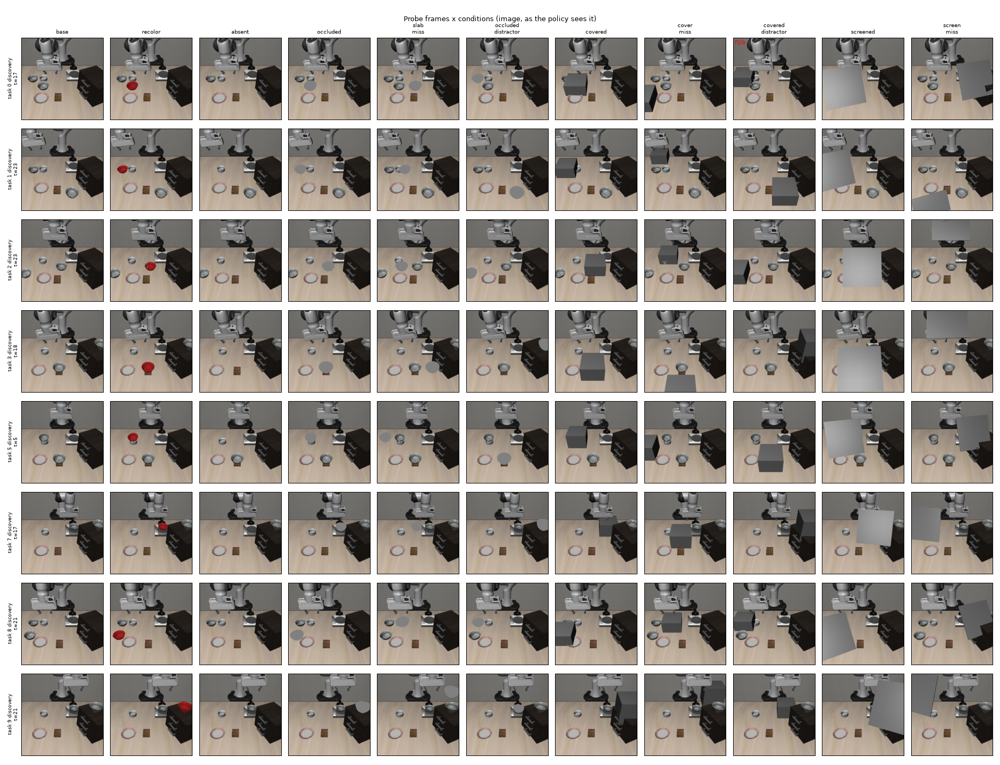

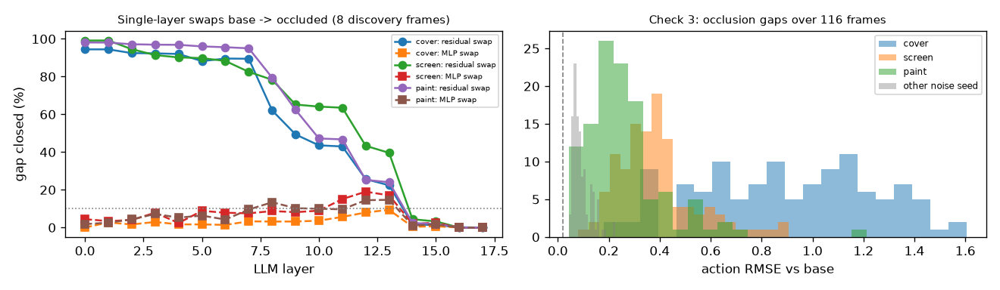

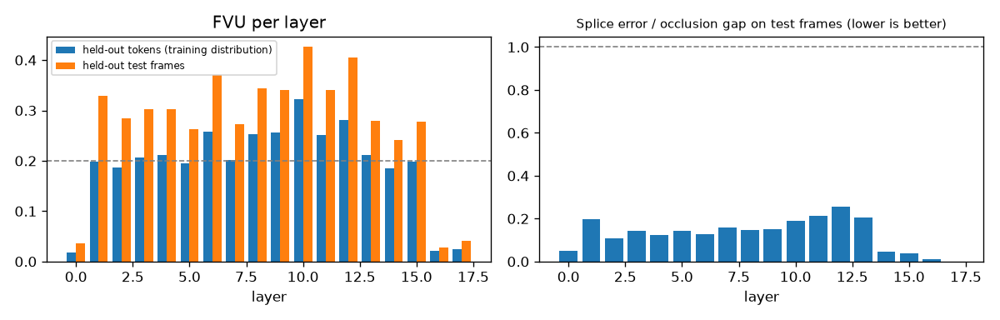

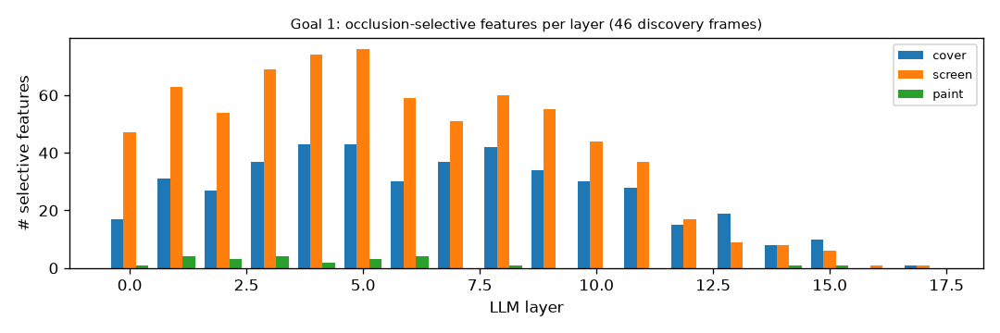

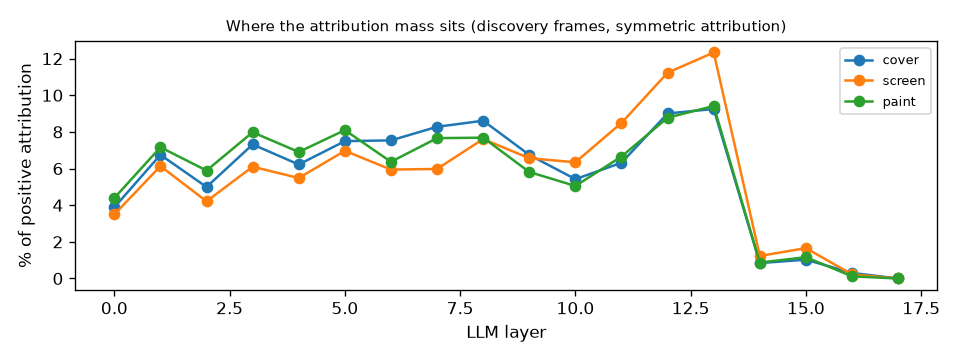

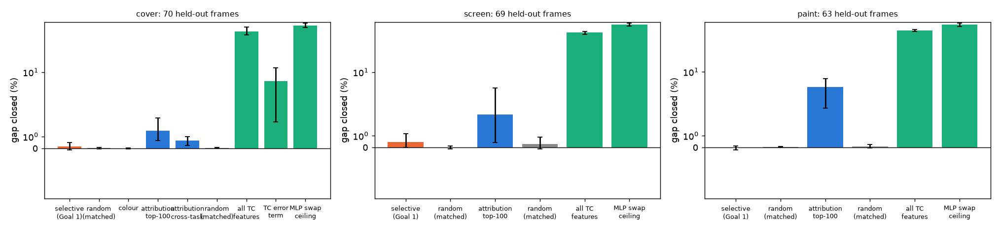

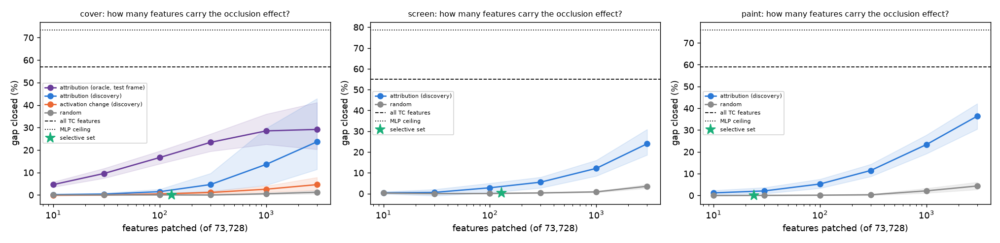

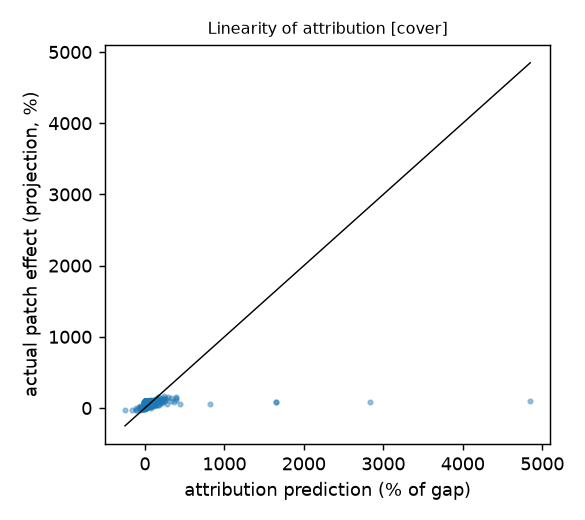

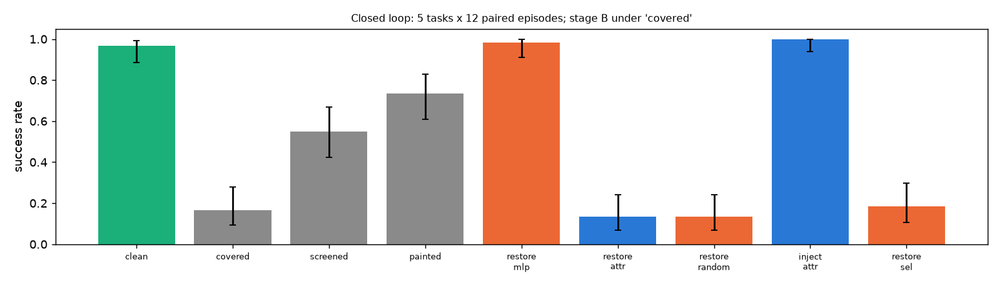

In [16]:
# @title Run the main study (π0.5, LIBERO-Spatial): frames → validate → capture → train → goal1 → attrib → goal2 → goal3

# Re-running this cell resumes: finished steps are skipped. To redo a step, put it in REDO (it and everything after it re-run).
REDO = ""  # @param {type:"string"}

import traceback

try:
    if "main" in RUNS:
        rc = run_chain("main", redo=REDO.replace(" ", ""))
        summary("main")
        out = RUNS["main"]["out"]
        show(out, "fig_probe_conditions_agentview.png", "fig_check4_ceiling.png", "fig_check5_transcoders.png", "fig_goal1_counts.png",
             "fig_attrib_layers.png", "fig_goal2_main.png", "fig_goal2_kcurve.png", "fig_goal2_linearity.png", "fig_goal3_success.png")
        if rc not in (0, 3):
            # no exception: "Run all" must still reach the report, the download and the shutdown cells
            print(f"\n!!! main run stopped with exit code {rc}; the log is above and in {out}/run_v3.log (also on Drive). "
                  "Everything finished so far is kept: re-run this cell to resume. The notebook continues with what exists.")
    else:
        print("RUN_MAIN is off")
except Exception:
    traceback.print_exc()
    print("!!! this cell hit an unexpected error (above); Run all continues to the report, save and shutdown cells")


########## rep_object: pi0.5 / LIBERO-Object ##########
$ /content/lerobot-venv/bin/python -u /content/groot-run/scripts/tc_occlusion_v3.py frames,validate,capture,train,goal1,attrib,goal2 --out /content/groot-run/outputs/permanence/tc_circuit_v3_rep_object --resume
[04:11:39] == frames | out=/content/groot-run/outputs/permanence/tc_circuit_v3_rep_object
  ROBOSUITE_DEFAULT_LOGGER.warn("No private macro file found!")
[info] using task orders [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
[04:11:49] task 0: target 'alphabet_soup_1' (via obj_of_interest) | distractor 'butter_1' (via nearest movable non-target object, 2 geoms) | other objects of interest ['basket_1'] | geoms target=22 | free_joints=1
[04:11:49] task 0: pick up the alphabet soup and place it in the basket
[04:11:55]   task0:demo:demo_0 (discovery): T=148 lift at t=50 -> probe frames (t, phase) [(18, 0.3), (28, 0.55), (39, 0.8)]
[04:12:01]   task0:demo:demo_1 (discovery): T=179 lift at t=86 -> probe frames (t, phase) [(28, 0.3), (48, 0.55

### rep_object: pi0.5 / LIBERO-Object

| item | result |
|---|---|
| checks 1-4 (clean edits, determinism, signal, ceiling) | PASS / PASS / PASS / PASS |
| batched patching bit-identical | PASS |
| rank layers | [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13] |
| check 5 transcoders (median FVU held-out / test frames) | PASS (0.18308206517738768 / 0.3343904310596878) |
| [cover] attribution 0.90% vs random 0.03% (H2-A FAIL); selective 0.20% vs random 0.07% (H2-S FAIL); MLP ceiling 74.1% | |
| [paint] attribution 2.40% vs random 0.15% (H2-A FAIL); selective -0.45% vs random 0.03% (H2-S FAIL); MLP ceiling 74.9% | |
| H3 selectivity/attribution dissociate | PASS |

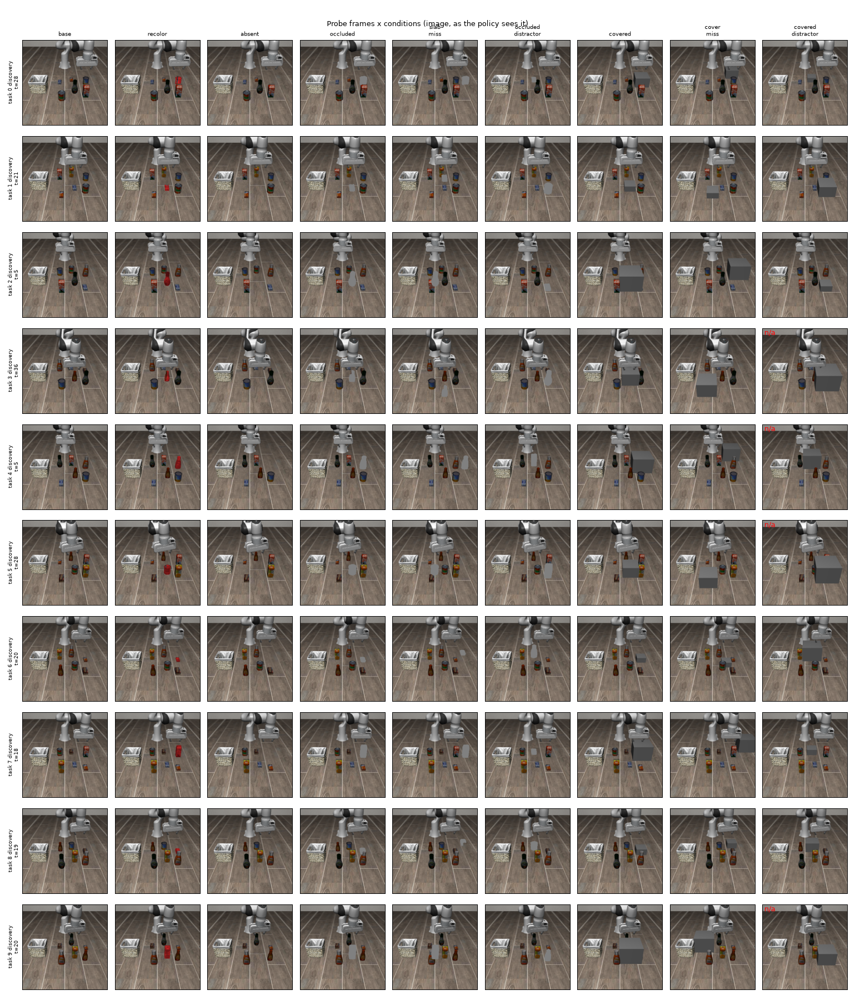

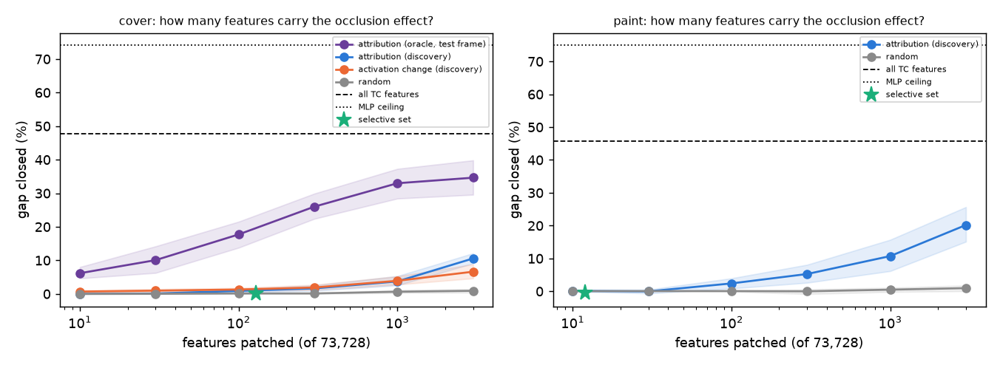


########## rep_pi0: pi0 / LIBERO-Spatial ##########
$ /content/lerobot-venv/bin/python -u /content/groot-run/scripts/tc_occlusion_v3.py frames,validate,capture,train,goal1,attrib,goal2 --out /content/groot-run/outputs/permanence/tc_circuit_v3_rep_pi0 --resume
[05:33:51] == frames | out=/content/groot-run/outputs/permanence/tc_circuit_v3_rep_pi0
  ROBOSUITE_DEFAULT_LOGGER.warn("No private macro file found!")
[info] using task orders [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
[05:34:01] task 0: target 'akita_black_bowl_1' (via obj_of_interest) | distractor 'akita_black_bowl_2' (via same object type, 41 geoms) | other objects of interest ['plate_1'] | geoms target=41 | free_joints=1
[05:34:01] task 0: pick up the black bowl between the plate and the ramekin and place it on the plate
[05:34:14]   task0:demo:demo_0 (discovery): T=98 lift at t=51 -> probe frames (t, phase) [(18, 0.3), (29, 0.55), (38, 0.8)]
[05:34:30]   task0:demo:demo_1 (discovery): T=84 lift at t=47 -> probe frames (t, phase) [(17, 0

### rep_pi0: pi0 / LIBERO-Spatial

| item | result |
|---|---|
| checks 1-4 (clean edits, determinism, signal, ceiling) | not run / not run / not run / not run |
| batched patching bit-identical | not run |
| rank layers | None |
| check 5 transcoders (median FVU held-out / test frames) | not run (None / None) |

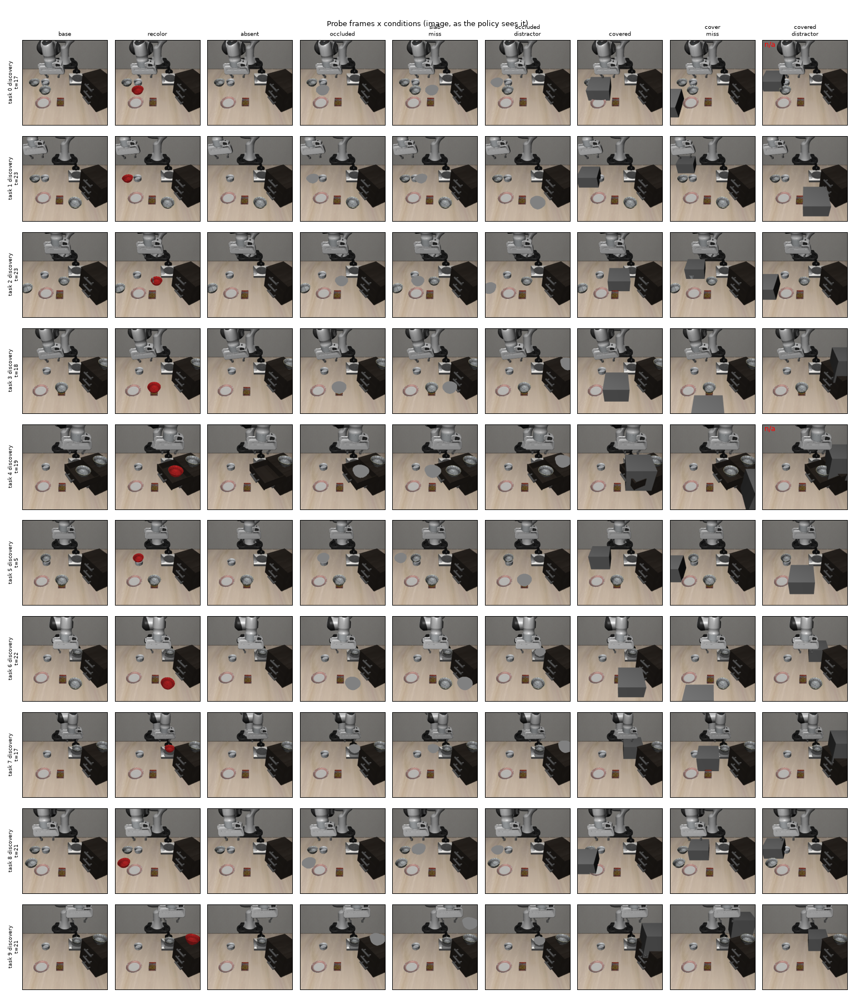

In [17]:
# @title Run the replications (π0.5 / LIBERO-Object, π0 / LIBERO-Spatial): same protocol, box + paint occluders, no closed loop

import traceback

try:
    failed = []
    for name in ("rep_object", "rep_pi0"):
        if name not in RUNS:
            continue
        rc = run_chain(name)
        summary(name)
        show(RUNS[name]["out"], "fig_probe_conditions_agentview.png", "fig_goal2_kcurve.png")
        if rc not in (0, 3):
            failed.append((name, rc))
    if failed:
        print(f"WARNING: replication(s) failed: {failed}. The report still builds from the runs that finished; "
              "re-run this cell to resume them.")
except Exception:
    traceback.print_exc()
    print("!!! this cell hit an unexpected error (above); Run all continues to the report, save and shutdown cells")

## Report and paper
Builds `RESULTS_v3.md` (every pre-specified test with CIs, the v1 vs v2 vs v3 table), paper figures and an ICLR-format draft `paper_v3/main.tex` (+ `main.pdf`) whose numbers, title and claims follow the outcomes of this run.

installing LaTeX to compile the paper ...
pdflatex: /usr/bin/pdflatex
rep_pi0: no Goal-2 results yet, left out of the report
$ /content/lerobot-venv/bin/python /content/groot-run/scripts/tc_v3_report.py --run main=/content/groot-run/outputs/permanence/tc_circuit_v3_main --run rep_object=/content/groot-run/outputs/permanence/tc_circuit_v3_rep_object --out /content/groot-run/outputs/permanence/tc_circuit_v3_report --compile


# v3 results: Occlusion Is Distributed in Vision-Language-Action Policies: Selective and Attributed Transcoder Features Fail Held-Out Causal Tests

Auto-generated by `tc_v3_report.py` from the run folders. Every number is also in `results_v3.json`.

Runs: **main** = pi0.5 / LIBERO-Spatial (`/content/groot-run/outputs/permanence/tc_circuit_v3_main`); **rep_object** = pi0.5 / LIBERO-Object (`/content/groot-run/outputs/permanence/tc_circuit_v3_rep_object`)

## 1. Pre-specified tests

| test | rule (fixed before the run) | pi0.5 / LIBERO-Spatial | pi0.5 / LIBERO-Object |
|---|---|---|---|
| H1 selective features replicate | Goal-1 rule on discovery frames, re-applied on test frames | 452 features; 84% replicate (110x base rate) | 457 features; 75% replicate (114x base rate) |
| **H2-A attribution set is causal** | top-100 attribution features beat norm-matched random by >= 10.0 pts, CI > 0 | FAIL (+1.5 [+0.6, +2.5] pts) | FAIL (+0.9 [+0.5, +1.3] pts) |
| H2-S selective set is causal | v2 rule: selective beats random and colour by >= 10.0 pts | FAIL (+0.1 [-0.1, +0.5] pts) | FAIL (+0.1 [-0.0, +0.2] pts) |
| H3 selectivity and causality dissociate | < 10% of A selective and rho(selectivity, attribution) < 0.2 | PASS (overlap 8, 8% of A selective, rho=-0.02) | PASS (overlap 0, 0% of A selective, rho=-0.02) |
| H4 closed loop | restoring A's clean values under the occluder raises success vs no restore and vs random (CIs > 0) | FAIL (drop measurable: PASS; restore -0.03 [-0.15, +0.05]) | not run |

## 2. Setup and validity

| | pi0.5 / LIBERO-Spatial | pi0.5 / LIBERO-Object |
|---|---|---|
| tasks / probe frames (discovery + test) / training frames | 10 / 116 (46 + 70) / 419 | 10 / 120 (60 + 60) / 299 |
| frame source | demo | demo |
| occluder families | cover, screen, paint | cover, paint |
| check 1 clean edits / 2 determinism / 3 signal / 4 ceiling / 5 transcoders | PASS / PASS / PASS / PASS / FAIL | PASS / PASS / PASS / PASS / PASS |
| batched patching bit-identical | PASS | PASS |
| best single-layer residual swap | 94.4% (L1) | 94.4% (L1) |
| rank layers (residual swap >= 10%) | [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13] | [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13] |
| transcoders | 4096 features, k=64, 396551 tokens/layer | 4096 features, k=64, 386859 tokens/layer |
| median FVU held-out tokens / test frames | 0.204 / 0.294 | 0.183 / 0.334 |
| box (rendered): median gap, frames >= min, target vs distractor | 0.911, 100%, 0.956 vs 0.161 | 0.666, 100%, 0.648 vs 0.069 |
| screen (rendered): median gap, frames >= min, target vs distractor | 0.366, 100%, n/a vs n/a | n/a |
| paint (v1/v2): median gap, frames >= min, target vs distractor | 0.229, 100%, 0.229 vs 0.063 | 0.189, 100%, 0.189 vs 0.053 |

## 3. Goal 1: occlusion-selective features (discovery frames)

| run | family | selective | target-specific | top layers |
|---|---|---|---|---|
| pi0.5 / LIBERO-Spatial | box (rendered) | 452 (0.613%) | 417 | [6, 5, 8] |
| pi0.5 / LIBERO-Spatial | screen (rendered) | 731 (0.991%) | 0 | [1, 2, 5] |
| pi0.5 / LIBERO-Spatial | paint (v1/v2) | 24 (0.033%) | 24 | [2, 4, 6] |
| pi0.5 / LIBERO-Object | box (rendered) | 457 (0.620%) | 439 | [0, 1, 3] |
| pi0.5 / LIBERO-Object | paint (v1/v2) | 12 (0.016%) | 9 | [1, 3, 5] |

## 4. Goal 2: held-out causal tests (pi0.5 / LIBERO-Spatial)

### box (rendered) (primary): 70 held-out frames, 8 tasks, median gap 0.905

| patched set (inject: base run + occluded values) | # features | gap closed % [95% CI] |
|---|---|---|
| attribution top-K (discovery) | 100 | 1.49 [0.65, 2.54] |
| random, matched to attribution set | 100 | 0.04 [-0.00, 0.07] |
| attribution top-K, other tasks only (cross-task) | 100 | 0.65 [0.27, 0.99] |
| selective set (Goal 1) | 129 | 0.16 [-0.11, 0.50] |
| random, matched to selective set | 129 | 0.04 [-0.01, 0.09] |
| selective set, other tasks only |  | 0.12 [-0.16, 0.42] |
| colour-selective control |  | 0.00 [-0.03, 0.04] |
| all transcoder features |  | 56.85 [49.40, 67.82] |
| transcoder error term only |  | 6.88 [2.21, 11.95] |
| all MLP outputs (ceiling) |  | 73.26 [67.46, 80.90] |
| remove: attribution set (occluded run + clean values) | | 12.52 [3.07, 22.29] |
| remove: random matched | | -0.27 [-0.73, 0.09] |
| remove: selective set | | 0.40 [-1.16, 1.83] |
| remove: all MLP outputs | | 82.71 [75.68, 87.89] |

- attribution - random: +1.45 [+0.64, +2.47] pts, p(tasks) = 0.0039, positive in 8/8 tasks; remove direction +12.79 [+3.35, +22.49]
- selective - random: +0.12 [-0.14, +0.45] pts, p(tasks) = 0.2891
- attribution - selective: +1.33 [+0.30, +2.53] pts; cross-task attribution - random: +0.62 [+0.25, +0.94] pts
- k-curve (features -> gap closed %): attr: 10: 0.2, 30: 0.4, 100: 1.5, 300: 4.6, 1000: 13.6, 3000: 23.7; oracle: 10: 4.6, 30: 9.6, 100: 16.7, 300: 23.4, 1000: 28.5, 3000: 29.2; magnitude: 10: -0.1, 30: 0.0, 100: 0.5, 300: 1.1, 1000: 2.6, 3000: 4.6; random: 10: 0.0, 30: 0.0, 100: 0.0, 300: 0.0, 1000: 0.6, 3000: 1.2
- attribution linearity: Pearson r = 0.28 (n = 2870), slope 0.06, median |error| 0.4 pts
- dissociation: A ∩ S = 8 of 100 / 452; 8% of A pass the selectivity rule; selective features sit at the 59th attribution percentile (median) and carry 3.07% of the positive attribution (A: 9.4%); Spearman(selectivity, attribution) = -0.02, (response magnitude, attribution) = 0.08
- held-out selectivity: 84% of the selective set pass again on test frames (random draws 0.6%, base rate 0.76%, attribution set 8.0%); Spearman discovery vs test response 0.82
- circularity [selective]: set - random = +0.22 pts on the discovery frames it was chosen on vs +0.12 pts on held-out frames
- circularity [attribution]: set - random = +5.17 pts on the discovery frames it was chosen on vs +1.45 pts on held-out frames
- v1-style frame choice [selective] (4 largest-gap test frames of task 0): 0.08% vs random -0.02% (ratio -4.1x) against all 70 frames: 0.16% vs 0.04% (ratio 3.9x)
- v1-style frame choice [attribution] (4 largest-gap test frames of task 0): 0.75% vs random -0.04% (ratio -20.4x) against all 70 frames: 1.49% vs 0.04% (ratio 41.9x)

### screen (rendered): 69 held-out frames, 8 tasks, median gap 0.367

| patched set (inject: base run + occluded values) | # features | gap closed % [95% CI] |
|---|---|---|
| attribution top-K (discovery) | 100 | 2.81 [0.44, 5.01] |
| random, matched to attribution set | 100 | 0.29 [-0.13, 0.88] |
| selective set (Goal 1) | 128 | 0.45 [0.00, 1.17] |
| random, matched to selective set | 128 | -0.00 [-0.13, 0.14] |
| all transcoder features |  | 55.10 [51.32, 58.39] |
| all MLP outputs (ceiling) |  | 78.54 [73.33, 83.07] |
| remove: attribution set (occluded run + clean values) | | 7.29 [4.65, 10.99] |
| remove: random matched | | 0.52 [0.07, 0.99] |
| remove: selective set | | 0.13 [-0.85, 1.02] |
| remove: all MLP outputs | | 82.18 [76.72, 87.23] |

- attribution - random: +2.52 [+0.18, +4.84] pts, p(tasks) = 0.0352, positive in 7/8 tasks; remove direction +6.77 [+4.19, +10.55]
- selective - random: +0.46 [+0.08, +1.06] pts, p(tasks) = 0.0156
- attribution - selective: +2.35 [+0.22, +4.11] pts; cross-task attribution - random: n/a pts
- k-curve (features -> gap closed %): attr: 10: 0.4, 30: 0.6, 100: 2.8, 300: 5.5, 1000: 12.1, 3000: 24.0; random: 10: 0.3, 30: 0.0, 100: 0.1, 300: 0.3, 1000: 0.9, 3000: 3.5
- attribution linearity: Pearson r = 0.74 (n = 1173), slope 0.97, median |error| 0.5 pts
- dissociation: A ∩ S = 0 of 100 / 731; 0% of A pass the selectivity rule; selective features sit at the 61th attribution percentile (median) and carry 1.84% of the positive attribution (A: 7.0%); Spearman(selectivity, attribution) = -0.03, (response magnitude, attribution) = 0.11
- held-out selectivity: 88% of the selective set pass again on test frames (random draws 0.5%, base rate 0.94%, attribution set 1.0%); Spearman discovery vs test response 0.78
- v1-style frame choice [selective] (4 largest-gap test frames of task 0): 0.04% vs random -0.68% (ratio -0.1x) against all 69 frames: 0.45% vs -0.00% (ratio -92.1x)
- v1-style frame choice [attribution] (4 largest-gap test frames of task 0): 5.15% vs random 0.03% (ratio 191.5x) against all 69 frames: 2.81% vs 0.29% (ratio 9.8x)

### paint (v1/v2): 63 held-out frames, 8 tasks, median gap 0.218

| patched set (inject: base run + occluded values) | # features | gap closed % [95% CI] |
|---|---|---|
| attribution top-K (discovery) | 100 | 5.25 [3.31, 7.47] |
| random, matched to attribution set | 100 | 0.12 [-0.02, 0.26] |
| selective set (Goal 1) | 24 | -0.01 [-0.21, 0.15] |
| random, matched to selective set | 24 | 0.05 [-0.00, 0.10] |
| all transcoder features |  | 59.02 [56.71, 61.20] |
| all MLP outputs (ceiling) |  | 75.80 [70.16, 81.02] |
| remove: attribution set (occluded run + clean values) | | 18.73 [11.48, 27.11] |
| remove: random matched | | 0.53 [0.11, 1.08] |
| remove: selective set | | 0.83 [0.22, 1.63] |
| remove: all MLP outputs | | 82.72 [80.05, 85.32] |

- attribution - random: +5.13 [+3.20, +7.34] pts, p(tasks) = 0.0039, positive in 8/8 tasks; remove direction +18.20 [+11.29, +26.04]
- selective - random: -0.06 [-0.26, +0.12] pts, p(tasks) = 0.7148
- attribution - selective: +5.26 [+3.19, +7.56] pts; cross-task attribution - random: n/a pts
- k-curve (features -> gap closed %): attr: 10: 1.2, 30: 2.1, 100: 5.2, 300: 11.5, 1000: 23.3, 3000: 36.4; random: 10: -0.0, 30: 0.0, 100: 0.1, 300: 0.3, 1000: 2.1, 3000: 4.3
- attribution linearity: Pearson r = 0.77 (n = 1071), slope 0.79, median |error| 0.5 pts
- dissociation: A ∩ S = 2 of 100 / 24; 2% of A pass the selectivity rule; selective features sit at the 79th attribution percentile (median) and carry 0.29% of the positive attribution (A: 11.0%); Spearman(selectivity, attribution) = -0.01, (response magnitude, attribution) = 0.13
- held-out selectivity: 71% of the selective set pass again on test frames (random draws 0.0%, base rate 0.04%, attribution set 1.0%); Spearman discovery vs test response 0.76
- circularity [selective]: set - random = -0.17 pts on the discovery frames it was chosen on vs -0.06 pts on held-out frames
- circularity [attribution]: set - random = +6.22 pts on the discovery frames it was chosen on vs +5.13 pts on held-out frames
- v1-style frame choice [selective] (4 largest-gap test frames of task 0): 0.52% vs random 0.06% (ratio 9.2x) against all 63 frames: -0.01% vs 0.05% (ratio -0.3x)
- v1-style frame choice [attribution] (4 largest-gap test frames of task 0): 4.56% vs random 0.10% (ratio 43.6x) against all 63 frames: 5.25% vs 0.12% (ratio 45.4x)

## 5. Closed loop

5 tasks ([0, 2, 6, 7, 9]) x 12 paired episodes per condition (same initial states and noise seeds across conditions). Restores run under **covered** (box (rendered)).

| condition | success [Wilson 95%] | distractor picked up | mean steps |
|---|---|---|---|
| clean | 97% [89, 99] (n=60) | 0% | 109 |
| covered | 17% [9, 28] (n=60) | 12% | 255 |
| screened | 55% [42, 67] (n=60) | 0% | 193 |
| painted | 73% [61, 83] (n=60) | 8% | 157 |
| restore_mlp | 98% [91, 100] (n=60) | 0% | 108 |
| restore_attr | 13% [7, 24] (n=60) | 10% | 262 |
| restore_random | 13% [7, 24] (n=60) | 12% | 260 |
| inject_attr | 100% [94, 100] (n=60) | 0% | 105 |
| restore_sel | 18% [11, 30] (n=60) | 12% | 254 |

| paired comparison | diff in success [task-clustered 95% CI] | McNemar p |
|---|---|---|
| clean_minus_covered | +0.800 [+0.600, +0.967] | 0.0000 |
| clean_minus_screened | +0.417 [+0.167, +0.667] | 0.0000 |
| clean_minus_painted | +0.233 [+0.050, +0.550] | 0.0013 |
| restore_mlp_minus_covered | +0.817 [+0.683, +0.933] | 0.0000 |
| restore_attr_minus_covered | -0.033 [-0.150, +0.050] | 0.7905 |
| restore_random_minus_covered | -0.033 [-0.117, +0.033] | 0.7266 |
| restore_sel_minus_covered | +0.017 [+0.000, +0.050] | 1.0000 |
| restore_attr_minus_restore_random | +0.000 [-0.117, +0.133] | 1.0000 |
| restore_attr_minus_restore_sel | -0.050 [-0.150, +0.033] | 0.5811 |
| clean_minus_inject_attr | -0.033 [-0.100, +0.000] | 0.5000 |
| recovery fraction restore_mlp | 1.02 [0.95, 1.16] | |
| recovery fraction restore_attr | -0.04 [-0.24, 0.06] | |
| recovery fraction restore_random | -0.04 [-0.15, 0.04] | |
| recovery fraction restore_sel | 0.02 [0.00, 0.06] | |

## 6. Replications (primary occluder, held-out frames)

| run | attribution | random (matched) | selective | random (matched) | all TC | MLP ceiling | H2-A | H2-S |
|---|---|---|---|---|---|---|---|---|
| pi0.5 / LIBERO-Spatial | 1.49 [0.65, 2.54] | 0.04 [-0.00, 0.07] | 0.16 [-0.11, 0.50] | 0.04 [-0.01, 0.09] | 56.8 [49.4, 67.8] | 73.3 [67.5, 80.9] | FAIL | FAIL |
| pi0.5 / LIBERO-Object | 0.90 [0.46, 1.41] | 0.03 [-0.02, 0.09] | 0.20 [0.04, 0.38] | 0.07 [0.01, 0.15] | 47.7 [43.9, 51.8] | 74.1 [69.8, 78.7] | FAIL | FAIL |

## 7. v1 vs v2 vs v3

| | v1 | v2 | v3 (this run) |
|---|---|---|---|
| tasks | 1 | 10 | 10 (+ replications: pi0.5 / LIBERO-Object) |
| probe frames | 4 (selected by effect size) | 60 (20 discovery + 40 test, fixed phases) | 116 (46 discovery + 70 test), fixed phases |
| occluders | paint | paint | box, screen (rendered in the simulator) + paint |
| transcoders | 512 features, k=16 | 2,048 features, k=32 | 4096 features, k=64 |
| median FVU held-out / test frames | 0.174 / n/a | 0.185 / 0.4 | 0.204 / 0.294 |
| feature selection | selectivity, in-sample | selectivity, held-out test | selectivity AND gradient attribution, held-out test |
| selective set, paint (gap closed %) | 3.92 | 0.27 [-0.32, 0.92] | -0.01 [-0.21, 0.15] |
| random matched, paint | 0.56 | 0.05 | 0.05 [-0.00, 0.10] |
| selective set, primary occluder | n/a | n/a | 0.16 [-0.11, 0.50] |
| attribution set, primary occluder | n/a | n/a | 1.49 [0.65, 2.54] (random 0.04 [-0.00, 0.07]) |
| all TC features / MLP ceiling (primary) | 40.1 / 65.5 | 42.8 / 76.6 | 56.8 / 73.3 |
| closed loop | not run | clean 0.9, painted 0.9 (task 0, n=10) | 5 tasks x 12 eps; clean 97%, covered 17%, screened 55%, painted 73% |
| verdict | selective; 6.9x random (suggestive) | selective and partly replicable; causally negligible | H2-A FAIL, H2-S FAIL, H3 PASS, H4 FAIL |

## 8. Limitations to state in the paper

- The rendered occluders are render-only (no physics); they follow the target, so their position still reveals where the target is.
- Attribution is first-order (gradient at the clean run); its linearity is measured above, not assumed.
- Transcoders are trained per layer on a finite token sample; the error term's share of the effect is reported.
- Ten tasks per suite are the unit of replication for CIs; replications add a second suite and a second policy, not new robots.

## 9. Figures

- `figures/fig_families.png`
- `figures/fig_kcurves.png`
- `figures/fig_dissociation.png`
- `figures/fig_linearity.png`
- `figures/fig_closed_loop.png`
- `figures/fig_layers.png`
- `figures/fig_insample.png`
- `figures/fig_replication.png`
- `figures/fig_probe_conditions_agentview.png`
- `figures/fig_probe_conditions_wrist.png`


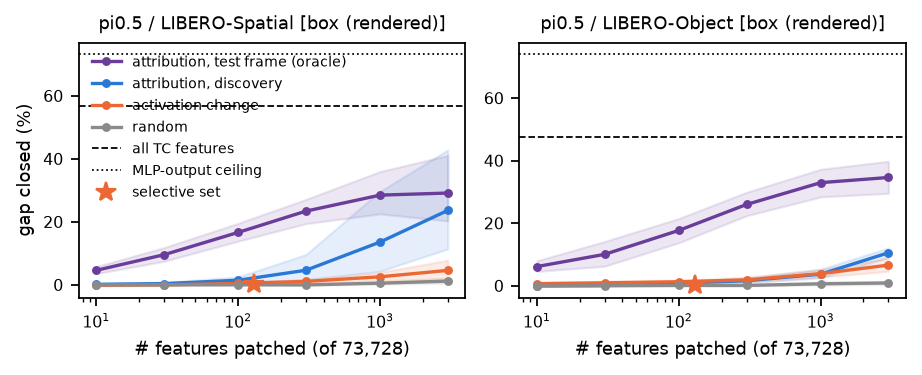

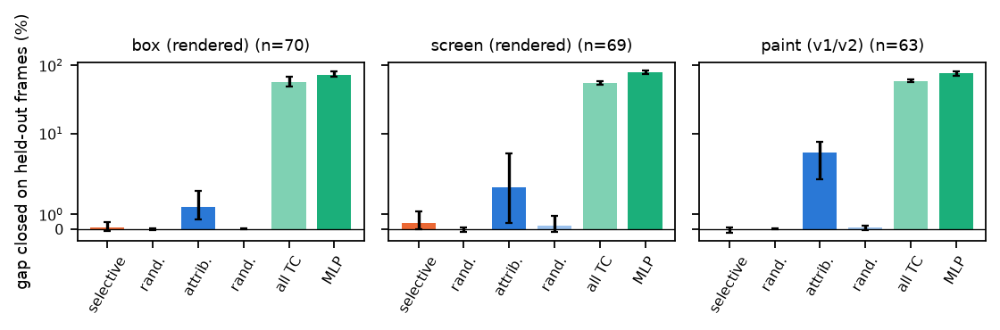

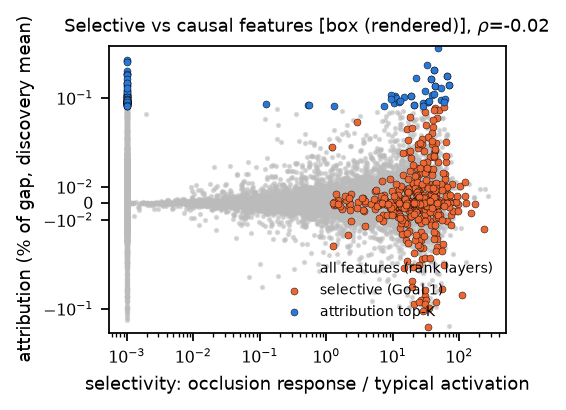

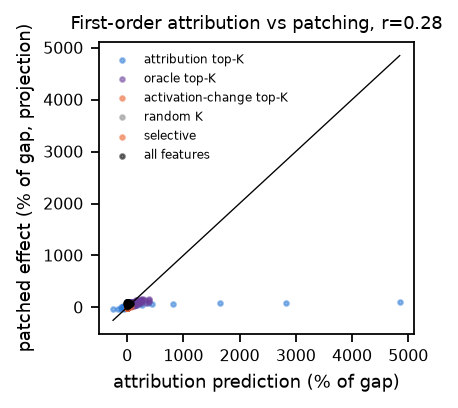

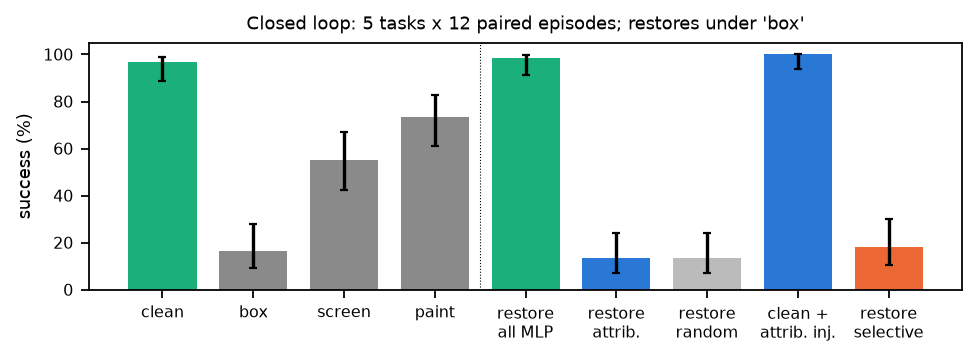

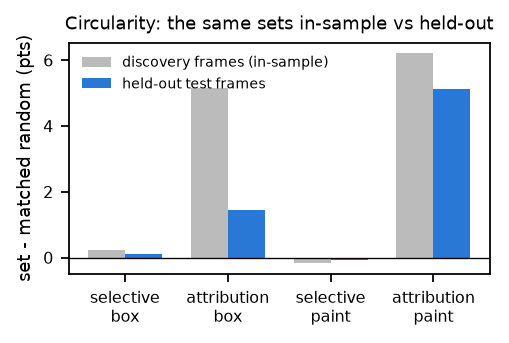

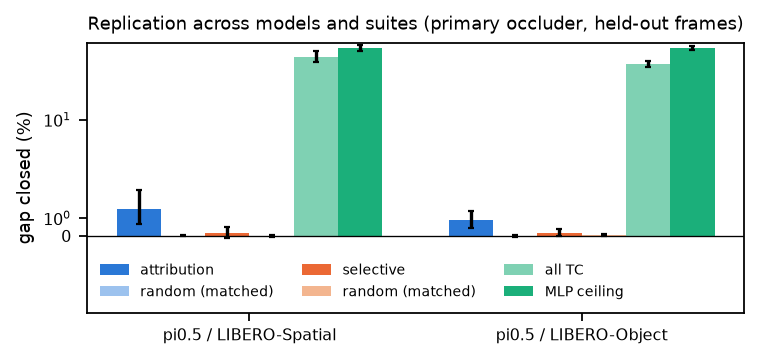

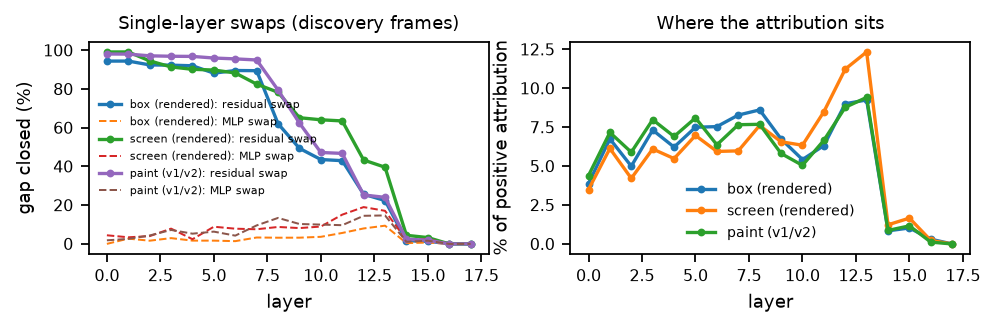

paper: /content/groot-run/outputs/permanence/tc_circuit_v3_report/paper_v3/main.pdf | Drive copy: /content/drive/MyDrive/smaj_v3_workspace/outputs/permanence/tc_circuit_v3_report


In [18]:
# @title Build the report and the paper draft (RESULTS_v3.md, figures, paper_v3/main.tex + main.pdf)

import os
import shutil
import subprocess
from pathlib import Path

from IPython.display import Image, Markdown, display

COMPILE_PDF = True  # @param {type:"boolean"}

if COMPILE_PDF and not shutil.which("pdflatex"):
    # LaTeX is only needed to compile paper_v3/main.pdf (about 3-5 min to install). If it fails, main.tex is still written.
    print("installing LaTeX to compile the paper ...", flush=True)
    try:
        apt_env = {**os.environ, "DEBIAN_FRONTEND": "noninteractive"}
        subprocess.run(["apt-get", "update", "-qq"], env=apt_env, check=False)
        subprocess.run(["apt-get", "install", "-y", "-qq", "--no-install-recommends", "texlive-latex-base", "texlive-latex-recommended",
                        "texlive-latex-extra", "texlive-fonts-recommended", "latexmk"], env=apt_env, check=False,
                       stdout=subprocess.DEVNULL)
    except Exception as exc:
        print(f"LaTeX install failed ({type(exc).__name__}: {exc})")
    print("pdflatex:", shutil.which("pdflatex") or "not available")

run_args = []
for name, cfg in RUNS.items():
    if (Path(cfg["out"]) / "goal2_stats.json").exists():
        run_args += ["--run", f"{name}={cfg['out']}"]
    else:
        print(f"{name}: no Goal-2 results yet, left out of the report")
report_ok = False
if not run_args:
    print("no finished run to report yet (the main study has not reached Goal 2); skipping the report")
try:
    if not run_args:
        raise RuntimeError("nothing to report")
    cmd = [str(PYTHON), str(REPORT_SCRIPT), *run_args, "--out", str(REPORT_OUT)]
    if COMPILE_PDF and shutil.which("pdflatex"):
        cmd.append("--compile")
    elif COMPILE_PDF:
        print("pdflatex is not available: paper_v3/ will contain main.tex (compile it on Overleaf), no PDF")
    print("$", " ".join(cmd), flush=True)
    subprocess.run(cmd, check=True, env={**os.environ, "MPLBACKEND": "Agg"})
    try:
        subprocess.run(["rsync", "-a", f"{REPORT_OUT}/", f"{DRIVE_REPORT}/"], check=True)
    except Exception:
        shutil.copytree(REPORT_OUT, DRIVE_REPORT, dirs_exist_ok=True)
    display(Markdown((REPORT_OUT / "RESULTS_v3.md").read_text()))
    for n in ("fig_kcurves", "fig_families", "fig_dissociation", "fig_linearity", "fig_closed_loop", "fig_insample", "fig_replication", "fig_layers"):
        p = REPORT_OUT / "figures" / f"{n}.png"
        if p.exists():
            display(Image(filename=str(p), width=900))
    pdf = REPORT_OUT / "paper_v3" / "main.pdf"
    print("paper:", pdf if pdf.exists() else REPORT_OUT / "paper_v3" / "main.tex", "| Drive copy:", DRIVE_REPORT)
    report_ok = True
except Exception as exc:
    import traceback

    if run_args:
        traceback.print_exc()
    print(f"report not built ({type(exc).__name__}: {exc}); the notebook continues to the download cell")

## Save, download, shut down
Saves everything to Drive, downloads it to this computer (results zip + model/cache parts; Chrome may ask once to allow multiple downloads) and then shuts the runtime down so the GPU is released.

In [ ]:
# @title Save everything to Drive, download everything to this computer, then shut the runtime down

# What you get on this computer (Chrome may ask once to "allow multiple downloads" from colab: click Allow):
#   tc_circuit_v3_<time>_results.zip                   every result, the report, the paper (tex + pdf), scripts, this
#                                                      notebook WITH its outputs, logs, videos, environment, MANIFEST.tsv
#   tc_circuit_v3_<time>_models_and_caches_partNofM.zip transcoder weights, rendered probe frames, attribution arrays
# The same files are on Drive (DRIVE_OUTPUTS/permanence/...; see MANIFEST.tsv), whether or not the browser download works.
DOWNLOAD_TO_THIS_COMPUTER = True  # @param {type:"boolean"}
INCLUDE_MODELS_AND_CACHES = True  # @param {type:"boolean"}
PART_SIZE_GB = 1.0  # @param {type:"number"}
SHUTDOWN_WHEN_DONE = True  # @param {type:"boolean"}

import json
import time
import traceback
from pathlib import Path

shutdown = bool(SHUTDOWN_WHEN_DONE and globals().get("AUTO_SHUTDOWN_WHEN_DONE", True) and "shutdown_runtime" in globals())
if SHUTDOWN_WHEN_DONE and "shutdown_runtime" not in globals():
    print("the auto-shutdown cell was not run, so this cell cannot shut the runtime down: use Runtime -> Disconnect and delete runtime")
handed_off = False
try:
    _WD["managed"] = True  # this cell now owns the shutdown; the idle watchdog stands down
except NameError:
    pass
try:
    connected = browser_connected() if DOWNLOAD_TO_THIS_COMPUTER else False
    results_zip, heavy_zips = save_everything(to_browser=connected, include_heavy=bool(INCLUDE_MODELS_AND_CACHES and connected),
                                              part_gb=float(PART_SIZE_GB))
    files = [results_zip] + list(heavy_zips)
    if DOWNLOAD_TO_THIS_COMPUTER and connected:
        total_gb = sum(Path(f).stat().st_size for f in files) / 2 ** 30
        print(f"\nDownloading {len(files)} file(s), {total_gb:.2f} GB, to this computer. The transfer starts when this cell finishes "
              f"(progress bars appear below).")

        def on_finish(summary):
            ok = all(x["complete"] for x in summary)
            log = {"time": time.strftime("%Y-%m-%d %H:%M:%S"), "all_complete": ok, "files": summary}
            try:
                (Path(DRIVE_V3) / "bundles" / f"{Path(results_zip).stem}_download_log.json").write_text(json.dumps(log, indent=2))
            except Exception:
                pass
            print(f"\n[download] {'all files saved to this computer' if ok else 'some downloads did not finish'}: "
                  + ", ".join(f"{x['file']} {'OK' if x['complete'] else 'INCOMPLETE'}" for x in summary)
                  + ". Everything is also on Drive.", flush=True)
            if shutdown:
                shutdown_runtime("results saved to Drive and downloaded" + ("" if ok else " (partly: see the download log on Drive)"))

        state = start_browser_downloads(files)
        watch_downloads_then(state, on_finish)
        handed_off = True
        print("The runtime will shut itself down after the last file is saved." if shutdown else "SHUTDOWN_WHEN_DONE is off.")
    elif DOWNLOAD_TO_THIS_COMPUTER:
        print("\nNo browser tab is attached, so nothing can be downloaded to a computer right now. Everything is on Drive: "
              f"{Path(DRIVE_V3)} (bundles/ holds the results zip and MANIFEST.tsv).")
except Exception:
    traceback.print_exc()
    print("\nSaving/downloading failed (traceback above). The per-step Drive mirrors of every run are still complete.")
finally:
    if shutdown and not handed_off:
        shutdown_runtime("results saved to Drive")